# Installing required libraries

In [1]:
# Installing required libraries
!pip install seaborn
!pip install imbalanced-learn
!pip install xgboost
!pip install scikit-learn
!pip install shap
!pip install lightgbm
!pip install optuna



  Using cached imbalanced_learn-0.12.3-py3-none-any.whl.metadata (8.3 kB)
Using cached imbalanced_learn-0.12.3-py3-none-any.whl (258 kB)
  Using cached xgboost-2.1.1-py3-none-manylinux_2_28_x86_64.whl.metadata (2.1 kB)
Using cached xgboost-2.1.1-py3-none-manylinux_2_28_x86_64.whl (153.9 MB)
  Using cached shap-0.46.0-cp311-cp311-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (24 kB)
  Using cached slicer-0.0.8-py3-none-any.whl.metadata (4.0 kB)
  Using cached numba-0.60.0-cp311-cp311-manylinux2014_x86_64.manylinux_2_17_x86_64.whl.metadata (2.7 kB)
  Using cached cloudpickle-3.0.0-py3-none-any.whl.metadata (7.0 kB)
  Using cached llvmlite-0.43.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.8 kB)
Using cached shap-0.46.0-cp311-cp311-manylinux_2_12_x86_64.manylinux2010_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (540 kB)
Using cached slicer-0.0.8-py3-none-any.whl (15 kB)
Using cached cloudpickle-3.0.0-

# Importing libraries and packages

In [2]:
# Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

sns.set_style('darkgrid')
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 2000)
pd.set_option('display.expand_frame_repr', False)

In [3]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import metrics,model_selection
from sklearn.preprocessing import scale

import joblib
import sys

# Loading of Dataset

## Loading and inspecting the first dataset

In [4]:
dataset_1 = pd.read_csv("syn_data_917_5000.csv")
dataset_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  5000 non-null   int64  
 1   sex                  5000 non-null   int64  
 2   chest_pain_type      5000 non-null   int64  
 3   resting_bp           5000 non-null   float64
 4   cholesterol          5000 non-null   float64
 5   fasting_blood_sugar  5000 non-null   int64  
 6   resting_ecg          5000 non-null   int64  
 7   max_heart_rate       5000 non-null   float64
 8   exercise_angina      5000 non-null   int64  
 9   oldpeak              5000 non-null   float64
 10  ST_slope             5000 non-null   int64  
 11  target               5000 non-null   int64  
dtypes: float64(4), int64(8)
memory usage: 468.9 KB


## Loading and inspecting the second dataset

In [5]:
dataset_2 = pd.read_csv("3235_kaggle_dataset.csv")
dataset_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3235 entries, 0 to 3234
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       3235 non-null   int64  
 1   sex       3235 non-null   int64  
 2   cp        3235 non-null   int64  
 3   trestbps  3235 non-null   int64  
 4   chol      3235 non-null   int64  
 5   fbs       3235 non-null   int64  
 6   restecg   3235 non-null   int64  
 7   thalach   3235 non-null   int64  
 8   exang     3187 non-null   float64
 9   oldpeak   3235 non-null   float64
 10  slope     3235 non-null   int64  
 11  target    3235 non-null   int64  
dtypes: float64(2), int64(10)
memory usage: 303.4 KB


## Displaying the first few rows of the first dataset

In [6]:
dataset_1.head()

,age,sex,chest_pain_type,resting_bp,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_angina,oldpeak,ST_slope,target
0,65,1,4,120.0,237.0,1,0,89.0,1,-1.5,3,1
1,31,1,3,120.0,222.0,0,0,187.0,0,0.0,1,0
2,53,1,2,132.0,227.0,0,1,141.0,0,0.2,1,0
3,64,1,1,157.0,236.0,1,2,164.0,0,0.3,1,0
4,67,1,4,140.0,167.0,1,1,126.0,1,0.0,2,1


## Displaying the first few rows of the second dataset

In [7]:
dataset_2.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,target
0,40,1,2,140,289,0,0,172,0.0,0.0,1,0
1,49,0,3,160,180,0,0,156,0.0,1.0,2,1
2,37,1,2,130,283,0,1,98,0.0,0.0,1,0
3,48,0,4,138,214,0,0,108,1.0,1.5,2,1
4,54,1,3,150,195,0,0,122,0.0,0.0,1,0


In [8]:
# # Load the datasets
# dataset_1 = pd.read_csv("1190_ieee_heart_statlog_cleveland_hungary_final.csv")
# dataset_2 = pd.read_csv("3235_kaggle_dataset.csv")


# # # Fill missing values in dataset_2 if necessary
# # dataset_2["exercise_angina"].fillna(0, inplace=True)  # Assuming 0 is an appropriate fill value



## Displaying dataset information

In [9]:
dataset_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  5000 non-null   int64  
 1   sex                  5000 non-null   int64  
 2   chest_pain_type      5000 non-null   int64  
 3   resting_bp           5000 non-null   float64
 4   cholesterol          5000 non-null   float64
 5   fasting_blood_sugar  5000 non-null   int64  
 6   resting_ecg          5000 non-null   int64  
 7   max_heart_rate       5000 non-null   float64
 8   exercise_angina      5000 non-null   int64  
 9   oldpeak              5000 non-null   float64
 10  ST_slope             5000 non-null   int64  
 11  target               5000 non-null   int64  
dtypes: float64(4), int64(8)
memory usage: 468.9 KB


## Renaming the columns

In [10]:
# Rename columns in dataset_2 to match dataset_1
dataset_2.rename(columns={
    "cp": "chest_pain_type",
    "trestbps": "resting_bp",
    "chol": "cholesterol",
    "fbs": "fasting_blood_sugar",
    "restecg": "resting_ecg",
    "thalach": "max_heart_rate",
    "exang": "exercise_angina",
    "slope": "ST_slope"
}, inplace=True)

# Standardize column names in dataset_1 to use underscores and match dataset_2
dataset_1.rename(columns={
    "age": "age",
    "sex": "sex",
    "chest pain type": "chest_pain_type",
    "resting bp s": "resting_bp",
    "cholesterol": "cholesterol",
    "fasting blood sugar": "fasting_blood_sugar",
    "resting ecg": "resting_ecg",
    "max heart rate": "max_heart_rate",
    "exercise angina": "exercise_angina",
    "oldpeak": "oldpeak",
    "ST slope": "ST_slope",
    "target": "target"
}, inplace=True)

In [11]:
# # Combine the datasets
# df = pd.concat([dataset_1, dataset_2], ignore_index=True)

## Finalising the dataset for further analysis and modelling

In [12]:
# Combine the datasets
df = dataset_1.copy()

In [13]:
# Verify the combined dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  5000 non-null   int64  
 1   sex                  5000 non-null   int64  
 2   chest_pain_type      5000 non-null   int64  
 3   resting_bp           5000 non-null   float64
 4   cholesterol          5000 non-null   float64
 5   fasting_blood_sugar  5000 non-null   int64  
 6   resting_ecg          5000 non-null   int64  
 7   max_heart_rate       5000 non-null   float64
 8   exercise_angina      5000 non-null   int64  
 9   oldpeak              5000 non-null   float64
 10  ST_slope             5000 non-null   int64  
 11  target               5000 non-null   int64  
dtypes: float64(4), int64(8)
memory usage: 468.9 KB


In [14]:
df.shape

(5000, 12)

In [15]:
df.sample(20)

,age,sex,chest_pain_type,resting_bp,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_angina,oldpeak,ST_slope,target
4406,52,1,2,160.0,224.0,0,0,154.0,0,0.0,1,0
4133,42,1,2,150.0,237.0,0,0,150.0,0,0.0,1,0
3415,37,1,2,130.0,145.0,0,0,150.0,0,0.0,1,0
580,54,1,4,124.0,280.0,1,2,121.0,1,2.0,2,1
4949,63,1,3,126.0,220.0,0,1,86.0,0,0.0,2,1
459,58,1,4,124.0,232.0,0,2,133.0,1,1.8,2,1
4901,58,1,4,140.0,237.0,0,1,110.0,1,0.0,1,1
476,65,1,4,150.0,346.5,1,1,93.0,1,1.5,2,1
987,30,1,4,110.0,282.0,0,0,152.0,0,0.0,1,0
1288,56,0,4,150.0,177.0,1,0,140.0,0,0.0,1,0


# Exploratory Data Analysis

In [16]:
# descriptive summary of the numeric features

df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,5000.0,54.009600,8.800534,28.0,48.0,55.0,60.0,77.00
sex,5000.0,0.829600,0.376021,0.0,1.0,1.0,1.0,1.00
chest_pain_type,5000.0,3.322000,0.888411,1.0,3.0,4.0,4.0,4.00
resting_bp,5000.0,131.803400,16.842312,90.0,120.0,130.0,140.0,170.00
cholesterol,5000.0,242.561030,42.898620,134.5,219.0,237.0,266.0,346.50
fasting_blood_sugar,5000.0,0.243800,0.429416,0.0,0.0,0.0,0.0,1.00
resting_ecg,5000.0,0.559600,0.782413,0.0,0.0,0.0,1.0,2.00
max_heart_rate,5000.0,135.863800,24.176636,66.0,120.0,135.0,153.0,198.00
exercise_angina,5000.0,0.416600,0.493045,0.0,0.0,0.0,1.0,1.00
oldpeak,5000.0,0.788465,1.013471,-2.0,0.0,0.3,1.5,3.75


Here's a similar inference based on the descriptive summary of your heart disease dataset:

### Descriptive Summary
```
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4425 entries, 0 to 4424
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age                 4425 non-null   float64
 1   sex                 4425 non-null   float64
 2   chest_pain_type     4425 non-null   float64
 3   resting_bp          4425 non-null   float64
 4   cholesterol         4425 non-null   float64
 5   fasting_blood_sugar 4425 non-null   float64
 6   resting_ecg         4425 non-null   float64
 7   max_heart_rate      4425 non-null   float64
 8   exercise_angina     4377 non-null   float64
 9   oldpeak             4425 non-null   float64
 10  ST_slope            4425 non-null   float64
 11  target              4425 non-null   float64
dtypes: float64(12)
memory usage: 415.0 KB
```

### Inference

- The dataset consists of 4425 entries and 12 features, all of which are of the `float64` data type.
- The average age of patients in the dataset is approximately 54 years, with ages ranging from 28 to 77 years. 
- About 74% of the patients are male, as indicated by the mean value of 0.736 for the `sex` feature.
- Chest pain type has a mean value of approximately 2.79, indicating that most patients experienced atypical angina or non-anginal pain, with values ranging from 0 (typical angina) to 4 (asymptomatic).
- The average resting blood pressure is 132 mm Hg, with a wide range from 0 to 200 mm Hg, suggesting possible outliers or recording errors.
- The mean cholesterol level is 224.45 mg/dL, with values ranging from 0 to 603 mg/dL. This again suggests some possible data quality issues that might need further investigation.
- The fasting blood sugar feature has a mean value of 0.184, indicating that around 18% of the patients have fasting blood sugar levels greater than 120 mg/dL.
- The resting ECG results show a mean of 0.67, with most values at 0 (normal) but some abnormalities present, as indicated by values up to 2.
- The average maximum heart rate achieved during exercise is 143 bpm, with a range from 60 to 202 bpm.
- Exercise-induced angina is present in about 38% of the patients, as indicated by the mean value of 0.384.
- The `oldpeak` feature, which measures ST depression induced by exercise, has a mean value of 1.497, with values ranging from -2.6 to 62. This suggests some data might be outliers or need further validation.
- The slope of the peak exercise ST segment (`ST_slope`) has an average value of 1.796, with most values indicating a flat or downsloping ST segment, which can be indicative of ischemia.
- The target variable, indicating the presence of heart disease, has a mean value of approximately 0.528, suggesting that about 53% of the patients in the dataset have heart disease.

### Key Insights

- **Age Distribution**: The patient age distribution is centered around middle age, which is a critical period for heart disease risk.
- **Gender Distribution**: There is a higher prevalence of males in the dataset, which could impact the overall analysis and results.
- **Chest Pain**: The chest pain types suggest a significant number of patients experience non-typical symptoms, highlighting the need for comprehensive diagnostic approaches.
- **Blood Pressure and Cholesterol**: Both resting blood pressure and cholesterol levels exhibit wide ranges, with some extreme values that may require closer examination for accuracy.
- **Fasting Blood Sugar**: Elevated fasting blood sugar levels in 18% of the patients indicate a significant proportion might be at risk for diabetes, which is a known risk factor for heart disease.
- **Exercise Response**: The variability in maximum heart rate and the presence of exercise-induced angina emphasize the importance of exercise testing in this patient population.
- **ST Segment Analysis**: The `oldpeak` and `ST_slope` features suggest that a notable number of patients exhibit signs of ischemia during stress testing.
- **Heart Disease Prevalence**: With over half of the patients diagnosed with heart disease, this dataset provides a valuable resource for studying the factors associated with heart disease risk.


In [17]:
# Checking for unique values in each column
print("Unqiue values per column:")
df.nunique()

Unqiue values per column:


age                     50
sex                      2
chest_pain_type          4
resting_bp              68
cholesterol            204
fasting_blood_sugar      2
resting_ecg              3
max_heart_rate         124
exercise_angina          2
oldpeak                 53
ST_slope                 3
target                   2
dtype: int64

In [18]:
df.target.value_counts(normalize=True)

target
1    0.5694
0    0.4306
Name: proportion, dtype: float64

In [19]:
# check for duplicate columns

print("Number of duplicate rows:", df.duplicated().sum())
df[df.duplicated()]

Number of duplicate rows: 2


,age,sex,chest_pain_type,resting_bp,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_angina,oldpeak,ST_slope,target
3170,51,1,2,120.0,265.0,0,0,150.0,0,0.0,1,0
4566,50,1,3,140.0,222.0,0,0,169.0,0,0.0,1,0


## Removing duplicate rows

In [20]:
# Checking the distribution of the target value among the duplicate rows
print('Percentage % Distribution of target variable among the duplicated records')
df[df.duplicated()]['target'].value_counts(normalize=True)*100

Percentage % Distribution of target variable among the duplicated records


target
0    100.0
Name: proportion, dtype: float64

In [21]:
print('Before removing the duplicate rows',df.shape)
df.drop_duplicates(inplace=True) 
print('After removing the duplicate rows',df.shape)

Before removing the duplicate rows (5000, 12)
After removing the duplicate rows (4998, 12)


In [22]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))

Number of duplicate rows = 0


## Checking null values

In [23]:
# checking null values

df.isnull().sum()

age                    0
sex                    0
chest_pain_type        0
resting_bp             0
cholesterol            0
fasting_blood_sugar    0
resting_ecg            0
max_heart_rate         0
exercise_angina        0
oldpeak                0
ST_slope               0
target                 0
dtype: int64

In [24]:
# Fill missing values in exercise_angina with the mode
df["exercise_angina"].fillna(df["exercise_angina"].mode()[0], inplace=True)

# Convert exercise_angina column to integers
df["exercise_angina"] = df["exercise_angina"].astype(int)

# Checking for null values again
df.isnull().sum()

age                    0
sex                    0
chest_pain_type        0
resting_bp             0
cholesterol            0
fasting_blood_sugar    0
resting_ecg            0
max_heart_rate         0
exercise_angina        0
oldpeak                0
ST_slope               0
target                 0
dtype: int64

# Univariate Analysis

## Plotting data for visualization

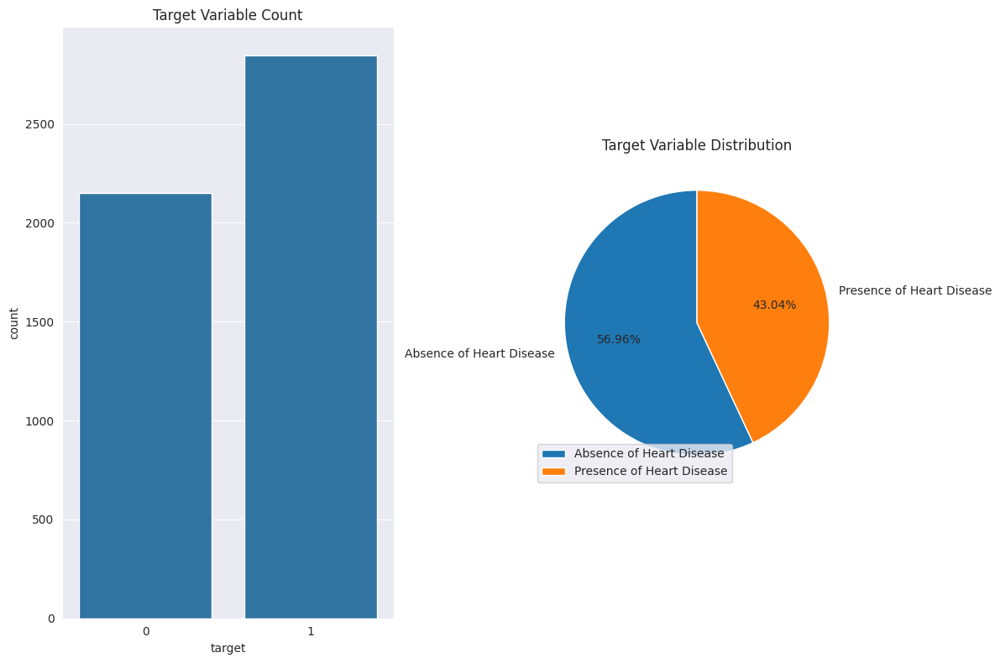

In [25]:
plt.figure(figsize=(12, 8))

# Bar plot
ax1 = plt.subplot(1, 2, 1)
countplot = sns.countplot(x=df['target'])
countplot.set_title("Target Variable Count")

# Pie chart
ax2 = plt.subplot(1, 2, 2)
counts = df['target'].value_counts()
labels = ['Absence of Heart Disease', 'Presence of Heart Disease']
plt.pie(counts, labels=labels, autopct='%1.2f%%', startangle=90)
plt.title("Target Variable Distribution")
plt.legend(labels, loc="best")

plt.tight_layout()
plt.show()


In [26]:
dataset_1['chest_pain_type'].value_counts()

chest_pain_type
4    2847
3    1106
2     857
1     190
Name: count, dtype: int64

In [27]:
dataset_2['chest_pain_type'].value_counts()

chest_pain_type
4    1102
3     762
1     656
2     572
0     143
Name: count, dtype: int64

## Processing of chest_pain_type column

In [28]:
# Display the value counts for chest_pain_type
print('Before removal',df['chest_pain_type'].value_counts())

# Remove rows where chest_pain_type is 0
df = df[df['chest_pain_type'] != 0]

# Verify the result
print('After removal',df['chest_pain_type'].value_counts())

# Check the shape of the dataset to ensure rows have been removed
print(df.shape)


Before removal chest_pain_type
4    2847
3    1105
2     856
1     190
Name: count, dtype: int64
After removal chest_pain_type
4    2847
3    1105
2     856
1     190
Name: count, dtype: int64
(4998, 12)


**Note:** Only dataset_2 contains the chest pain type value as 0, which could also mean missing values but here chose to remove those instances

In [29]:
dataset_1['ST_slope'].value_counts()

ST_slope
2    2477
1    2218
3     305
Name: count, dtype: int64

In [30]:
dataset_2['ST_slope'].value_counts()

ST_slope
2    1588
1    1019
3     607
0      21
Name: count, dtype: int64

**Note:** Removing the instances where ST_Slope = 0 because they dont even amount to 1% of the total records.

## Processing of ST_slope column

In [31]:
# Display the value counts for chest_pain_type
print('Before removal',df['ST_slope'].value_counts())

# Remove rows where chest_pain_type is 0
df = df[df['ST_slope'] != 0]

# Verify the result
print('After removal',df['ST_slope'].value_counts())

# Check the shape of the dataset to ensure rows have been removed
print(df.shape)


Before removal ST_slope
2    2477
1    2216
3     305
Name: count, dtype: int64
After removal ST_slope
2    2477
1    2216
3     305
Name: count, dtype: int64
(4998, 12)


In [32]:
df.target.value_counts(normalize=True)

target
1    0.569628
0    0.430372
Name: proportion, dtype: float64

In [33]:
# Univariate analysis on numeric columns

def univariate_analysis(column,nbins):
    print('\033[1m'+ "Description of " + column + '\033[0m' + '\n' )
    print(df[column].describe())
    print("----------------------------------------------------------------------------")

    print('\033[1m'+ "Unique Values of " + column + '\033[0m' + '\n' )
    print(df[column].value_counts())
    print("----------------------------------------------------------------------------")
    
    plt.figure()
    print('\033[1m'+ "Distribution of " + column + '\033[0m' + '\n')
    sns.distplot(df[column], kde=True, color='g');
    plt.show()
    print("----------------------------------------------------------------------------")
    
    
    plt.figure()
    print('\033[1m'+ "BoxPlot of " + column + '\033[0m' + '\n')
    ax = sns.boxplot(x=df[column])
    plt.show()
    print("----------------------------------------------------------------------------")
    

Description of age

count    4998.000000
mean       54.011004
std         8.802009
min        28.000000
25%        48.000000
50%        55.000000
75%        60.000000
max        77.000000
Name: age, dtype: float64
----------------------------------------------------------------------------
Unique Values of age

age
54    335
58    268
59    253
57    253
56    235
52    230
53    211
51    207
55    189
61    184
62    179
48    169
60    165
63    137
64    130
41    124
50    122
47    113
65    106
45    105
49    103
42    101
43    100
46     93
38     75
44     74
39     72
68     68
67     67
35     65
66     65
40     58
69     53
70     41
37     39
71     30
34     27
72     25
74     25
32     17
73     17
36     16
33     12
75     12
31     10
76      5
29      4
30      3
28      3
77      3
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of age



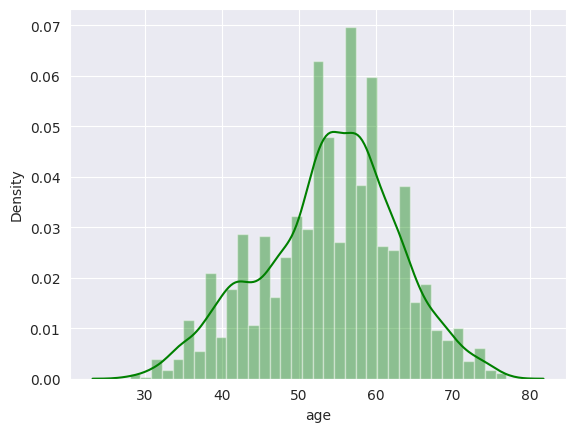

----------------------------------------------------------------------------
BoxPlot of age



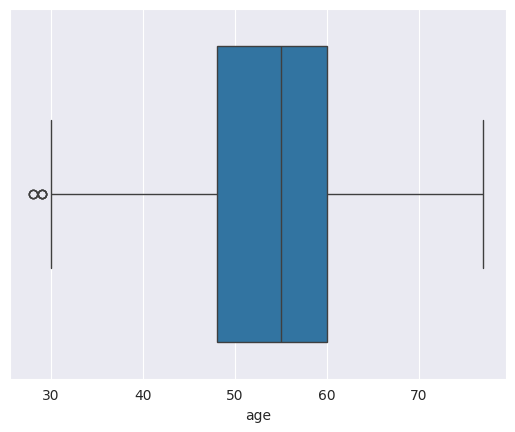

----------------------------------------------------------------------------
Description of sex

count    4998.000000
mean        0.829532
std         0.376081
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: sex, dtype: float64
----------------------------------------------------------------------------
Unique Values of sex

sex
1    4146
0     852
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of sex



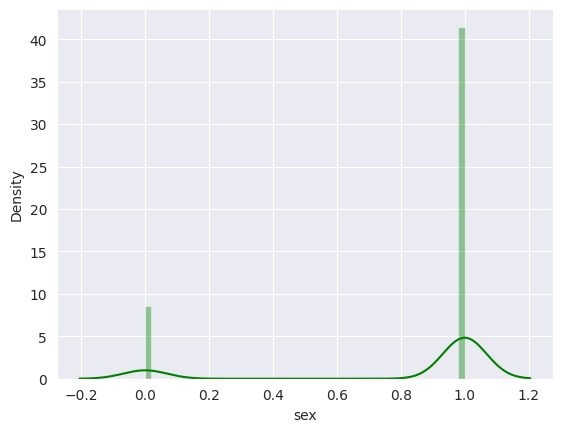

----------------------------------------------------------------------------
BoxPlot of sex



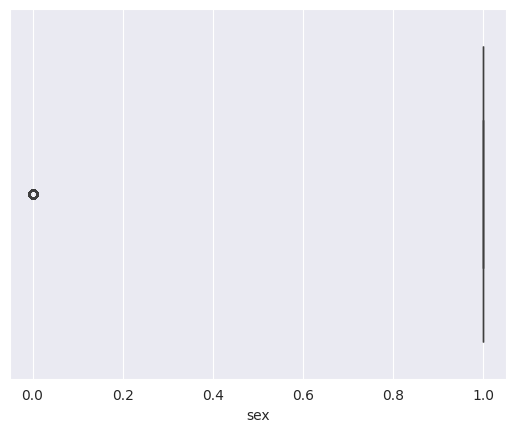

----------------------------------------------------------------------------
Description of chest_pain_type

count    4998.000000
mean        3.322329
std         0.888380
min         1.000000
25%         3.000000
50%         4.000000
75%         4.000000
max         4.000000
Name: chest_pain_type, dtype: float64
----------------------------------------------------------------------------
Unique Values of chest_pain_type

chest_pain_type
4    2847
3    1105
2     856
1     190
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of chest_pain_type



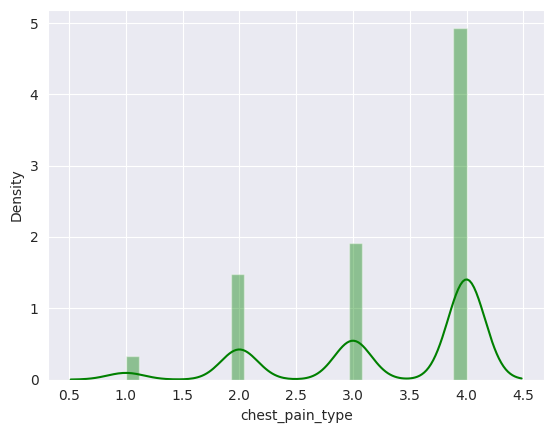

----------------------------------------------------------------------------
BoxPlot of chest_pain_type



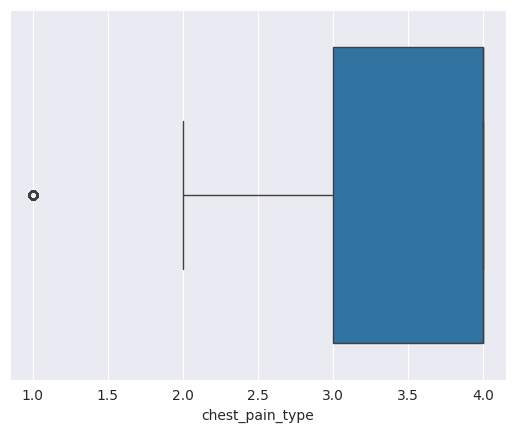

----------------------------------------------------------------------------
Description of resting_bp

count    4998.000000
mean      131.804122
std        16.844456
min        90.000000
25%       120.000000
50%       130.000000
75%       140.000000
max       170.000000
Name: resting_bp, dtype: float64
----------------------------------------------------------------------------
Unique Values of resting_bp

resting_bp
120.0    781
140.0    662
130.0    656
110.0    337
150.0    249
170.0    234
160.0    230
125.0    192
132.0    124
135.0    107
138.0    103
128.0    102
115.0     90
124.0     89
145.0     88
136.0     70
134.0     64
100.0     64
122.0     53
112.0     50
105.0     46
95.0      45
142.0     44
144.0     37
118.0     36
126.0     33
158.0     33
155.0     31
139.0     29
108.0     28
90.0      27
133.0     24
152.0     22
106.0     20
154.0     18
131.0     16
156.0     16
137.0     16
141.0     14
146.0     13
102.0     11
165.0     10
143.0      8
96.0       8
116.0 

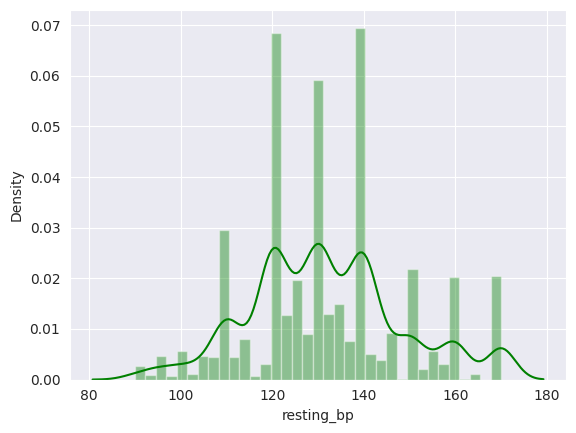

----------------------------------------------------------------------------
BoxPlot of resting_bp



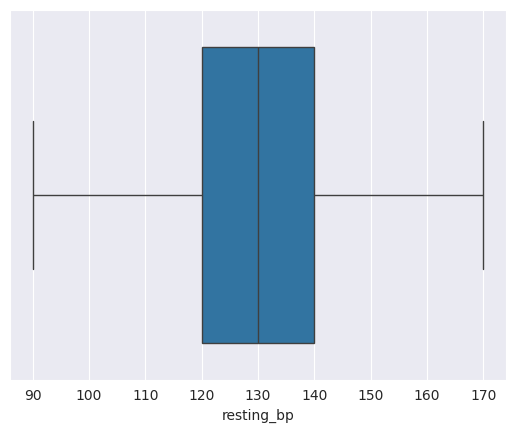

----------------------------------------------------------------------------
Description of cholesterol

count    4998.000000
mean      242.560654
std        42.905044
min       134.500000
25%       219.000000
50%       237.000000
75%       266.000000
max       346.500000
Name: cholesterol, dtype: float64
----------------------------------------------------------------------------
Unique Values of cholesterol

cholesterol
237.00    1115
346.50     167
260.00      85
263.00      73
134.50      57
225.00      57
240.00      56
223.00      56
288.00      55
204.00      55
215.00      53
282.00      51
219.00      51
267.00      48
203.00      46
275.00      46
197.00      45
234.00      45
228.00      43
230.00      43
222.00      43
254.00      43
208.00      42
231.00      41
214.00      39
308.00      39
248.00      38
220.00      38
229.00      38
298.00      38
193.00      37
216.00      36
160.00      35
210.00      35
195.00      35
236.00      35
274.00      34
261.00      33
235.

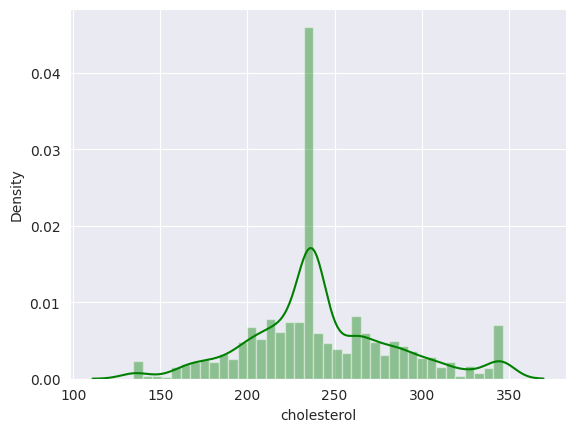

----------------------------------------------------------------------------
BoxPlot of cholesterol



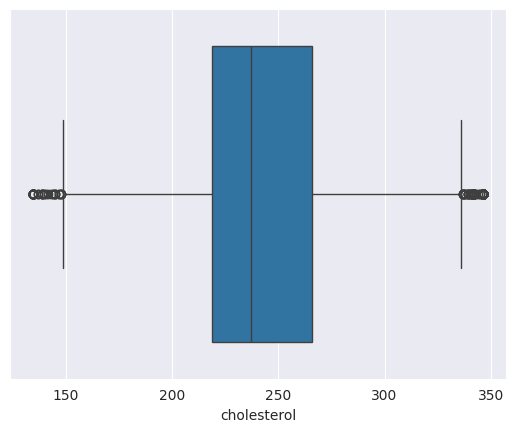

----------------------------------------------------------------------------
Description of fasting_blood_sugar

count    4998.000000
mean        0.243898
std         0.429475
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: fasting_blood_sugar, dtype: float64
----------------------------------------------------------------------------
Unique Values of fasting_blood_sugar

fasting_blood_sugar
0    3779
1    1219
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of fasting_blood_sugar



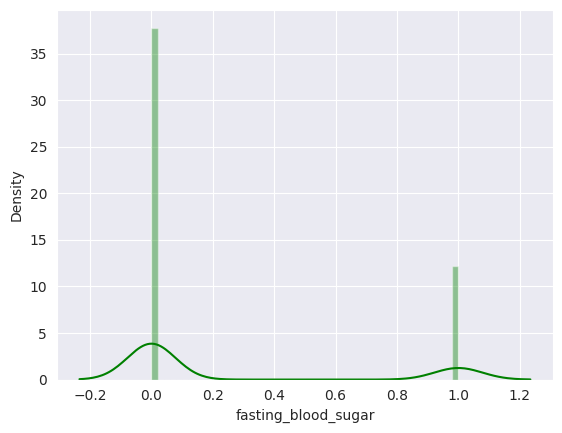

----------------------------------------------------------------------------
BoxPlot of fasting_blood_sugar



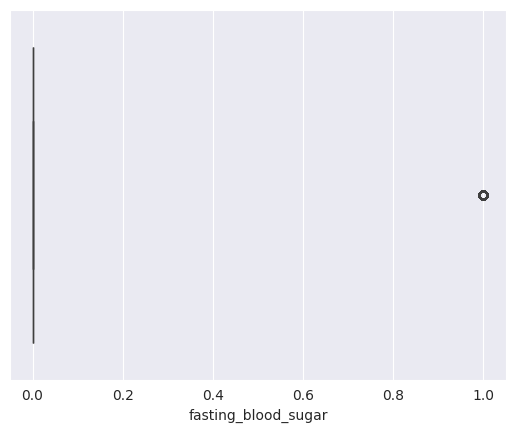

----------------------------------------------------------------------------
Description of resting_ecg

count    4998.000000
mean        0.559824
std         0.782490
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: resting_ecg, dtype: float64
----------------------------------------------------------------------------
Unique Values of resting_ecg

resting_ecg
0    3114
1     970
2     914
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of resting_ecg



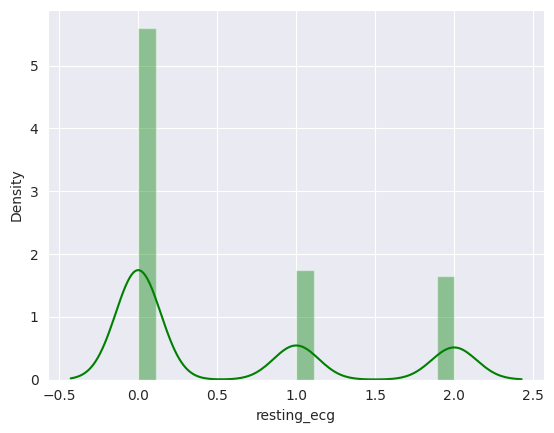

----------------------------------------------------------------------------
BoxPlot of resting_ecg



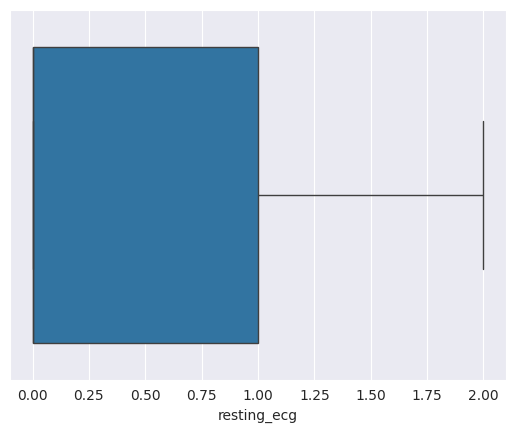

----------------------------------------------------------------------------
Description of max_heart_rate

count    4998.000000
mean      135.854342
std        24.176101
min        66.000000
25%       120.000000
50%       135.000000
75%       153.000000
max       198.000000
Name: max_heart_rate, dtype: float64
----------------------------------------------------------------------------
Unique Values of max_heart_rate

max_heart_rate
150.0    254
120.0    222
140.0    219
130.0    219
125.0    145
110.0    129
170.0    122
122.0    119
115.0    105
112.0    101
145.0    101
160.0     94
100.0     89
138.0     84
135.0     80
128.0     79
118.0     78
152.0     76
162.0     72
126.0     69
142.0     69
131.0     67
154.0     65
105.0     62
144.0     62
172.0     59
98.0      58
165.0     58
175.0     57
155.0     53
116.0     52
143.0     52
158.0     50
148.0     50
124.0     49
156.0     45
180.0     44
132.0     44
96.0      44
141.0     43
134.0     42
137.0     41
161.0     39
171

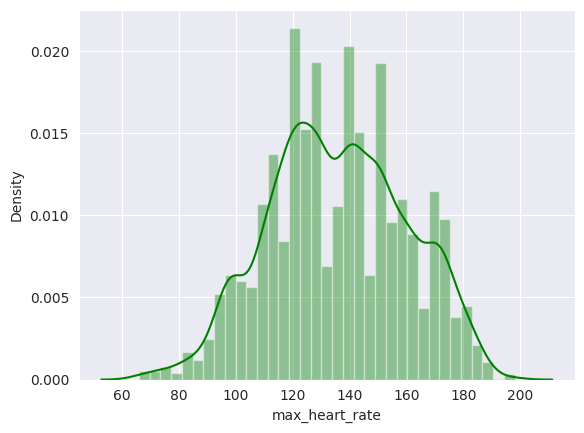

----------------------------------------------------------------------------
BoxPlot of max_heart_rate



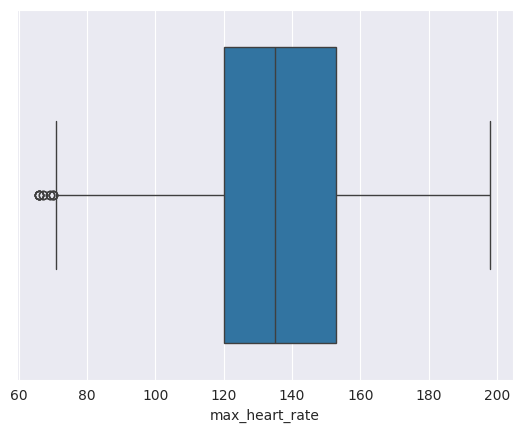

----------------------------------------------------------------------------
Description of exercise_angina

count    4998.000000
mean        0.416767
std         0.493073
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: exercise_angina, dtype: float64
----------------------------------------------------------------------------
Unique Values of exercise_angina

exercise_angina
0    2915
1    2083
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of exercise_angina



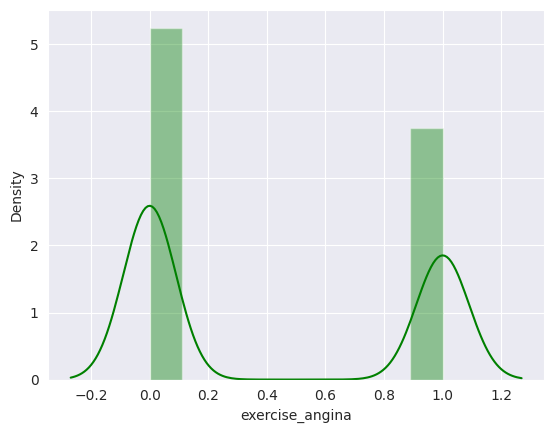

----------------------------------------------------------------------------
BoxPlot of exercise_angina



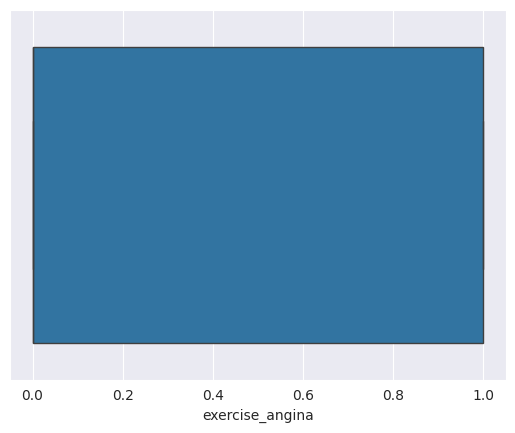

----------------------------------------------------------------------------
Description of oldpeak

count    4998.000000
mean        0.788781
std         1.013551
min        -2.000000
25%         0.000000
50%         0.300000
75%         1.500000
max         3.750000
Name: oldpeak, dtype: float64
----------------------------------------------------------------------------
Unique Values of oldpeak

oldpeak
 0.000    2121
 1.000     490
 2.000     476
 1.500     385
 3.000     119
 0.200     112
 1.200      94
 1.400      86
 1.600      78
 2.500      71
 3.750      70
 0.800      70
 1.800      70
 0.500      66
 0.600      62
 0.100      62
 0.300      53
-0.500      48
-1.000      40
 1.300      37
 2.600      33
 2.200      25
-0.800      23
 0.700      23
 1.700      23
 2.800      23
 1.900      22
 3.600      21
 0.400      21
 1.100      19
-0.900      16
-0.100      14
-1.500      14
-0.700      13
-0.200      13
 3.400      12
 0.900      11
 2.400       9
-0.300       8
 2.10

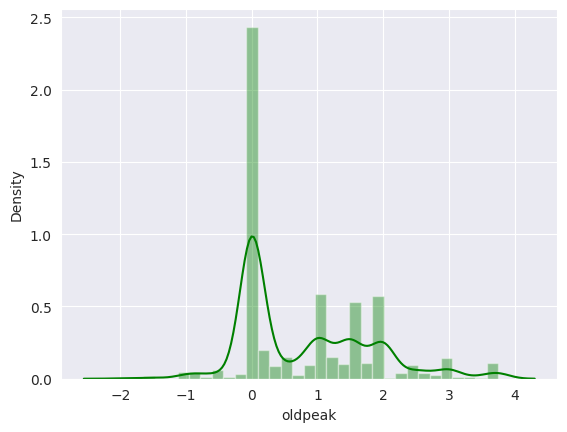

----------------------------------------------------------------------------
BoxPlot of oldpeak



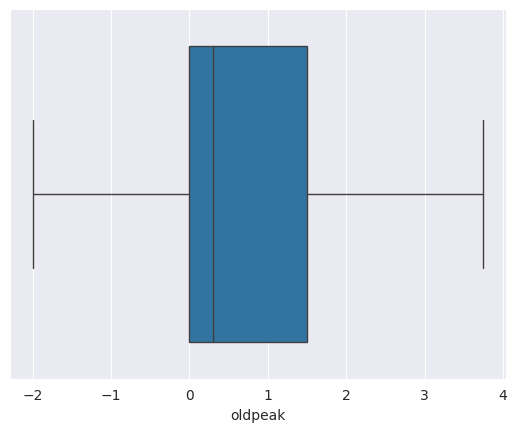

----------------------------------------------------------------------------
Description of ST_slope

count    4998.000000
mean        1.617647
std         0.598565
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: ST_slope, dtype: float64
----------------------------------------------------------------------------
Unique Values of ST_slope

ST_slope
2    2477
1    2216
3     305
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of ST_slope



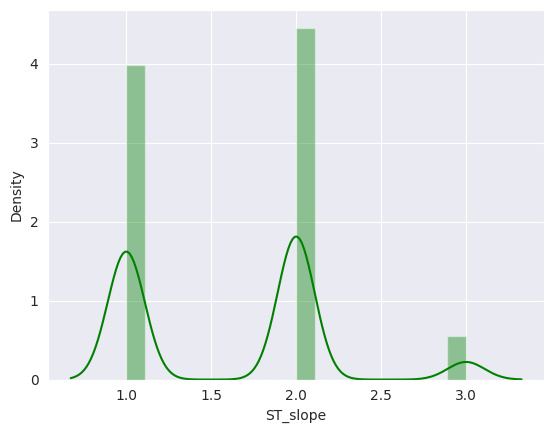

----------------------------------------------------------------------------
BoxPlot of ST_slope



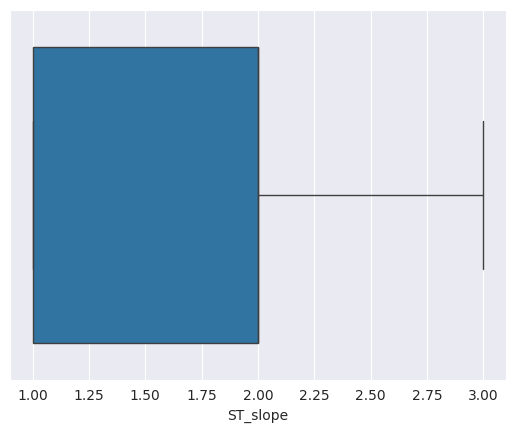

----------------------------------------------------------------------------
Description of target

count    4998.000000
mean        0.569628
std         0.495178
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: target, dtype: float64
----------------------------------------------------------------------------
Unique Values of target

target
1    2847
0    2151
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of target



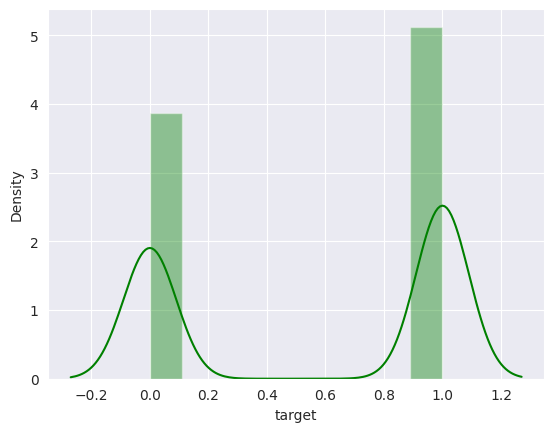

----------------------------------------------------------------------------
BoxPlot of target



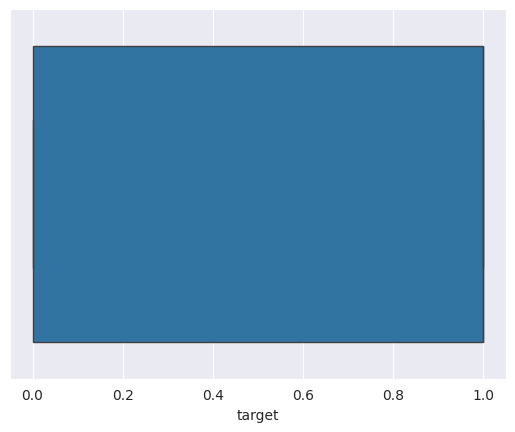

----------------------------------------------------------------------------


In [34]:
for column in list(df.columns):
    univariate_analysis(column,20)

## Processing of ST_slope column

In [35]:
# Checking the target variable distribution for 0 value cholestral records

df[df['cholesterol']==0]['target'].value_counts()

Series([], Name: count, dtype: int64)

In [36]:
# Replace zero cholesterol values with NaN
df['cholesterol'] = df['cholesterol'].replace(0, np.nan)

# Now handle the NaN values, for example by imputing the median value
df['cholesterol'].fillna(df['cholesterol'].median(), inplace=True)


Description of age

count    4998.000000
mean       54.011004
std         8.802009
min        28.000000
25%        48.000000
50%        55.000000
75%        60.000000
max        77.000000
Name: age, dtype: float64
----------------------------------------------------------------------------
Unique Values of age

age
54    335
58    268
59    253
57    253
56    235
52    230
53    211
51    207
55    189
61    184
62    179
48    169
60    165
63    137
64    130
41    124
50    122
47    113
65    106
45    105
49    103
42    101
43    100
46     93
38     75
44     74
39     72
68     68
67     67
35     65
66     65
40     58
69     53
70     41
37     39
71     30
34     27
72     25
74     25
32     17
73     17
36     16
33     12
75     12
31     10
76      5
29      4
30      3
28      3
77      3
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of age



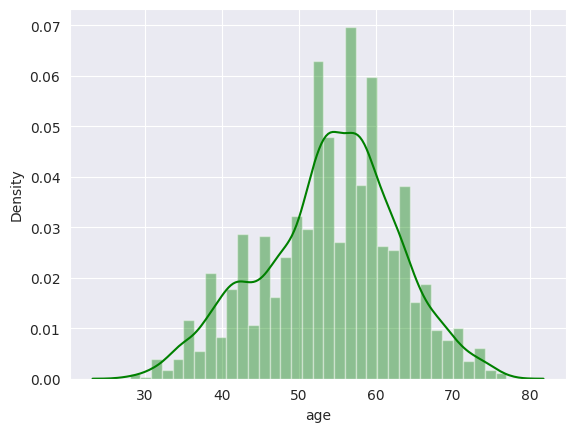

----------------------------------------------------------------------------
BoxPlot of age



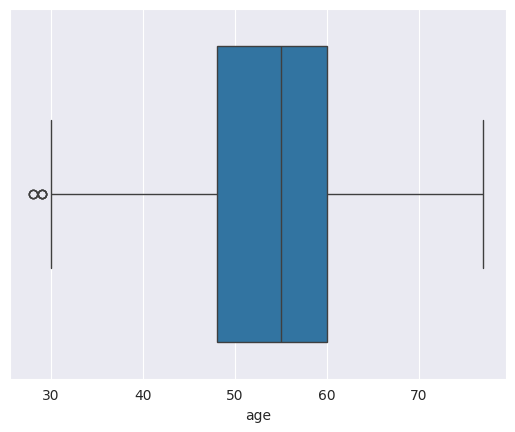

----------------------------------------------------------------------------
Description of sex

count    4998.000000
mean        0.829532
std         0.376081
min         0.000000
25%         1.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: sex, dtype: float64
----------------------------------------------------------------------------
Unique Values of sex

sex
1    4146
0     852
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of sex



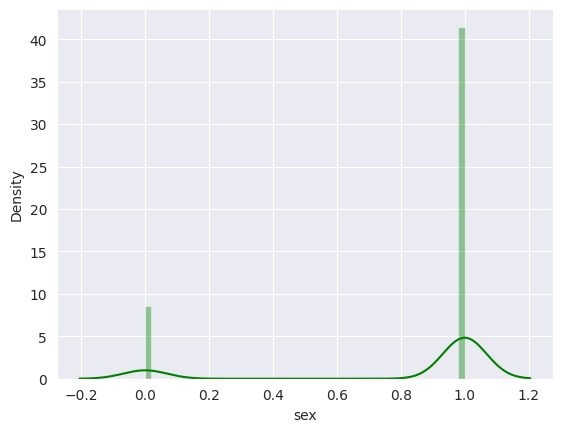

----------------------------------------------------------------------------
BoxPlot of sex



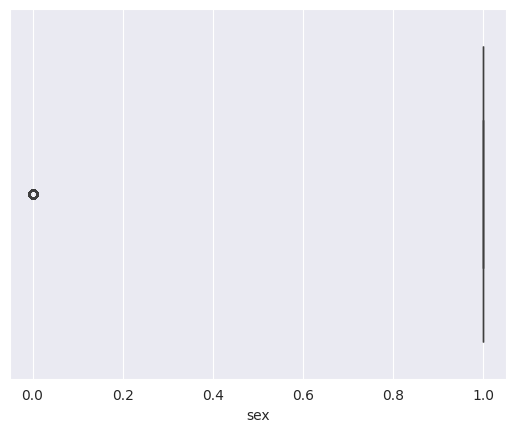

----------------------------------------------------------------------------
Description of chest_pain_type

count    4998.000000
mean        3.322329
std         0.888380
min         1.000000
25%         3.000000
50%         4.000000
75%         4.000000
max         4.000000
Name: chest_pain_type, dtype: float64
----------------------------------------------------------------------------
Unique Values of chest_pain_type

chest_pain_type
4    2847
3    1105
2     856
1     190
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of chest_pain_type



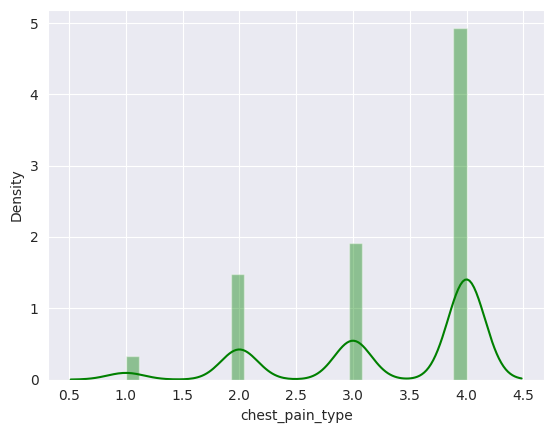

----------------------------------------------------------------------------
BoxPlot of chest_pain_type



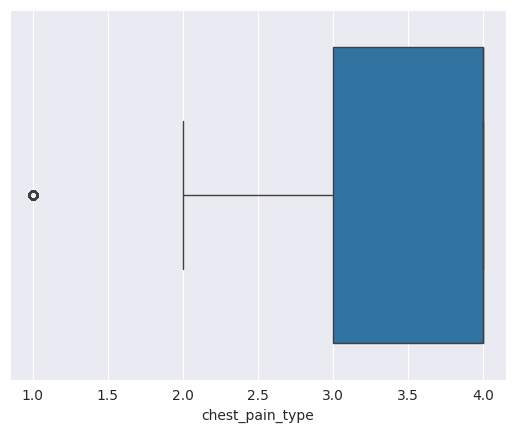

----------------------------------------------------------------------------
Description of resting_bp

count    4998.000000
mean      131.804122
std        16.844456
min        90.000000
25%       120.000000
50%       130.000000
75%       140.000000
max       170.000000
Name: resting_bp, dtype: float64
----------------------------------------------------------------------------
Unique Values of resting_bp

resting_bp
120.0    781
140.0    662
130.0    656
110.0    337
150.0    249
170.0    234
160.0    230
125.0    192
132.0    124
135.0    107
138.0    103
128.0    102
115.0     90
124.0     89
145.0     88
136.0     70
134.0     64
100.0     64
122.0     53
112.0     50
105.0     46
95.0      45
142.0     44
144.0     37
118.0     36
126.0     33
158.0     33
155.0     31
139.0     29
108.0     28
90.0      27
133.0     24
152.0     22
106.0     20
154.0     18
131.0     16
156.0     16
137.0     16
141.0     14
146.0     13
102.0     11
165.0     10
143.0      8
96.0       8
116.0 

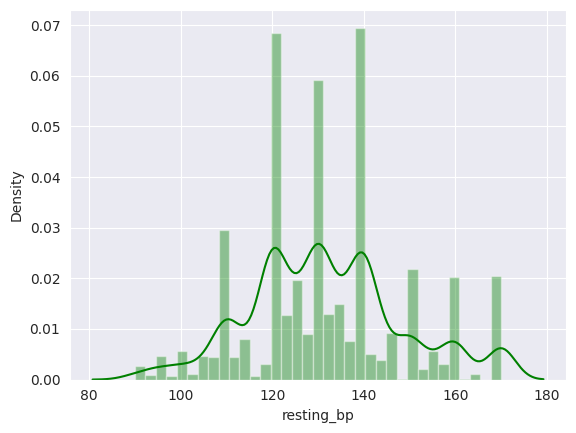

----------------------------------------------------------------------------
BoxPlot of resting_bp



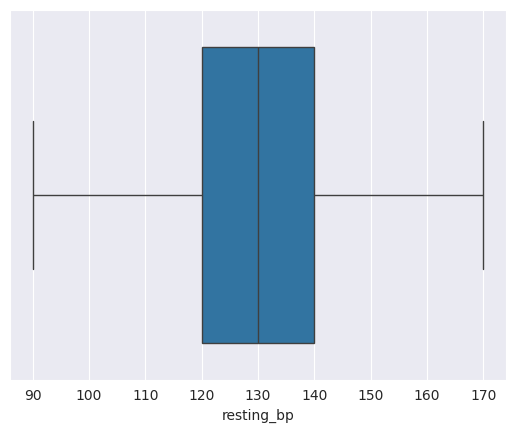

----------------------------------------------------------------------------
Description of cholesterol

count    4998.000000
mean      242.560654
std        42.905044
min       134.500000
25%       219.000000
50%       237.000000
75%       266.000000
max       346.500000
Name: cholesterol, dtype: float64
----------------------------------------------------------------------------
Unique Values of cholesterol

cholesterol
237.00    1115
346.50     167
260.00      85
263.00      73
134.50      57
225.00      57
240.00      56
223.00      56
288.00      55
204.00      55
215.00      53
282.00      51
219.00      51
267.00      48
203.00      46
275.00      46
197.00      45
234.00      45
228.00      43
230.00      43
222.00      43
254.00      43
208.00      42
231.00      41
214.00      39
308.00      39
248.00      38
220.00      38
229.00      38
298.00      38
193.00      37
216.00      36
160.00      35
210.00      35
195.00      35
236.00      35
274.00      34
261.00      33
235.

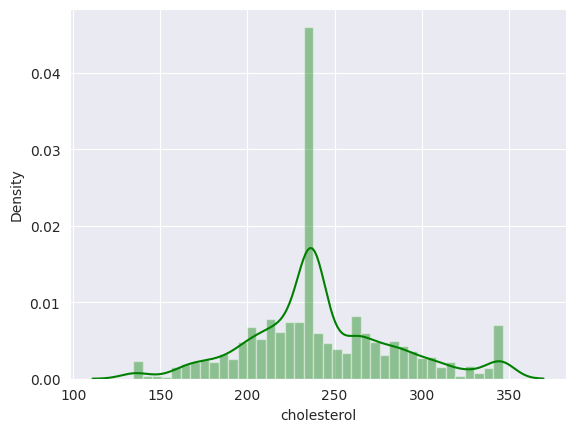

----------------------------------------------------------------------------
BoxPlot of cholesterol



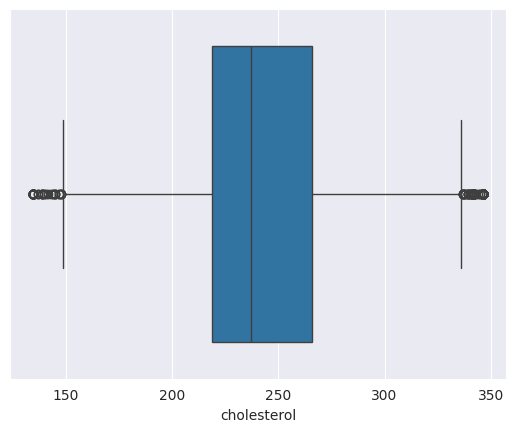

----------------------------------------------------------------------------
Description of fasting_blood_sugar

count    4998.000000
mean        0.243898
std         0.429475
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: fasting_blood_sugar, dtype: float64
----------------------------------------------------------------------------
Unique Values of fasting_blood_sugar

fasting_blood_sugar
0    3779
1    1219
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of fasting_blood_sugar



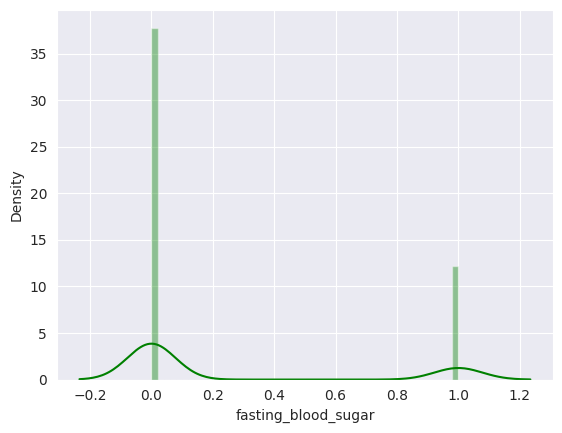

----------------------------------------------------------------------------
BoxPlot of fasting_blood_sugar



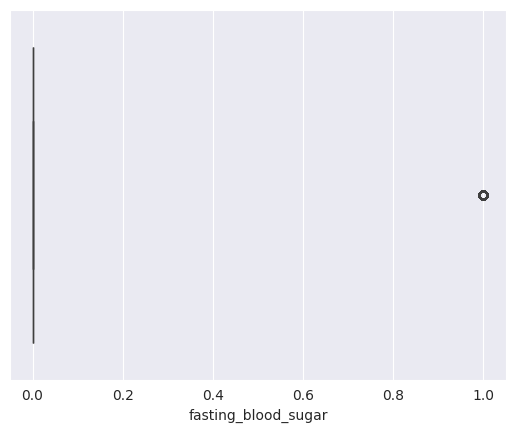

----------------------------------------------------------------------------
Description of resting_ecg

count    4998.000000
mean        0.559824
std         0.782490
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         2.000000
Name: resting_ecg, dtype: float64
----------------------------------------------------------------------------
Unique Values of resting_ecg

resting_ecg
0    3114
1     970
2     914
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of resting_ecg



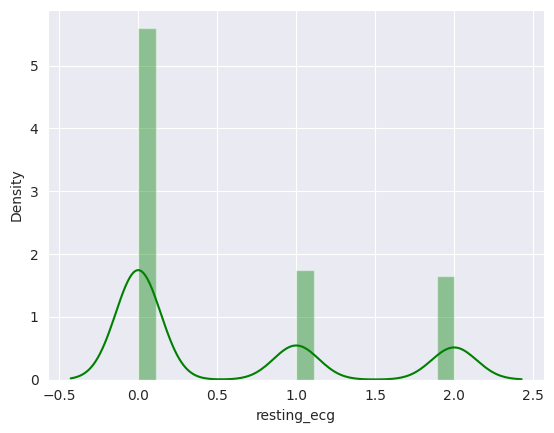

----------------------------------------------------------------------------
BoxPlot of resting_ecg



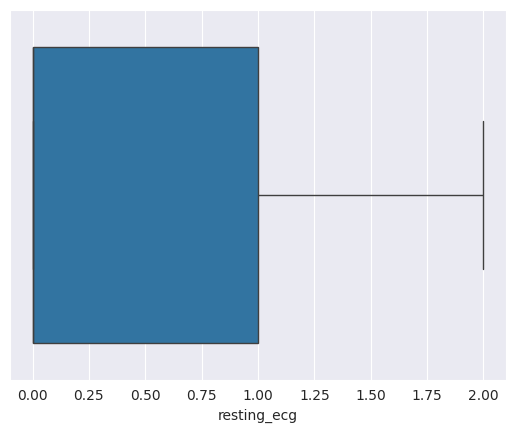

----------------------------------------------------------------------------
Description of max_heart_rate

count    4998.000000
mean      135.854342
std        24.176101
min        66.000000
25%       120.000000
50%       135.000000
75%       153.000000
max       198.000000
Name: max_heart_rate, dtype: float64
----------------------------------------------------------------------------
Unique Values of max_heart_rate

max_heart_rate
150.0    254
120.0    222
140.0    219
130.0    219
125.0    145
110.0    129
170.0    122
122.0    119
115.0    105
112.0    101
145.0    101
160.0     94
100.0     89
138.0     84
135.0     80
128.0     79
118.0     78
152.0     76
162.0     72
126.0     69
142.0     69
131.0     67
154.0     65
105.0     62
144.0     62
172.0     59
98.0      58
165.0     58
175.0     57
155.0     53
116.0     52
143.0     52
158.0     50
148.0     50
124.0     49
156.0     45
180.0     44
132.0     44
96.0      44
141.0     43
134.0     42
137.0     41
161.0     39
171

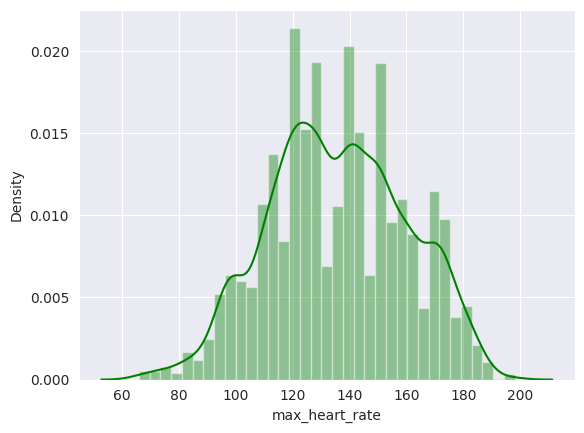

----------------------------------------------------------------------------
BoxPlot of max_heart_rate



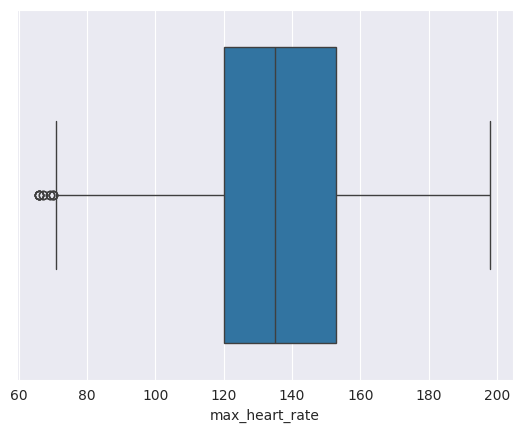

----------------------------------------------------------------------------
Description of exercise_angina

count    4998.000000
mean        0.416767
std         0.493073
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: exercise_angina, dtype: float64
----------------------------------------------------------------------------
Unique Values of exercise_angina

exercise_angina
0    2915
1    2083
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of exercise_angina



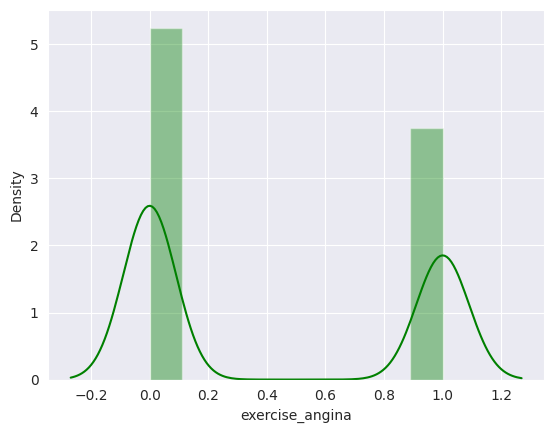

----------------------------------------------------------------------------
BoxPlot of exercise_angina



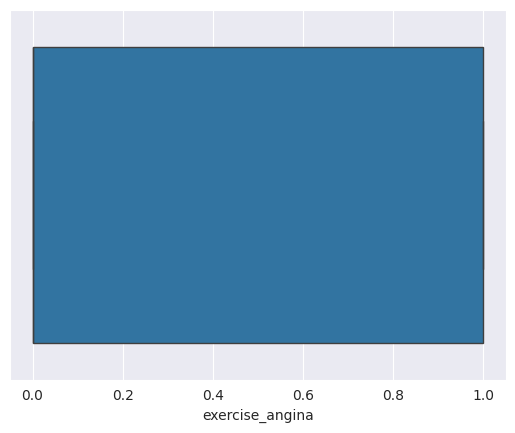

----------------------------------------------------------------------------
Description of oldpeak

count    4998.000000
mean        0.788781
std         1.013551
min        -2.000000
25%         0.000000
50%         0.300000
75%         1.500000
max         3.750000
Name: oldpeak, dtype: float64
----------------------------------------------------------------------------
Unique Values of oldpeak

oldpeak
 0.000    2121
 1.000     490
 2.000     476
 1.500     385
 3.000     119
 0.200     112
 1.200      94
 1.400      86
 1.600      78
 2.500      71
 3.750      70
 0.800      70
 1.800      70
 0.500      66
 0.600      62
 0.100      62
 0.300      53
-0.500      48
-1.000      40
 1.300      37
 2.600      33
 2.200      25
-0.800      23
 0.700      23
 1.700      23
 2.800      23
 1.900      22
 3.600      21
 0.400      21
 1.100      19
-0.900      16
-0.100      14
-1.500      14
-0.700      13
-0.200      13
 3.400      12
 0.900      11
 2.400       9
-0.300       8
 2.10

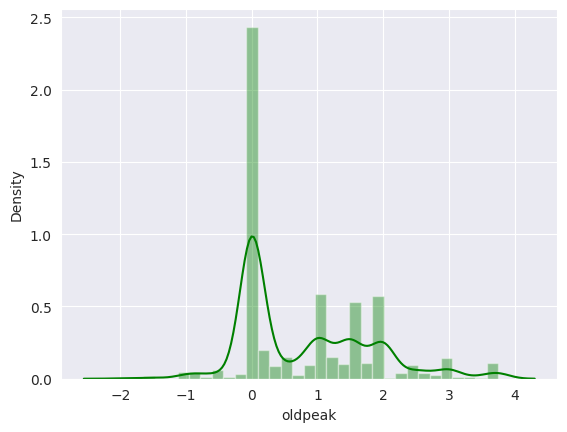

----------------------------------------------------------------------------
BoxPlot of oldpeak



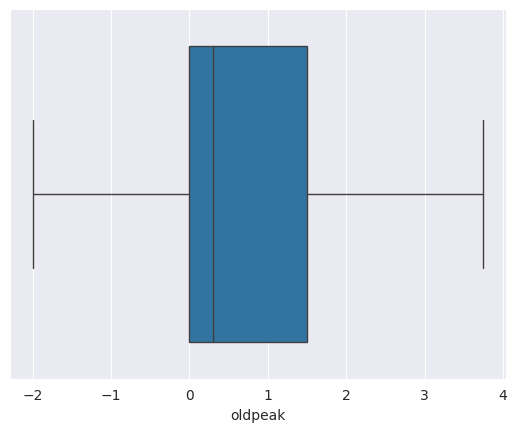

----------------------------------------------------------------------------
Description of ST_slope

count    4998.000000
mean        1.617647
std         0.598565
min         1.000000
25%         1.000000
50%         2.000000
75%         2.000000
max         3.000000
Name: ST_slope, dtype: float64
----------------------------------------------------------------------------
Unique Values of ST_slope

ST_slope
2    2477
1    2216
3     305
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of ST_slope



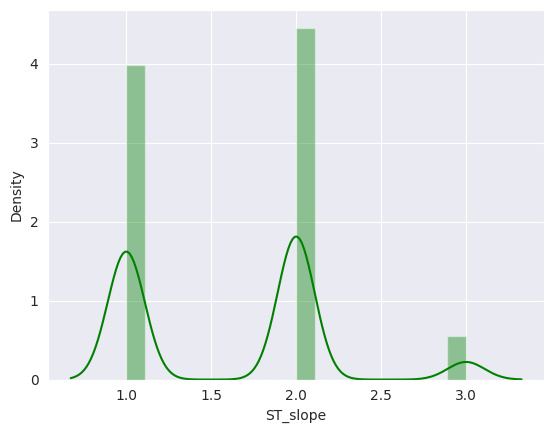

----------------------------------------------------------------------------
BoxPlot of ST_slope



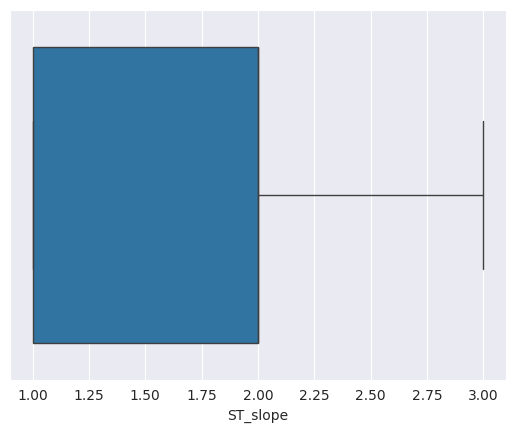

----------------------------------------------------------------------------
Description of target

count    4998.000000
mean        0.569628
std         0.495178
min         0.000000
25%         0.000000
50%         1.000000
75%         1.000000
max         1.000000
Name: target, dtype: float64
----------------------------------------------------------------------------
Unique Values of target

target
1    2847
0    2151
Name: count, dtype: int64
----------------------------------------------------------------------------
Distribution of target



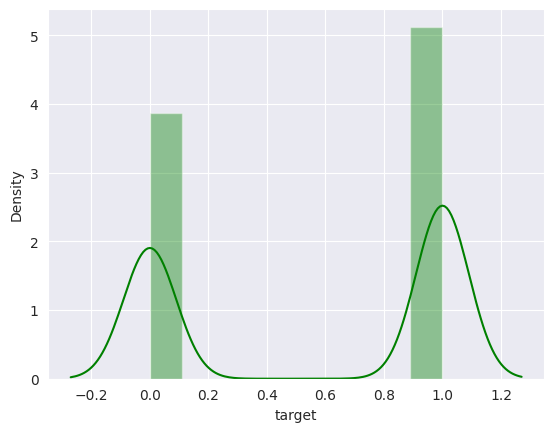

----------------------------------------------------------------------------
BoxPlot of target



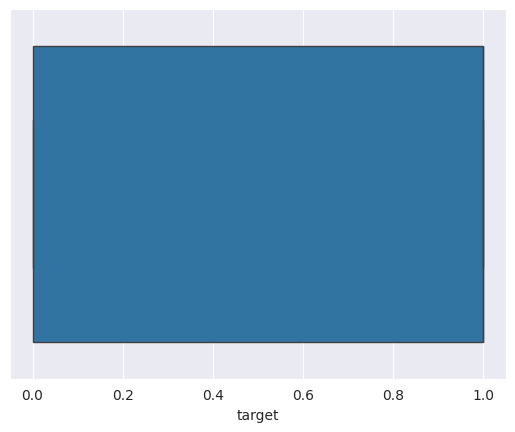

----------------------------------------------------------------------------


In [37]:
for column in list(df.columns):
    univariate_analysis(column,20)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 [Text(1, 0, 'age'),
  Text(2, 0, 'sex'),
  Text(3, 0, 'chest_pain_type'),
  Text(4, 0, 'resting_bp'),
  Text(5, 0, 'cholesterol'),
  Text(6, 0, 'fasting_blood_sugar'),
  Text(7, 0, 'resting_ecg'),
  Text(8, 0, 'max_heart_rate'),
  Text(9, 0, 'exercise_angina'),
  Text(10, 0, 'oldpeak'),
  Text(11, 0, 'ST_slope'),
  Text(12, 0, 'target')])

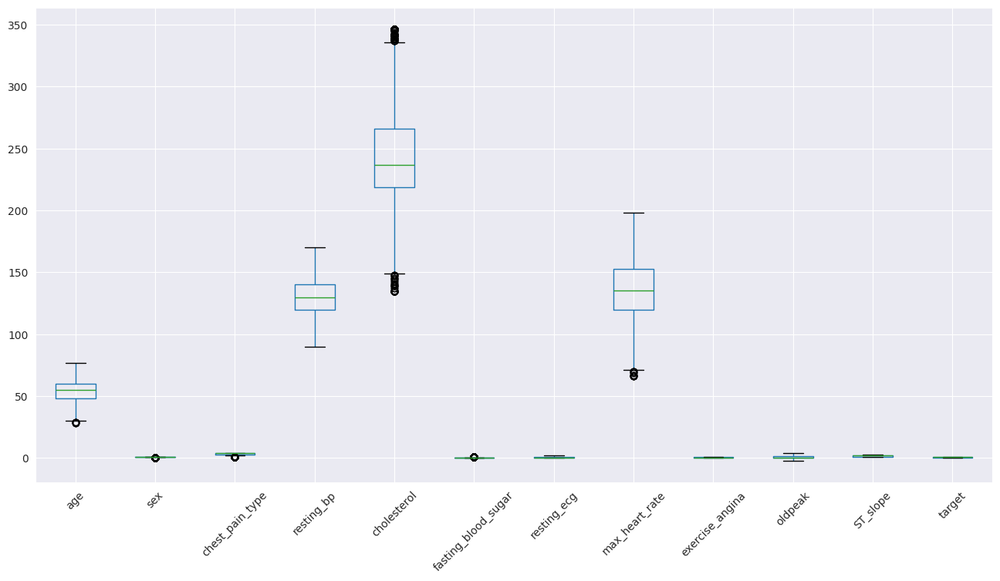

In [38]:
# Checking the presence of outliers in the dataset all columns at once

plt.figure(figsize=(16,8))
df.boxplot()
plt.xticks(rotation=45)

## Correlation Heatmap

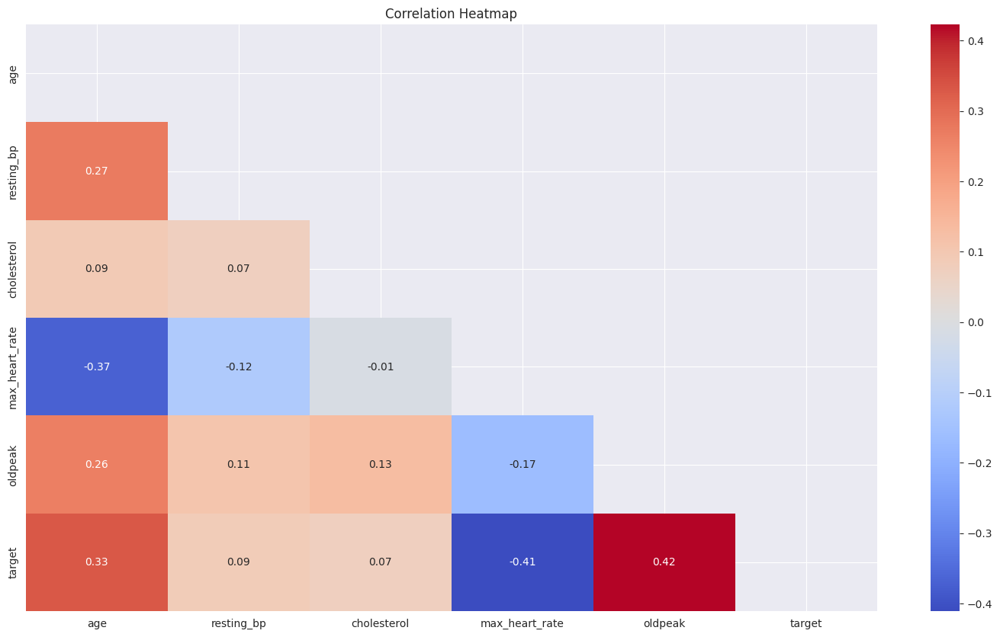

In [39]:
numeric_columns = ["age", "resting_bp", "cholesterol", "max_heart_rate", "oldpeak","target"]
corr = df[numeric_columns].corr()
mask = np.triu(np.ones_like(corr, dtype=bool)) 
fig = plt.subplots(figsize=(18, 10))
sns.heatmap(corr, annot=True,fmt='.2f',mask=mask,cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

## ExtraTreesClassifier - Feature importance checking

## Importing additional libraries and packages

In [40]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

X = df.iloc[:,0:11]  
y = df.iloc[:,-1]

bestfeatures = SelectKBest(score_func=f_classif, k=10)
fit = bestfeatures.fit(X, y)


dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)


featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Specs', 'Score'] 
featureScores=pd.DataFrame(featureScores.nlargest(10, 'Score'))
featureScores

,Specs,Score
10,ST_slope,3999.208328
8,exercise_angina,2198.718850
2,chest_pain_type,1753.057203
9,oldpeak,1089.264032
7,max_heart_rate,1014.538678
5,fasting_blood_sugar,691.825469
0,age,608.908382
1,sex,502.518030
3,resting_bp,37.187823
4,cholesterol,26.821680


[0.05778385 0.04023912 0.10595405 0.04900025 0.05631679 0.07400981
 0.01996268 0.07001    0.14608256 0.08238772 0.29825317]


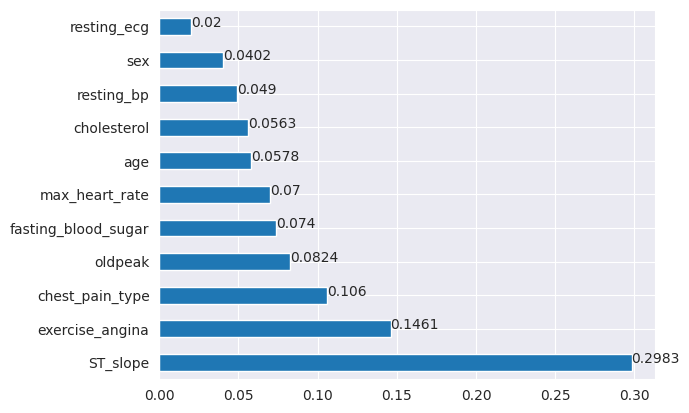

In [41]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X, y)


print(model.feature_importances_)


feat_importances = pd.Series(model.feature_importances_, index=X.columns)


feat_importances.nlargest(13).plot(kind='barh')


for index, value in enumerate(feat_importances.nlargest(13)):
    plt.text(value, index, str(round(value, 4)))


plt.show()

# Outlier Treatment

In [42]:
# function to calculate outlier proportion
def get_outlier_proportion(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    #calculation for proportion
    temp=[]
    for i in col:
        if (i>upper_range) or (i<lower_range):
            temp.append(i)
    proportion = len(temp)/len(col)
    return proportion, len(temp)

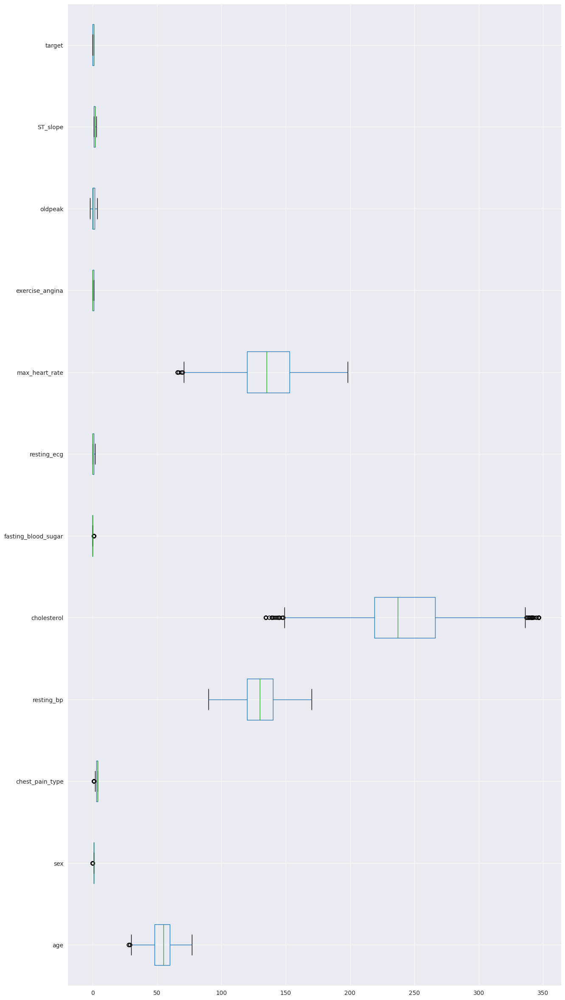

In [43]:
#Boxplot to check outliers
plt.figure(figsize=(15,30))
df.boxplot(vert=False)
plt.show()

In [44]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)

# Calculate Interquartile Range (IQR)
IQR = Q3 - Q1

# Calculate outliers
outliers = (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))

# Calculate the percentage of outliers
outlier_percentage = (outliers.sum() / df.shape[0] * 100).round(2)

# Calculate the count of outliers
outlier_count = outliers.sum()

# Create a DataFrame with the results
outlier_prop = pd.DataFrame({
    'Outlier %': outlier_percentage,
    'Outlier Count': outlier_count
})

# Sort the DataFrame by the percentage of outliers in descending order
outlier_prop = outlier_prop.sort_values(by='Outlier %', ascending=False)

# Display the results
outlier_prop


,Outlier %,Outlier Count
fasting_blood_sugar,24.39,1219
sex,17.05,852
cholesterol,5.88,294
chest_pain_type,3.80,190
max_heart_rate,0.26,13
age,0.14,7
resting_bp,0.00,0
resting_ecg,0.00,0
exercise_angina,0.00,0
oldpeak,0.00,0


In [45]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,4998.0,54.011004,8.802009,28.0,48.0,55.0,60.0,77.00
sex,4998.0,0.829532,0.376081,0.0,1.0,1.0,1.0,1.00
chest_pain_type,4998.0,3.322329,0.888380,1.0,3.0,4.0,4.0,4.00
resting_bp,4998.0,131.804122,16.844456,90.0,120.0,130.0,140.0,170.00
cholesterol,4998.0,242.560654,42.905044,134.5,219.0,237.0,266.0,346.50
fasting_blood_sugar,4998.0,0.243898,0.429475,0.0,0.0,0.0,0.0,1.00
resting_ecg,4998.0,0.559824,0.782490,0.0,0.0,0.0,1.0,2.00
max_heart_rate,4998.0,135.854342,24.176101,66.0,120.0,135.0,153.0,198.00
exercise_angina,4998.0,0.416767,0.493073,0.0,0.0,0.0,1.0,1.00
oldpeak,4998.0,0.788781,1.013551,-2.0,0.0,0.3,1.5,3.75


In [46]:
# function to remove outliers

def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [47]:
df.shape

(4998, 12)

In [48]:
remove_outlier_columns = ['resting_bp','cholesterol','max_heart_rate','oldpeak']

for column in remove_outlier_columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])

In [49]:
df.shape

(4998, 12)

In [50]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)

# Calculate Interquartile Range (IQR)
IQR = Q3 - Q1

# Calculate outliers
outliers = (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))

# Calculate the percentage of outliers
outlier_percentage = (outliers.sum() / df.shape[0] * 100).round(2)

# Calculate the count of outliers
outlier_count = outliers.sum()

# Create a DataFrame with the results
outlier_prop = pd.DataFrame({
    'Outlier %': outlier_percentage,
    'Outlier Count': outlier_count
})

# Sort the DataFrame by the percentage of outliers in descending order
outlier_prop = outlier_prop.sort_values(by='Outlier %', ascending=False)

# Display the results
outlier_prop


,Outlier %,Outlier Count
fasting_blood_sugar,24.39,1219
sex,17.05,852
chest_pain_type,3.80,190
age,0.14,7
resting_bp,0.00,0
cholesterol,0.00,0
resting_ecg,0.00,0
max_heart_rate,0.00,0
exercise_angina,0.00,0
oldpeak,0.00,0


# Data Preprocessing before Modelling

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4998 entries, 0 to 4999
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  4998 non-null   int64  
 1   sex                  4998 non-null   int64  
 2   chest_pain_type      4998 non-null   int64  
 3   resting_bp           4998 non-null   float64
 4   cholesterol          4998 non-null   float64
 5   fasting_blood_sugar  4998 non-null   int64  
 6   resting_ecg          4998 non-null   int64  
 7   max_heart_rate       4998 non-null   float64
 8   exercise_angina      4998 non-null   int64  
 9   oldpeak              4998 non-null   float64
 10  ST_slope             4998 non-null   int64  
 11  target               4998 non-null   int64  
dtypes: float64(4), int64(8)
memory usage: 507.6 KB


In [52]:
# # converting features to categorical features 

# df['chest_pain_type'][df['chest_pain_type'] == 1] = 'typical_angina'
# df['chest_pain_type'][df['chest_pain_type'] == 2] = 'atypical_angina'
# df['chest_pain_type'][df['chest_pain_type'] == 3] = 'non_anginal_pain'
# df['chest_pain_type'][df['chest_pain_type'] == 4] = 'asymptomatic'

# df['resting_ecg'][df['resting_ecg'] == 0] = 'normal'
# df['resting_ecg'][df['resting_ecg'] == 1] = 'ST_T_wave_abnormality'
# df['resting_ecg'][df['resting_ecg'] == 2] = 'left_ventricular_hypertrophy'


# #df['ST_slope'][df['ST_slope'] == 0] = 'normal'
# df['ST_slope'][df['ST_slope'] == 1] = 'upsloping'
# df['ST_slope'][df['ST_slope'] == 2] = 'flat'
# df['ST_slope'][df['ST_slope'] == 3] = 'downsloping'

# df["sex"] = df.sex.apply(lambda  x:'male' if x==1 else 'female')

## Importing additional libraries and packages

In [53]:
from numpy import where
import matplotlib.pyplot as plt

from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE

In [54]:
df1 = df.copy()

In [55]:
df1

,age,sex,chest_pain_type,resting_bp,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_angina,oldpeak,ST_slope,target
0,65,1,4,120.0,237.0,1,0,89.0,1,-1.5,3,1
1,31,1,3,120.0,222.0,0,0,187.0,0,0.0,1,0
2,53,1,2,132.0,227.0,0,1,141.0,0,0.2,1,0
3,64,1,1,157.0,236.0,1,2,164.0,0,0.3,1,0
4,67,1,4,140.0,167.0,1,1,126.0,1,0.0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,59,1,4,110.0,237.0,1,0,116.0,0,1.5,3,1
4996,58,0,2,130.0,295.0,0,0,110.0,0,1.0,2,1
4997,60,1,4,135.0,222.0,0,1,119.0,1,2.0,2,1
4998,65,1,4,130.0,237.0,1,1,121.0,1,1.7,1,1


In [56]:
df1.describe().T[['min','max','std']]

,min,max,std
age,28.0,77.00,8.802009
sex,0.0,1.00,0.376081
chest_pain_type,1.0,4.00,0.888380
resting_bp,90.0,170.00,16.844456
cholesterol,148.5,336.50,41.587167
fasting_blood_sugar,0.0,1.00,0.429475
resting_ecg,0.0,2.00,0.782490
max_heart_rate,70.5,198.00,24.154637
exercise_angina,0.0,1.00,0.493073
oldpeak,-2.0,3.75,1.013551


In [57]:
# check for duplicate columns

print("Number of duplicate rows:", df.duplicated().sum())
df1[df1.duplicated()]

Number of duplicate rows: 0


,age,sex,chest_pain_type,resting_bp,cholesterol,fasting_blood_sugar,resting_ecg,max_heart_rate,exercise_angina,oldpeak,ST_slope,target


In [58]:
print('Before removing the duplicate rows',df1.shape)
df1.drop_duplicates(inplace=True) 
print('After removing the duplicate rows',df1.shape)

Before removing the duplicate rows (4998, 12)
After removing the duplicate rows (4998, 12)


# Splitting of Train & Test Data

## Importing additional libraries and packages

In [59]:
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
# upsampling using smote for handling the target variable class imbalance
X = df1.drop('target', axis=1)
Y = df1['target']

X_train_ws, X_test_ws, Y_train, Y_test = train_test_split(X, Y, test_size=0.7, stratify=Y, random_state=1)
print(X_train_ws.shape, X_test_ws.shape, Y_train.shape, Y_test.shape)

(1499, 11) (3499, 11) (1499,) (3499,)


In [60]:
print('-------------------------------------')
print('X_train               :  ',X_train_ws.shape)
print('X_test                :  ',X_test_ws.shape)
print('Y_train               :  ',Y_train.shape)
print('Y_test                :  ',Y_test.shape)
print('Total Observations    :  ',X_test_ws.shape[0]+X_train_ws.shape[0])
print('-------------------------------------')

-------------------------------------
X_train               :   (1499, 11)
X_test                :   (3499, 11)
Y_train               :   (1499,)
Y_test                :   (3499,)
Total Observations    :   4998
-------------------------------------


# Min Max Scaling

In [61]:
from sklearn.preprocessing import MinMaxScaler

# Initialize and fit the MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train_ws)
X_test = scaler.transform(X_test_ws)

## Defining get_metrics_score function

In [62]:
##  Function to calculate different metric scores of the model for train and test - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,Y_train)
    test_acc = model.score(X_test,Y_test)
    
    train_recall = metrics.recall_score(Y_train,pred_train)
    test_recall = metrics.recall_score(Y_test,pred_test)
    
    train_precision = metrics.precision_score(Y_train,pred_train)
    test_precision = metrics.precision_score(Y_test,pred_test)
    
    train_f1 = metrics.f1_score(Y_train,pred_train)
    test_f1 = metrics.f1_score(Y_test,pred_test)

    train_auc = metrics.roc_auc_score(Y_train, model.predict_proba(X_train)[:, 1])
    test_auc = metrics.roc_auc_score(Y_test, model.predict_proba(X_test)[:, 1])
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision,train_f1,test_f1,train_auc,test_auc))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",round(model.score(X_train,Y_train),3))
        print("Accuracy on test set : ",round(model.score(X_test,Y_test),3))
        print("Recall on training set : ",round(metrics.recall_score(Y_train,pred_train),3))
        print("Recall on test set : ",round(metrics.recall_score(Y_test,pred_test),3))
        print("Precision on training set : ",round(metrics.precision_score(Y_train,pred_train),3))
        print("Precision on test set : ",round(metrics.precision_score(Y_test,pred_test),3))
        print("F1 on training set : ",round(metrics.f1_score(Y_train,pred_train),3))
        print("F1 on test set : ",round(metrics.f1_score(Y_test,pred_test),3))
        print("AUC-ROC on training set: ", round(train_auc, 3))
        print("AUC-ROC on test set: ", round(test_auc, 3))
        
        print("\n Classification Report of Training Data")
        print(classification_report(Y_train, pred_train))
        
        print("\n Classification Report of Testing Data")
        print(classification_report(Y_test, pred_test))
        
        
    
    return score_list # returning the list with train and test scores
    

## Defining get_metrics_diag function

In [63]:
from sklearn.metrics import roc_auc_score, roc_curve, ConfusionMatrixDisplay

def get_metrics_diag(model):
    
    # Predict probabilities for training data
    probs_train = model.predict_proba(X_train)[:, 1]
    # Calculate AUC for training data
    lr_train_auc = roc_auc_score(Y_train, probs_train)
    print('\nAUC & ROC Graph of Training Data\n')
    print('Area under the curve: %.3f' % lr_train_auc)
    # Calculate ROC curve for training data
    lr_train_fpr, lr_train_tpr, _ = roc_curve(Y_train, probs_train)
    
    # Predict probabilities for testing data
    probs_test = model.predict_proba(X_test)[:, 1]
    # Calculate AUC for testing data
    lr_test_auc = roc_auc_score(Y_test, probs_test)
    print('\nAUC & ROC Graph of Testing Data\n')
    print('Area under the curve: %.3f' % lr_test_auc)
    # Calculate ROC curve for testing data
    lr_test_fpr, lr_test_tpr, _ = roc_curve(Y_test, probs_test)
    
    # Create subplots with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(10, 6))
    
    # Plot ROC curve for training data
    axes[0, 0].plot([0, 1], [0, 1], linestyle='--')
    axes[0, 0].plot(lr_train_fpr, lr_train_tpr)
    axes[0, 0].set_xlabel('False Positive Rate')
    axes[0, 0].set_ylabel('True Positive Rate')
    axes[0, 0].set_title('ROC Curve (Training Data)')
    
    # Plot confusion matrix for training data
    sns.set(style="white")
    ConfusionMatrixDisplay.from_estimator(model, X_train, Y_train, ax=axes[0, 1], cmap='Blues')
    axes[0, 1].set_title('Confusion Matrix (Training Data)')
    
    # Plot ROC curve for testing data
    axes[1, 0].plot([0, 1], [0, 1], linestyle='--')
    axes[1, 0].plot(lr_test_fpr, lr_test_tpr)
    axes[1, 0].set_xlabel('False Positive Rate')
    axes[1, 0].set_ylabel('True Positive Rate')
    axes[1, 0].set_title('ROC Curve (Testing Data)')
    
    # Plot confusion matrix for testing data
    sns.set(style="white")
    ConfusionMatrixDisplay.from_estimator(model, X_test, Y_test, ax=axes[1, 1], cmap='Blues')
    axes[1, 1].set_title('Confusion Matrix (Testing Data)')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

# Example usage
# get_metrics_diag(your_model)


# Modelling

## Model 1 - Logistic Regression with Smote

### Using Smote for class imbalance

In [64]:
counter = Counter(Y_train)

print("=============================")

for value,count in counter.items():
    percentage = 100*count/len(Y_train)
    print(f"Class= {value}, n={count} ({percentage:.2f}%)")

oversample = SMOTE()
X_train_res, Y_train_res = oversample.fit_resample(X_train, Y_train)

counter = Counter(Y_train_res)

print("=============================")

for value,count in counter.items():
    percentage = 100*count/len(Y_train_res)
    print(f"Class= {value}, n={count} ({percentage:.2f}%)")

print("=============================")

print("Upsampled data shape: ", X_train_res.shape, Y_train_res.shape)

Class= 0, n=645 (43.03%)
Class= 1, n=854 (56.97%)
Class= 0, n=854 (50.00%)
Class= 1, n=854 (50.00%)
Upsampled data shape:  (1708, 11) (1708,)


In [65]:
df.target.value_counts()

target
1    2847
0    2151
Name: count, dtype: int64

In [66]:
lr_sm=LogisticRegression()
lr_sm.fit(X_train_res,Y_train_res)

LogisticRegression()

In [67]:
#Using above defined function to get accuracy, recall and precision on train and test set
lr_sm_score = get_metrics_score(lr_sm)

Accuracy on training set :  0.887
Accuracy on test set :  0.889
Recall on training set :  0.893
Recall on test set :  0.883
Precision on training set :  0.906
Precision on test set :  0.92
F1 on training set :  0.9
F1 on test set :  0.901
AUC-ROC on training set:  0.949
AUC-ROC on test set:  0.953

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       645
           1       0.91      0.89      0.90       854

    accuracy                           0.89      1499
   macro avg       0.88      0.89      0.88      1499
weighted avg       0.89      0.89      0.89      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      1506
           1       0.92      0.88      0.90      1993

    accuracy                           0.89      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg       0.


AUC & ROC Graph of Training Data

Area under the curve: 0.949

AUC & ROC Graph of Testing Data

Area under the curve: 0.953


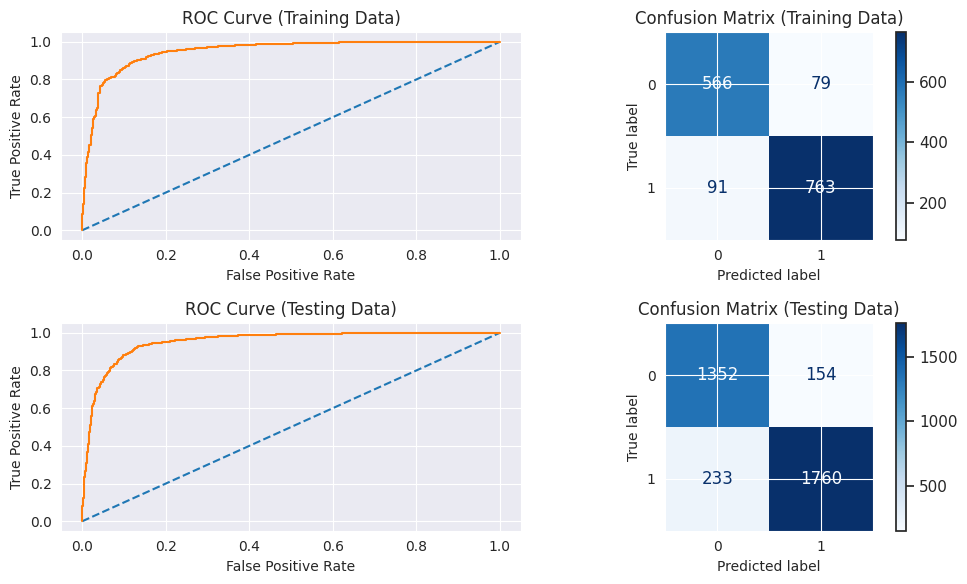

In [68]:
get_metrics_diag(lr_sm)

# Model 2 - Logistic Regression without Smote

In [69]:
# Fit the Logistic Regression model
lr_model = LogisticRegression()
lr_model.fit(X_train, Y_train)

LogisticRegression()

In [70]:
#Using above defined function to get accuracy, recall and precision on train and test set
lr_model_score = get_metrics_score(lr_model)

Accuracy on training set :  0.886
Accuracy on test set :  0.894
Recall on training set :  0.91
Recall on test set :  0.906
Precision on training set :  0.892
Precision on test set :  0.907
F1 on training set :  0.901
F1 on test set :  0.907
AUC-ROC on training set:  0.949
AUC-ROC on test set:  0.953

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.88      0.85      0.87       645
           1       0.89      0.91      0.90       854

    accuracy                           0.89      1499
   macro avg       0.88      0.88      0.88      1499
weighted avg       0.89      0.89      0.89      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1506
           1       0.91      0.91      0.91      1993

    accuracy                           0.89      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg       


AUC & ROC Graph of Training Data

Area under the curve: 0.949

AUC & ROC Graph of Testing Data

Area under the curve: 0.953


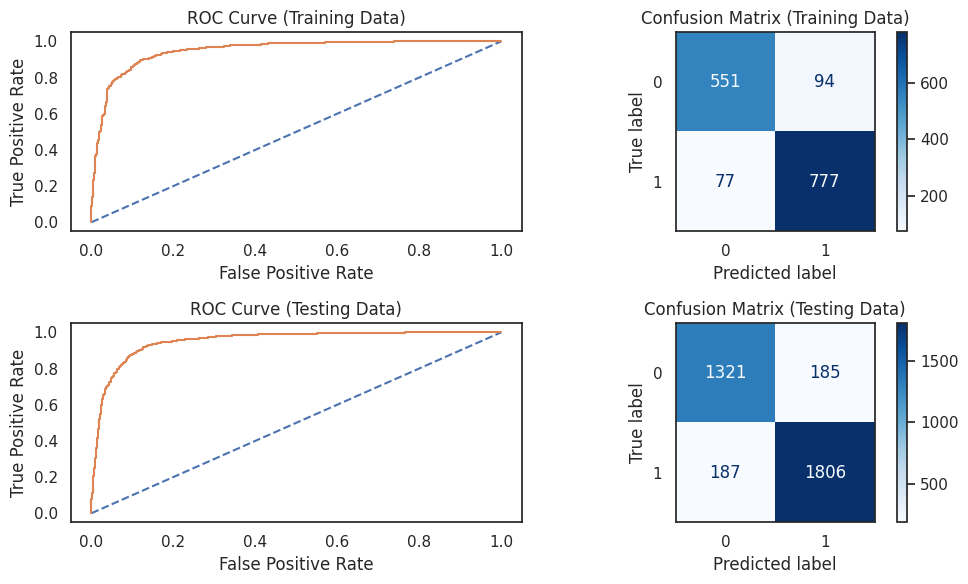

In [71]:
get_metrics_diag(lr_model)

# Model 3 Applying GridSearchCV for Logistic Regression

In [72]:
param_grid={'penalty':['l1','l2','none'],
      'solver':['lbfgs', 'liblinear'],
      'tol':[0.0001,0.001,0.01]}

In [73]:
model = LogisticRegression(max_iter=100000,n_jobs=2)

In [74]:
grid_search_lr = GridSearchCV(estimator = model, param_grid = param_grid, cv = 3,n_jobs=-1,scoring='f1')

In [75]:
grid_search_lr.fit(X_train, Y_train)

/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 2.
  

GridSearchCV(cv=3, estimator=LogisticRegression(max_iter=100000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l1', 'l2', 'none'],
                         'solver': ['lbfgs', 'liblinear'],
                         'tol': [0.0001, 0.001, 0.01]},
             scoring='f1')

In [76]:
print(grid_search_lr.best_params_,'\n')
print(grid_search_lr.best_estimator_)

{'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001} 

LogisticRegression(max_iter=100000, n_jobs=2)


In [77]:
best_model_lr = grid_search_lr.best_estimator_
best_model_lr

LogisticRegression(max_iter=100000, n_jobs=2)

In [78]:
#Using above defined function to get accuracy, recall and precision on train and test set
best_model_lr_score=get_metrics_score(best_model_lr)

Accuracy on training set :  0.886
Accuracy on test set :  0.894
Recall on training set :  0.91
Recall on test set :  0.906
Precision on training set :  0.892
Precision on test set :  0.907
F1 on training set :  0.901
F1 on test set :  0.907
AUC-ROC on training set:  0.949
AUC-ROC on test set:  0.953

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.88      0.85      0.87       645
           1       0.89      0.91      0.90       854

    accuracy                           0.89      1499
   macro avg       0.88      0.88      0.88      1499
weighted avg       0.89      0.89      0.89      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1506
           1       0.91      0.91      0.91      1993

    accuracy                           0.89      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg       


AUC & ROC Graph of Training Data

Area under the curve: 0.949

AUC & ROC Graph of Testing Data

Area under the curve: 0.953


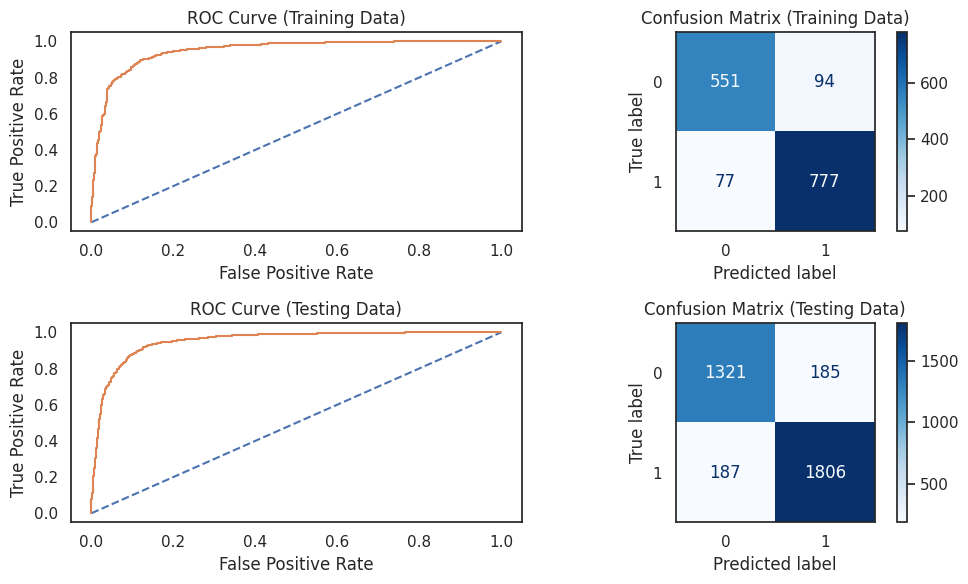

In [79]:
get_metrics_diag(best_model_lr)

# Model 4 - Linear Discriminant Analysis

In [80]:
#Build LDA Model
lda_model = LinearDiscriminantAnalysis()
lda_model=lda_model.fit(X_train,Y_train)

In [81]:
#Using above defined function to get accuracy, recall and precision on train and test set
lda_model_score = get_metrics_score(lda_model)

Accuracy on training set :  0.883
Accuracy on test set :  0.895
Recall on training set :  0.899
Recall on test set :  0.902
Precision on training set :  0.895
Precision on test set :  0.913
F1 on training set :  0.897
F1 on test set :  0.908
AUC-ROC on training set:  0.947
AUC-ROC on test set:  0.951

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.87      0.86      0.86       645
           1       0.90      0.90      0.90       854

    accuracy                           0.88      1499
   macro avg       0.88      0.88      0.88      1499
weighted avg       0.88      0.88      0.88      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      1506
           1       0.91      0.90      0.91      1993

    accuracy                           0.90      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg      


AUC & ROC Graph of Training Data

Area under the curve: 0.947

AUC & ROC Graph of Testing Data

Area under the curve: 0.951


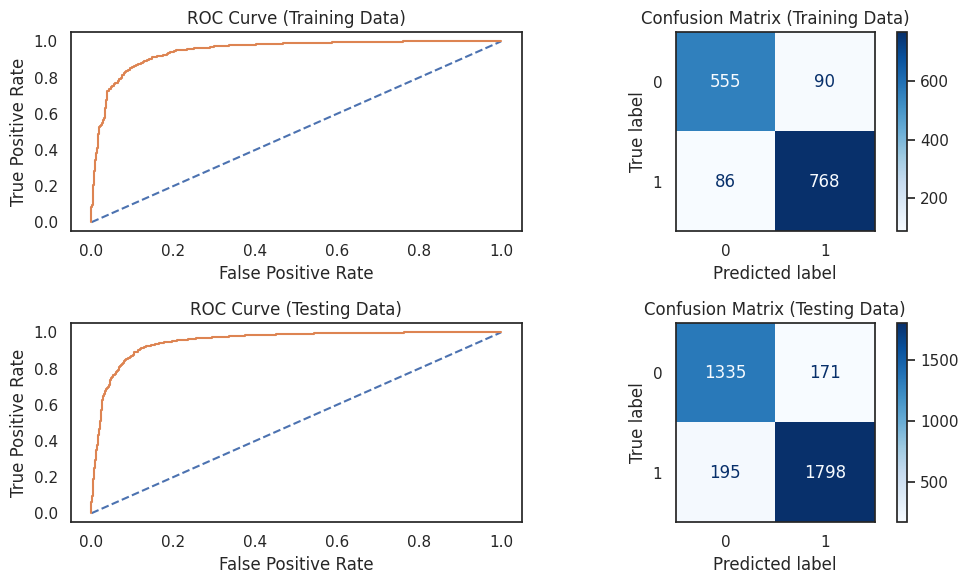

In [82]:
get_metrics_diag(lda_model)

# Model 5 - AdaBoost Classifier

In [65]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier

In [66]:
AdaBoost = AdaBoostClassifier(random_state=1)
AdaBoost.fit(X_train,Y_train)

AdaBoostClassifier(random_state=1)

In [67]:
#Using above defined function to get accuracy, recall and precision on train and test set
AdaBoost_score=get_metrics_score(AdaBoost)

Accuracy on training set :  0.909
Accuracy on test set :  0.893
Recall on training set :  0.92
Recall on test set :  0.903
Precision on training set :  0.919
Precision on test set :  0.909
F1 on training set :  0.92
F1 on test set :  0.906
AUC-ROC on training set:  0.973
AUC-ROC on test set:  0.959

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       645
           1       0.92      0.92      0.92       854

    accuracy                           0.91      1499
   macro avg       0.91      0.91      0.91      1499
weighted avg       0.91      0.91      0.91      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.87      0.88      0.88      1506
           1       0.91      0.90      0.91      1993

    accuracy                           0.89      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg       0


AUC & ROC Graph of Training Data

Area under the curve: 0.973

AUC & ROC Graph of Testing Data

Area under the curve: 0.959


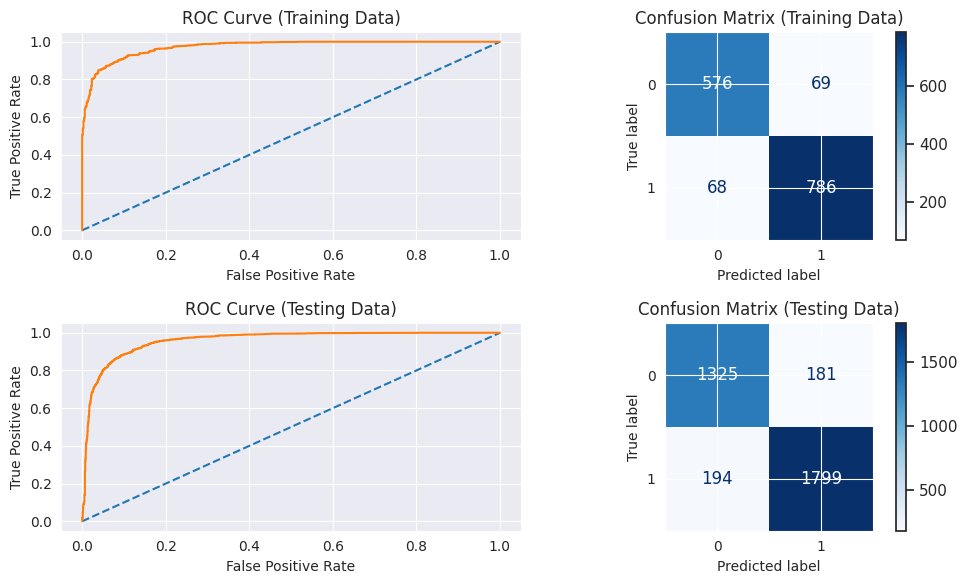

In [68]:
get_metrics_diag(AdaBoost)

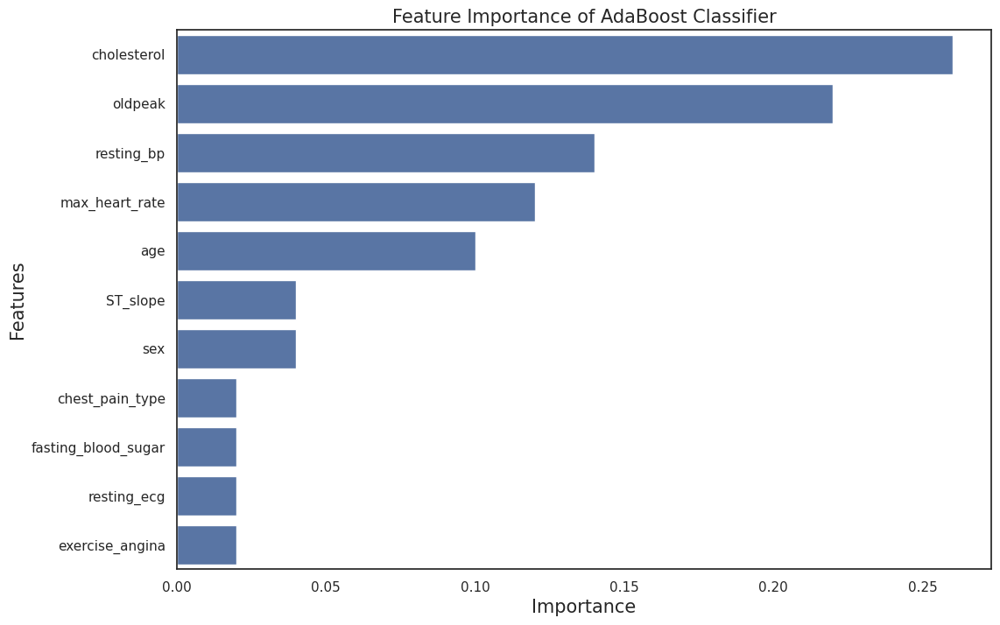

In [69]:
important_features = pd.DataFrame({'Features': X.columns, 
                                   'Importance': AdaBoost.feature_importances_})

important_features = important_features.sort_values('Importance', ascending = False)

plt.figure(figsize=(12,8))
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

plt.title('Feature Importance of AdaBoost Classifier', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

plt.show()

# Model 6 - Gradient Boost Classifier

In [71]:
GradientBoost = GradientBoostingClassifier(random_state=1)
GradientBoost.fit(X_train,Y_train)

GradientBoostingClassifier(random_state=1)

In [72]:
#Using above defined function to get accuracy, recall and precision on train and test set
GradientBoost_score=get_metrics_score(GradientBoost)

Accuracy on training set :  0.932
Accuracy on test set :  0.912
Recall on training set :  0.941
Recall on test set :  0.928
Precision on training set :  0.939
Precision on test set :  0.918
F1 on training set :  0.94
F1 on test set :  0.923
AUC-ROC on training set:  0.985
AUC-ROC on test set:  0.972

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.92      0.92      0.92       645
           1       0.94      0.94      0.94       854

    accuracy                           0.93      1499
   macro avg       0.93      0.93      0.93      1499
weighted avg       0.93      0.93      0.93      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.90      0.89      0.90      1506
           1       0.92      0.93      0.92      1993

    accuracy                           0.91      3499
   macro avg       0.91      0.91      0.91      3499
weighted avg       


AUC & ROC Graph of Training Data

Area under the curve: 0.985

AUC & ROC Graph of Testing Data

Area under the curve: 0.972


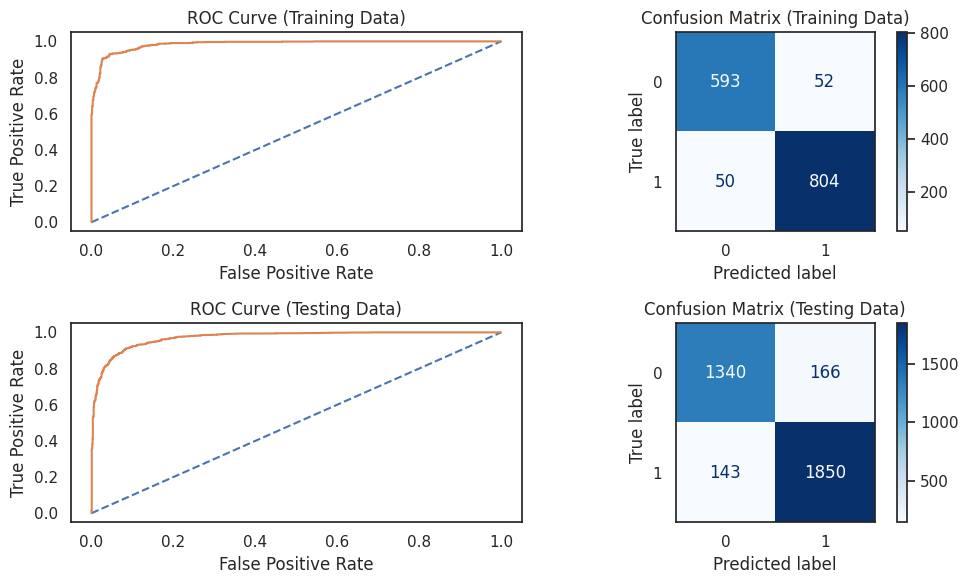

In [73]:
get_metrics_diag(GradientBoost)

# XAI Testing

In [1]:
# Note: All the below code in the XAi Testing are for testing purposes only. The actual working module is present in the streamlit code file.

## Installing and Importing required libraries and packages

# Model 7 - XGBoost Classifier

In [91]:
from xgboost import XGBClassifier

In [92]:
xgb = XGBClassifier(random_state=1)
xgb.fit(X_train,Y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

In [93]:
#Using above defined function to get accuracy, recall and precision on train and test set
xgb_score=get_metrics_score(xgb)

Accuracy on training set :  1.0
Accuracy on test set :  0.904
Recall on training set :  1.0
Recall on test set :  0.921
Precision on training set :  1.0
Precision on test set :  0.911
F1 on training set :  1.0
F1 on test set :  0.916
AUC-ROC on training set:  1.0
AUC-ROC on test set:  0.966

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       645
           1       1.00      1.00      1.00       854

    accuracy                           1.00      1499
   macro avg       1.00      1.00      1.00      1499
weighted avg       1.00      1.00      1.00      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.89      0.88      0.89      1506
           1       0.91      0.92      0.92      1993

    accuracy                           0.90      3499
   macro avg       0.90      0.90      0.90      3499
weighted avg       0.90     


AUC & ROC Graph of Training Data

Area under the curve: 1.000

AUC & ROC Graph of Testing Data

Area under the curve: 0.966


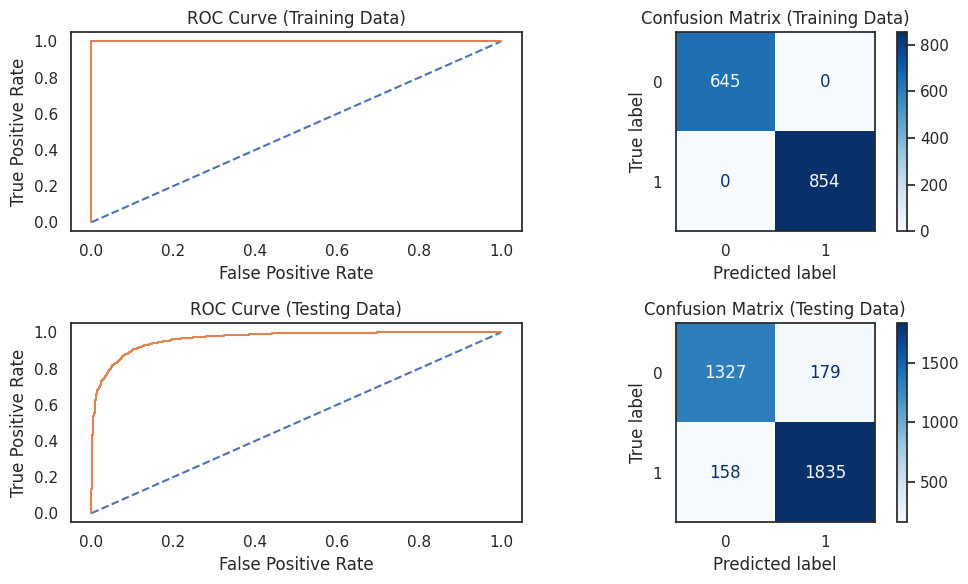

In [94]:
get_metrics_diag(xgb)

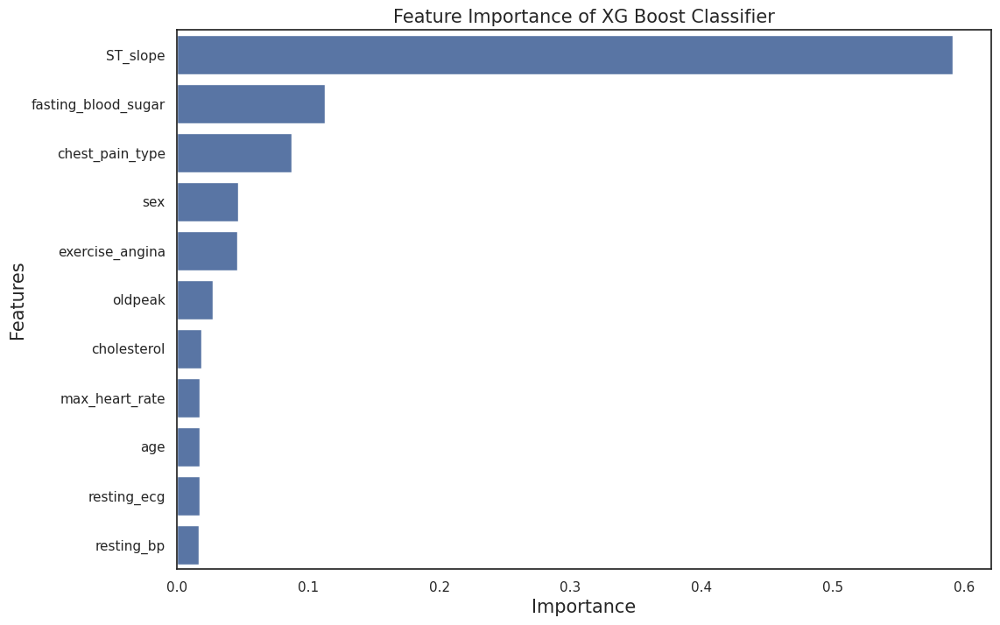

In [95]:
important_features = pd.DataFrame({'Features': X.columns, 
                                   'Importance': xgb.feature_importances_})

important_features = important_features.sort_values('Importance', ascending = False)

plt.figure(figsize=(12,8))
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

plt.title('Feature Importance of XG Boost Classifier', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

plt.show()

# Model 8 - Hyperparameter Tuned XGBoost Classifier 

In [96]:
param_grid={'learning_rate':[0.1,0.05,0.2],
      'n_estimators':[1000,2000],
      'max_depth':[5,7,9]}

xgb = XGBClassifier(random_state=1)

In [97]:
grid_search_xgb = GridSearchCV(estimator = xgb, param_grid = param_grid, cv = 3,n_jobs=-1,scoring='f1')

In [98]:
grid_search_xgb.fit(X_train, Y_train)

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=1, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.05, 0.2],
                         'max_depth': [5, 7, 9], 'n_estimators': [1000, 2000]},
             scoring='f1')

In [99]:
print(grid_search_xgb.best_params_,'\n')
print(grid_search_xgb.best_estimator_)

{'learning_rate': 0.2, 'max_depth': 9, 'n_estimators': 1000} 

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)


In [100]:
best_model_xgb = grid_search_xgb.best_estimator_
best_model_xgb

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=1000, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

In [101]:
#Using above defined function to get accuracy, recall and precision on train and test set
best_model_xgb_score=get_metrics_score(best_model_xgb)

Accuracy on training set :  1.0
Accuracy on test set :  0.904
Recall on training set :  1.0
Recall on test set :  0.92
Precision on training set :  1.0
Precision on test set :  0.912
F1 on training set :  1.0
F1 on test set :  0.916
AUC-ROC on training set:  1.0
AUC-ROC on test set:  0.965

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       645
           1       1.00      1.00      1.00       854

    accuracy                           1.00      1499
   macro avg       1.00      1.00      1.00      1499
weighted avg       1.00      1.00      1.00      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.89      0.88      0.89      1506
           1       0.91      0.92      0.92      1993

    accuracy                           0.90      3499
   macro avg       0.90      0.90      0.90      3499
weighted avg       0.90      


AUC & ROC Graph of Training Data

Area under the curve: 1.000

AUC & ROC Graph of Testing Data

Area under the curve: 0.965


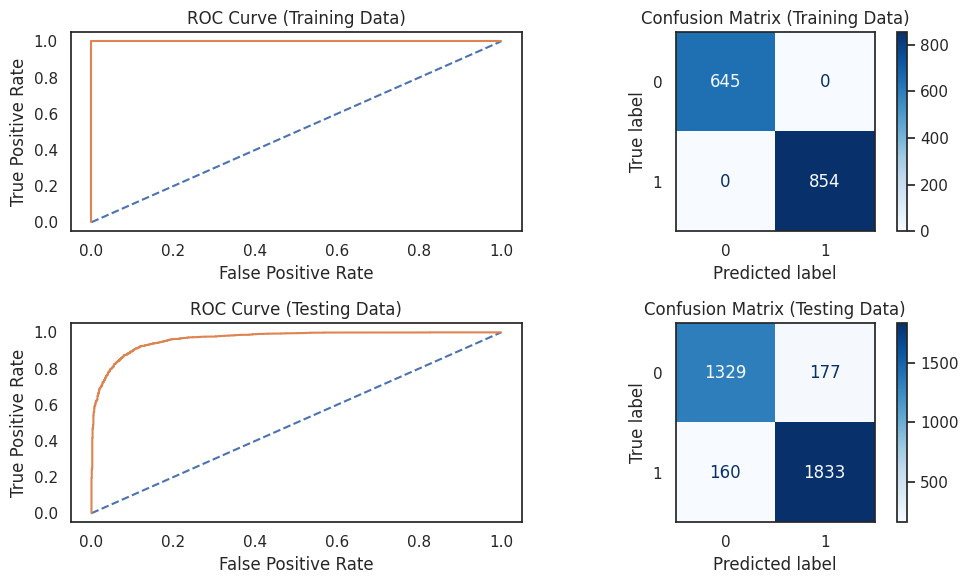

In [102]:
get_metrics_diag(best_model_xgb)

# Model 9 - Hyperparameter Tuned AdaBoost Classifier 

In [103]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

In [104]:
# Define the AdaBoost classifier
AdaBoost_tuned = AdaBoostClassifier(random_state=1, algorithm='SAMME')

# Define the parameter grid
param_grid = {
    "estimator": [DecisionTreeClassifier(max_depth=10),
                  DecisionTreeClassifier(max_depth=20),
                  DecisionTreeClassifier(max_depth=30)],
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": np.arange(0.1, 2, 0.1)
}

# Run the grid search
grid_search_ada = GridSearchCV(estimator=AdaBoost_tuned, param_grid=param_grid, cv=3, n_jobs=-1, scoring='f1')
grid_search_ada.fit(X_train, Y_train)

# Display the best parameters
print("Best parameters found: ", grid_search_ada.best_params_)
print("Best F1 score: ", grid_search_ada.best_score_)


Best parameters found:  {'estimator': DecisionTreeClassifier(max_depth=10), 'learning_rate': 1.5000000000000002, 'n_estimators': 50}
Best F1 score:  0.9013578529254521


In [105]:
print(grid_search_ada.best_params_,'\n')
print(grid_search_ada.best_estimator_)

{'estimator': DecisionTreeClassifier(max_depth=10), 'learning_rate': 1.5000000000000002, 'n_estimators': 50} 

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=10),
                   learning_rate=1.5000000000000002, random_state=1)


In [106]:
best_model_AdaBoost = grid_search_ada.best_estimator_
best_model_AdaBoost

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=10),
                   learning_rate=1.5000000000000002, random_state=1)

In [107]:
best_model_AdaBoost.fit(X_train, Y_train)

AdaBoostClassifier(algorithm='SAMME',
                   estimator=DecisionTreeClassifier(max_depth=10),
                   learning_rate=1.5000000000000002, random_state=1)

In [108]:
#Using above defined function to get accuracy, recall and precision on train and test set
best_model_AdaBoost_score=get_metrics_score(best_model_AdaBoost)

Accuracy on training set :  1.0
Accuracy on test set :  0.893
Recall on training set :  1.0
Recall on test set :  0.915
Precision on training set :  1.0
Precision on test set :  0.9
F1 on training set :  1.0
F1 on test set :  0.907
AUC-ROC on training set:  1.0
AUC-ROC on test set:  0.958

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       645
           1       1.00      1.00      1.00       854

    accuracy                           1.00      1499
   macro avg       1.00      1.00      1.00      1499
weighted avg       1.00      1.00      1.00      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.88      0.87      0.87      1506
           1       0.90      0.91      0.91      1993

    accuracy                           0.89      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg       0.89      0


AUC & ROC Graph of Training Data

Area under the curve: 1.000

AUC & ROC Graph of Testing Data

Area under the curve: 0.958


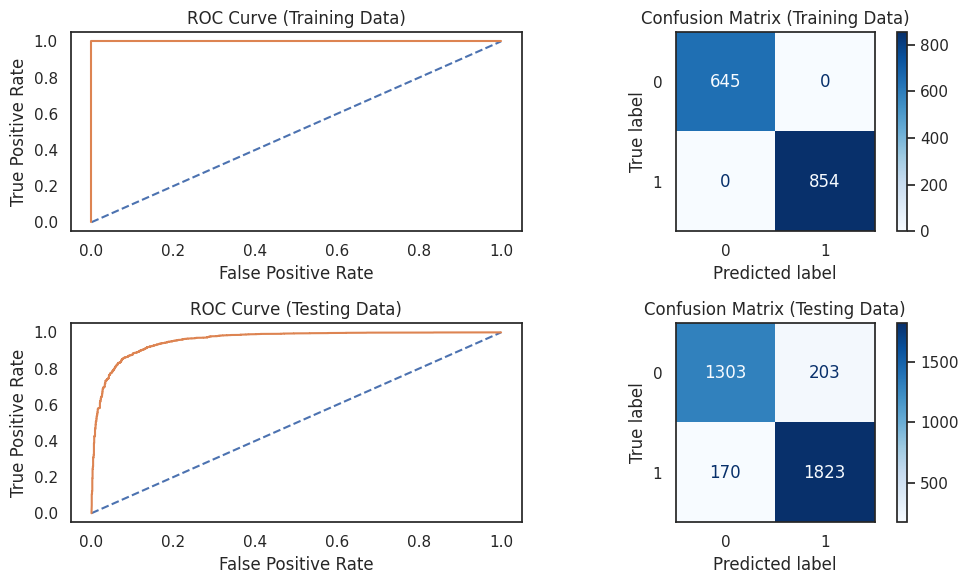

In [109]:
get_metrics_diag(best_model_AdaBoost)

# Model 10 - Hyperparameter Tuned Gradient Boosting Classifier

In [110]:
param_grid={
    'learning_rate': [0.1, 0.05, 0.01],
    'max_depth': [4,5,7],
    'n_estimators': [50, 100, 150],
    'max_features': [4,5,6],
    'min_samples_leaf': [12,15,17],
    'min_samples_split': [30,50,70]
}

GradientBoost = GradientBoostingClassifier(random_state=1)

In [111]:
grid_search_gb = GridSearchCV(estimator = GradientBoost, param_grid = param_grid, cv = 3,n_jobs=-1,scoring='f1')

In [112]:
grid_search_gb.fit(X_train, Y_train)

GridSearchCV(cv=3, estimator=GradientBoostingClassifier(random_state=1),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.05, 0.01],
                         'max_depth': [4, 5, 7], 'max_features': [4, 5, 6],
                         'min_samples_leaf': [12, 15, 17],
                         'min_samples_split': [30, 50, 70],
                         'n_estimators': [50, 100, 150]},
             scoring='f1')

In [113]:
print(grid_search_gb.best_params_,'\n')
print(grid_search_gb.best_estimator_)

{'learning_rate': 0.05, 'max_depth': 4, 'max_features': 4, 'min_samples_leaf': 15, 'min_samples_split': 70, 'n_estimators': 100} 

GradientBoostingClassifier(learning_rate=0.05, max_depth=4, max_features=4,
                           min_samples_leaf=15, min_samples_split=70,
                           random_state=1)


In [114]:
best_model_GradientBoost = grid_search_gb.best_estimator_
best_model_GradientBoost

GradientBoostingClassifier(learning_rate=0.05, max_depth=4, max_features=4,
                           min_samples_leaf=15, min_samples_split=70,
                           random_state=1)

In [115]:
best_model_GradientBoost.fit(X_train, Y_train)

GradientBoostingClassifier(learning_rate=0.05, max_depth=4, max_features=4,
                           min_samples_leaf=15, min_samples_split=70,
                           random_state=1)

In [116]:
#Using above defined function to get accuracy, recall and precision on train and test set
best_model_GradientBoost_score=get_metrics_score(best_model_GradientBoost)

Accuracy on training set :  0.923
Accuracy on test set :  0.913
Recall on training set :  0.937
Recall on test set :  0.932
Precision on training set :  0.928
Precision on test set :  0.916
F1 on training set :  0.932
F1 on test set :  0.924
AUC-ROC on training set:  0.98
AUC-ROC on test set:  0.972

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       645
           1       0.93      0.94      0.93       854

    accuracy                           0.92      1499
   macro avg       0.92      0.92      0.92      1499
weighted avg       0.92      0.92      0.92      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1506
           1       0.92      0.93      0.92      1993

    accuracy                           0.91      3499
   macro avg       0.91      0.91      0.91      3499
weighted avg       


AUC & ROC Graph of Training Data

Area under the curve: 0.980

AUC & ROC Graph of Testing Data

Area under the curve: 0.972


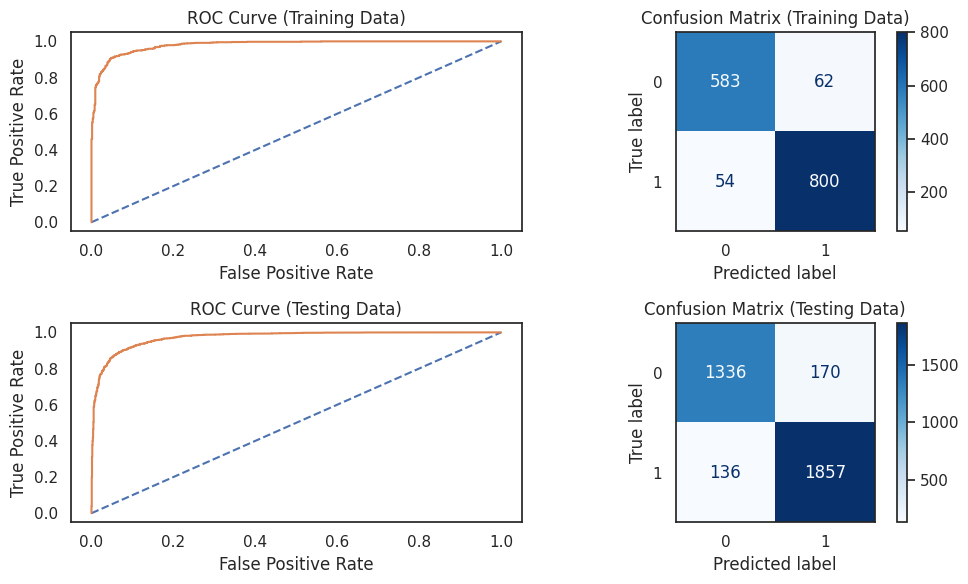

In [117]:
get_metrics_diag(best_model_GradientBoost)

# Model 11 - Random Forest

In [118]:
from sklearn.ensemble import RandomForestClassifier

In [119]:
rf =  RandomForestClassifier(random_state = 1)
rf.fit(X_train, Y_train)

RandomForestClassifier(random_state=1)

In [120]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_score=get_metrics_score(rf)

Accuracy on training set :  1.0
Accuracy on test set :  0.913
Recall on training set :  1.0
Recall on test set :  0.938
Precision on training set :  1.0
Precision on test set :  0.912
F1 on training set :  1.0
F1 on test set :  0.925
AUC-ROC on training set:  1.0
AUC-ROC on test set:  0.968

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       645
           1       1.00      1.00      1.00       854

    accuracy                           1.00      1499
   macro avg       1.00      1.00      1.00      1499
weighted avg       1.00      1.00      1.00      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.91      0.88      0.90      1506
           1       0.91      0.94      0.92      1993

    accuracy                           0.91      3499
   macro avg       0.91      0.91      0.91      3499
weighted avg       0.91     


AUC & ROC Graph of Training Data

Area under the curve: 1.000

AUC & ROC Graph of Testing Data

Area under the curve: 0.968


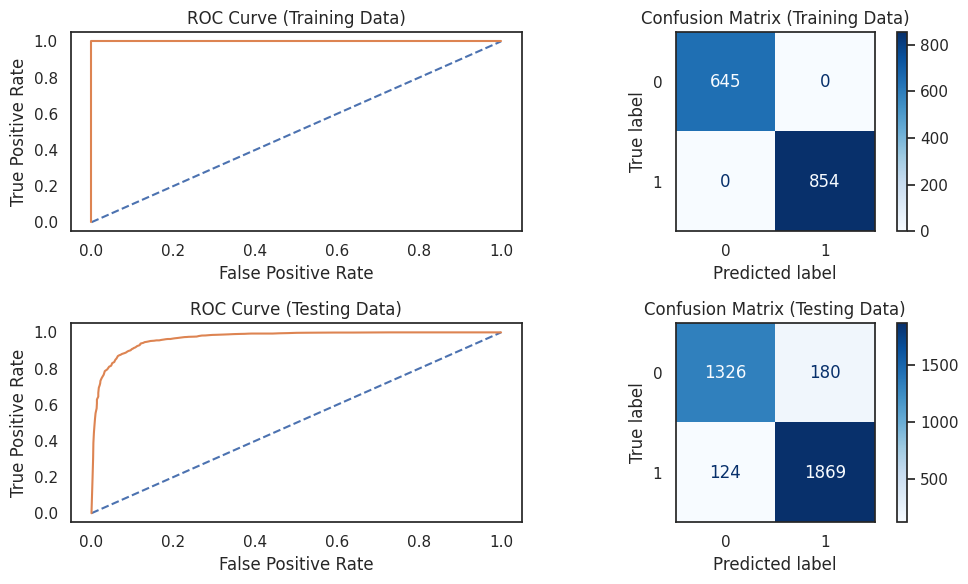

In [121]:
get_metrics_diag(rf)

In [122]:
# important_features = pd.DataFrame({'Features': X_train.columns, 
#                                    'Importance': rf.feature_importances_})

# important_features = important_features.sort_values('Importance', ascending = False)

# plt.figure(figsize=(12,8))
# sns.barplot(x = 'Importance', y = 'Features', data = important_features)

# plt.title('Feature Importance of Random Forest Classifier', fontsize = 15)
# plt.xlabel('Importance', fontsize = 15)
# plt.ylabel('Features', fontsize = 15)

# plt.show()

# Model 12 - Random Forest Tuned

In [123]:
param_grid_rfcl = {
    'max_depth': [7,8,9],
    'max_features': ["sqrt", "log2"],
    'min_samples_leaf': [12,15,17],
    'min_samples_split': [30,50,70],
    'n_estimators': [100,200,300],
    'criterion': ['gini','entropy']
}

rfcl = RandomForestClassifier(random_state=1)
grid_search_rfcl= GridSearchCV(estimator = rfcl, param_grid = param_grid_rfcl,cv=5, scoring='f1', n_jobs=-1)

In [124]:
grid_search_rfcl.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [7, 8, 9],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [12, 15, 17],
                         'min_samples_split': [30, 50, 70],
                         'n_estimators': [100, 200, 300]},
             scoring='f1')

In [125]:
print(grid_search_rfcl.best_params_,'\n')
print(grid_search_rfcl.best_estimator_)

{'criterion': 'entropy', 'max_depth': 7, 'max_features': 'sqrt', 'min_samples_leaf': 12, 'min_samples_split': 70, 'n_estimators': 300} 

RandomForestClassifier(criterion='entropy', max_depth=7, min_samples_leaf=12,
                       min_samples_split=70, n_estimators=300, random_state=1)


In [126]:
grid_search_rfcl.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=7, min_samples_leaf=12,
                       min_samples_split=70, n_estimators=300, random_state=1)

In [127]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_tuned_score=get_metrics_score(grid_search_rfcl)

Accuracy on training set :  0.915
Accuracy on test set :  0.918
Recall on training set :  0.937
Recall on test set :  0.938
Precision on training set :  0.895
Precision on test set :  0.898
F1 on training set :  0.915
F1 on test set :  0.918
AUC-ROC on training set:  0.966
AUC-ROC on test set:  0.965

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.91      0.85      0.88       645
           1       0.89      0.94      0.92       854

    accuracy                           0.90      1499
   macro avg       0.90      0.90      0.90      1499
weighted avg       0.90      0.90      0.90      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.91      0.86      0.89      1506
           1       0.90      0.94      0.92      1993

    accuracy                           0.90      3499
   macro avg       0.91      0.90      0.90      3499
weighted avg      


AUC & ROC Graph of Training Data

Area under the curve: 0.966

AUC & ROC Graph of Testing Data

Area under the curve: 0.965


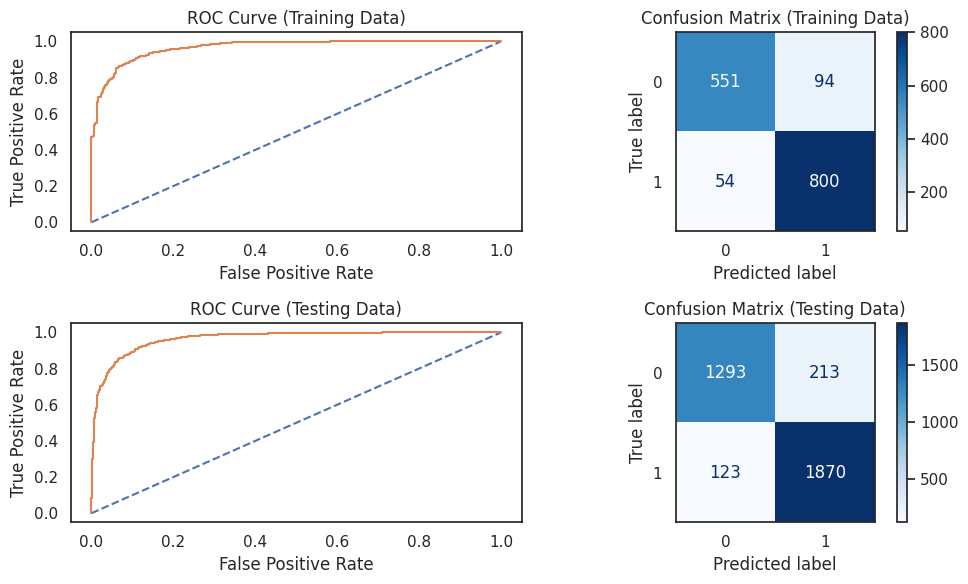

In [128]:
get_metrics_diag(grid_search_rfcl)

# Model 12 - ANN Model

In [129]:
from sklearn.neural_network import MLPClassifier

In [130]:
ANN = MLPClassifier()
ANN.fit(X_train, Y_train)

MLPClassifier()

In [131]:
#Using above defined function to get accuracy, recall and precision on train and test set
best_model_ANN_score=get_metrics_score(ANN)


Accuracy on training set :  0.895
Accuracy on test set :  0.897
Recall on training set :  0.923
Recall on test set :  0.913
Precision on training set :  0.895
Precision on test set :  0.907
F1 on training set :  0.909
F1 on test set :  0.91
AUC-ROC on training set:  0.962
AUC-ROC on test set:  0.962

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       645
           1       0.90      0.92      0.91       854

    accuracy                           0.89      1499
   macro avg       0.89      0.89      0.89      1499
weighted avg       0.89      0.89      0.89      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.88      0.88      0.88      1506
           1       0.91      0.91      0.91      1993

    accuracy                           0.90      3499
   macro avg       0.90      0.89      0.89      3499
weighted avg       


AUC & ROC Graph of Training Data

Area under the curve: 0.962

AUC & ROC Graph of Testing Data

Area under the curve: 0.962


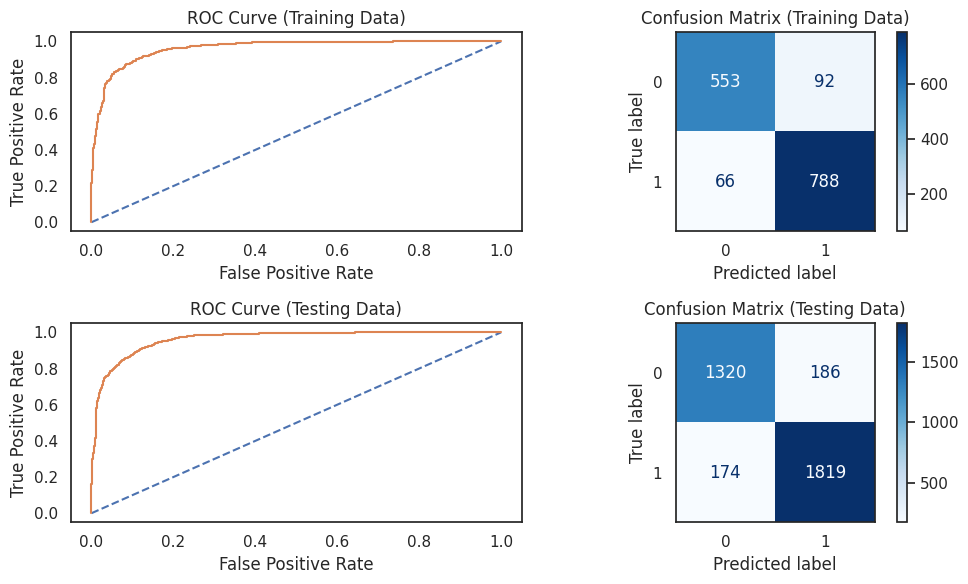

In [132]:
get_metrics_diag(ANN)

# Model 13 - ANN Model Tuned

In [133]:
param_grid_ann = {
    'hidden_layer_sizes': [100],
    'activation': ['logistic', 'tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.001, 0.01],
    'learning_rate': ['constant', 'adaptive'],
}

ANN_tuned = MLPClassifier(max_iter=5000,verbose=True,  random_state=1)

In [134]:
grid_search_ann= GridSearchCV(estimator = ANN_tuned, param_grid = param_grid_ann,cv=5, scoring='f1', n_jobs=-1)
grid_search_ann.fit(X_train,Y_train)

Iteration 1, loss = 0.68604566
Iteration 2, loss = 0.68365687
Iteration 3, loss = 0.68131732
Iteration 4, loss = 0.68019449
Iteration 5, loss = 0.67906560
Iteration 6, loss = 0.67870863
Iteration 7, loss = 0.67847645
Iteration 8, loss = 0.67829981
Iteration 9, loss = 0.67814175
Iteration 10, loss = 0.67794656
Iteration 11, loss = 0.67790909
Iteration 12, loss = 0.67759092
Iteration 13, loss = 0.67737937
Iteration 14, loss = 0.67719271
Iteration 15, loss = 0.67703659
Iteration 16, loss = 0.67681110
Iteration 17, loss = 0.67673055
Iteration 18, loss = 0.67646352
Iteration 19, loss = 0.67625653
Iteration 20, loss = 0.67612861
Iteration 21, loss = 0.67598404
Iteration 22, loss = 0.67570706
Iteration 23, loss = 0.67551785
Iteration 24, loss = 0.67532523
Iteration 25, loss = 0.67515136
Iteration 26, loss = 0.67496799
Iteration 27, loss = 0.67478369
Iteration 28, loss = 0.67457298
Iteration 29, loss = 0.67442296
Iteration 30, loss = 0.67430992
Iteration 31, loss = 0.67403903
Iteration 32, los

GridSearchCV(cv=5,
             estimator=MLPClassifier(max_iter=5000, random_state=1,
                                     verbose=True),
             n_jobs=-1,
             param_grid={'activation': ['logistic', 'tanh', 'relu'],
                         'alpha': [0.001, 0.01], 'hidden_layer_sizes': [100],
                         'learning_rate': ['constant', 'adaptive'],
                         'solver': ['sgd', 'adam']},
             scoring='f1')

In [135]:
print(grid_search_ann.best_params_,'\n')
print(grid_search_ann.best_estimator_)

{'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': 100, 'learning_rate': 'constant', 'solver': 'adam'} 

MLPClassifier(alpha=0.001, hidden_layer_sizes=100, max_iter=5000,
              random_state=1, verbose=True)


In [136]:
grid_search_ann

GridSearchCV(cv=5,
             estimator=MLPClassifier(max_iter=5000, random_state=1,
                                     verbose=True),
             n_jobs=-1,
             param_grid={'activation': ['logistic', 'tanh', 'relu'],
                         'alpha': [0.001, 0.01], 'hidden_layer_sizes': [100],
                         'learning_rate': ['constant', 'adaptive'],
                         'solver': ['sgd', 'adam']},
             scoring='f1')

In [137]:
grid_search_ann.best_estimator_

MLPClassifier(alpha=0.001, hidden_layer_sizes=100, max_iter=5000,
              random_state=1, verbose=True)

In [138]:
#Using above defined function to get accuracy, recall and precision on train and test set
ann_tuned_score=get_metrics_score(grid_search_ann)

Accuracy on training set :  0.928
Accuracy on test set :  0.91
Recall on training set :  0.931
Recall on test set :  0.914
Precision on training set :  0.925
Precision on test set :  0.906
F1 on training set :  0.928
F1 on test set :  0.91
AUC-ROC on training set:  0.974
AUC-ROC on test set:  0.963

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.91      0.90      0.90       645
           1       0.93      0.93      0.93       854

    accuracy                           0.92      1499
   macro avg       0.92      0.92      0.92      1499
weighted avg       0.92      0.92      0.92      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      1506
           1       0.91      0.91      0.91      1993

    accuracy                           0.90      3499
   macro avg       0.90      0.89      0.89      3499
weighted avg       0


AUC & ROC Graph of Training Data

Area under the curve: 0.974

AUC & ROC Graph of Testing Data

Area under the curve: 0.963


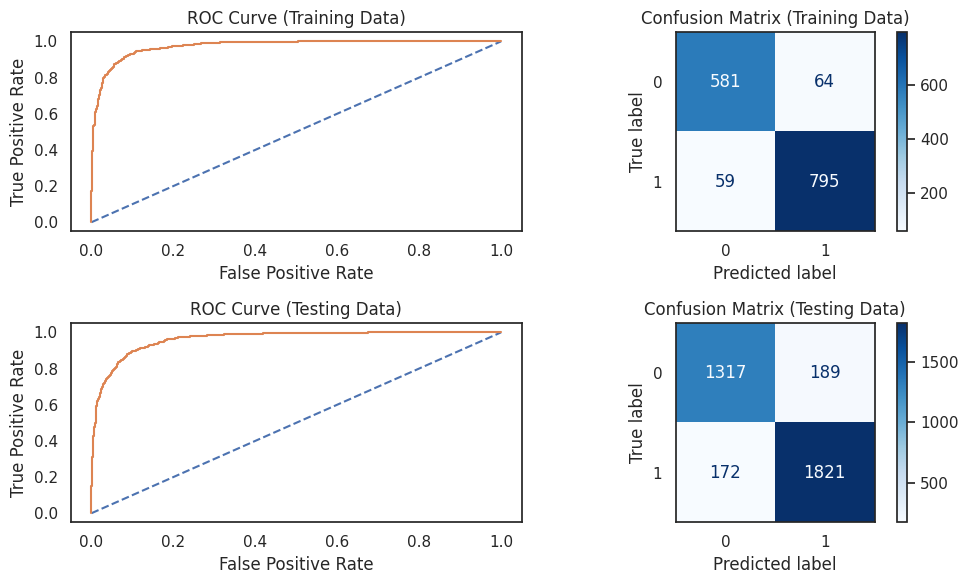

In [139]:
get_metrics_diag(grid_search_ann)

# Model 14 -KNN Model

In [140]:
from sklearn.neighbors import KNeighborsClassifier

In [141]:
KNN = KNeighborsClassifier()

In [142]:
# Fit the model on the training data
KNN.fit(X_train, Y_train)

KNeighborsClassifier()

In [143]:
#Using above defined function to get accuracy, recall and precision on train and test set
KNN_score=get_metrics_score(KNN)

Accuracy on training set :  0.907
Accuracy on test set :  0.888
Recall on training set :  0.925
Recall on test set :  0.902
Precision on training set :  0.913
Precision on test set :  0.901
F1 on training set :  0.919
F1 on test set :  0.901
AUC-ROC on training set:  0.973
AUC-ROC on test set:  0.947

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       645
           1       0.91      0.93      0.92       854

    accuracy                           0.91      1499
   macro avg       0.91      0.90      0.91      1499
weighted avg       0.91      0.91      0.91      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.87      0.87      0.87      1506
           1       0.90      0.90      0.90      1993

    accuracy                           0.89      3499
   macro avg       0.89      0.89      0.89      3499
weighted avg      


AUC & ROC Graph of Training Data

Area under the curve: 0.973

AUC & ROC Graph of Testing Data

Area under the curve: 0.947


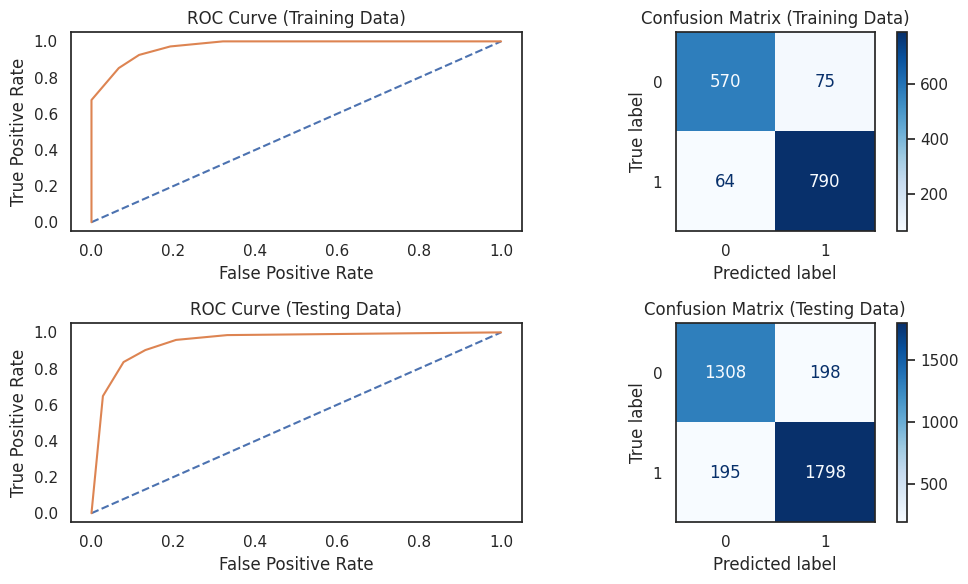

In [144]:
get_metrics_diag(KNN)

# Model 15 -KNN Model Tuned

In [145]:
# Define the KNN classifier
KNN_gs = KNeighborsClassifier()

# Define the parameter grid
KNN_params = {'n_neighbors': [3, 5, 7, 9, 11]}

# Set up the grid search
grid_search_knn = GridSearchCV(estimator=KNN_gs, param_grid=KNN_params, cv=3, n_jobs=-1, scoring='r2')

# Fit the grid search to the training data
grid_search_knn.fit(X_train, Y_train)

# Print the best parameters and score
print(f'Best parameters for KNN: {grid_search_knn.best_params_}')
print(f'Best R2 score for KNN: {grid_search_knn.best_score_}')


Best parameters for KNN: {'n_neighbors': 11}
Best R2 score for KNN: 0.5183414645358893


In [146]:
KNN_tuned = KNeighborsClassifier(n_neighbors= 3)

In [147]:
# Fit the model on the training data
KNN_tuned .fit(X_train, Y_train)

KNeighborsClassifier(n_neighbors=3)

In [148]:
#Using above defined function to get accuracy, recall and precision on train and test set
tuned_KNN_score=get_metrics_score(KNN_tuned)

Accuracy on training set :  0.921
Accuracy on test set :  0.883
Recall on training set :  0.938
Recall on test set :  0.9
Precision on training set :  0.924
Precision on test set :  0.895
F1 on training set :  0.931
F1 on test set :  0.898
AUC-ROC on training set:  0.981
AUC-ROC on test set:  0.936

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       645
           1       0.92      0.94      0.93       854

    accuracy                           0.92      1499
   macro avg       0.92      0.92      0.92      1499
weighted avg       0.92      0.92      0.92      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.87      0.86      0.86      1506
           1       0.90      0.90      0.90      1993

    accuracy                           0.88      3499
   macro avg       0.88      0.88      0.88      3499
weighted avg       0


AUC & ROC Graph of Training Data

Area under the curve: 0.981

AUC & ROC Graph of Testing Data

Area under the curve: 0.936


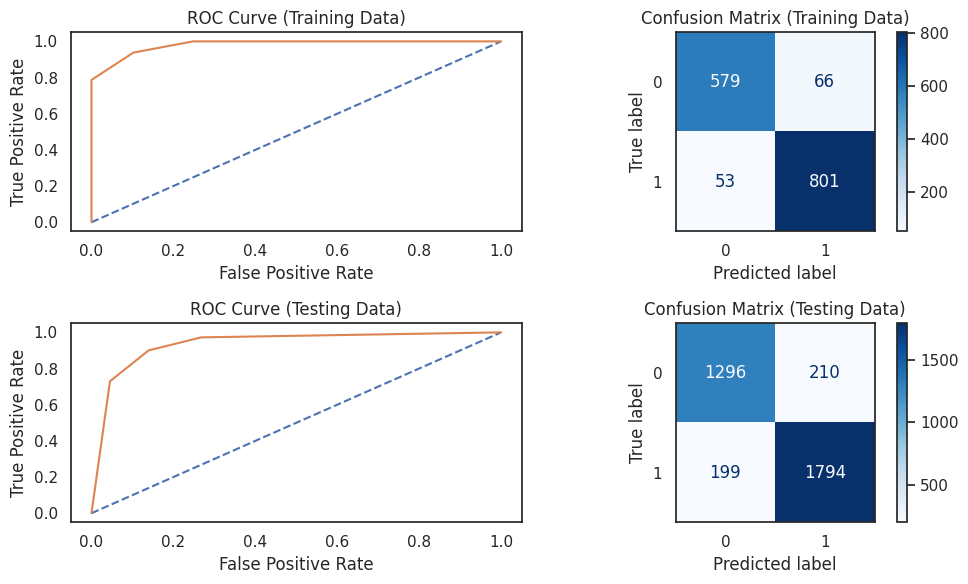

In [149]:
get_metrics_diag(KNN_tuned)

# Model 16 -Bagging with Decision Tree as base estimator

In [150]:
from sklearn.ensemble import BaggingClassifier

In [151]:
# Define the Bagging classifier with DecisionTree as the base estimator
Bagging_model = BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=100, random_state=1)

# Fit the Bagging model to the training data
Bagging_model.fit(X_train, Y_train)

# Evaluate the model
print("Training accuracy:", Bagging_model.score(X_train, Y_train))
print("Testing accuracy:", Bagging_model.score(X_test, Y_test))


Training accuracy: 1.0
Testing accuracy: 0.8999714204058302


In [152]:
Bagging_model.fit(X_train,Y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=100,
                  random_state=1)

In [153]:
#Using above defined function to get accuracy, recall and precision on train and test set
Bagging_score=get_metrics_score(Bagging_model)

Accuracy on training set :  1.0
Accuracy on test set :  0.9
Recall on training set :  1.0
Recall on test set :  0.914
Precision on training set :  1.0
Precision on test set :  0.911
F1 on training set :  1.0
F1 on test set :  0.912
AUC-ROC on training set:  1.0
AUC-ROC on test set:  0.962

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       645
           1       1.00      1.00      1.00       854

    accuracy                           1.00      1499
   macro avg       1.00      1.00      1.00      1499
weighted avg       1.00      1.00      1.00      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.89      0.88      0.88      1506
           1       0.91      0.91      0.91      1993

    accuracy                           0.90      3499
   macro avg       0.90      0.90      0.90      3499
weighted avg       0.90      0


AUC & ROC Graph of Training Data

Area under the curve: 1.000

AUC & ROC Graph of Testing Data

Area under the curve: 0.962


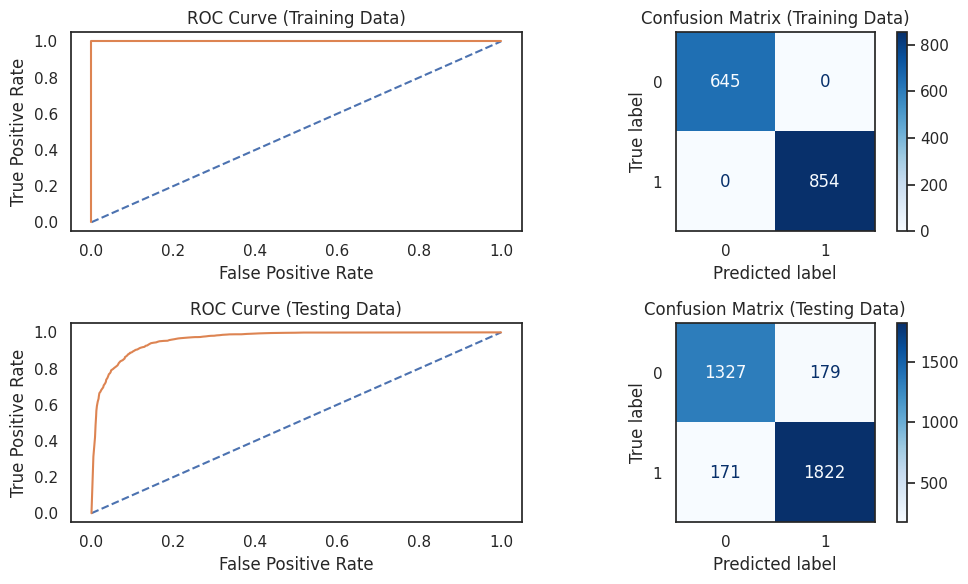

In [154]:
get_metrics_diag(Bagging_model)

# Model 17 - Base LightGBM Model

In [155]:
!pip install lightgbm

In [156]:
# Importing LightGBM library
from lightgbm import LGBMClassifier

# Initializing the base LightGBM model
lightgbm_base = LGBMClassifier(random_state=1)

# Fitting the base model
lightgbm_base.fit(X_train, Y_train)

[LightGBM] [Info] Number of positive: 854, number of negative: 645
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000179 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 378
[LightGBM] [Info] Number of data points in the train set: 1499, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.569713 -> initscore=0.280681
[LightGBM] [Info] Start training from score 0.280681


LGBMClassifier(random_state=1)

In [157]:
# Using the defined function to get accuracy, recall, and precision on train and test set
lightgbm_base_score = get_metrics_score(lightgbm_base)

Accuracy on training set :  1.0
Accuracy on test set :  0.906
Recall on training set :  1.0
Recall on test set :  0.928
Precision on training set :  1.0
Precision on test set :  0.909
F1 on training set :  1.0
F1 on test set :  0.919
AUC-ROC on training set:  1.0
AUC-ROC on test set:  0.969

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       645
           1       1.00      1.00      1.00       854

    accuracy                           1.00      1499
   macro avg       1.00      1.00      1.00      1499
weighted avg       1.00      1.00      1.00      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.90      0.88      0.89      1506
           1       0.91      0.93      0.92      1993

    accuracy                           0.91      3499
   macro avg       0.91      0.90      0.90      3499
weighted avg       0.91     


AUC & ROC Graph of Training Data

Area under the curve: 1.000

AUC & ROC Graph of Testing Data

Area under the curve: 0.969


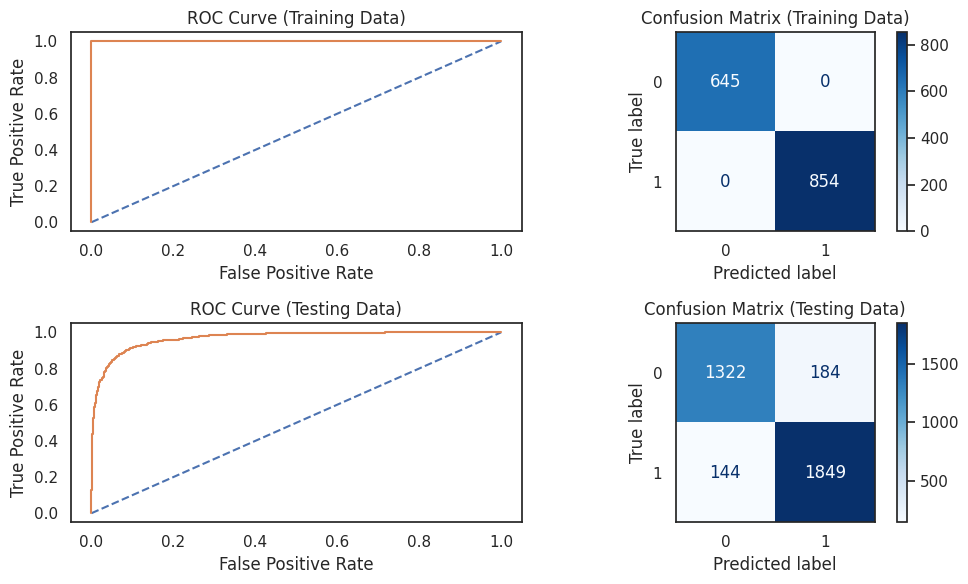

In [158]:
# Diagnostics for the base model
get_metrics_diag(lightgbm_base)

# Model 18 - Hyperparameter LightGBM Model

In [159]:
# Defining the parameter grid for GridSearchCV
param_grid = {
    'num_leaves': [31, 50, 70],
    'max_depth': [-1, 10, 20],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300]
}

# Initializing the LightGBM model
lightgbm_tuned = LGBMClassifier(random_state=1)

# Setting up GridSearchCV
grid_search = GridSearchCV(estimator=lightgbm_tuned, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fitting the GridSearchCV model
grid_search.fit(X_train, Y_train)


Iteration 329, loss = 0.22956462
Iteration 330, loss = 0.22956271
Iteration 331, loss = 0.22933943
Iteration 332, loss = 0.22924514
Iteration 333, loss = 0.22896260
Iteration 334, loss = 0.22875926
Iteration 335, loss = 0.22888083
Iteration 336, loss = 0.22930845
Iteration 337, loss = 0.22907934
Iteration 338, loss = 0.22882819
Iteration 339, loss = 0.22839243
Iteration 340, loss = 0.22806445
Iteration 341, loss = 0.22805113
Iteration 342, loss = 0.22806371
Iteration 343, loss = 0.22826226
Iteration 344, loss = 0.22817545
Iteration 345, loss = 0.22778617
Iteration 346, loss = 0.22758188
Iteration 347, loss = 0.22781239
Iteration 348, loss = 0.22763503
Iteration 349, loss = 0.22738200
Iteration 350, loss = 0.22732948
Iteration 351, loss = 0.22715644
Iteration 352, loss = 0.22716639
Iteration 353, loss = 0.22700757
Iteration 354, loss = 0.22690088
Iteration 355, loss = 0.22669158
Iteration 356, loss = 0.22677191
Iteration 357, loss = 0.22700929
Iteration 358, loss = 0.22649063
Iteration 

GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=1), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [-1, 10, 20],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [31, 50, 70]},
             scoring='accuracy')

In [160]:
# Extracting the best model from GridSearchCV
best_lightgbm = grid_search.best_estimator_

In [161]:
# Using the defined function to get accuracy, recall, and precision on train and test set for the best model
best_lightgbm_score = get_metrics_score(best_lightgbm)

Accuracy on training set :  0.978
Accuracy on test set :  0.911
Recall on training set :  0.984
Recall on test set :  0.93
Precision on training set :  0.978
Precision on test set :  0.916
F1 on training set :  0.981
F1 on test set :  0.923
AUC-ROC on training set:  0.998
AUC-ROC on test set:  0.971

 Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.98      0.97      0.97       645
           1       0.98      0.98      0.98       854

    accuracy                           0.98      1499
   macro avg       0.98      0.98      0.98      1499
weighted avg       0.98      0.98      0.98      1499


 Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1506
           1       0.92      0.93      0.92      1993

    accuracy                           0.91      3499
   macro avg       0.91      0.91      0.91      3499
weighted avg       


AUC & ROC Graph of Training Data

Area under the curve: 0.998

AUC & ROC Graph of Testing Data

Area under the curve: 0.971


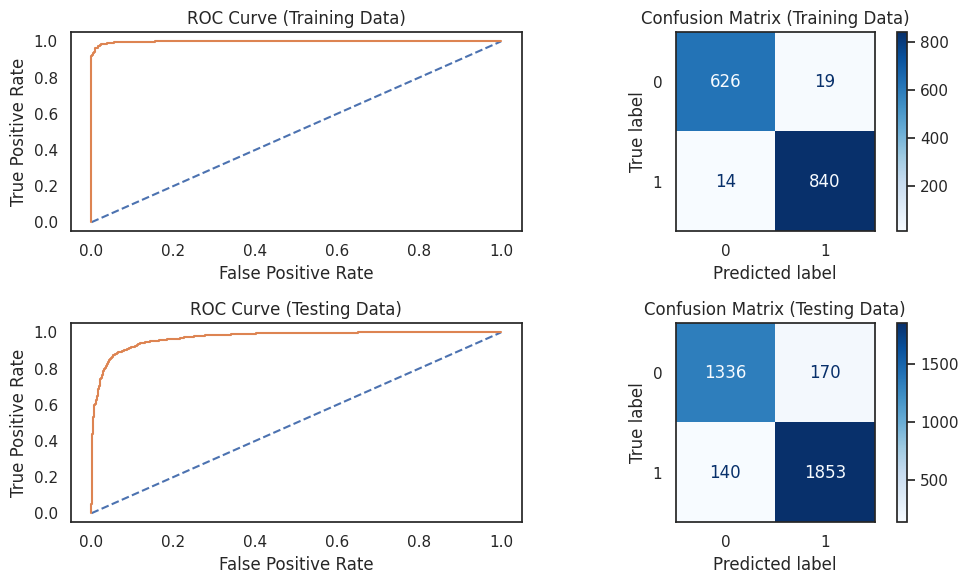

In [162]:
# Diagnostics for the best model
get_metrics_diag(best_lightgbm)

# Model 19 - Optimised XGBoost with Optuna

In [303]:
import xgboost as xgb

import optuna
from optuna.visualization import plot_optimization_history, plot_param_importances

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, auc, average_precision_score, precision_recall_curve
from sklearn.metrics import f1_score

In [304]:
from sklearn import metrics
from sklearn.metrics import classification_report

def get_metrics_score(model, D_train, D_test, y_train, y_test, flag=True):
    # Predicting on train and test data
    pred_train = model.predict(D_train)
    pred_test = model.predict(D_test)
    
    # Binarize predictions (since the model output is probabilities)
    pred_train_binary = (pred_train >= 0.5).astype(int)
    pred_test_binary = (pred_test >= 0.5).astype(int)
    
    # Calculate accuracy
    train_acc = metrics.accuracy_score(y_train, pred_train_binary)
    test_acc = metrics.accuracy_score(y_test, pred_test_binary)
    
    # Calculate recall
    train_recall = metrics.recall_score(y_train, pred_train_binary)
    test_recall = metrics.recall_score(y_test, pred_test_binary)
    
    # Calculate precision
    train_precision = metrics.precision_score(y_train, pred_train_binary)
    test_precision = metrics.precision_score(y_test, pred_test_binary)
    
    # Calculate F1 score
    train_f1 = metrics.f1_score(y_train, pred_train_binary)
    test_f1 = metrics.f1_score(y_test, pred_test_binary)
    
    # Calculate AUC-ROC score
    train_auc = metrics.roc_auc_score(y_train, pred_train)
    test_auc = metrics.roc_auc_score(y_test, pred_test)
    
    # Store scores in a list
    score_list = [train_acc, test_acc, train_recall, test_recall, train_precision, test_precision, train_f1, test_f1, train_auc, test_auc]
    
    if flag:
        print("Accuracy on training set: ", round(train_acc, 3))
        print("Accuracy on test set: ", round(test_acc, 3))
        print("Recall on training set: ", round(train_recall, 3))
        print("Recall on test set: ", round(test_recall, 3))
        print("Precision on training set: ", round(train_precision, 3))
        print("Precision on test set: ", round(test_precision, 3))
        print("F1 on training set: ", round(train_f1, 3))
        print("F1 on test set: ", round(test_f1, 3))
        print("AUC-ROC on training set: ", round(train_auc, 3))
        print("AUC-ROC on test set: ", round(test_auc, 3))
        
        print("\nClassification Report of Training Data")
        print(classification_report(y_train, pred_train_binary))
        
        print("\nClassification Report of Testing Data")
        print(classification_report(y_test, pred_test_binary))
        
    return score_list

# Example usage:
# D_train = xgb.DMatrix(X_train, label=Y_train)
# D_test = xgb.DMatrix(X_test, label=Y_test)
# model = xgb.train(params, D_train, num_boost_round=var_n_boost_round)
# scores = get_metrics_score(model, D_train, D_test, Y_train, Y_test)


In [305]:
D_train = xgb.DMatrix(X_train, label=Y_train, enable_categorical=True)
D_test = xgb.DMatrix(X_test, label=Y_test, enable_categorical=True)

## Hyper Parameter Tuning

In [319]:
# Convert the datasets into DMatrix
D_train = xgb.DMatrix(X_train, label=Y_train)
D_test = xgb.DMatrix(X_test, label=Y_test)

var_n_boost_round = 500

def objective(trial):
    param = {
        'eta': trial.suggest_float('eta', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 5, 15),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0),
        'alpha': trial.suggest_float('alpha', 1e-8, 1.0),
        'lambda': trial.suggest_float('lambda', 1e-8, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'max_delta_step': trial.suggest_int('max_delta_step', 0, 10),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 0.1, 10),
        'tree_method': trial.suggest_categorical('tree_method', ['auto', 'exact', 'approx', 'hist']),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'objective': 'binary:logistic',
        'eval_metric': 'aucpr',
        'min_split_loss': trial.suggest_float('min_split_loss', 1e-8, 1.0),
        'max_bin': trial.suggest_int('max_bin', 64, 512),
        'seed': 42,
        'n_jobs': -1
    }

    # Train model with the given hyperparameters
    model = xgb.train(param, D_train, num_boost_round=var_n_boost_round, evals=[(D_test, 'val')], early_stopping_rounds=25, verbose_eval=50)
    
    # Predict and calculate AUCPR score on validation set
    Y_val_pred = model.predict(D_test)
    
    # Check shapes
    print(f"Shape of y_test: {Y_test.shape}")
    print(f"Shape of y_val_pred: {Y_val_pred.shape}")
    
    # Ensure that y_test and y_val_pred have the same length
    if Y_test.shape[0] != Y_val_pred.shape[0]:
        raise ValueError(f"Inconsistent number of samples in y_test ({Y_test.shape[0]}) and y_val_pred ({Y_val_pred.shape[0]})")
    
    score = average_precision_score(Y_test, Y_val_pred)

    return score

var_n_trials = var_n_boost_round

# Create Optuna study and optimize the objective function
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=var_n_trials)

# Get the best hyperparameters and best AUCPR score
best_params = study.best_params
best_score = study.best_value

print("Best parameters:", best_params)
print("Best AUCPR score:", best_score)


[I 2024-08-15 10:59:00,153] A new study created in memory with name: no-name-124eaaba-42dc-4157-a18e-27c6e5e13827


[0]	val-aucpr:0.91117
[50]	val-aucpr:0.97723
[100]	val-aucpr:0.97815
[105]	val-aucpr:0.97795


[I 2024-08-15 10:59:00,239] Trial 0 finished with value: 0.9779013116626938 and parameters: {'eta': 0.2939652277618596, 'max_depth': 10, 'subsample': 0.9930224249340176, 'colsample_bytree': 0.6955718213190152, 'gamma': 0.9647846843726358, 'alpha': 0.6397278894627659, 'lambda': 0.21182243785233357, 'min_child_weight': 8, 'max_delta_step': 6, 'scale_pos_weight': 3.8455969779028716, 'tree_method': 'auto', 'learning_rate': 0.08028762325071938, 'min_split_loss': 0.11230865849718581, 'max_bin': 290}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81362
[50]	val-aucpr:0.97682
[100]	val-aucpr:0.97683
[106]	val-aucpr:0.97653


[I 2024-08-15 10:59:00,325] Trial 1 finished with value: 0.9764788489878504 and parameters: {'eta': 0.08420381822143592, 'max_depth': 8, 'subsample': 0.526210435186035, 'colsample_bytree': 0.581659686566134, 'gamma': 0.46013507610123233, 'alpha': 0.6104708516139765, 'lambda': 0.7927540557354266, 'min_child_weight': 1, 'max_delta_step': 8, 'scale_pos_weight': 2.4321607618818524, 'tree_method': 'auto', 'learning_rate': 0.13979244609902178, 'min_split_loss': 0.09359470896268422, 'max_bin': 231}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89233
[50]	val-aucpr:0.96841
[97]	val-aucpr:0.97043


[I 2024-08-15 10:59:00,377] Trial 2 finished with value: 0.9704427501398821 and parameters: {'eta': 0.17393423820645007, 'max_depth': 10, 'subsample': 0.1629154021734821, 'colsample_bytree': 0.871657187155127, 'gamma': 0.7140768297667791, 'alpha': 0.4659594242571746, 'lambda': 0.5123749721278191, 'min_child_weight': 8, 'max_delta_step': 7, 'scale_pos_weight': 6.793129737906933, 'tree_method': 'auto', 'learning_rate': 0.10967855022086863, 'min_split_loss': 0.8052187612234041, 'max_bin': 317}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82406
[50]	val-aucpr:0.97534
[100]	val-aucpr:0.97706
[108]	val-aucpr:0.97698


[I 2024-08-15 10:59:00,454] Trial 3 finished with value: 0.9769867610941522 and parameters: {'eta': 0.1359416548190952, 'max_depth': 7, 'subsample': 0.9338950766447107, 'colsample_bytree': 0.6220836443443445, 'gamma': 0.8369829015970117, 'alpha': 0.1138528344971483, 'lambda': 0.2580394336374594, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 8.82218205549233, 'tree_method': 'auto', 'learning_rate': 0.08276725058239903, 'min_split_loss': 0.5004825247753333, 'max_bin': 292}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92964
[27]	val-aucpr:0.93263


[I 2024-08-15 10:59:00,474] Trial 4 finished with value: 0.9205801110245186 and parameters: {'eta': 0.25367953998727877, 'max_depth': 9, 'subsample': 0.6272312934832419, 'colsample_bytree': 0.2963046785517967, 'gamma': 0.017024820718320777, 'alpha': 0.422983679246139, 'lambda': 0.14827841385147678, 'min_child_weight': 8, 'max_delta_step': 8, 'scale_pos_weight': 6.951802289695304, 'tree_method': 'exact', 'learning_rate': 0.1462860668351775, 'min_split_loss': 0.8967700786604182, 'max_bin': 206}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95053
[50]	val-aucpr:0.97770
[86]	val-aucpr:0.97742
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:00,578] Trial 5 finished with value: 0.9773607891684358 and parameters: {'eta': 0.03018103369260678, 'max_depth': 15, 'subsample': 0.8055506545995283, 'colsample_bytree': 0.7356061875801678, 'gamma': 0.7621619942145654, 'alpha': 0.3319946497211422, 'lambda': 0.5059195699181231, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 1.3270608808452466, 'tree_method': 'approx', 'learning_rate': 0.09526872923703728, 'min_split_loss': 0.7628186394358212, 'max_bin': 287}. Best is trial 0 with value: 0.9779013116626938.


[0]	val-aucpr:0.77766
[50]	val-aucpr:0.97277
[100]	val-aucpr:0.97624
[150]	val-aucpr:0.97682
[192]	val-aucpr:0.97705


[I 2024-08-15 10:59:00,689] Trial 6 finished with value: 0.977129016934046 and parameters: {'eta': 0.13294621213067198, 'max_depth': 9, 'subsample': 0.8051920114767717, 'colsample_bytree': 0.35172889898211934, 'gamma': 0.11505267106605697, 'alpha': 0.3077713628639712, 'lambda': 0.24201285544488715, 'min_child_weight': 7, 'max_delta_step': 2, 'scale_pos_weight': 0.9977728798588669, 'tree_method': 'auto', 'learning_rate': 0.14910454675472146, 'min_split_loss': 0.44881710094379423, 'max_bin': 451}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.75390
[33]	val-aucpr:0.96186


[I 2024-08-15 10:59:00,719] Trial 7 finished with value: 0.9612903702972855 and parameters: {'eta': 0.0808573838314521, 'max_depth': 8, 'subsample': 0.925525017201834, 'colsample_bytree': 0.3226210540342396, 'gamma': 0.7805873796136734, 'alpha': 0.3931657888154938, 'lambda': 0.030242085918879835, 'min_child_weight': 6, 'max_delta_step': 7, 'scale_pos_weight': 5.58463618723467, 'tree_method': 'auto', 'learning_rate': 0.0710090520980669, 'min_split_loss': 0.4853043977861185, 'max_bin': 429}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.74800
[50]	val-aucpr:0.95954
[100]	val-aucpr:0.96325
[150]	val-aucpr:0.96550
[161]	val-aucpr:0.96540


[I 2024-08-15 10:59:00,797] Trial 8 finished with value: 0.9654083435011462 and parameters: {'eta': 0.12000916378163788, 'max_depth': 6, 'subsample': 0.10989929153367571, 'colsample_bytree': 0.43606936003472263, 'gamma': 0.4475139547665561, 'alpha': 0.05040275135684415, 'lambda': 0.20172426906680177, 'min_child_weight': 7, 'max_delta_step': 8, 'scale_pos_weight': 2.225622443774522, 'tree_method': 'hist', 'learning_rate': 0.08500420118361834, 'min_split_loss': 0.1191309848534089, 'max_bin': 433}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.86647
[24]	val-aucpr:0.86426
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:00,813] Trial 9 finished with value: 0.8490683139277706 and parameters: {'eta': 0.10719742874951603, 'max_depth': 9, 'subsample': 0.6401087409462389, 'colsample_bytree': 0.1413427171590684, 'gamma': 0.272462281142096, 'alpha': 0.5546478502428634, 'lambda': 0.8174111135799687, 'min_child_weight': 8, 'max_delta_step': 2, 'scale_pos_weight': 1.3238578668149719, 'tree_method': 'exact', 'learning_rate': 0.13114005495372164, 'min_split_loss': 0.9951927559736092, 'max_bin': 474}. Best is trial 0 with value: 0.9779013116626938.


[0]	val-aucpr:0.95097
[50]	val-aucpr:0.96728
[100]	val-aucpr:0.97130
[150]	val-aucpr:0.97248
[200]	val-aucpr:0.97354
[250]	val-aucpr:0.97493
[300]	val-aucpr:0.97523
[316]	val-aucpr:0.97518


[I 2024-08-15 10:59:01,195] Trial 10 finished with value: 0.9751886603353862 and parameters: {'eta': 0.28639295271165677, 'max_depth': 13, 'subsample': 0.2894703133924265, 'colsample_bytree': 0.9758563426292329, 'gamma': 0.5941080235464735, 'alpha': 0.9013662194856421, 'lambda': 0.38091263163924616, 'min_child_weight': 4, 'max_delta_step': 5, 'scale_pos_weight': 4.016734538302406, 'tree_method': 'approx', 'learning_rate': 0.012282182788556445, 'min_split_loss': 0.2861729541191519, 'max_bin': 66}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95204
[50]	val-aucpr:0.97685
[65]	val-aucpr:0.97685


[I 2024-08-15 10:59:01,322] Trial 11 finished with value: 0.9768574988266787 and parameters: {'eta': 0.012208564909282849, 'max_depth': 15, 'subsample': 0.9981512869090232, 'colsample_bytree': 0.7627874270330013, 'gamma': 0.9975211948042815, 'alpha': 0.7461801046086634, 'lambda': 0.5703770429124135, 'min_child_weight': 4, 'max_delta_step': 4, 'scale_pos_weight': 3.6995080660537276, 'tree_method': 'approx', 'learning_rate': 0.1949651763578391, 'min_split_loss': 0.7533483028249446, 'max_bin': 342}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94318
[50]	val-aucpr:0.97339
[100]	val-aucpr:0.97600
[150]	val-aucpr:0.97643
[200]	val-aucpr:0.97659
[216]	val-aucpr:0.97648


[I 2024-08-15 10:59:01,557] Trial 12 finished with value: 0.9764659345566328 and parameters: {'eta': 0.20492458150286302, 'max_depth': 12, 'subsample': 0.7766429487236814, 'colsample_bytree': 0.7287137541312186, 'gamma': 0.9490024729151818, 'alpha': 0.2135351838912232, 'lambda': 0.6407320398999133, 'min_child_weight': 4, 'max_delta_step': 0, 'scale_pos_weight': 0.13982309213935906, 'tree_method': 'approx', 'learning_rate': 0.0491994609512366, 'min_split_loss': 0.654302169155256, 'max_bin': 184}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91078
[50]	val-aucpr:0.97355
[100]	val-aucpr:0.97592
[120]	val-aucpr:0.97569


[I 2024-08-15 10:59:01,686] Trial 13 finished with value: 0.9756946989654534 and parameters: {'eta': 0.04806330246269569, 'max_depth': 12, 'subsample': 0.7810203086854065, 'colsample_bytree': 0.7517470245538304, 'gamma': 0.6317334647787999, 'alpha': 0.7168786017160504, 'lambda': 0.4046683469248101, 'min_child_weight': 10, 'max_delta_step': 5, 'scale_pos_weight': 3.4973662190790797, 'tree_method': 'hist', 'learning_rate': 0.03896997637823996, 'min_split_loss': 0.33774215919526973, 'max_bin': 379}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92879
[50]	val-aucpr:0.97268
[100]	val-aucpr:0.97562
[112]	val-aucpr:0.97487


[I 2024-08-15 10:59:01,882] Trial 14 finished with value: 0.9748778177223557 and parameters: {'eta': 0.23776701794343685, 'max_depth': 15, 'subsample': 0.47084834455272706, 'colsample_bytree': 0.4932384796474357, 'gamma': 0.8734002407862748, 'alpha': 0.8864128770670407, 'lambda': 0.6718411612466846, 'min_child_weight': 2, 'max_delta_step': 3, 'scale_pos_weight': 5.192905283914975, 'tree_method': 'approx', 'learning_rate': 0.10710055741155732, 'min_split_loss': 0.010503445563083136, 'max_bin': 250}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95085
[50]	val-aucpr:0.97694
[100]	val-aucpr:0.97740
[106]	val-aucpr:0.97708


[I 2024-08-15 10:59:02,060] Trial 15 finished with value: 0.9771702146850009 and parameters: {'eta': 0.2993048399905372, 'max_depth': 13, 'subsample': 0.847162874940907, 'colsample_bytree': 0.6584098890367697, 'gamma': 0.7098183612181995, 'alpha': 0.7011058352007457, 'lambda': 0.3765360807264896, 'min_child_weight': 5, 'max_delta_step': 6, 'scale_pos_weight': 2.424904249389474, 'tree_method': 'approx', 'learning_rate': 0.06449947535804776, 'min_split_loss': 0.6320682984355659, 'max_bin': 139}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95409
[50]	val-aucpr:0.97089
[52]	val-aucpr:0.97090


[I 2024-08-15 10:59:02,159] Trial 16 finished with value: 0.9707596041787789 and parameters: {'eta': 0.1788620460653817, 'max_depth': 5, 'subsample': 0.6657891710550136, 'colsample_bytree': 0.8781725323287679, 'gamma': 0.8967515776910097, 'alpha': 0.27225734711984456, 'lambda': 0.9761923864903208, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 4.290827225109636, 'tree_method': 'exact', 'learning_rate': 0.17633495099376148, 'min_split_loss': 0.18759920902577673, 'max_bin': 373}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92843
[50]	val-aucpr:0.97614
[91]	val-aucpr:0.97702


[I 2024-08-15 10:59:02,274] Trial 17 finished with value: 0.9769996087813795 and parameters: {'eta': 0.01272557593056442, 'max_depth': 11, 'subsample': 0.9988257455203926, 'colsample_bytree': 0.8821071980934598, 'gamma': 0.5554314998493318, 'alpha': 0.5978649568302412, 'lambda': 0.04390574873813502, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 9.340034657811524, 'tree_method': 'hist', 'learning_rate': 0.0963999542304089, 'min_split_loss': 0.6279493982973063, 'max_bin': 282}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81114
[50]	val-aucpr:0.97277
[100]	val-aucpr:0.97633
[143]	val-aucpr:0.97643


[I 2024-08-15 10:59:02,398] Trial 18 finished with value: 0.9763800409741699 and parameters: {'eta': 0.21684552392436324, 'max_depth': 14, 'subsample': 0.40668757036017833, 'colsample_bytree': 0.5379596412266576, 'gamma': 0.7905364880840209, 'alpha': 0.1573101959071213, 'lambda': 0.44824933900874186, 'min_child_weight': 3, 'max_delta_step': 4, 'scale_pos_weight': 0.20764220833872793, 'tree_method': 'auto', 'learning_rate': 0.11866894359253674, 'min_split_loss': 0.3438370852094804, 'max_bin': 144}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95559
[50]	val-aucpr:0.97400
[100]	val-aucpr:0.97702
[150]	val-aucpr:0.97762
[181]	val-aucpr:0.97743


[I 2024-08-15 10:59:02,662] Trial 19 finished with value: 0.9774416777660069 and parameters: {'eta': 0.05565952207372887, 'max_depth': 11, 'subsample': 0.8636905600133761, 'colsample_bytree': 0.9988539568352154, 'gamma': 0.3646851929087044, 'alpha': 0.35116362166276305, 'lambda': 0.3151534935264646, 'min_child_weight': 5, 'max_delta_step': 6, 'scale_pos_weight': 1.670827723690209, 'tree_method': 'approx', 'learning_rate': 0.03094770288307365, 'min_split_loss': 0.7441334715085981, 'max_bin': 507}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95709
[34]	val-aucpr:0.96584


[I 2024-08-15 10:59:02,756] Trial 20 finished with value: 0.9658629589159674 and parameters: {'eta': 0.07541651634119372, 'max_depth': 11, 'subsample': 0.8957869220400847, 'colsample_bytree': 0.9986703200137765, 'gamma': 0.3215035948886367, 'alpha': 0.9819008870802641, 'lambda': 0.29609319943739965, 'min_child_weight': 7, 'max_delta_step': 6, 'scale_pos_weight': 6.050527468193248, 'tree_method': 'approx', 'learning_rate': 0.013087179234967147, 'min_split_loss': 0.56285962714748, 'max_bin': 503}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94891
[50]	val-aucpr:0.97399
[100]	val-aucpr:0.97682
[150]	val-aucpr:0.97715
[200]	val-aucpr:0.97769
[218]	val-aucpr:0.97715


[I 2024-08-15 10:59:03,056] Trial 21 finished with value: 0.9772364110474366 and parameters: {'eta': 0.04510656963603341, 'max_depth': 11, 'subsample': 0.7184170303584078, 'colsample_bytree': 0.8140173067553701, 'gamma': 0.3389588139188663, 'alpha': 0.33874267582387996, 'lambda': 0.5119733159897555, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 2.001460326606672, 'tree_method': 'approx', 'learning_rate': 0.03505178012700352, 'min_split_loss': 0.7766388020553693, 'max_bin': 388}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95188
[50]	val-aucpr:0.97583
[100]	val-aucpr:0.97697
[106]	val-aucpr:0.97668


[I 2024-08-15 10:59:03,239] Trial 22 finished with value: 0.9766620451385714 and parameters: {'eta': 0.051013912894350616, 'max_depth': 13, 'subsample': 0.8704303307813146, 'colsample_bytree': 0.6741491802793593, 'gamma': 0.2062371844237778, 'alpha': 0.5255471489060292, 'lambda': 0.1380902101105359, 'min_child_weight': 5, 'max_delta_step': 6, 'scale_pos_weight': 2.9132170941343527, 'tree_method': 'approx', 'learning_rate': 0.061325804800566194, 'min_split_loss': 0.8917023665550976, 'max_bin': 339}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95300
[50]	val-aucpr:0.97259
[100]	val-aucpr:0.97585
[150]	val-aucpr:0.97664
[200]	val-aucpr:0.97734
[228]	val-aucpr:0.97734


[I 2024-08-15 10:59:03,535] Trial 23 finished with value: 0.9773445602249705 and parameters: {'eta': 0.02930798225635261, 'max_depth': 14, 'subsample': 0.7327391603675932, 'colsample_bytree': 0.926545483105506, 'gamma': 0.6898204403090085, 'alpha': 0.382228742230332, 'lambda': 0.31924309771907183, 'min_child_weight': 6, 'max_delta_step': 3, 'scale_pos_weight': 1.0809009536308594, 'tree_method': 'approx', 'learning_rate': 0.03199887151703732, 'min_split_loss': 0.7069240911203309, 'max_bin': 267}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95109
[50]	val-aucpr:0.97662
[72]	val-aucpr:0.97640


[I 2024-08-15 10:59:03,675] Trial 24 finished with value: 0.9764102147820473 and parameters: {'eta': 0.09479117253618138, 'max_depth': 10, 'subsample': 0.9438359647587096, 'colsample_bytree': 0.8063402083530051, 'gamma': 0.3872159930009357, 'alpha': 0.4769235734832813, 'lambda': 0.12196522951403163, 'min_child_weight': 3, 'max_delta_step': 4, 'scale_pos_weight': 1.7280896707594637, 'tree_method': 'approx', 'learning_rate': 0.08958573572867537, 'min_split_loss': 0.8799626551352542, 'max_bin': 90}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89254
[50]	val-aucpr:0.97601
[100]	val-aucpr:0.97656
[143]	val-aucpr:0.97640


[I 2024-08-15 10:59:03,839] Trial 25 finished with value: 0.976405111348919 and parameters: {'eta': 0.15440978438828187, 'max_depth': 10, 'subsample': 0.8409854819858446, 'colsample_bytree': 0.6991750360211737, 'gamma': 0.9999309466614688, 'alpha': 0.24469140618494906, 'lambda': 0.33150639352974814, 'min_child_weight': 3, 'max_delta_step': 7, 'scale_pos_weight': 4.643061583678351, 'tree_method': 'auto', 'learning_rate': 0.07172018805664147, 'min_split_loss': 0.40800276534582086, 'max_bin': 402}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90316
[50]	val-aucpr:0.97543
[100]	val-aucpr:0.97727
[112]	val-aucpr:0.97721


[I 2024-08-15 10:59:03,974] Trial 26 finished with value: 0.9772937735522109 and parameters: {'eta': 0.060051760941082215, 'max_depth': 12, 'subsample': 0.7141478906911142, 'colsample_bytree': 0.8078906103124582, 'gamma': 0.4934293498917074, 'alpha': 0.6556409218075536, 'lambda': 0.4600347721553543, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 3.189718587834501, 'tree_method': 'hist', 'learning_rate': 0.05365011307909281, 'min_split_loss': 0.5636151293773823, 'max_bin': 311}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91617
[50]	val-aucpr:0.93639
[62]	val-aucpr:0.93759


[I 2024-08-15 10:59:04,070] Trial 27 finished with value: 0.9365792336878801 and parameters: {'eta': 0.2734639013083961, 'max_depth': 14, 'subsample': 0.5577919859490389, 'colsample_bytree': 0.4337302872963909, 'gamma': 0.20859706639564884, 'alpha': 0.7895004848708859, 'lambda': 0.5980992960511383, 'min_child_weight': 9, 'max_delta_step': 6, 'scale_pos_weight': 0.7835277851420762, 'tree_method': 'exact', 'learning_rate': 0.1206678712052313, 'min_split_loss': 0.24166989935575317, 'max_bin': 218}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90369
[50]	val-aucpr:0.96994
[100]	val-aucpr:0.97344
[150]	val-aucpr:0.97487
[200]	val-aucpr:0.97620
[250]	val-aucpr:0.97718
[300]	val-aucpr:0.97770
[350]	val-aucpr:0.97790
[396]	val-aucpr:0.97789


[I 2024-08-15 10:59:04,549] Trial 28 finished with value: 0.9778973061981948 and parameters: {'eta': 0.03232440306390251, 'max_depth': 7, 'subsample': 0.9836475841891669, 'colsample_bytree': 0.6030497403597097, 'gamma': 0.9122627916063704, 'alpha': 0.18914777530835536, 'lambda': 0.7279265442266589, 'min_child_weight': 7, 'max_delta_step': 1, 'scale_pos_weight': 3.223144300633499, 'tree_method': 'approx', 'learning_rate': 0.02257979878175642, 'min_split_loss': 0.9978308955636246, 'max_bin': 509}. Best is trial 0 with value: 0.9779013116626938.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81387
[50]	val-aucpr:0.96847
[100]	val-aucpr:0.97186
[150]	val-aucpr:0.97300
[200]	val-aucpr:0.97413
[250]	val-aucpr:0.97554
[300]	val-aucpr:0.97668
[350]	val-aucpr:0.97748
[400]	val-aucpr:0.97792
[418]	val-aucpr:0.97790


[I 2024-08-15 10:59:04,860] Trial 29 finished with value: 0.977928711632146 and parameters: {'eta': 0.06669413363546553, 'max_depth': 7, 'subsample': 0.9758569917084, 'colsample_bytree': 0.5916565167596136, 'gamma': 0.43765332977483423, 'alpha': 0.01916865356030467, 'lambda': 0.7299243511949401, 'min_child_weight': 9, 'max_delta_step': 1, 'scale_pos_weight': 2.9406905538358177, 'tree_method': 'auto', 'learning_rate': 0.015113644925680073, 'min_split_loss': 0.9813330130057428, 'max_bin': 508}. Best is trial 29 with value: 0.977928711632146.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79931
[50]	val-aucpr:0.96958
[100]	val-aucpr:0.97337
[150]	val-aucpr:0.97512
[200]	val-aucpr:0.97611
[250]	val-aucpr:0.97715
[300]	val-aucpr:0.97763
[350]	val-aucpr:0.97791
[389]	val-aucpr:0.97791


[I 2024-08-15 10:59:05,150] Trial 30 finished with value: 0.9779100180203576 and parameters: {'eta': 0.0755710603878219, 'max_depth': 7, 'subsample': 0.9716623517349426, 'colsample_bytree': 0.577848985841128, 'gamma': 0.9105157402177345, 'alpha': 0.020481093291759525, 'lambda': 0.7588116702193717, 'min_child_weight': 9, 'max_delta_step': 1, 'scale_pos_weight': 2.770692261615288, 'tree_method': 'auto', 'learning_rate': 0.022982481379587784, 'min_split_loss': 0.9504096167883043, 'max_bin': 463}. Best is trial 29 with value: 0.977928711632146.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81655
[50]	val-aucpr:0.96872
[100]	val-aucpr:0.97218
[150]	val-aucpr:0.97362
[200]	val-aucpr:0.97493
[250]	val-aucpr:0.97617
[300]	val-aucpr:0.97718
[350]	val-aucpr:0.97783
[400]	val-aucpr:0.97811
[420]	val-aucpr:0.97810


[I 2024-08-15 10:59:05,467] Trial 31 finished with value: 0.9781111090614221 and parameters: {'eta': 0.07099439177029633, 'max_depth': 7, 'subsample': 0.9938960708974599, 'colsample_bytree': 0.5819094193802091, 'gamma': 0.9223228416930691, 'alpha': 1.6388567473490934e-05, 'lambda': 0.7538139148862086, 'min_child_weight': 9, 'max_delta_step': 1, 'scale_pos_weight': 2.8901013783328473, 'tree_method': 'auto', 'learning_rate': 0.017116138264086887, 'min_split_loss': 0.9535604041393664, 'max_bin': 481}. Best is trial 31 with value: 0.9781111090614221.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79622
[50]	val-aucpr:0.96738
[100]	val-aucpr:0.97165
[150]	val-aucpr:0.97334
[200]	val-aucpr:0.97487
[250]	val-aucpr:0.97635
[300]	val-aucpr:0.97713
[350]	val-aucpr:0.97767
[397]	val-aucpr:0.97774


[I 2024-08-15 10:59:05,771] Trial 32 finished with value: 0.9777498312397674 and parameters: {'eta': 0.09618450245227037, 'max_depth': 7, 'subsample': 0.9394779145751886, 'colsample_bytree': 0.5405011222391721, 'gamma': 0.8656007434313834, 'alpha': 0.01481816956679895, 'lambda': 0.8478333163351828, 'min_child_weight': 9, 'max_delta_step': 1, 'scale_pos_weight': 2.9012230075105987, 'tree_method': 'auto', 'learning_rate': 0.018105101304779755, 'min_split_loss': 0.941882762617545, 'max_bin': 474}. Best is trial 31 with value: 0.9781111090614221.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.78791
[50]	val-aucpr:0.97215
[100]	val-aucpr:0.97610
[150]	val-aucpr:0.97692
[200]	val-aucpr:0.97713
[221]	val-aucpr:0.97717


[I 2024-08-15 10:59:05,990] Trial 33 finished with value: 0.9771611968913384 and parameters: {'eta': 0.07761818682364598, 'max_depth': 5, 'subsample': 0.9180809949726273, 'colsample_bytree': 0.5750264961838667, 'gamma': 0.940485329682039, 'alpha': 0.09307029309151006, 'lambda': 0.9029048102589735, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 4.637292536285443, 'tree_method': 'auto', 'learning_rate': 0.05083825859646876, 'min_split_loss': 0.832559896055699, 'max_bin': 470}. Best is trial 31 with value: 0.9781111090614221.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82685
[50]	val-aucpr:0.97143
[100]	val-aucpr:0.97455
[150]	val-aucpr:0.97613
[200]	val-aucpr:0.97699
[250]	val-aucpr:0.97766
[300]	val-aucpr:0.97786
[329]	val-aucpr:0.97792


[I 2024-08-15 10:59:06,320] Trial 34 finished with value: 0.9779253147535946 and parameters: {'eta': 0.165460546412205, 'max_depth': 8, 'subsample': 0.961984774308488, 'colsample_bytree': 0.6325688388472288, 'gamma': 0.8266871123201086, 'alpha': 0.00011722811990547297, 'lambda': 0.7278749373176235, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 2.636849568972433, 'tree_method': 'auto', 'learning_rate': 0.02520521701461667, 'min_split_loss': 0.8457963932765303, 'max_bin': 424}. Best is trial 31 with value: 0.9781111090614221.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82471
[50]	val-aucpr:0.96994
[100]	val-aucpr:0.97332
[150]	val-aucpr:0.97477
[200]	val-aucpr:0.97630
[250]	val-aucpr:0.97751
[300]	val-aucpr:0.97804
[350]	val-aucpr:0.97832
[396]	val-aucpr:0.97832


[I 2024-08-15 10:59:06,682] Trial 35 finished with value: 0.9783230598526762 and parameters: {'eta': 0.16627298219130418, 'max_depth': 6, 'subsample': 0.9545869837013059, 'colsample_bytree': 0.4723424391764404, 'gamma': 0.8186719351102398, 'alpha': 0.004753860894565187, 'lambda': 0.7507662799922723, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 2.6476381836976506, 'tree_method': 'auto', 'learning_rate': 0.023044750280241222, 'min_split_loss': 0.8461016463479742, 'max_bin': 423}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82702
[50]	val-aucpr:0.97122
[100]	val-aucpr:0.97536
[150]	val-aucpr:0.97676
[200]	val-aucpr:0.97794
[240]	val-aucpr:0.97781


[I 2024-08-15 10:59:06,930] Trial 36 finished with value: 0.9778201663548813 and parameters: {'eta': 0.16873687023908246, 'max_depth': 6, 'subsample': 0.8888919769452838, 'colsample_bytree': 0.4761047889491816, 'gamma': 0.6583007470522072, 'alpha': 0.10202412489585347, 'lambda': 0.889296005489271, 'min_child_weight': 8, 'max_delta_step': 2, 'scale_pos_weight': 7.163517672056741, 'tree_method': 'auto', 'learning_rate': 0.04529158813859002, 'min_split_loss': 0.8319203714173875, 'max_bin': 414}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.86433
[50]	val-aucpr:0.96653
[100]	val-aucpr:0.97248
[150]	val-aucpr:0.97381
[200]	val-aucpr:0.97496
[250]	val-aucpr:0.97559
[273]	val-aucpr:0.97555


[I 2024-08-15 10:59:07,170] Trial 37 finished with value: 0.9755540580010302 and parameters: {'eta': 0.19263943911690196, 'max_depth': 8, 'subsample': 0.33894605124605914, 'colsample_bytree': 0.6457603795524058, 'gamma': 0.5434506500484411, 'alpha': 0.1446227981173121, 'lambda': 0.7150564436619715, 'min_child_weight': 9, 'max_delta_step': 0, 'scale_pos_weight': 2.442664421417775, 'tree_method': 'auto', 'learning_rate': 0.025960932632613204, 'min_split_loss': 0.9285640728003968, 'max_bin': 445}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80867
[35]	val-aucpr:0.96171


[I 2024-08-15 10:59:07,255] Trial 38 finished with value: 0.9617214060137597 and parameters: {'eta': 0.14600196945018812, 'max_depth': 6, 'subsample': 0.9475117265067443, 'colsample_bytree': 0.3809121988781943, 'gamma': 0.8270269713046358, 'alpha': 0.06913258167812117, 'lambda': 0.9864919216011389, 'min_child_weight': 10, 'max_delta_step': 2, 'scale_pos_weight': 4.058615071080695, 'tree_method': 'auto', 'learning_rate': 0.010451185802040235, 'min_split_loss': 0.8512314213340593, 'max_bin': 486}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80701
[50]	val-aucpr:0.96792
[100]	val-aucpr:0.97269
[150]	val-aucpr:0.97458
[200]	val-aucpr:0.97603
[250]	val-aucpr:0.97700
[300]	val-aucpr:0.97749
[350]	val-aucpr:0.97789
[396]	val-aucpr:0.97792


[I 2024-08-15 10:59:07,605] Trial 39 finished with value: 0.9779255689613339 and parameters: {'eta': 0.12358280121364043, 'max_depth': 8, 'subsample': 0.8188514709018077, 'colsample_bytree': 0.5040958011879542, 'gamma': 0.73448162635199, 'alpha': 0.022010199995696353, 'lambda': 0.7652726980925634, 'min_child_weight': 8, 'max_delta_step': 1, 'scale_pos_weight': 3.4171758649576742, 'tree_method': 'auto', 'learning_rate': 0.024282829297294656, 'min_split_loss': 0.9404897284149, 'max_bin': 419}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.67506
[32]	val-aucpr:0.95088


[I 2024-08-15 10:59:07,682] Trial 40 finished with value: 0.9502347669812226 and parameters: {'eta': 0.11640169826832049, 'max_depth': 8, 'subsample': 0.5797401366331552, 'colsample_bytree': 0.1833251017457061, 'gamma': 0.7364651530587544, 'alpha': 0.12747898290702692, 'lambda': 0.778575796913737, 'min_child_weight': 8, 'max_delta_step': 1, 'scale_pos_weight': 7.930871285228635, 'tree_method': 'auto', 'learning_rate': 0.04069575397106011, 'min_split_loss': 0.9575335478745886, 'max_bin': 361}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82360
[50]	val-aucpr:0.96945
[100]	val-aucpr:0.97303
[150]	val-aucpr:0.97471
[200]	val-aucpr:0.97622
[250]	val-aucpr:0.97718
[300]	val-aucpr:0.97757
[350]	val-aucpr:0.97792
[396]	val-aucpr:0.97792


[I 2024-08-15 10:59:07,987] Trial 41 finished with value: 0.9779302901496786 and parameters: {'eta': 0.14262238772161018, 'max_depth': 8, 'subsample': 0.8415472747984515, 'colsample_bytree': 0.4908848890030717, 'gamma': 0.8183091806429026, 'alpha': 0.001616193316547187, 'lambda': 0.7080907270140478, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 3.476506785594319, 'tree_method': 'auto', 'learning_rate': 0.023627259899676473, 'min_split_loss': 0.8984638365990084, 'max_bin': 419}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82549
[50]	val-aucpr:0.96866
[100]	val-aucpr:0.97136
[150]	val-aucpr:0.97207
[200]	val-aucpr:0.97355
[250]	val-aucpr:0.97446
[300]	val-aucpr:0.97528
[350]	val-aucpr:0.97615
[400]	val-aucpr:0.97651
[450]	val-aucpr:0.97679
[499]	val-aucpr:0.97719


[I 2024-08-15 10:59:08,377] Trial 42 finished with value: 0.9771927494485951 and parameters: {'eta': 0.13463226244334023, 'max_depth': 9, 'subsample': 0.9075953748221318, 'colsample_bytree': 0.4962010691515479, 'gamma': 0.784242360333016, 'alpha': 0.056057259043526174, 'lambda': 0.6506016210270369, 'min_child_weight': 8, 'max_delta_step': 0, 'scale_pos_weight': 3.5384166620190705, 'tree_method': 'auto', 'learning_rate': 0.010509697776375148, 'min_split_loss': 0.9143575289451017, 'max_bin': 453}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79225
[50]	val-aucpr:0.96517
[100]	val-aucpr:0.97129
[150]	val-aucpr:0.97374
[200]	val-aucpr:0.97606
[250]	val-aucpr:0.97710
[300]	val-aucpr:0.97775
[350]	val-aucpr:0.97828
[393]	val-aucpr:0.97817
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:08,662] Trial 43 finished with value: 0.9781869111125705 and parameters: {'eta': 0.12180462207429546, 'max_depth': 7, 'subsample': 0.8314343595708772, 'colsample_bytree': 0.4027707681836751, 'gamma': 0.4424107216153315, 'alpha': 0.054301658853962625, 'lambda': 0.8180149765033247, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 4.58719922670847, 'tree_method': 'auto', 'learning_rate': 0.03252525164608487, 'min_split_loss': 0.974369754142279, 'max_bin': 488}. Best is trial 35 with value: 0.9783230598526762.


[0]	val-aucpr:0.80706
[35]	val-aucpr:0.96437


[I 2024-08-15 10:59:08,741] Trial 44 finished with value: 0.9643859400696381 and parameters: {'eta': 0.10641446909795914, 'max_depth': 6, 'subsample': 0.7913490664606929, 'colsample_bytree': 0.39773885829874617, 'gamma': 0.4281995525264614, 'alpha': 0.19531889464166882, 'lambda': 0.8466523793789217, 'min_child_weight': 10, 'max_delta_step': 3, 'scale_pos_weight': 5.890420733096104, 'tree_method': 'auto', 'learning_rate': 0.0351784572072933, 'min_split_loss': 0.994771998918812, 'max_bin': 487}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.68582
[32]	val-aucpr:0.95764


[I 2024-08-15 10:59:08,818] Trial 45 finished with value: 0.9571742962427114 and parameters: {'eta': 0.14518455659081936, 'max_depth': 7, 'subsample': 0.7563147358910024, 'colsample_bytree': 0.25159084967861967, 'gamma': 0.49118957689847265, 'alpha': 0.05959241450377957, 'lambda': 0.5867429250670477, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 4.7179369870242445, 'tree_method': 'auto', 'learning_rate': 0.05897175711648025, 'min_split_loss': 0.8015777082490841, 'max_bin': 440}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.77889
[34]	val-aucpr:0.96058


[I 2024-08-15 10:59:08,894] Trial 46 finished with value: 0.960598386043345 and parameters: {'eta': 0.18575694652842092, 'max_depth': 5, 'subsample': 0.8424833458815907, 'colsample_bytree': 0.2842064895093828, 'gamma': 0.4225722450561936, 'alpha': 0.10522513959956543, 'lambda': 0.9209661004020454, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 5.2925442102856906, 'tree_method': 'auto', 'learning_rate': 0.04262983973453964, 'min_split_loss': 0.8859818925759062, 'max_bin': 483}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80157
[35]	val-aucpr:0.96160


[I 2024-08-15 10:59:08,973] Trial 47 finished with value: 0.9616097877283307 and parameters: {'eta': 0.06468448657235126, 'max_depth': 6, 'subsample': 0.6804693728564944, 'colsample_bytree': 0.4308841842794021, 'gamma': 0.5863431168674467, 'alpha': 0.1641462540834994, 'lambda': 0.8347334939548366, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 4.03064669603885, 'tree_method': 'auto', 'learning_rate': 0.016875749493059047, 'min_split_loss': 0.7217034445460471, 'max_bin': 454}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.77969
[50]	val-aucpr:0.97324
[100]	val-aucpr:0.97645
[120]	val-aucpr:0.97644
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:09,095] Trial 48 finished with value: 0.9764434534494831 and parameters: {'eta': 0.09366966620887267, 'max_depth': 7, 'subsample': 0.8969077497343972, 'colsample_bytree': 0.34508105791166277, 'gamma': 0.2522654796555679, 'alpha': 0.001515448698259085, 'lambda': 0.6891378862718254, 'min_child_weight': 7, 'max_delta_step': 3, 'scale_pos_weight': 2.010874962710289, 'tree_method': 'auto', 'learning_rate': 0.1581871419317721, 'min_split_loss': 0.9942719304443631, 'max_bin': 510}. Best is trial 35 with value: 0.9783230598526762.


[0]	val-aucpr:0.90815
[50]	val-aucpr:0.95330
[80]	val-aucpr:0.94957


[I 2024-08-15 10:59:09,226] Trial 49 finished with value: 0.949315449988808 and parameters: {'eta': 0.12619378788338526, 'max_depth': 9, 'subsample': 0.8189616411134443, 'colsample_bytree': 0.47176714003465003, 'gamma': 0.6472403803599294, 'alpha': 0.059169711219999845, 'lambda': 0.7954994333031368, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 4.344794930741218, 'tree_method': 'exact', 'learning_rate': 0.07130912317674754, 'min_split_loss': 0.7855230493086989, 'max_bin': 397}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82076
[34]	val-aucpr:0.96527


[I 2024-08-15 10:59:09,305] Trial 50 finished with value: 0.9652809431478601 and parameters: {'eta': 0.1107909614140213, 'max_depth': 7, 'subsample': 0.9674304592499403, 'colsample_bytree': 0.39899114468536995, 'gamma': 0.05306538750371159, 'alpha': 0.23224756978566857, 'lambda': 0.6228764945961798, 'min_child_weight': 9, 'max_delta_step': 0, 'scale_pos_weight': 3.887346885245869, 'tree_method': 'auto', 'learning_rate': 0.029151343246212654, 'min_split_loss': 0.684152734098354, 'max_bin': 487}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80456
[50]	val-aucpr:0.96717
[100]	val-aucpr:0.97156
[150]	val-aucpr:0.97320
[200]	val-aucpr:0.97492
[250]	val-aucpr:0.97612
[300]	val-aucpr:0.97697
[350]	val-aucpr:0.97744
[398]	val-aucpr:0.97756


[I 2024-08-15 10:59:09,607] Trial 51 finished with value: 0.9775712204882253 and parameters: {'eta': 0.16084930090166663, 'max_depth': 8, 'subsample': 0.8157340823656927, 'colsample_bytree': 0.544398018831261, 'gamma': 0.8475767042075344, 'alpha': 0.02789841978950987, 'lambda': 0.7605052626919537, 'min_child_weight': 8, 'max_delta_step': 1, 'scale_pos_weight': 3.281843646355458, 'tree_method': 'auto', 'learning_rate': 0.01923137981959044, 'min_split_loss': 0.9566258455372638, 'max_bin': 417}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82649
[50]	val-aucpr:0.97121
[100]	val-aucpr:0.97507
[150]	val-aucpr:0.97701
[200]	val-aucpr:0.97773
[224]	val-aucpr:0.97754


[I 2024-08-15 10:59:09,805] Trial 52 finished with value: 0.9775070561452358 and parameters: {'eta': 0.145710969799387, 'max_depth': 8, 'subsample': 0.9200165230206901, 'colsample_bytree': 0.5258904553221392, 'gamma': 0.8036064323258807, 'alpha': 0.10698531433780394, 'lambda': 0.6868979636193902, 'min_child_weight': 10, 'max_delta_step': 2, 'scale_pos_weight': 3.659897799301153, 'tree_method': 'auto', 'learning_rate': 0.03869946404360878, 'min_split_loss': 0.8705398888814124, 'max_bin': 440}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.74417
[50]	val-aucpr:0.95927
[100]	val-aucpr:0.96457
[150]	val-aucpr:0.96797
[200]	val-aucpr:0.96910
[250]	val-aucpr:0.97089
[300]	val-aucpr:0.97139
[320]	val-aucpr:0.97136


[I 2024-08-15 10:59:10,021] Trial 53 finished with value: 0.9713689239402783 and parameters: {'eta': 0.129636982114282, 'max_depth': 9, 'subsample': 0.19982090376260125, 'colsample_bytree': 0.5098121376459959, 'gamma': 0.7487661392296654, 'alpha': 0.0495569153365597, 'lambda': 0.8728202158317149, 'min_child_weight': 8, 'max_delta_step': 1, 'scale_pos_weight': 3.1073276088814685, 'tree_method': 'auto', 'learning_rate': 0.02125525412206849, 'min_split_loss': 0.9041333452666412, 'max_bin': 360}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82288
[50]	val-aucpr:0.97051
[100]	val-aucpr:0.97430
[150]	val-aucpr:0.97603
[200]	val-aucpr:0.97741
[250]	val-aucpr:0.97773
[300]	val-aucpr:0.97789
[314]	val-aucpr:0.97782


[I 2024-08-15 10:59:10,265] Trial 54 finished with value: 0.9778242590979122 and parameters: {'eta': 0.20454897822745036, 'max_depth': 6, 'subsample': 0.8673848696219826, 'colsample_bytree': 0.456279516078687, 'gamma': 0.9630971698872614, 'alpha': 0.08507381783293252, 'lambda': 0.5464045218586239, 'min_child_weight': 9, 'max_delta_step': 0, 'scale_pos_weight': 2.2827243624050055, 'tree_method': 'auto', 'learning_rate': 0.02976034046409833, 'min_split_loss': 0.9349616929416505, 'max_bin': 406}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80597
[50]	val-aucpr:0.97163
[100]	val-aucpr:0.97564
[150]	val-aucpr:0.97693
[200]	val-aucpr:0.97721
[217]	val-aucpr:0.97713


[I 2024-08-15 10:59:10,457] Trial 55 finished with value: 0.9771015084701059 and parameters: {'eta': 0.10226493508360053, 'max_depth': 7, 'subsample': 0.7531749472510288, 'colsample_bytree': 0.5892653494849349, 'gamma': 0.5292651925103312, 'alpha': 0.27621974443119324, 'lambda': 0.9317351900483979, 'min_child_weight': 7, 'max_delta_step': 1, 'scale_pos_weight': 4.97476066242306, 'tree_method': 'hist', 'learning_rate': 0.04678593048450966, 'min_split_loss': 0.977230370676114, 'max_bin': 426}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80898
[33]	val-aucpr:0.96260


[I 2024-08-15 10:59:10,535] Trial 56 finished with value: 0.9630693919013779 and parameters: {'eta': 0.1213762245118694, 'max_depth': 5, 'subsample': 0.879018869325131, 'colsample_bytree': 0.37065507239732143, 'gamma': 0.5997258182138496, 'alpha': 0.1505300345624305, 'lambda': 0.807777705006898, 'min_child_weight': 8, 'max_delta_step': 3, 'scale_pos_weight': 1.6075055717124946, 'tree_method': 'auto', 'learning_rate': 0.016651210062725543, 'min_split_loss': 0.812854251456537, 'max_bin': 463}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80444
[50]	val-aucpr:0.97276
[100]	val-aucpr:0.97565
[123]	val-aucpr:0.97555


[I 2024-08-15 10:59:10,666] Trial 57 finished with value: 0.9755366520084487 and parameters: {'eta': 0.08761200926706733, 'max_depth': 6, 'subsample': 0.6048338153477122, 'colsample_bytree': 0.6223326454154289, 'gamma': 0.6879080925765946, 'alpha': 0.046959079523718084, 'lambda': 0.7498281416065985, 'min_child_weight': 10, 'max_delta_step': 2, 'scale_pos_weight': 4.253043907229212, 'tree_method': 'auto', 'learning_rate': 0.05369163773441733, 'min_split_loss': 0.903084453621808, 'max_bin': 490}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93263
[24]	val-aucpr:0.93263


[I 2024-08-15 10:59:10,738] Trial 58 finished with value: 0.9205801110245186 and parameters: {'eta': 0.15113821526708318, 'max_depth': 8, 'subsample': 0.9867658993497643, 'colsample_bytree': 0.31162431969400994, 'gamma': 0.46129544646903864, 'alpha': 0.0019505788072121666, 'lambda': 0.6640008187868137, 'min_child_weight': 1, 'max_delta_step': 0, 'scale_pos_weight': 2.690228743610973, 'tree_method': 'exact', 'learning_rate': 0.035182238956059236, 'min_split_loss': 0.8678134378318448, 'max_bin': 334}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89912
[35]	val-aucpr:0.96909


[I 2024-08-15 10:59:10,818] Trial 59 finished with value: 0.9689439056223705 and parameters: {'eta': 0.17623380369712377, 'max_depth': 8, 'subsample': 0.8406802745496722, 'colsample_bytree': 0.6995080799028879, 'gamma': 0.885613343372762, 'alpha': 0.11630206681120411, 'lambda': 0.945750612320844, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 5.53592262070215, 'tree_method': 'auto', 'learning_rate': 0.010591706077439344, 'min_split_loss': 0.9235175375089795, 'max_bin': 378}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79445
[50]	val-aucpr:0.96498
[100]	val-aucpr:0.97012
[150]	val-aucpr:0.97240
[200]	val-aucpr:0.97467
[250]	val-aucpr:0.97589
[300]	val-aucpr:0.97675
[350]	val-aucpr:0.97721
[400]	val-aucpr:0.97741
[403]	val-aucpr:0.97738


[I 2024-08-15 10:59:11,109] Trial 60 finished with value: 0.9773994934521162 and parameters: {'eta': 0.1389214957235292, 'max_depth': 9, 'subsample': 0.47554269230317325, 'colsample_bytree': 0.4446666374992587, 'gamma': 0.934329427226824, 'alpha': 0.4264346766870353, 'lambda': 0.8058802639035436, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 3.403964473995129, 'tree_method': 'hist', 'learning_rate': 0.02840703939812706, 'min_split_loss': 0.9671638000956283, 'max_bin': 496}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82552
[50]	val-aucpr:0.97098
[100]	val-aucpr:0.97411
[150]	val-aucpr:0.97562
[200]	val-aucpr:0.97673
[250]	val-aucpr:0.97749
[300]	val-aucpr:0.97756
[350]	val-aucpr:0.97777
[400]	val-aucpr:0.97787
[408]	val-aucpr:0.97779


[I 2024-08-15 10:59:11,417] Trial 61 finished with value: 0.9777711524455702 and parameters: {'eta': 0.16669439697967178, 'max_depth': 8, 'subsample': 0.9366457551981864, 'colsample_bytree': 0.6230194421120618, 'gamma': 0.8222926679948761, 'alpha': 0.005005832823391379, 'lambda': 0.7137933348197792, 'min_child_weight': 9, 'max_delta_step': 2, 'scale_pos_weight': 2.8385413709492098, 'tree_method': 'auto', 'learning_rate': 0.02518915910122973, 'min_split_loss': 0.8349141167391911, 'max_bin': 417}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79976
[50]	val-aucpr:0.96722
[100]	val-aucpr:0.97181
[150]	val-aucpr:0.97343
[200]	val-aucpr:0.97511
[250]	val-aucpr:0.97644
[300]	val-aucpr:0.97736
[350]	val-aucpr:0.97785
[396]	val-aucpr:0.97793


[I 2024-08-15 10:59:11,716] Trial 62 finished with value: 0.9779356284375311 and parameters: {'eta': 0.15797921667006823, 'max_depth': 7, 'subsample': 0.9699115049601599, 'colsample_bytree': 0.520734463971208, 'gamma': 0.8484844110904538, 'alpha': 0.03367395905138043, 'lambda': 0.7328976569096786, 'min_child_weight': 9, 'max_delta_step': 1, 'scale_pos_weight': 2.0453223989880858, 'tree_method': 'auto', 'learning_rate': 0.01764806243878905, 'min_split_loss': 0.7588313122571011, 'max_bin': 424}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80474
[50]	val-aucpr:0.96786
[100]	val-aucpr:0.97176
[150]	val-aucpr:0.97323
[200]	val-aucpr:0.97463
[250]	val-aucpr:0.97606
[300]	val-aucpr:0.97720
[350]	val-aucpr:0.97769
[400]	val-aucpr:0.97788
[450]	val-aucpr:0.97802
[499]	val-aucpr:0.97803


[I 2024-08-15 10:59:12,076] Trial 63 finished with value: 0.9780395486903768 and parameters: {'eta': 0.1574300645060272, 'max_depth': 7, 'subsample': 0.9947011215694209, 'colsample_bytree': 0.5672335051223527, 'gamma': 0.7562084388045787, 'alpha': 0.03755958808273479, 'lambda': 0.7762982530070858, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 2.149418608326215, 'tree_method': 'auto', 'learning_rate': 0.01652823789573725, 'min_split_loss': 0.7523325677669295, 'max_bin': 434}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80889
[50]	val-aucpr:0.96632
[100]	val-aucpr:0.97056
[150]	val-aucpr:0.97231
[200]	val-aucpr:0.97372
[250]	val-aucpr:0.97536
[300]	val-aucpr:0.97626
[350]	val-aucpr:0.97710
[400]	val-aucpr:0.97734
[450]	val-aucpr:0.97776
[499]	val-aucpr:0.97804
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:12,411] Trial 64 finished with value: 0.9780478910083932 and parameters: {'eta': 0.18474320108888037, 'max_depth': 6, 'subsample': 0.994180724753148, 'colsample_bytree': 0.5650578825417981, 'gamma': 0.7701513517076581, 'alpha': 0.06561441779797399, 'lambda': 0.6871044898733447, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 0.7084421536980618, 'tree_method': 'auto', 'learning_rate': 0.015623831419041353, 'min_split_loss': 0.7318082962321826, 'max_bin': 459}. Best is trial 35 with value: 0.9783230598526762.


[0]	val-aucpr:0.83582
[50]	val-aucpr:0.97159
[100]	val-aucpr:0.97554
[150]	val-aucpr:0.97685
[200]	val-aucpr:0.97762
[250]	val-aucpr:0.97789
[300]	val-aucpr:0.97808
[314]	val-aucpr:0.97809


[I 2024-08-15 10:59:12,633] Trial 65 finished with value: 0.9780966825532019 and parameters: {'eta': 0.21778152327701128, 'max_depth': 6, 'subsample': 0.9955197812541208, 'colsample_bytree': 0.552986766497247, 'gamma': 0.7767879498176476, 'alpha': 0.17502901467764354, 'lambda': 0.8646270127800411, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 0.6024448161611611, 'tree_method': 'auto', 'learning_rate': 0.03613870176255281, 'min_split_loss': 0.5971913433806685, 'max_bin': 393}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83200
[50]	val-aucpr:0.97193
[100]	val-aucpr:0.97586
[150]	val-aucpr:0.97713
[200]	val-aucpr:0.97755
[250]	val-aucpr:0.97801
[282]	val-aucpr:0.97802


[I 2024-08-15 10:59:12,837] Trial 66 finished with value: 0.9780307643343628 and parameters: {'eta': 0.2194066290198114, 'max_depth': 5, 'subsample': 0.9989410928964972, 'colsample_bytree': 0.5644982331119464, 'gamma': 0.7820928284992251, 'alpha': 0.17836316716698158, 'lambda': 0.8707986379503432, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 0.569540671914664, 'tree_method': 'auto', 'learning_rate': 0.03710176536891624, 'min_split_loss': 0.5994289072238677, 'max_bin': 388}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83200
[50]	val-aucpr:0.97232
[100]	val-aucpr:0.97615
[150]	val-aucpr:0.97713
[200]	val-aucpr:0.97769
[250]	val-aucpr:0.97785
[291]	val-aucpr:0.97787


[I 2024-08-15 10:59:13,044] Trial 67 finished with value: 0.9778793376794643 and parameters: {'eta': 0.23062240754042684, 'max_depth': 5, 'subsample': 0.9922148670835411, 'colsample_bytree': 0.5603935066485638, 'gamma': 0.7594404096952204, 'alpha': 0.19464605002298194, 'lambda': 0.8689743589966128, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 0.5171134670802683, 'tree_method': 'auto', 'learning_rate': 0.04024006893611239, 'min_split_loss': 0.5664477713666749, 'max_bin': 388}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87847
[50]	val-aucpr:0.97682
[100]	val-aucpr:0.97810
[120]	val-aucpr:0.97807


[I 2024-08-15 10:59:13,172] Trial 68 finished with value: 0.9780806901266728 and parameters: {'eta': 0.2562238382543381, 'max_depth': 5, 'subsample': 0.994567969410157, 'colsample_bytree': 0.682364444903265, 'gamma': 0.7158512967419844, 'alpha': 0.16398499952102813, 'lambda': 0.9582482951068407, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 1.2362350929587755, 'tree_method': 'auto', 'learning_rate': 0.07898878650156461, 'min_split_loss': 0.6024970493291126, 'max_bin': 362}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94943
[50]	val-aucpr:0.96364
[70]	val-aucpr:0.96268


[I 2024-08-15 10:59:13,292] Trial 69 finished with value: 0.9629433900182259 and parameters: {'eta': 0.2687121799688798, 'max_depth': 6, 'subsample': 0.9452596517636012, 'colsample_bytree': 0.6655942447489569, 'gamma': 0.7176743477168682, 'alpha': 0.29834288731197034, 'lambda': 0.9604348352531358, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 1.1336755409953103, 'tree_method': 'exact', 'learning_rate': 0.09917410316920497, 'min_split_loss': 0.5094524820486127, 'max_bin': 356}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90487
[50]	val-aucpr:0.97570
[100]	val-aucpr:0.97682
[150]	val-aucpr:0.97761
[200]	val-aucpr:0.97761
[213]	val-aucpr:0.97751
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:13,470] Trial 70 finished with value: 0.9775160900846845 and parameters: {'eta': 0.20395845204229268, 'max_depth': 6, 'subsample': 0.9160344785016235, 'colsample_bytree': 0.7380303056939667, 'gamma': 0.6853216700710232, 'alpha': 0.13215902624817538, 'lambda': 0.9092671028071264, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 1.489386102600784, 'tree_method': 'auto', 'learning_rate': 0.06404745546613413, 'min_split_loss': 0.6680872731054857, 'max_bin': 307}. Best is trial 35 with value: 0.9783230598526762.


[0]	val-aucpr:0.83489
[50]	val-aucpr:0.97709
[100]	val-aucpr:0.97802
[150]	val-aucpr:0.97824
[168]	val-aucpr:0.97824


[I 2024-08-15 10:59:13,610] Trial 71 finished with value: 0.9782463393209262 and parameters: {'eta': 0.24406140844728483, 'max_depth': 5, 'subsample': 0.9984301698666996, 'colsample_bytree': 0.5567032434501592, 'gamma': 0.7911298766586584, 'alpha': 0.07789849591340153, 'lambda': 0.9973004616278569, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 0.558602593624098, 'tree_method': 'auto', 'learning_rate': 0.08596022328914965, 'min_split_loss': 0.6373598248716281, 'max_bin': 388}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80909
[50]	val-aucpr:0.97508
[100]	val-aucpr:0.97647
[105]	val-aucpr:0.97649


[I 2024-08-15 10:59:13,722] Trial 72 finished with value: 0.976519499144139 and parameters: {'eta': 0.24230903077003435, 'max_depth': 5, 'subsample': 0.9504482980566796, 'colsample_bytree': 0.5993651356798917, 'gamma': 0.7749529298028087, 'alpha': 0.08076707938088806, 'lambda': 0.9692178374135468, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 0.29382252703128314, 'tree_method': 'auto', 'learning_rate': 0.08113948517274096, 'min_split_loss': 0.634632072173397, 'max_bin': 326}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89049
[50]	val-aucpr:0.97570
[100]	val-aucpr:0.97750
[144]	val-aucpr:0.97761


[I 2024-08-15 10:59:13,855] Trial 73 finished with value: 0.977615044993936 and parameters: {'eta': 0.2534909260650356, 'max_depth': 5, 'subsample': 0.9984673311026986, 'colsample_bytree': 0.77260287218161, 'gamma': 0.8933868442853359, 'alpha': 0.22529441914540793, 'lambda': 0.9996449849224616, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 0.8632306688292185, 'tree_method': 'auto', 'learning_rate': 0.08821050928251065, 'min_split_loss': 0.7251587145801928, 'max_bin': 434}. Best is trial 35 with value: 0.9783230598526762.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87140
[50]	val-aucpr:0.97776
[100]	val-aucpr:0.97844
[107]	val-aucpr:0.97842


[I 2024-08-15 10:59:13,975] Trial 74 finished with value: 0.9784294168225699 and parameters: {'eta': 0.1909767994709552, 'max_depth': 6, 'subsample': 0.9615213376436165, 'colsample_bytree': 0.6873310974793246, 'gamma': 0.7112725018325561, 'alpha': 0.08052800926195743, 'lambda': 0.8352801451800395, 'min_child_weight': 10, 'max_delta_step': 1, 'scale_pos_weight': 1.2395102287967716, 'tree_method': 'auto', 'learning_rate': 0.11304905713777658, 'min_split_loss': 0.6927934796029365, 'max_bin': 455}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90882
[50]	val-aucpr:0.97751
[67]	val-aucpr:0.97767


[I 2024-08-15 10:59:14,078] Trial 75 finished with value: 0.9776738250363015 and parameters: {'eta': 0.2222754370616043, 'max_depth': 6, 'subsample': 0.9227708629560669, 'colsample_bytree': 0.6986704005906693, 'gamma': 0.8634309146270449, 'alpha': 0.08191257892575836, 'lambda': 0.8379774744665254, 'min_child_weight': 10, 'max_delta_step': 10, 'scale_pos_weight': 1.4129803092192885, 'tree_method': 'hist', 'learning_rate': 0.11544078298351526, 'min_split_loss': 0.5988406893804997, 'max_bin': 460}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89351
[50]	val-aucpr:0.97715
[100]	val-aucpr:0.97819
[132]	val-aucpr:0.97820


[I 2024-08-15 10:59:14,209] Trial 76 finished with value: 0.9782416544456862 and parameters: {'eta': 0.19335084535727615, 'max_depth': 5, 'subsample': 0.8936016407137924, 'colsample_bytree': 0.6724727848585917, 'gamma': 0.6053010982804379, 'alpha': 0.14222829004309967, 'lambda': 0.942640429371694, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 1.1328489688149537, 'tree_method': 'auto', 'learning_rate': 0.14063717619413366, 'min_split_loss': 0.5199800619004512, 'max_bin': 475}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87811
[50]	val-aucpr:0.97740
[100]	val-aucpr:0.97817
[102]	val-aucpr:0.97815


[I 2024-08-15 10:59:14,327] Trial 77 finished with value: 0.9780326006240586 and parameters: {'eta': 0.195269520321407, 'max_depth': 5, 'subsample': 0.8975617788358761, 'colsample_bytree': 0.6868992892330723, 'gamma': 0.6679852007349004, 'alpha': 0.16375065574960862, 'lambda': 0.944046517395586, 'min_child_weight': 9, 'max_delta_step': 0, 'scale_pos_weight': 1.1770782813040737, 'tree_method': 'auto', 'learning_rate': 0.14115335247166366, 'min_split_loss': 0.527147528100727, 'max_bin': 477}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89069
[50]	val-aucpr:0.97671
[100]	val-aucpr:0.97716
[112]	val-aucpr:0.97702


[I 2024-08-15 10:59:14,442] Trial 78 finished with value: 0.9770189594640095 and parameters: {'eta': 0.2487752627276698, 'max_depth': 5, 'subsample': 0.9464469081127773, 'colsample_bytree': 0.720913973592184, 'gamma': 0.6335956878929736, 'alpha': 0.25145277197087, 'lambda': 0.9001619120437754, 'min_child_weight': 10, 'max_delta_step': 0, 'scale_pos_weight': 0.2814486122324068, 'tree_method': 'auto', 'learning_rate': 0.1311406665832054, 'min_split_loss': 0.4178768768551787, 'max_bin': 474}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89307
[50]	val-aucpr:0.97679
[100]	val-aucpr:0.97829
[108]	val-aucpr:0.97825


[I 2024-08-15 10:59:14,570] Trial 79 finished with value: 0.9782586259620711 and parameters: {'eta': 0.26457984086888453, 'max_depth': 6, 'subsample': 0.964445872188626, 'colsample_bytree': 0.6376497268488756, 'gamma': 0.6066484109535444, 'alpha': 0.1362591667813179, 'lambda': 0.9732058408560221, 'min_child_weight': 10, 'max_delta_step': 9, 'scale_pos_weight': 0.9628854071505119, 'tree_method': 'auto', 'learning_rate': 0.10328985335651884, 'min_split_loss': 0.5374759169957889, 'max_bin': 449}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87750
[50]	val-aucpr:0.97161
[100]	val-aucpr:0.97243
[135]	val-aucpr:0.97234


[I 2024-08-15 10:59:14,689] Trial 80 finished with value: 0.9723339562392651 and parameters: {'eta': 0.2630907155787324, 'max_depth': 6, 'subsample': 0.8761454710499591, 'colsample_bytree': 0.7766544700776443, 'gamma': 0.5723911870409073, 'alpha': 0.12707195623276066, 'lambda': 0.9976786248068604, 'min_child_weight': 10, 'max_delta_step': 9, 'scale_pos_weight': 0.1395847701604871, 'tree_method': 'auto', 'learning_rate': 0.15557717269182159, 'min_split_loss': 0.5013548339393799, 'max_bin': 499}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90283
[50]	val-aucpr:0.97813
[100]	val-aucpr:0.97854
[129]	val-aucpr:0.97840


[I 2024-08-15 10:59:14,822] Trial 81 finished with value: 0.9784044124037026 and parameters: {'eta': 0.28153619514963313, 'max_depth': 5, 'subsample': 0.9678660285791283, 'colsample_bytree': 0.6499725595508525, 'gamma': 0.7110360616488952, 'alpha': 0.14971057903398924, 'lambda': 0.9572051687125516, 'min_child_weight': 10, 'max_delta_step': 7, 'scale_pos_weight': 1.7857951871942832, 'tree_method': 'auto', 'learning_rate': 0.09893899868764525, 'min_split_loss': 0.44595108955295093, 'max_bin': 370}. Best is trial 74 with value: 0.9784294168225699.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90324
[50]	val-aucpr:0.97833
[100]	val-aucpr:0.97861
[105]	val-aucpr:0.97850


[I 2024-08-15 10:59:14,946] Trial 82 finished with value: 0.9785220119649505 and parameters: {'eta': 0.27678948998595626, 'max_depth': 6, 'subsample': 0.9562395152519975, 'colsample_bytree': 0.6581081454760086, 'gamma': 0.6130101117733755, 'alpha': 0.09757794783755401, 'lambda': 0.9271367314171473, 'min_child_weight': 9, 'max_delta_step': 8, 'scale_pos_weight': 1.8635651434772211, 'tree_method': 'auto', 'learning_rate': 0.10270856332974804, 'min_split_loss': 0.5355700176505389, 'max_bin': 398}. Best is trial 82 with value: 0.9785220119649505.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90423
[50]	val-aucpr:0.97818
[100]	val-aucpr:0.97890
[107]	val-aucpr:0.97875


[I 2024-08-15 10:59:15,070] Trial 83 finished with value: 0.9787541718490673 and parameters: {'eta': 0.28602917259501437, 'max_depth': 5, 'subsample': 0.9630983560378157, 'colsample_bytree': 0.6534080590399185, 'gamma': 0.6109167862867706, 'alpha': 0.0944292215616644, 'lambda': 0.9393164836230462, 'min_child_weight': 9, 'max_delta_step': 8, 'scale_pos_weight': 1.7167452795143805, 'tree_method': 'auto', 'learning_rate': 0.10016085230190372, 'min_split_loss': 0.39269714601797745, 'max_bin': 407}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91517
[50]	val-aucpr:0.97760
[67]	val-aucpr:0.97774


[I 2024-08-15 10:59:15,170] Trial 84 finished with value: 0.9777492827863523 and parameters: {'eta': 0.28639830520393506, 'max_depth': 5, 'subsample': 0.9275996297060652, 'colsample_bytree': 0.6482115946596609, 'gamma': 0.602203758486855, 'alpha': 0.13778528854984004, 'lambda': 0.924830419011026, 'min_child_weight': 9, 'max_delta_step': 8, 'scale_pos_weight': 1.7677709526754892, 'tree_method': 'auto', 'learning_rate': 0.10440916871934589, 'min_split_loss': 0.4595321159003739, 'max_bin': 403}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87991
[50]	val-aucpr:0.97816
[100]	val-aucpr:0.97874
[107]	val-aucpr:0.97868


[I 2024-08-15 10:59:15,292] Trial 85 finished with value: 0.9787116244880402 and parameters: {'eta': 0.2809495227753731, 'max_depth': 5, 'subsample': 0.9670320822569347, 'colsample_bytree': 0.7171784273724532, 'gamma': 0.5253021537654425, 'alpha': 0.08754944349523612, 'lambda': 0.9745577147822106, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 0.9184616061408215, 'tree_method': 'auto', 'learning_rate': 0.11146343022856509, 'min_split_loss': 0.3636692287001094, 'max_bin': 444}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90972
[50]	val-aucpr:0.97735
[100]	val-aucpr:0.97731
[101]	val-aucpr:0.97732


[I 2024-08-15 10:59:15,411] Trial 86 finished with value: 0.9773300028009647 and parameters: {'eta': 0.2861763672148521, 'max_depth': 5, 'subsample': 0.9668542270956286, 'colsample_bytree': 0.727853190266111, 'gamma': 0.5187712075990766, 'alpha': 0.09815770775475983, 'lambda': 0.9749567366671673, 'min_child_weight': 9, 'max_delta_step': 8, 'scale_pos_weight': 1.8644791941751857, 'tree_method': 'auto', 'learning_rate': 0.11397162703495489, 'min_split_loss': 0.35790028560663745, 'max_bin': 447}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89328
[50]	val-aucpr:0.97796
[100]	val-aucpr:0.97847
[108]	val-aucpr:0.97839


[I 2024-08-15 10:59:15,532] Trial 87 finished with value: 0.9783949559459423 and parameters: {'eta': 0.2782574077796765, 'max_depth': 5, 'subsample': 0.9590815383460161, 'colsample_bytree': 0.6472161249377444, 'gamma': 0.616027553854682, 'alpha': 0.11137241339907729, 'lambda': 0.8922846104948864, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 0.9219631580277975, 'tree_method': 'auto', 'learning_rate': 0.12939687799157035, 'min_split_loss': 0.3111576317196893, 'max_bin': 376}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93661
[50]	val-aucpr:0.97607
[100]	val-aucpr:0.97726
[108]	val-aucpr:0.97745


[I 2024-08-15 10:59:15,656] Trial 88 finished with value: 0.9774926579187891 and parameters: {'eta': 0.2787997335458247, 'max_depth': 6, 'subsample': 0.9576127767091075, 'colsample_bytree': 0.8267429833831728, 'gamma': 0.6426078854865116, 'alpha': 0.21200481806549276, 'lambda': 0.9173022901134573, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 0.8592387219530977, 'tree_method': 'auto', 'learning_rate': 0.12478133908497369, 'min_split_loss': 0.30856176585827466, 'max_bin': 351}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94747
[50]	val-aucpr:0.96256
[57]	val-aucpr:0.96117


[I 2024-08-15 10:59:15,770] Trial 89 finished with value: 0.9611908871042554 and parameters: {'eta': 0.29502542159178935, 'max_depth': 5, 'subsample': 0.9147748380385053, 'colsample_bytree': 0.6454394293509408, 'gamma': 0.5694679475592909, 'alpha': 0.09085798434622286, 'lambda': 0.8950220962042185, 'min_child_weight': 8, 'max_delta_step': 9, 'scale_pos_weight': 1.4900085727157653, 'tree_method': 'exact', 'learning_rate': 0.10300556015228933, 'min_split_loss': 0.38646111314926557, 'max_bin': 376}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82060
[50]	val-aucpr:0.97832
[72]	val-aucpr:0.97824


[I 2024-08-15 10:59:15,876] Trial 90 finished with value: 0.9782478077264695 and parameters: {'eta': 0.2812589368013643, 'max_depth': 6, 'subsample': 0.958380359769788, 'colsample_bytree': 0.6040785836562756, 'gamma': 0.6723663127614938, 'alpha': 0.5726649253462919, 'lambda': 0.9774689985486813, 'min_child_weight': 9, 'max_delta_step': 7, 'scale_pos_weight': 2.3805918700381015, 'tree_method': 'auto', 'learning_rate': 0.10969593903428473, 'min_split_loss': 0.4659400161508326, 'max_bin': 407}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82922
[50]	val-aucpr:0.97794
[100]	val-aucpr:0.97862
[107]	val-aucpr:0.97869


[I 2024-08-15 10:59:15,999] Trial 91 finished with value: 0.9786369230430555 and parameters: {'eta': 0.2808685086079982, 'max_depth': 6, 'subsample': 0.9650527946909291, 'colsample_bytree': 0.6074860252508151, 'gamma': 0.622032109415366, 'alpha': 0.5787368474295093, 'lambda': 0.9752973095008158, 'min_child_weight': 9, 'max_delta_step': 7, 'scale_pos_weight': 0.9388030551569932, 'tree_method': 'auto', 'learning_rate': 0.09362286153609395, 'min_split_loss': 0.4514485867024369, 'max_bin': 413}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81743
[50]	val-aucpr:0.97710
[100]	val-aucpr:0.97746
[110]	val-aucpr:0.97731


[I 2024-08-15 10:59:16,128] Trial 92 finished with value: 0.9773539941827657 and parameters: {'eta': 0.279438182175401, 'max_depth': 6, 'subsample': 0.8592846583309303, 'colsample_bytree': 0.6100397116773888, 'gamma': 0.6218454499549587, 'alpha': 0.5772541205810482, 'lambda': 0.9733799772989826, 'min_child_weight': 9, 'max_delta_step': 7, 'scale_pos_weight': 2.5169632551636494, 'tree_method': 'auto', 'learning_rate': 0.09181109529596383, 'min_split_loss': 0.4673253339138501, 'max_bin': 407}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91449
[50]	val-aucpr:0.97789
[81]	val-aucpr:0.97813


[I 2024-08-15 10:59:16,240] Trial 93 finished with value: 0.9781387588032778 and parameters: {'eta': 0.298938955422937, 'max_depth': 6, 'subsample': 0.934668298141156, 'colsample_bytree': 0.7048665303620173, 'gamma': 0.6646280517880708, 'alpha': 0.6312086268403803, 'lambda': 0.8913312289331019, 'min_child_weight': 8, 'max_delta_step': 7, 'scale_pos_weight': 1.842856806162146, 'tree_method': 'auto', 'learning_rate': 0.10981354618341972, 'min_split_loss': 0.2180746511099013, 'max_bin': 372}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89628
[50]	val-aucpr:0.97662
[100]	val-aucpr:0.97814
[122]	val-aucpr:0.97807


[I 2024-08-15 10:59:16,370] Trial 94 finished with value: 0.9780780699839355 and parameters: {'eta': 0.2887520062060768, 'max_depth': 6, 'subsample': 0.9720740948419707, 'colsample_bytree': 0.7522226091639929, 'gamma': 0.6200686040259368, 'alpha': 0.5483529693368409, 'lambda': 0.9519984064280814, 'min_child_weight': 9, 'max_delta_step': 8, 'scale_pos_weight': 0.8540531753099407, 'tree_method': 'auto', 'learning_rate': 0.12570248355433947, 'min_split_loss': 0.4306941224245948, 'max_bin': 412}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93285
[50]	val-aucpr:0.97753
[100]	val-aucpr:0.97813
[107]	val-aucpr:0.97803


[I 2024-08-15 10:59:16,537] Trial 95 finished with value: 0.9780366371780929 and parameters: {'eta': 0.26748087500238776, 'max_depth': 5, 'subsample': 0.9551371437394907, 'colsample_bytree': 0.6351841339253762, 'gamma': 0.5601251705207241, 'alpha': 0.51667249550852, 'lambda': 0.9303130521694598, 'min_child_weight': 8, 'max_delta_step': 7, 'scale_pos_weight': 2.349810333619775, 'tree_method': 'approx', 'learning_rate': 0.09798958232486424, 'min_split_loss': 0.3737046436790089, 'max_bin': 431}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90433
[50]	val-aucpr:0.97795
[100]	val-aucpr:0.97848
[111]	val-aucpr:0.97829


[I 2024-08-15 10:59:16,665] Trial 96 finished with value: 0.9782942513745915 and parameters: {'eta': 0.2743539426693411, 'max_depth': 6, 'subsample': 0.9001569791089595, 'colsample_bytree': 0.6638223699105202, 'gamma': 0.5068250044119161, 'alpha': 0.657758434045247, 'lambda': 0.9759024139532659, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 1.358361870484113, 'tree_method': 'auto', 'learning_rate': 0.10781349747808174, 'min_split_loss': 0.3014303058385919, 'max_bin': 400}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90433
[50]	val-aucpr:0.97797
[66]	val-aucpr:0.97787


[I 2024-08-15 10:59:16,767] Trial 97 finished with value: 0.9778028513678316 and parameters: {'eta': 0.25988340778164676, 'max_depth': 6, 'subsample': 0.9034349406793665, 'colsample_bytree': 0.6627813621059214, 'gamma': 0.4737170032544879, 'alpha': 0.677653301349984, 'lambda': 0.8835021251290178, 'min_child_weight': 9, 'max_delta_step': 10, 'scale_pos_weight': 1.3406113499009757, 'tree_method': 'hist', 'learning_rate': 0.13323240504611933, 'min_split_loss': 0.3098618401052132, 'max_bin': 369}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91523
[50]	val-aucpr:0.97823
[100]	val-aucpr:0.97854
[108]	val-aucpr:0.97856


[I 2024-08-15 10:59:16,892] Trial 98 finished with value: 0.9785633569913552 and parameters: {'eta': 0.2697888577359921, 'max_depth': 5, 'subsample': 0.9339235589775249, 'colsample_bytree': 0.7126855296009046, 'gamma': 0.5210012259033325, 'alpha': 0.7217036813511499, 'lambda': 0.8525464657930388, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.9877119710349974, 'tree_method': 'auto', 'learning_rate': 0.0948497397112354, 'min_split_loss': 0.39541635108994816, 'max_bin': 346}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90324
[50]	val-aucpr:0.97745
[91]	val-aucpr:0.97783


[I 2024-08-15 10:59:17,012] Trial 99 finished with value: 0.9779902846565042 and parameters: {'eta': 0.27334440264019993, 'max_depth': 5, 'subsample': 0.8873849222890011, 'colsample_bytree': 0.7134117024261827, 'gamma': 0.5117132296957836, 'alpha': 0.7660385500659279, 'lambda': 0.8312233947343575, 'min_child_weight': 4, 'max_delta_step': 9, 'scale_pos_weight': 1.6322926555053392, 'tree_method': 'auto', 'learning_rate': 0.09392473214417738, 'min_split_loss': 0.2600205277497358, 'max_bin': 344}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90792
[50]	val-aucpr:0.97681
[100]	val-aucpr:0.97779
[150]	val-aucpr:0.97840
[174]	val-aucpr:0.97811


[I 2024-08-15 10:59:17,174] Trial 100 finished with value: 0.9781137578307751 and parameters: {'eta': 0.29397144885812204, 'max_depth': 5, 'subsample': 0.8600237694667822, 'colsample_bytree': 0.7435363758408678, 'gamma': 0.5428304361255488, 'alpha': 0.7307233234344266, 'lambda': 0.9122069722122698, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 1.018588343348851, 'tree_method': 'auto', 'learning_rate': 0.07539617759729006, 'min_split_loss': 0.16045760506532214, 'max_bin': 254}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89763
[50]	val-aucpr:0.97712
[100]	val-aucpr:0.97817
[150]	val-aucpr:0.97847
[173]	val-aucpr:0.97839


[I 2024-08-15 10:59:17,324] Trial 101 finished with value: 0.978395721598751 and parameters: {'eta': 0.27416125340123726, 'max_depth': 5, 'subsample': 0.9736225817424841, 'colsample_bytree': 0.6615648402903358, 'gamma': 0.5800249337388785, 'alpha': 0.6237043570020768, 'lambda': 0.8549676566963417, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 0.39229562896935366, 'tree_method': 'auto', 'learning_rate': 0.1001899917883907, 'min_split_loss': 0.3274439144381903, 'max_bin': 398}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89699
[50]	val-aucpr:0.97687
[100]	val-aucpr:0.97745
[150]	val-aucpr:0.97812
[200]	val-aucpr:0.97859
[216]	val-aucpr:0.97845


[I 2024-08-15 10:59:17,496] Trial 102 finished with value: 0.9785632090109364 and parameters: {'eta': 0.27284471370063657, 'max_depth': 5, 'subsample': 0.9317340608815146, 'colsample_bytree': 0.6801901313981943, 'gamma': 0.4979092515492432, 'alpha': 0.6913927670952644, 'lambda': 0.8540429751383071, 'min_child_weight': 9, 'max_delta_step': 9, 'scale_pos_weight': 0.4451030696214732, 'tree_method': 'auto', 'learning_rate': 0.11848157783543299, 'min_split_loss': 0.32171778287311914, 'max_bin': 381}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90992
[50]	val-aucpr:0.97671
[100]	val-aucpr:0.97824
[140]	val-aucpr:0.97849
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:17,636] Trial 103 finished with value: 0.9784303369839218 and parameters: {'eta': 0.2724056453811119, 'max_depth': 5, 'subsample': 0.93028035075921, 'colsample_bytree': 0.7871275234199385, 'gamma': 0.5400292562501344, 'alpha': 0.7899362064533157, 'lambda': 0.8288190339543156, 'min_child_weight': 8, 'max_delta_step': 10, 'scale_pos_weight': 0.4767453867110567, 'tree_method': 'auto', 'learning_rate': 0.12111889479955737, 'min_split_loss': 0.3364238459810837, 'max_bin': 382}. Best is trial 83 with value: 0.9787541718490673.


[0]	val-aucpr:0.91029
[50]	val-aucpr:0.97666
[100]	val-aucpr:0.97796
[111]	val-aucpr:0.97788
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:17,759] Trial 104 finished with value: 0.9778887197588205 and parameters: {'eta': 0.27264209388742416, 'max_depth': 5, 'subsample': 0.9302369232076847, 'colsample_bytree': 0.7796907115223656, 'gamma': 0.4805446965008078, 'alpha': 0.8503725022991497, 'lambda': 0.848163668777875, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.41260216208224987, 'tree_method': 'auto', 'learning_rate': 0.12013753894001682, 'min_split_loss': 0.329975576062407, 'max_bin': 380}. Best is trial 83 with value: 0.9787541718490673.


[0]	val-aucpr:0.89823
[50]	val-aucpr:0.97214
[100]	val-aucpr:0.97280
[150]	val-aucpr:0.97337
[200]	val-aucpr:0.97338
[215]	val-aucpr:0.97338


[I 2024-08-15 10:59:17,913] Trial 105 finished with value: 0.9733827066054808 and parameters: {'eta': 0.28952356624421655, 'max_depth': 5, 'subsample': 0.9725346057782699, 'colsample_bytree': 0.852393287538698, 'gamma': 0.5304243290243609, 'alpha': 0.7034439365755357, 'lambda': 0.8632044802066362, 'min_child_weight': 8, 'max_delta_step': 8, 'scale_pos_weight': 0.11141141091265794, 'tree_method': 'auto', 'learning_rate': 0.11237839727385164, 'min_split_loss': 0.40391206343531694, 'max_bin': 350}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89311
[50]	val-aucpr:0.97758
[100]	val-aucpr:0.97852
[108]	val-aucpr:0.97845


[I 2024-08-15 10:59:18,036] Trial 106 finished with value: 0.9784571701709277 and parameters: {'eta': 0.2817222469525721, 'max_depth': 5, 'subsample': 0.9376824733260457, 'colsample_bytree': 0.6865414165919744, 'gamma': 0.5852438835805006, 'alpha': 0.7928430145479596, 'lambda': 0.8232521215799408, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.3780908992142461, 'tree_method': 'auto', 'learning_rate': 0.12326512791536105, 'min_split_loss': 0.33405447265986943, 'max_bin': 365}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90572
[50]	val-aucpr:0.97756
[100]	val-aucpr:0.97802
[108]	val-aucpr:0.97793


[I 2024-08-15 10:59:18,160] Trial 107 finished with value: 0.9779321097198402 and parameters: {'eta': 0.2832197635879303, 'max_depth': 5, 'subsample': 0.9283760123364856, 'colsample_bytree': 0.6869753879442447, 'gamma': 0.398557901422403, 'alpha': 0.8206483864614134, 'lambda': 0.788382154696877, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.39606875502616856, 'tree_method': 'auto', 'learning_rate': 0.11662562626876774, 'min_split_loss': 0.27947035489246264, 'max_bin': 326}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90708
[50]	val-aucpr:0.97777
[100]	val-aucpr:0.97843
[107]	val-aucpr:0.97820


[I 2024-08-15 10:59:18,287] Trial 108 finished with value: 0.9783080010272355 and parameters: {'eta': 0.25780073530302333, 'max_depth': 5, 'subsample': 0.9138661655872026, 'colsample_bytree': 0.757842018170219, 'gamma': 0.5379656162839777, 'alpha': 0.7649143453856503, 'lambda': 0.8246166846750066, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.7377486506063902, 'tree_method': 'auto', 'learning_rate': 0.10063886384884237, 'min_split_loss': 0.34581649471853254, 'max_bin': 299}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90081
[50]	val-aucpr:0.97678
[100]	val-aucpr:0.97764
[139]	val-aucpr:0.97757


[I 2024-08-15 10:59:18,427] Trial 109 finished with value: 0.9775791552177299 and parameters: {'eta': 0.2508196090199732, 'max_depth': 5, 'subsample': 0.8787555599256756, 'colsample_bytree': 0.7951546305328013, 'gamma': 0.5568149349082974, 'alpha': 0.800266632486788, 'lambda': 0.8502806814084533, 'min_child_weight': 7, 'max_delta_step': 9, 'scale_pos_weight': 0.6548672036485446, 'tree_method': 'auto', 'learning_rate': 0.09557132562348064, 'min_split_loss': 0.4406255129977882, 'max_bin': 366}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92786
[50]	val-aucpr:0.97811
[87]	val-aucpr:0.97866


[I 2024-08-15 10:59:18,577] Trial 110 finished with value: 0.9786401248204624 and parameters: {'eta': 0.23285305983364316, 'max_depth': 5, 'subsample': 0.978611286094987, 'colsample_bytree': 0.616449351607727, 'gamma': 0.5794194449216848, 'alpha': 0.614134783935859, 'lambda': 0.9344376226154448, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4312427945067405, 'tree_method': 'approx', 'learning_rate': 0.12400328650237565, 'min_split_loss': 0.37121830554340707, 'max_bin': 383}. Best is trial 83 with value: 0.9787541718490673.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92821
[50]	val-aucpr:0.97864
[87]	val-aucpr:0.97878


[I 2024-08-15 10:59:18,725] Trial 111 finished with value: 0.9787903159241826 and parameters: {'eta': 0.2923112874214369, 'max_depth': 5, 'subsample': 0.9782699669872756, 'colsample_bytree': 0.6171317099997153, 'gamma': 0.5863251363873961, 'alpha': 0.608701972676358, 'lambda': 0.8077366299528669, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4381427522144381, 'tree_method': 'approx', 'learning_rate': 0.12159759310989722, 'min_split_loss': 0.38596677710198146, 'max_bin': 383}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92791
[50]	val-aucpr:0.97810
[87]	val-aucpr:0.97770


[I 2024-08-15 10:59:18,875] Trial 112 finished with value: 0.9776700248674258 and parameters: {'eta': 0.29377080218880125, 'max_depth': 5, 'subsample': 0.9388756510423758, 'colsample_bytree': 0.6124462662292292, 'gamma': 0.49755179924007237, 'alpha': 0.6070780557865759, 'lambda': 0.9306062714293519, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 1.0274749946790604, 'tree_method': 'approx', 'learning_rate': 0.12483912376363088, 'min_split_loss': 0.3831886540020437, 'max_bin': 387}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95258
[50]	val-aucpr:0.97798
[83]	val-aucpr:0.97789


[I 2024-08-15 10:59:19,023] Trial 113 finished with value: 0.9778953163156503 and parameters: {'eta': 0.23050012046088958, 'max_depth': 5, 'subsample': 0.9775959789035416, 'colsample_bytree': 0.7280880322557841, 'gamma': 0.5902837101509352, 'alpha': 0.6729348365563566, 'lambda': 0.8064453751674323, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7372523275683933, 'tree_method': 'approx', 'learning_rate': 0.1363243266506303, 'min_split_loss': 0.39982761517504184, 'max_bin': 395}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95031
[50]	val-aucpr:0.97871
[68]	val-aucpr:0.97842


[I 2024-08-15 10:59:19,158] Trial 114 finished with value: 0.9784244709058968 and parameters: {'eta': 0.2653779367666024, 'max_depth': 5, 'subsample': 0.9368127340433693, 'colsample_bytree': 0.7080341199710452, 'gamma': 0.4631723273537574, 'alpha': 0.8645519342625556, 'lambda': 0.005979664173428434, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.48335130633740364, 'tree_method': 'approx', 'learning_rate': 0.12182154870850863, 'min_split_loss': 0.36758823205025687, 'max_bin': 333}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93926
[50]	val-aucpr:0.97530
[100]	val-aucpr:0.97684
[122]	val-aucpr:0.97606


[I 2024-08-15 10:59:19,332] Trial 115 finished with value: 0.9760680411638126 and parameters: {'eta': 0.2695671014746962, 'max_depth': 5, 'subsample': 0.3103893134741388, 'colsample_bytree': 0.7150862767981151, 'gamma': 0.47234124411530964, 'alpha': 0.9631948310252175, 'lambda': 0.1907445887803143, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.50057205787491, 'tree_method': 'approx', 'learning_rate': 0.12060456694125032, 'min_split_loss': 0.36523923236891237, 'max_bin': 327}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94106
[50]	val-aucpr:0.97647
[100]	val-aucpr:0.97693
[118]	val-aucpr:0.97680


[I 2024-08-15 10:59:19,497] Trial 116 finished with value: 0.976790663699951 and parameters: {'eta': 0.2903528219396051, 'max_depth': 6, 'subsample': 0.9441101632446556, 'colsample_bytree': 0.6811954211682975, 'gamma': 0.5551987918661244, 'alpha': 0.9044047318850932, 'lambda': 0.03860005514569214, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10604248519883797, 'tree_method': 'approx', 'learning_rate': 0.12338675602367233, 'min_split_loss': 0.42269398929871504, 'max_bin': 335}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91010
[50]	val-aucpr:0.97527
[100]	val-aucpr:0.97667
[125]	val-aucpr:0.97559


[I 2024-08-15 10:59:19,688] Trial 117 finished with value: 0.9756020933440707 and parameters: {'eta': 0.2994215281586565, 'max_depth': 5, 'subsample': 0.5188325808032379, 'colsample_bytree': 0.627553326979413, 'gamma': 0.4549132068301233, 'alpha': 0.8584220080713278, 'lambda': 0.48168589720761845, 'min_child_weight': 4, 'max_delta_step': 5, 'scale_pos_weight': 9.976276217171504, 'tree_method': 'approx', 'learning_rate': 0.11203160998761788, 'min_split_loss': 0.2789270277310143, 'max_bin': 343}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.96148
[50]	val-aucpr:0.97771
[83]	val-aucpr:0.97782


[I 2024-08-15 10:59:19,834] Trial 118 finished with value: 0.9778253704540051 and parameters: {'eta': 0.2661341415398806, 'max_depth': 5, 'subsample': 0.9083771219027061, 'colsample_bytree': 0.8378770014449198, 'gamma': 0.6466785440606925, 'alpha': 0.749869303133501, 'lambda': 0.08411768894493671, 'min_child_weight': 3, 'max_delta_step': 10, 'scale_pos_weight': 0.3323209077143786, 'tree_method': 'approx', 'learning_rate': 0.11809272962302604, 'min_split_loss': 0.3499398465168305, 'max_bin': 280}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94487
[50]	val-aucpr:0.97645
[100]	val-aucpr:0.97673
[113]	val-aucpr:0.97588


[I 2024-08-15 10:59:20,006] Trial 119 finished with value: 0.9758884163604672 and parameters: {'eta': 0.2385422493344008, 'max_depth': 5, 'subsample': 0.3960472804089986, 'colsample_bytree': 0.703152343658029, 'gamma': 0.40810952884030494, 'alpha': 0.47425310632135087, 'lambda': 0.0033053327924787435, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 1.2113210703682784, 'tree_method': 'approx', 'learning_rate': 0.10594984382970467, 'min_split_loss': 0.48387034020311454, 'max_bin': 383}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95403
[50]	val-aucpr:0.97816
[68]	val-aucpr:0.97826
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:20,143] Trial 120 finished with value: 0.9782649010300609 and parameters: {'eta': 0.2622071004617613, 'max_depth': 6, 'subsample': 0.9275210479791733, 'colsample_bytree': 0.7910306785065473, 'gamma': 0.5197138857969638, 'alpha': 0.7219388210806644, 'lambda': 0.25506163855215147, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5874939017031178, 'tree_method': 'approx', 'learning_rate': 0.12850275304804123, 'min_split_loss': 0.3853720664523053, 'max_bin': 315}. Best is trial 111 with value: 0.9787903159241826.


[0]	val-aucpr:0.92916
[50]	val-aucpr:0.97783
[100]	val-aucpr:0.97787
[106]	val-aucpr:0.97775


[I 2024-08-15 10:59:20,318] Trial 121 finished with value: 0.9777172997316369 and parameters: {'eta': 0.28235080892500397, 'max_depth': 5, 'subsample': 0.9817942030255565, 'colsample_bytree': 0.5884607129945283, 'gamma': 0.5820629751863177, 'alpha': 0.7004370013232054, 'lambda': 0.40828474271833964, 'min_child_weight': 4, 'max_delta_step': 8, 'scale_pos_weight': 1.496957668313059, 'tree_method': 'approx', 'learning_rate': 0.0901551639192226, 'min_split_loss': 0.4491796787343853, 'max_bin': 352}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93243
[50]	val-aucpr:0.97664
[100]	val-aucpr:0.97715
[108]	val-aucpr:0.97692
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:20,512] Trial 122 finished with value: 0.9769298332060292 and parameters: {'eta': 0.27861504739124954, 'max_depth': 10, 'subsample': 0.9493178874730962, 'colsample_bytree': 0.6213295420943398, 'gamma': 0.553881015802155, 'alpha': 0.7964875147307293, 'lambda': 0.8794742216080371, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 6.631144406865849, 'tree_method': 'approx', 'learning_rate': 0.11530689929518112, 'min_split_loss': 0.40320299547733307, 'max_bin': 363}. Best is trial 111 with value: 0.9787903159241826.


[0]	val-aucpr:0.93593
[50]	val-aucpr:0.97042
[100]	val-aucpr:0.97456
[150]	val-aucpr:0.97532
[170]	val-aucpr:0.97501


[I 2024-08-15 10:59:20,720] Trial 123 finished with value: 0.9750133335415704 and parameters: {'eta': 0.2852870836949078, 'max_depth': 5, 'subsample': 0.21506226506989545, 'colsample_bytree': 0.6760070288569199, 'gamma': 0.3659814111505163, 'alpha': 0.5948801608783055, 'lambda': 0.9444553304880492, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7833397892564189, 'tree_method': 'approx', 'learning_rate': 0.10961996790342421, 'min_split_loss': 0.36704569449669205, 'max_bin': 411}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95341
[50]	val-aucpr:0.97797
[100]	val-aucpr:0.97805
[108]	val-aucpr:0.97796


[I 2024-08-15 10:59:20,894] Trial 124 finished with value: 0.9781341760062249 and parameters: {'eta': 0.25738408805309254, 'max_depth': 5, 'subsample': 0.9752575979882651, 'colsample_bytree': 0.7452790737536144, 'gamma': 0.7031607161820977, 'alpha': 0.8405669208230441, 'lambda': 0.7937424117756616, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 1.1169285134673212, 'tree_method': 'approx', 'learning_rate': 0.0832281705975292, 'min_split_loss': 0.48245826160163774, 'max_bin': 367}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90413
[50]	val-aucpr:0.97795
[65]	val-aucpr:0.97803


[I 2024-08-15 10:59:20,999] Trial 125 finished with value: 0.978040610035009 and parameters: {'eta': 0.24939901878542498, 'max_depth': 5, 'subsample': 0.9330101297777222, 'colsample_bytree': 0.6936760298583122, 'gamma': 0.4941634919127669, 'alpha': 0.6486925960195136, 'lambda': 0.9087160885040729, 'min_child_weight': 2, 'max_delta_step': 8, 'scale_pos_weight': 0.37285017464588416, 'tree_method': 'hist', 'learning_rate': 0.13584473737777122, 'min_split_loss': 0.33502972192526276, 'max_bin': 190}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94986
[50]	val-aucpr:0.95886
[52]	val-aucpr:0.95885


[I 2024-08-15 10:59:21,116] Trial 126 finished with value: 0.9588595714679611 and parameters: {'eta': 0.27545698935994956, 'max_depth': 6, 'subsample': 0.8913632468269116, 'colsample_bytree': 0.6527502642235574, 'gamma': 0.6277052531153419, 'alpha': 0.7855048488523015, 'lambda': 0.8244326260570343, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 1.2980427150712837, 'tree_method': 'exact', 'learning_rate': 0.1229100068629015, 'min_split_loss': 0.2509979370772766, 'max_bin': 393}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.95135
[50]	val-aucpr:0.97785
[71]	val-aucpr:0.97742


[I 2024-08-15 10:59:21,254] Trial 127 finished with value: 0.9772838773006975 and parameters: {'eta': 0.27007901508715276, 'max_depth': 5, 'subsample': 0.9151422309262813, 'colsample_bytree': 0.7287642830616914, 'gamma': 0.4418704753059411, 'alpha': 0.8929053882416479, 'lambda': 0.9582323371186046, 'min_child_weight': 3, 'max_delta_step': 9, 'scale_pos_weight': 1.6490699883999327, 'tree_method': 'approx', 'learning_rate': 0.093799710741537, 'min_split_loss': 0.4333261439486199, 'max_bin': 381}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81960
[50]	val-aucpr:0.97747
[100]	val-aucpr:0.97751
[105]	val-aucpr:0.97747


[I 2024-08-15 10:59:21,381] Trial 128 finished with value: 0.9774476108313034 and parameters: {'eta': 0.29243390136994796, 'max_depth': 5, 'subsample': 0.9495261250746228, 'colsample_bytree': 0.6348358256256378, 'gamma': 0.7299523983920158, 'alpha': 0.9350901243374679, 'lambda': 0.9237482023174914, 'min_child_weight': 4, 'max_delta_step': 7, 'scale_pos_weight': 1.9699403154296473, 'tree_method': 'auto', 'learning_rate': 0.11827762568675154, 'min_split_loss': 0.3980163800700887, 'max_bin': 440}. Best is trial 111 with value: 0.9787903159241826.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83293
[50]	val-aucpr:0.97902
[86]	val-aucpr:0.97892


[I 2024-08-15 10:59:21,499] Trial 129 finished with value: 0.9789188505126097 and parameters: {'eta': 0.2837677918195155, 'max_depth': 6, 'subsample': 0.9785206067898216, 'colsample_bytree': 0.5841544521304248, 'gamma': 0.5924497666684188, 'alpha': 0.5406078166292818, 'lambda': 0.8665795081213685, 'min_child_weight': 7, 'max_delta_step': 9, 'scale_pos_weight': 0.9594156732882144, 'tree_method': 'auto', 'learning_rate': 0.14433544531303152, 'min_split_loss': 0.2920857806524728, 'max_bin': 358}. Best is trial 129 with value: 0.9789188505126097.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93410
[50]	val-aucpr:0.97813
[69]	val-aucpr:0.97758


[I 2024-08-15 10:59:21,638] Trial 130 finished with value: 0.977589848790154 and parameters: {'eta': 0.29998605069252166, 'max_depth': 6, 'subsample': 0.8549626133348944, 'colsample_bytree': 0.582241154129974, 'gamma': 0.5386446997575849, 'alpha': 0.5586302046583269, 'lambda': 0.8155837501755802, 'min_child_weight': 7, 'max_delta_step': 8, 'scale_pos_weight': 0.9477734434160139, 'tree_method': 'approx', 'learning_rate': 0.14861427364185015, 'min_split_loss': 0.32191668475009527, 'max_bin': 356}. Best is trial 129 with value: 0.9789188505126097.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83156
[50]	val-aucpr:0.97886
[67]	val-aucpr:0.97828


[I 2024-08-15 10:59:21,744] Trial 131 finished with value: 0.9782873736268746 and parameters: {'eta': 0.28371216609986033, 'max_depth': 6, 'subsample': 0.9827146374040644, 'colsample_bytree': 0.5996344812601693, 'gamma': 0.591734009829529, 'alpha': 0.5240908227734697, 'lambda': 0.876684556799015, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.7286587551079852, 'tree_method': 'auto', 'learning_rate': 0.18825572163013482, 'min_split_loss': 0.29149548381109014, 'max_bin': 341}. Best is trial 129 with value: 0.9789188505126097.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90608
[50]	val-aucpr:0.97827
[87]	val-aucpr:0.97885


[I 2024-08-15 10:59:21,858] Trial 132 finished with value: 0.9788604331394282 and parameters: {'eta': 0.2656945756814276, 'max_depth': 5, 'subsample': 0.96485822137661, 'colsample_bytree': 0.654868939860699, 'gamma': 0.5692805444680635, 'alpha': 0.49491141481059364, 'lambda': 0.5406418926081937, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.5381356465502751, 'tree_method': 'auto', 'learning_rate': 0.1652019048594465, 'min_split_loss': 0.22510535894900502, 'max_bin': 376}. Best is trial 129 with value: 0.9789188505126097.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87089
[50]	val-aucpr:0.97745
[100]	val-aucpr:0.97786
[126]	val-aucpr:0.97784


[I 2024-08-15 10:59:21,987] Trial 133 finished with value: 0.9777823233556452 and parameters: {'eta': 0.26238071254252665, 'max_depth': 6, 'subsample': 0.9400166329673071, 'colsample_bytree': 0.6716208423506856, 'gamma': 0.5774136835700341, 'alpha': 0.49182046321071493, 'lambda': 0.5551231491232024, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.19460168954330181, 'tree_method': 'auto', 'learning_rate': 0.17030442650788827, 'min_split_loss': 0.21902192975570073, 'max_bin': 375}. Best is trial 129 with value: 0.9789188505126097.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82534
[50]	val-aucpr:0.97875
[100]	val-aucpr:0.97908
[108]	val-aucpr:0.97908


[I 2024-08-15 10:59:22,116] Trial 134 finished with value: 0.9790904106118394 and parameters: {'eta': 0.27025421768869506, 'max_depth': 5, 'subsample': 0.9586426775469321, 'colsample_bytree': 0.6143099401112905, 'gamma': 0.5143973790904988, 'alpha': 0.5453153317295765, 'lambda': 0.17906522460272817, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.5189826110233426, 'tree_method': 'auto', 'learning_rate': 0.16314901519437497, 'min_split_loss': 0.34834164935517, 'max_bin': 424}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83143
[50]	val-aucpr:0.97852
[85]	val-aucpr:0.97845


[I 2024-08-15 10:59:22,233] Trial 135 finished with value: 0.9782966652571699 and parameters: {'eta': 0.27665478413964717, 'max_depth': 6, 'subsample': 0.9588986189450922, 'colsample_bytree': 0.61651613790282, 'gamma': 0.5200786259856922, 'alpha': 0.58106769220104, 'lambda': 0.33912947673891847, 'min_child_weight': 7, 'max_delta_step': 9, 'scale_pos_weight': 0.9804615229169216, 'tree_method': 'auto', 'learning_rate': 0.1709719490829415, 'min_split_loss': 0.18540475012320173, 'max_bin': 424}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83180
[50]	val-aucpr:0.97843
[71]	val-aucpr:0.97836


[I 2024-08-15 10:59:22,340] Trial 136 finished with value: 0.9783452476088509 and parameters: {'eta': 0.2883680076765413, 'max_depth': 5, 'subsample': 0.9834143070780748, 'colsample_bytree': 0.5931792023372912, 'gamma': 0.565250527325714, 'alpha': 0.5548019521139089, 'lambda': 0.7811066486321594, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.6075594416755613, 'tree_method': 'auto', 'learning_rate': 0.1664930951636816, 'min_split_loss': 0.3476047753179033, 'max_bin': 402}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82765
[50]	val-aucpr:0.97787
[81]	val-aucpr:0.97832


[I 2024-08-15 10:59:22,449] Trial 137 finished with value: 0.9783231979595607 and parameters: {'eta': 0.26992623835147705, 'max_depth': 12, 'subsample': 0.9183093317916123, 'colsample_bytree': 0.6361696440186955, 'gamma': 0.6118448883212698, 'alpha': 0.6123070343708689, 'lambda': 0.2961980114002448, 'min_child_weight': 7, 'max_delta_step': 9, 'scale_pos_weight': 0.293531905940777, 'tree_method': 'auto', 'learning_rate': 0.15770380499363118, 'min_split_loss': 0.263393974228318, 'max_bin': 434}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83307
[50]	val-aucpr:0.97718
[100]	val-aucpr:0.97775
[107]	val-aucpr:0.97744


[I 2024-08-15 10:59:22,578] Trial 138 finished with value: 0.9773986032694819 and parameters: {'eta': 0.29075767048347073, 'max_depth': 6, 'subsample': 0.9621062602185435, 'colsample_bytree': 0.5348989346919069, 'gamma': 0.6520946493732716, 'alpha': 0.43871809499801095, 'lambda': 0.5305151068564452, 'min_child_weight': 8, 'max_delta_step': 10, 'scale_pos_weight': 1.19721040967475, 'tree_method': 'auto', 'learning_rate': 0.16077528982656591, 'min_split_loss': 0.2295900277358881, 'max_bin': 419}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93858
[50]	val-aucpr:0.97786
[85]	val-aucpr:0.97767


[I 2024-08-15 10:59:22,693] Trial 139 finished with value: 0.9776776833988313 and parameters: {'eta': 0.2523838686677899, 'max_depth': 5, 'subsample': 0.8767093803642304, 'colsample_bytree': 0.9119032827605393, 'gamma': 0.5044434687422591, 'alpha': 0.5364781269120364, 'lambda': 0.6220399160896343, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.8540281070146969, 'tree_method': 'auto', 'learning_rate': 0.1858558536762889, 'min_split_loss': 0.3180745156040854, 'max_bin': 389}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89558
[50]	val-aucpr:0.97786
[100]	val-aucpr:0.97870
[118]	val-aucpr:0.97833


[I 2024-08-15 10:59:22,825] Trial 140 finished with value: 0.9783325422369284 and parameters: {'eta': 0.23196549747266043, 'max_depth': 5, 'subsample': 0.9037886424915736, 'colsample_bytree': 0.683434039624904, 'gamma': 0.6322300680719792, 'alpha': 0.36360156615239114, 'lambda': 0.8459774672568692, 'min_child_weight': 8, 'max_delta_step': 10, 'scale_pos_weight': 0.5910322994479529, 'tree_method': 'auto', 'learning_rate': 0.15271317850872335, 'min_split_loss': 0.0306803172897383, 'max_bin': 412}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83992
[50]	val-aucpr:0.94958
[100]	val-aucpr:0.95280
[150]	val-aucpr:0.95540
[190]	val-aucpr:0.95473


[I 2024-08-15 10:59:22,963] Trial 141 finished with value: 0.9546680153300825 and parameters: {'eta': 0.26739007582260643, 'max_depth': 5, 'subsample': 0.10914014556388518, 'colsample_bytree': 0.7135043735345692, 'gamma': 0.5402879238685145, 'alpha': 0.5024346078758024, 'lambda': 0.9094695484485613, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.47095163708229937, 'tree_method': 'auto', 'learning_rate': 0.16272008523668308, 'min_split_loss': 0.36997741819238017, 'max_bin': 361}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89861
[50]	val-aucpr:0.97731
[100]	val-aucpr:0.97796
[109]	val-aucpr:0.97795


[I 2024-08-15 10:59:23,090] Trial 142 finished with value: 0.9779560339458971 and parameters: {'eta': 0.2460598095473782, 'max_depth': 5, 'subsample': 0.9478600559291557, 'colsample_bytree': 0.6635251143406672, 'gamma': 0.48707196262656866, 'alpha': 0.6871009240702806, 'lambda': 0.18176364084293542, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.2886831793447231, 'tree_method': 'auto', 'learning_rate': 0.1270700903217667, 'min_split_loss': 0.35102087840486235, 'max_bin': 113}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91642
[50]	val-aucpr:0.97896
[70]	val-aucpr:0.97832


[I 2024-08-15 10:59:23,199] Trial 143 finished with value: 0.9781251299605398 and parameters: {'eta': 0.25873651391235875, 'max_depth': 5, 'subsample': 0.9987698386350885, 'colsample_bytree': 0.6969901344621111, 'gamma': 0.5924865122419547, 'alpha': 0.7430661693850173, 'lambda': 0.06003799739364629, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6855359983151781, 'tree_method': 'auto', 'learning_rate': 0.14222653404139793, 'min_split_loss': 0.2805501329513559, 'max_bin': 382}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.92343
[50]	val-aucpr:0.97705
[100]	val-aucpr:0.97816
[119]	val-aucpr:0.97806


[I 2024-08-15 10:59:23,331] Trial 144 finished with value: 0.9780617224715167 and parameters: {'eta': 0.21012720679973734, 'max_depth': 5, 'subsample': 0.9292603751210022, 'colsample_bytree': 0.7655649196427, 'gamma': 0.5725098477217722, 'alpha': 0.6468218453458301, 'lambda': 0.21473818441265927, 'min_child_weight': 8, 'max_delta_step': 9, 'scale_pos_weight': 0.9724789042528543, 'tree_method': 'auto', 'learning_rate': 0.10556323585493921, 'min_split_loss': 0.4159166228238623, 'max_bin': 350}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93498
[48]	val-aucpr:0.95009


[I 2024-08-15 10:59:23,435] Trial 145 finished with value: 0.9501078679334765 and parameters: {'eta': 0.2774776231590691, 'max_depth': 5, 'subsample': 0.9785367745907493, 'colsample_bytree': 0.6116633092890545, 'gamma': 0.4669924860850106, 'alpha': 0.8225409236773783, 'lambda': 0.08168525026596712, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 1.4327441952832753, 'tree_method': 'exact', 'learning_rate': 0.1124873957612788, 'min_split_loss': 0.382415029881377, 'max_bin': 397}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82643
[50]	val-aucpr:0.97839
[71]	val-aucpr:0.97852


[I 2024-08-15 10:59:23,543] Trial 146 finished with value: 0.9785265542381979 and parameters: {'eta': 0.2661305400960592, 'max_depth': 6, 'subsample': 0.9593763896435454, 'colsample_bytree': 0.5754189957613604, 'gamma': 0.5255852335365814, 'alpha': 0.5842639109273676, 'lambda': 0.15512825920745546, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.45136898903149275, 'tree_method': 'auto', 'learning_rate': 0.1438198729671074, 'min_split_loss': 0.3391754813209641, 'max_bin': 372}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82186
[50]	val-aucpr:0.97750
[100]	val-aucpr:0.97794
[106]	val-aucpr:0.97798


[I 2024-08-15 10:59:23,661] Trial 147 finished with value: 0.9779843776737958 and parameters: {'eta': 0.28386701486361826, 'max_depth': 7, 'subsample': 0.9611688398849882, 'colsample_bytree': 0.565769251163143, 'gamma': 0.5300596399228863, 'alpha': 0.5955652262454625, 'lambda': 0.16664897184605637, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.15908354550207549, 'tree_method': 'auto', 'learning_rate': 0.13324019531634115, 'min_split_loss': 0.29929437589133623, 'max_bin': 369}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83253
[50]	val-aucpr:0.97860
[100]	val-aucpr:0.97871
[108]	val-aucpr:0.97876


[I 2024-08-15 10:59:23,793] Trial 148 finished with value: 0.9787636240020028 and parameters: {'eta': 0.2727749226319418, 'max_depth': 6, 'subsample': 0.9802677560176674, 'colsample_bytree': 0.573612546040879, 'gamma': 0.6054626724940089, 'alpha': 0.6244149777616137, 'lambda': 0.12378334822280496, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.7697243114200429, 'tree_method': 'auto', 'learning_rate': 0.10252354706664979, 'min_split_loss': 0.33496626266854523, 'max_bin': 444}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83097
[50]	val-aucpr:0.97891
[100]	val-aucpr:0.97840
[107]	val-aucpr:0.97846


[I 2024-08-15 10:59:23,922] Trial 149 finished with value: 0.9784703911314508 and parameters: {'eta': 0.2704787685754085, 'max_depth': 6, 'subsample': 0.9741902361568167, 'colsample_bytree': 0.578235942309028, 'gamma': 0.6001914183288413, 'alpha': 0.6278500528810527, 'lambda': 0.12809742100557833, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.7250999217099119, 'tree_method': 'auto', 'learning_rate': 0.14631459325752122, 'min_split_loss': 0.3333796776672668, 'max_bin': 403}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83010
[50]	val-aucpr:0.97835
[86]	val-aucpr:0.97834


[I 2024-08-15 10:59:24,045] Trial 150 finished with value: 0.9783466054839953 and parameters: {'eta': 0.29446574156072947, 'max_depth': 7, 'subsample': 0.9992100158332317, 'colsample_bytree': 0.5489410953087137, 'gamma': 0.6034860175936796, 'alpha': 0.6267428908356227, 'lambda': 0.14028741214791815, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.8206455661965012, 'tree_method': 'auto', 'learning_rate': 0.14741647484973036, 'min_split_loss': 0.27245928416294474, 'max_bin': 427}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83280
[50]	val-aucpr:0.97631
[100]	val-aucpr:0.97718
[108]	val-aucpr:0.97710


[I 2024-08-15 10:59:24,180] Trial 151 finished with value: 0.9771085611294417 and parameters: {'eta': 0.2711535567531493, 'max_depth': 6, 'subsample': 0.9756359387309903, 'colsample_bytree': 0.5267853413375213, 'gamma': 0.5594185897708505, 'alpha': 0.6631308327452117, 'lambda': 0.1589389002482135, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 8.3819224692427, 'tree_method': 'auto', 'learning_rate': 0.14474319369048602, 'min_split_loss': 0.3350749824530338, 'max_bin': 406}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83371
[50]	val-aucpr:0.97832
[67]	val-aucpr:0.97850


[I 2024-08-15 10:59:24,287] Trial 152 finished with value: 0.9785058457745486 and parameters: {'eta': 0.27848726665296697, 'max_depth': 6, 'subsample': 0.9535155929632118, 'colsample_bytree': 0.5813214078260271, 'gamma': 0.6284398391986555, 'alpha': 0.572353229378661, 'lambda': 0.11590282949461492, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.5629603628858759, 'tree_method': 'auto', 'learning_rate': 0.17953970266771213, 'min_split_loss': 0.32631177650456333, 'max_bin': 391}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83476
[50]	val-aucpr:0.97879
[67]	val-aucpr:0.97860


[I 2024-08-15 10:59:24,395] Trial 153 finished with value: 0.9786060699660188 and parameters: {'eta': 0.2788828070424662, 'max_depth': 6, 'subsample': 0.9807594851264595, 'colsample_bytree': 0.5773565105001585, 'gamma': 0.6265384914169295, 'alpha': 0.592299334527975, 'lambda': 0.09008322384404423, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.6809754080896973, 'tree_method': 'auto', 'learning_rate': 0.17993592921599125, 'min_split_loss': 0.30032150612452513, 'max_bin': 394}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83128
[50]	val-aucpr:0.97814
[66]	val-aucpr:0.97835


[I 2024-08-15 10:59:24,504] Trial 154 finished with value: 0.9783435615523003 and parameters: {'eta': 0.263368970434109, 'max_depth': 6, 'subsample': 0.9833395725666533, 'colsample_bytree': 0.5819901484635431, 'gamma': 0.6356502081167662, 'alpha': 0.5726686553460563, 'lambda': 0.10382356048453598, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 1.070598811187835, 'tree_method': 'auto', 'learning_rate': 0.17815898194235738, 'min_split_loss': 0.292426235006508, 'max_bin': 394}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83204
[50]	val-aucpr:0.97844
[92]	val-aucpr:0.97762


[I 2024-08-15 10:59:24,630] Trial 155 finished with value: 0.9776711362722755 and parameters: {'eta': 0.2767168585408197, 'max_depth': 7, 'subsample': 0.9657527590642226, 'colsample_bytree': 0.5678226878676808, 'gamma': 0.6659079726795358, 'alpha': 0.5405207960329153, 'lambda': 0.10524434940899483, 'min_child_weight': 5, 'max_delta_step': 8, 'scale_pos_weight': 0.6799218935965985, 'tree_method': 'auto', 'learning_rate': 0.1857249175021309, 'min_split_loss': 0.19642082147898973, 'max_bin': 412}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83227
[50]	val-aucpr:0.97800
[87]	val-aucpr:0.97818


[I 2024-08-15 10:59:24,749] Trial 156 finished with value: 0.978243564521349 and parameters: {'eta': 0.2863898960654331, 'max_depth': 6, 'subsample': 0.9557091326127065, 'colsample_bytree': 0.5980409496068011, 'gamma': 0.6177979468615032, 'alpha': 0.5909640260489406, 'lambda': 0.1251819790020349, 'min_child_weight': 5, 'max_delta_step': 8, 'scale_pos_weight': 0.8293316390122154, 'tree_method': 'auto', 'learning_rate': 0.19364941297769492, 'min_split_loss': 0.32024007482630024, 'max_bin': 402}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83337
[50]	val-aucpr:0.97778
[100]	val-aucpr:0.97897
[107]	val-aucpr:0.97901


[I 2024-08-15 10:59:24,875] Trial 157 finished with value: 0.9790172763745604 and parameters: {'eta': 0.25723530151714635, 'max_depth': 6, 'subsample': 0.9848967572047229, 'colsample_bytree': 0.5453814958698769, 'gamma': 0.6472816097689668, 'alpha': 0.6136212770136302, 'lambda': 0.2185224806005266, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.5551571737153362, 'tree_method': 'auto', 'learning_rate': 0.17631048417618392, 'min_split_loss': 0.24124528167290743, 'max_bin': 442}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80827
[50]	val-aucpr:0.97560
[100]	val-aucpr:0.97594
[108]	val-aucpr:0.97599


[I 2024-08-15 10:59:24,993] Trial 158 finished with value: 0.9759506054698865 and parameters: {'eta': 0.25549079187581414, 'max_depth': 6, 'subsample': 0.9858666180605309, 'colsample_bytree': 0.5094514271836351, 'gamma': 0.6922311366293649, 'alpha': 0.6059653449191801, 'lambda': 0.2017549878459402, 'min_child_weight': 6, 'max_delta_step': 7, 'scale_pos_weight': 0.1052357508208075, 'tree_method': 'auto', 'learning_rate': 0.1772114475342707, 'min_split_loss': 0.19770273930549107, 'max_bin': 444}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83401
[50]	val-aucpr:0.97689
[100]	val-aucpr:0.97769
[108]	val-aucpr:0.97765


[I 2024-08-15 10:59:25,123] Trial 159 finished with value: 0.977660413935929 and parameters: {'eta': 0.26106405541919603, 'max_depth': 7, 'subsample': 0.9497546344553532, 'colsample_bytree': 0.5441863183572265, 'gamma': 0.6516032642712948, 'alpha': 0.5621487787596375, 'lambda': 0.07313740565398123, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.5237627559936955, 'tree_method': 'hist', 'learning_rate': 0.1810701331095288, 'min_split_loss': 0.26129979915066753, 'max_bin': 438}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83099
[50]	val-aucpr:0.97746
[65]	val-aucpr:0.97772


[I 2024-08-15 10:59:25,231] Trial 160 finished with value: 0.9777614627429233 and parameters: {'eta': 0.27993585462259196, 'max_depth': 6, 'subsample': 0.9989775771963574, 'colsample_bytree': 0.6201984175074265, 'gamma': 0.6241046294694421, 'alpha': 0.5098873203885489, 'lambda': 0.2198709648353719, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 1.0733003473707001, 'tree_method': 'auto', 'learning_rate': 0.18257317200637066, 'min_split_loss': 0.2329899806042283, 'max_bin': 427}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83461
[50]	val-aucpr:0.97818
[66]	val-aucpr:0.97842


[I 2024-08-15 10:59:25,340] Trial 161 finished with value: 0.9784309383383634 and parameters: {'eta': 0.2673907126724291, 'max_depth': 6, 'subsample': 0.9778996983791458, 'colsample_bytree': 0.5803436673656862, 'gamma': 0.5988526023332634, 'alpha': 0.629011727868186, 'lambda': 0.13190089636646735, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.6462802262292355, 'tree_method': 'auto', 'learning_rate': 0.16645218469286535, 'min_split_loss': 0.3030704118469559, 'max_bin': 390}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82579
[50]	val-aucpr:0.97905
[86]	val-aucpr:0.97903


[I 2024-08-15 10:59:25,453] Trial 162 finished with value: 0.9790364010932604 and parameters: {'eta': 0.27200830618773675, 'max_depth': 6, 'subsample': 0.9634009423481981, 'colsample_bytree': 0.5506821003163789, 'gamma': 0.6742915543196129, 'alpha': 0.6081890263793432, 'lambda': 0.15162137031660336, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 0.32682542718208984, 'tree_method': 'auto', 'learning_rate': 0.17288965487098448, 'min_split_loss': 0.36010832993195774, 'max_bin': 464}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82999
[50]	val-aucpr:0.97745
[100]	val-aucpr:0.97836
[107]	val-aucpr:0.97828


[I 2024-08-15 10:59:25,576] Trial 163 finished with value: 0.9782901937278695 and parameters: {'eta': 0.27601553287781805, 'max_depth': 6, 'subsample': 0.9516218358344612, 'colsample_bytree': 0.5446231231374443, 'gamma': 0.6752418391304706, 'alpha': 0.5811856293237739, 'lambda': 0.1048655677048497, 'min_child_weight': 5, 'max_delta_step': 8, 'scale_pos_weight': 0.32038707754109774, 'tree_method': 'auto', 'learning_rate': 0.17410187247858291, 'min_split_loss': 0.35950778822423246, 'max_bin': 417}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82762
[50]	val-aucpr:0.97662
[100]	val-aucpr:0.97791
[113]	val-aucpr:0.97775


[I 2024-08-15 10:59:25,704] Trial 164 finished with value: 0.9777560317370183 and parameters: {'eta': 0.28634221364272355, 'max_depth': 7, 'subsample': 0.9130419128868819, 'colsample_bytree': 0.5219661831694149, 'gamma': 0.6490024585011611, 'alpha': 0.5371663159156533, 'lambda': 0.16911073657812264, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.4861513851584669, 'tree_method': 'auto', 'learning_rate': 0.1732416690874479, 'min_split_loss': 0.3929816005783495, 'max_bin': 450}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83222
[50]	val-aucpr:0.97787
[100]	val-aucpr:0.97809
[105]	val-aucpr:0.97805


[I 2024-08-15 10:59:25,826] Trial 165 finished with value: 0.9781195850564657 and parameters: {'eta': 0.2721600296381433, 'max_depth': 6, 'subsample': 0.9638977058501326, 'colsample_bytree': 0.6021497684598149, 'gamma': 0.5750480514660078, 'alpha': 0.6126908382355755, 'lambda': 0.1577923947022388, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.848090380501842, 'tree_method': 'auto', 'learning_rate': 0.18037721686344774, 'min_split_loss': 0.5557024607864565, 'max_bin': 469}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82706
[50]	val-aucpr:0.97609
[100]	val-aucpr:0.97745
[108]	val-aucpr:0.97734


[I 2024-08-15 10:59:25,953] Trial 166 finished with value: 0.9773460843403768 and parameters: {'eta': 0.2944900954890375, 'max_depth': 6, 'subsample': 0.9398135871030049, 'colsample_bytree': 0.4893485364141656, 'gamma': 0.6293384979166547, 'alpha': 0.5662308599143506, 'lambda': 0.1080763261427614, 'min_child_weight': 6, 'max_delta_step': 7, 'scale_pos_weight': 0.31229362522926385, 'tree_method': 'auto', 'learning_rate': 0.16648091952160798, 'min_split_loss': 0.15749058200837085, 'max_bin': 463}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83036
[50]	val-aucpr:0.97805
[100]	val-aucpr:0.97800
[107]	val-aucpr:0.97793
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:26,093] Trial 167 finished with value: 0.9780155061084189 and parameters: {'eta': 0.28072986290140406, 'max_depth': 11, 'subsample': 0.980090618599306, 'colsample_bytree': 0.5541945589396096, 'gamma': 0.5154035171197066, 'alpha': 0.644631095367761, 'lambda': 0.18163251447140819, 'min_child_weight': 6, 'max_delta_step': 8, 'scale_pos_weight': 1.3042815266113321, 'tree_method': 'auto', 'learning_rate': 0.10216826342913102, 'min_split_loss': 0.379165411390605, 'max_bin': 378}. Best is trial 134 with value: 0.9790904106118394.


[0]	val-aucpr:0.91649
[50]	val-aucpr:0.97839
[67]	val-aucpr:0.97791


[I 2024-08-15 10:59:26,202] Trial 168 finished with value: 0.9779162767378071 and parameters: {'eta': 0.2537283735637651, 'max_depth': 6, 'subsample': 0.9223274997977376, 'colsample_bytree': 0.636541518238637, 'gamma': 0.6805977497364248, 'alpha': 0.4500722973878486, 'lambda': 0.24198165593236715, 'min_child_weight': 7, 'max_delta_step': 9, 'scale_pos_weight': 1.0210536471033285, 'tree_method': 'auto', 'learning_rate': 0.15308939930517645, 'min_split_loss': 0.41362027863655343, 'max_bin': 431}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83305
[50]	val-aucpr:0.97858
[67]	val-aucpr:0.97859


[I 2024-08-15 10:59:26,310] Trial 169 finished with value: 0.9786000703263644 and parameters: {'eta': 0.2648217824182191, 'max_depth': 6, 'subsample': 0.9988377177239757, 'colsample_bytree': 0.621013534020893, 'gamma': 0.5486209854193985, 'alpha': 0.5980708242595777, 'lambda': 0.05554719733648776, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.5040098113912904, 'tree_method': 'auto', 'learning_rate': 0.17029979241696994, 'min_split_loss': 0.2481386607463948, 'max_bin': 448}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91908
[50]	val-aucpr:0.97813
[100]	val-aucpr:0.97855
[110]	val-aucpr:0.97853


[I 2024-08-15 10:59:26,443] Trial 170 finished with value: 0.9785324482125626 and parameters: {'eta': 0.26365261627719794, 'max_depth': 6, 'subsample': 0.9863917823925581, 'colsample_bytree': 0.6501237523587615, 'gamma': 0.54518096716523, 'alpha': 0.682005429906057, 'lambda': 0.05313018906558802, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.3342055275871056, 'tree_method': 'auto', 'learning_rate': 0.08701544830626949, 'min_split_loss': 0.2489979525788007, 'max_bin': 455}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90624
[50]	val-aucpr:0.97763
[100]	val-aucpr:0.97829
[107]	val-aucpr:0.97829


[I 2024-08-15 10:59:26,574] Trial 171 finished with value: 0.978354161070301 and parameters: {'eta': 0.26279651005346727, 'max_depth': 6, 'subsample': 0.9954227492980342, 'colsample_bytree': 0.6505115837305622, 'gamma': 0.5679491597844902, 'alpha': 0.6913783537237038, 'lambda': 0.019139886469617423, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.3055380524364061, 'tree_method': 'auto', 'learning_rate': 0.09018363854012995, 'min_split_loss': 0.2182757611596176, 'max_bin': 452}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83331
[50]	val-aucpr:0.97823
[100]	val-aucpr:0.97853
[108]	val-aucpr:0.97854


[I 2024-08-15 10:59:26,706] Trial 172 finished with value: 0.9785435140481153 and parameters: {'eta': 0.26619606472614266, 'max_depth': 6, 'subsample': 0.9738295219858786, 'colsample_bytree': 0.6231578202303518, 'gamma': 0.5507839999833405, 'alpha': 0.6758447400926673, 'lambda': 0.05140043096315393, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.4432692988038969, 'tree_method': 'auto', 'learning_rate': 0.08696750544884223, 'min_split_loss': 0.24371333480456694, 'max_bin': 466}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81990
[50]	val-aucpr:0.97621
[100]	val-aucpr:0.97729
[150]	val-aucpr:0.97748
[164]	val-aucpr:0.97748


[I 2024-08-15 10:59:26,856] Trial 173 finished with value: 0.9774825145737436 and parameters: {'eta': 0.24216626999956994, 'max_depth': 15, 'subsample': 0.9980203215624779, 'colsample_bytree': 0.6205062390259491, 'gamma': 0.5450581276594372, 'alpha': 0.6600089890765154, 'lambda': 0.03530245976459569, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.10011610467899312, 'tree_method': 'auto', 'learning_rate': 0.07801601959205345, 'min_split_loss': 0.23350451682022794, 'max_bin': 466}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82189
[50]	val-aucpr:0.97631
[100]	val-aucpr:0.97806
[136]	val-aucpr:0.97808


[I 2024-08-15 10:59:27,002] Trial 174 finished with value: 0.9780823949161014 and parameters: {'eta': 0.2570684638230796, 'max_depth': 6, 'subsample': 0.6693938308156875, 'colsample_bytree': 0.6006191534051264, 'gamma': 0.510627541909981, 'alpha': 0.7148173080340419, 'lambda': 0.06308752111295018, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.4375996902394241, 'tree_method': 'auto', 'learning_rate': 0.08817818692588619, 'min_split_loss': 0.26092400947299366, 'max_bin': 443}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83075
[50]	val-aucpr:0.97758
[100]	val-aucpr:0.97859
[106]	val-aucpr:0.97841


[I 2024-08-15 10:59:27,135] Trial 175 finished with value: 0.9784205024213194 and parameters: {'eta': 0.26451689632119635, 'max_depth': 6, 'subsample': 0.971395315791826, 'colsample_bytree': 0.6288307516403899, 'gamma': 0.551817328994384, 'alpha': 0.6074369737404168, 'lambda': 0.06085138686981929, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.6903611681935705, 'tree_method': 'auto', 'learning_rate': 0.08564544350114818, 'min_split_loss': 0.23773166262604886, 'max_bin': 462}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82991
[50]	val-aucpr:0.97795
[100]	val-aucpr:0.97838
[107]	val-aucpr:0.97836


[I 2024-08-15 10:59:27,275] Trial 176 finished with value: 0.9783096922737318 and parameters: {'eta': 0.26704165783341344, 'max_depth': 7, 'subsample': 0.9816519096296576, 'colsample_bytree': 0.5648864952530522, 'gamma': 0.5314435148982708, 'alpha': 0.681724471864322, 'lambda': 0.09181494945724945, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.9006346554037545, 'tree_method': 'auto', 'learning_rate': 0.09628450010069574, 'min_split_loss': 0.25236142142153417, 'max_bin': 454}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81269
[50]	val-aucpr:0.97737
[55]	val-aucpr:0.97741


[I 2024-08-15 10:59:27,375] Trial 177 finished with value: 0.9774198038670193 and parameters: {'eta': 0.2732366789518971, 'max_depth': 7, 'subsample': 0.6411825478529164, 'colsample_bytree': 0.6086480358411246, 'gamma': 0.49507888970799135, 'alpha': 0.6433257452930004, 'lambda': 0.051026399250108545, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.5250536956835271, 'tree_method': 'auto', 'learning_rate': 0.16305299137501586, 'min_split_loss': 0.2795645808814156, 'max_bin': 483}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91026
[50]	val-aucpr:0.97818
[91]	val-aucpr:0.97827


[I 2024-08-15 10:59:27,493] Trial 178 finished with value: 0.9782781010613061 and parameters: {'eta': 0.2597044411445275, 'max_depth': 6, 'subsample': 0.9992713102017922, 'colsample_bytree': 0.6450260267578943, 'gamma': 0.5883036102830009, 'alpha': 0.6713104020482025, 'lambda': 0.14746266502027722, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.271684255783602, 'tree_method': 'auto', 'learning_rate': 0.16730423976698816, 'min_split_loss': 0.3012380320028337, 'max_bin': 442}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93483
[33]	val-aucpr:0.94253


[I 2024-08-15 10:59:27,591] Trial 179 finished with value: 0.942580918842518 and parameters: {'eta': 0.24785296038152568, 'max_depth': 6, 'subsample': 0.9670789386826422, 'colsample_bytree': 0.5935456100629511, 'gamma': 0.5613116976470225, 'alpha': 0.5924016455521255, 'lambda': 0.027180355806236463, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.7660585999827825, 'tree_method': 'exact', 'learning_rate': 0.17393959214108404, 'min_split_loss': 0.17818555722494078, 'max_bin': 459}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82868
[50]	val-aucpr:0.97798
[100]	val-aucpr:0.97822
[109]	val-aucpr:0.97814


[I 2024-08-15 10:59:27,722] Trial 180 finished with value: 0.9781415580615169 and parameters: {'eta': 0.28862586154654146, 'max_depth': 5, 'subsample': 0.94085852446065, 'colsample_bytree': 0.6181477714708558, 'gamma': 0.5099320293992924, 'alpha': 0.6254181614981306, 'lambda': 0.08311426833697022, 'min_child_weight': 6, 'max_delta_step': 9, 'scale_pos_weight': 0.48887396366564084, 'tree_method': 'auto', 'learning_rate': 0.09250122227207788, 'min_split_loss': 0.20691382879430387, 'max_bin': 448}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.62704
[50]	val-aucpr:0.95854
[100]	val-aucpr:0.96878
[150]	val-aucpr:0.97060
[200]	val-aucpr:0.97230
[245]	val-aucpr:0.97284


[I 2024-08-15 10:59:27,901] Trial 181 finished with value: 0.9728534681558577 and parameters: {'eta': 0.27404525336071645, 'max_depth': 6, 'subsample': 0.9589502644500909, 'colsample_bytree': 0.12757801120008272, 'gamma': 0.6042190817280345, 'alpha': 0.5485839367314573, 'lambda': 0.9389474755582167, 'min_child_weight': 9, 'max_delta_step': 8, 'scale_pos_weight': 1.1750995666461528, 'tree_method': 'auto', 'learning_rate': 0.09641645585336003, 'min_split_loss': 0.35760737462614434, 'max_bin': 422}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91908
[50]	val-aucpr:0.97857
[100]	val-aucpr:0.97863
[106]	val-aucpr:0.97884


[I 2024-08-15 10:59:28,034] Trial 182 finished with value: 0.978843095636138 and parameters: {'eta': 0.26708733154953085, 'max_depth': 6, 'subsample': 0.9805590710113724, 'colsample_bytree': 0.6618658225708519, 'gamma': 0.5774606695869429, 'alpha': 0.5936245727237334, 'lambda': 0.05048209030557158, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.3418707122145237, 'tree_method': 'auto', 'learning_rate': 0.09854424250117115, 'min_split_loss': 0.24415776522584323, 'max_bin': 433}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89548
[50]	val-aucpr:0.97766
[100]	val-aucpr:0.97846
[150]	val-aucpr:0.97883
[196]	val-aucpr:0.97891


[I 2024-08-15 10:59:28,209] Trial 183 finished with value: 0.978919092596223 and parameters: {'eta': 0.2675208900382216, 'max_depth': 6, 'subsample': 0.981245656206814, 'colsample_bytree': 0.6587552161925287, 'gamma': 0.5757261023143558, 'alpha': 0.6069987562567736, 'lambda': 0.060872342673885305, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.27165684410351176, 'tree_method': 'auto', 'learning_rate': 0.08409886412008913, 'min_split_loss': 0.2470505645378512, 'max_bin': 476}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89877
[50]	val-aucpr:0.97776
[100]	val-aucpr:0.97824
[150]	val-aucpr:0.97873
[200]	val-aucpr:0.97880
[216]	val-aucpr:0.97875


[I 2024-08-15 10:59:28,388] Trial 184 finished with value: 0.9787568387033683 and parameters: {'eta': 0.25219128680640335, 'max_depth': 5, 'subsample': 0.9791119087784684, 'colsample_bytree': 0.6588142181050856, 'gamma': 0.5788041087004124, 'alpha': 0.6098422719711656, 'lambda': 0.02426539301345383, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.24505495983266057, 'tree_method': 'auto', 'learning_rate': 0.08340784068934035, 'min_split_loss': 0.24591062819713647, 'max_bin': 471}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87454
[50]	val-aucpr:0.97564
[100]	val-aucpr:0.97676
[150]	val-aucpr:0.97702
[200]	val-aucpr:0.97706
[215]	val-aucpr:0.97703


[I 2024-08-15 10:59:28,559] Trial 185 finished with value: 0.9770364000186461 and parameters: {'eta': 0.25301515957278914, 'max_depth': 5, 'subsample': 0.9779640904768867, 'colsample_bytree': 0.6771195851326492, 'gamma': 0.5761977040576917, 'alpha': 0.613053812835724, 'lambda': 0.022314524264323933, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.11003287009063314, 'tree_method': 'auto', 'learning_rate': 0.0715215251645066, 'min_split_loss': 0.24112953996542524, 'max_bin': 468}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91655
[50]	val-aucpr:0.97815
[100]	val-aucpr:0.97835
[110]	val-aucpr:0.97832


[I 2024-08-15 10:59:28,693] Trial 186 finished with value: 0.9783820756512811 and parameters: {'eta': 0.2828860878805162, 'max_depth': 5, 'subsample': 0.9398601223556983, 'colsample_bytree': 0.6633769421141261, 'gamma': 0.5870474682130961, 'alpha': 0.6393411174261304, 'lambda': 0.04409485168762496, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.6346117368031116, 'tree_method': 'auto', 'learning_rate': 0.07459452135977014, 'min_split_loss': 0.28722263547692717, 'max_bin': 494}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82992
[50]	val-aucpr:0.97694
[100]	val-aucpr:0.97764
[107]	val-aucpr:0.97740


[I 2024-08-15 10:59:28,837] Trial 187 finished with value: 0.9775421535910878 and parameters: {'eta': 0.26976487004405675, 'max_depth': 14, 'subsample': 0.9782498435514505, 'colsample_bytree': 0.6311334323088765, 'gamma': 0.6127220667261521, 'alpha': 0.602572361326683, 'lambda': 0.008353691893959403, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.8825385251092569, 'tree_method': 'auto', 'learning_rate': 0.0836463030358053, 'min_split_loss': 0.16814990749139191, 'max_bin': 477}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89561
[50]	val-aucpr:0.97748
[100]	val-aucpr:0.97840
[150]	val-aucpr:0.97877
[200]	val-aucpr:0.97914
[219]	val-aucpr:0.97906


[I 2024-08-15 10:59:29,027] Trial 188 finished with value: 0.9790670221850997 and parameters: {'eta': 0.23549884924582853, 'max_depth': 5, 'subsample': 0.9653629547123894, 'colsample_bytree': 0.6679755604483745, 'gamma': 0.12931580882688937, 'alpha': 0.5608722980018698, 'lambda': 0.07404784239482641, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2989832339640125, 'tree_method': 'hist', 'learning_rate': 0.08136373841450965, 'min_split_loss': 0.12817748928564726, 'max_bin': 433}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91521
[50]	val-aucpr:0.97810
[92]	val-aucpr:0.97816


[I 2024-08-15 10:59:29,153] Trial 189 finished with value: 0.9782397900083097 and parameters: {'eta': 0.23812110820846336, 'max_depth': 5, 'subsample': 0.9997347609609011, 'colsample_bytree': 0.661272900791354, 'gamma': 0.07497535426052948, 'alpha': 0.5270192701375747, 'lambda': 0.08625953207473092, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.6706697290809487, 'tree_method': 'hist', 'learning_rate': 0.08007854580890385, 'min_split_loss': 0.1196873094871529, 'max_bin': 437}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90819
[50]	val-aucpr:0.97816
[100]	val-aucpr:0.97893
[123]	val-aucpr:0.97878


[I 2024-08-15 10:59:29,290] Trial 190 finished with value: 0.9787819008210661 and parameters: {'eta': 0.23345653200677882, 'max_depth': 5, 'subsample': 0.9258641429837581, 'colsample_bytree': 0.6764492972265392, 'gamma': 0.166348620232414, 'alpha': 0.5496707526980599, 'lambda': 0.075995828206973, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.33456740264534746, 'tree_method': 'hist', 'learning_rate': 0.1701871051898505, 'min_split_loss': 0.13303096775259607, 'max_bin': 429}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89788
[50]	val-aucpr:0.97858
[67]	val-aucpr:0.97884


[I 2024-08-15 10:59:29,400] Trial 191 finished with value: 0.9788080170501372 and parameters: {'eta': 0.245203789699413, 'max_depth': 5, 'subsample': 0.9302805712991499, 'colsample_bytree': 0.6736110427501397, 'gamma': 0.2179639260123616, 'alpha': 0.49059301834330554, 'lambda': 0.06581147753956439, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2411226046043934, 'tree_method': 'hist', 'learning_rate': 0.17027212860341193, 'min_split_loss': 0.2693452600752714, 'max_bin': 432}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89875
[50]	val-aucpr:0.97921
[98]	val-aucpr:0.97906


[I 2024-08-15 10:59:29,525] Trial 192 finished with value: 0.9790089952271486 and parameters: {'eta': 0.23286816743700778, 'max_depth': 5, 'subsample': 0.9489495578577283, 'colsample_bytree': 0.645671447583423, 'gamma': 0.15126665374203002, 'alpha': 0.49261756392376954, 'lambda': 0.08978555694893718, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.24912298138823064, 'tree_method': 'hist', 'learning_rate': 0.1713748249552615, 'min_split_loss': 0.11140407274298947, 'max_bin': 434}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89861
[50]	val-aucpr:0.97807
[100]	val-aucpr:0.97871
[112]	val-aucpr:0.97861


[I 2024-08-15 10:59:29,653] Trial 193 finished with value: 0.9786182473433959 and parameters: {'eta': 0.22782015243924925, 'max_depth': 5, 'subsample': 0.9526360531681827, 'colsample_bytree': 0.6410058396525952, 'gamma': 0.1666409515657601, 'alpha': 0.41107980801188077, 'lambda': 0.0932081064529784, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.19905575042680834, 'tree_method': 'hist', 'learning_rate': 0.17026050417506866, 'min_split_loss': 0.20565679085546892, 'max_bin': 436}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89861
[50]	val-aucpr:0.97817
[100]	val-aucpr:0.97886
[107]	val-aucpr:0.97891


[I 2024-08-15 10:59:29,781] Trial 194 finished with value: 0.9789588542850761 and parameters: {'eta': 0.23058582132460895, 'max_depth': 5, 'subsample': 0.9498452489324635, 'colsample_bytree': 0.6443895210444309, 'gamma': 0.1650602115680214, 'alpha': 0.5056736026459308, 'lambda': 0.07983640783789589, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.18970881720828203, 'tree_method': 'hist', 'learning_rate': 0.171604162516296, 'min_split_loss': 0.08491659855064655, 'max_bin': 432}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.88122
[50]	val-aucpr:0.97805
[83]	val-aucpr:0.97818


[I 2024-08-15 10:59:29,894] Trial 195 finished with value: 0.9781880711660632 and parameters: {'eta': 0.22626223282069768, 'max_depth': 5, 'subsample': 0.9190478976127117, 'colsample_bytree': 0.651776444922967, 'gamma': 0.16415523659626036, 'alpha': 0.48805503417631646, 'lambda': 0.07507619923139529, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.13860536964270342, 'tree_method': 'hist', 'learning_rate': 0.17006398698706637, 'min_split_loss': 0.13255438432613423, 'max_bin': 435}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89832
[50]	val-aucpr:0.97771
[100]	val-aucpr:0.97840
[107]	val-aucpr:0.97837


[I 2024-08-15 10:59:30,022] Trial 196 finished with value: 0.9783791394683994 and parameters: {'eta': 0.22446262602539738, 'max_depth': 5, 'subsample': 0.948637830464047, 'colsample_bytree': 0.6663349176452765, 'gamma': 0.16097098561428158, 'alpha': 0.46097887832132045, 'lambda': 0.0959622816717235, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.16703643395630663, 'tree_method': 'hist', 'learning_rate': 0.1606665529763951, 'min_split_loss': 0.08051488563160436, 'max_bin': 428}. Best is trial 134 with value: 0.9790904106118394.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89561
[50]	val-aucpr:0.97876
[100]	val-aucpr:0.97906
[109]	val-aucpr:0.97926


[I 2024-08-15 10:59:30,153] Trial 197 finished with value: 0.9792658883701563 and parameters: {'eta': 0.23574025048413652, 'max_depth': 5, 'subsample': 0.9596176973914999, 'colsample_bytree': 0.6383605311770167, 'gamma': 0.14364474079212128, 'alpha': 0.5159868416567377, 'lambda': 0.12228016639300074, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.28529706116107045, 'tree_method': 'hist', 'learning_rate': 0.17406166342001564, 'min_split_loss': 0.047788748614233295, 'max_bin': 430}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89921
[50]	val-aucpr:0.97823
[100]	val-aucpr:0.97904
[122]	val-aucpr:0.97842


[I 2024-08-15 10:59:30,291] Trial 198 finished with value: 0.9784240919474272 and parameters: {'eta': 0.2334023556251631, 'max_depth': 5, 'subsample': 0.9063459952260708, 'colsample_bytree': 0.6923285262172476, 'gamma': 0.13221631871504072, 'alpha': 0.5078349743503761, 'lambda': 0.1177686142738391, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2965697901340099, 'tree_method': 'hist', 'learning_rate': 0.1739717684569715, 'min_split_loss': 0.07324187936608972, 'max_bin': 417}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90857
[50]	val-aucpr:0.97809
[68]	val-aucpr:0.97804


[I 2024-08-15 10:59:30,400] Trial 199 finished with value: 0.9780486732747093 and parameters: {'eta': 0.2371182529691665, 'max_depth': 5, 'subsample': 0.9623625797150165, 'colsample_bytree': 0.6726037744004821, 'gamma': 0.22248014566801433, 'alpha': 0.4792706117696695, 'lambda': 0.43999126930091403, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.32712281593745046, 'tree_method': 'hist', 'learning_rate': 0.16624181297670282, 'min_split_loss': 0.10258281403174273, 'max_bin': 427}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91610
[50]	val-aucpr:0.97856
[60]	val-aucpr:0.97873


[I 2024-08-15 10:59:30,505] Trial 200 finished with value: 0.9787362768622284 and parameters: {'eta': 0.24217874561883618, 'max_depth': 5, 'subsample': 0.9283311816189423, 'colsample_bytree': 0.6398772213808203, 'gamma': 0.13914577421717458, 'alpha': 0.5100929973989505, 'lambda': 0.13352357265645512, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.2803629655905961, 'tree_method': 'hist', 'learning_rate': 0.16316766190164786, 'min_split_loss': 0.1446126561027572, 'max_bin': 442}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.88158
[50]	val-aucpr:0.97842
[100]	val-aucpr:0.97827
[105]	val-aucpr:0.97835


[I 2024-08-15 10:59:30,632] Trial 201 finished with value: 0.9782786627845419 and parameters: {'eta': 0.24222662271342577, 'max_depth': 13, 'subsample': 0.9292284051436728, 'colsample_bytree': 0.6413934147848119, 'gamma': 0.12158151354349428, 'alpha': 0.5255471643083877, 'lambda': 0.13029450493049616, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.1061810300327217, 'tree_method': 'hist', 'learning_rate': 0.1758089670803709, 'min_split_loss': 0.042924674316817665, 'max_bin': 441}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91135
[50]	val-aucpr:0.97836
[100]	val-aucpr:0.97812
[108]	val-aucpr:0.97798


[I 2024-08-15 10:59:30,763] Trial 202 finished with value: 0.9779908931095975 and parameters: {'eta': 0.23331179346227388, 'max_depth': 5, 'subsample': 0.9439995237211306, 'colsample_bytree': 0.6537803267753532, 'gamma': 0.14102939979708926, 'alpha': 0.49408908944087576, 'lambda': 0.14236723064964518, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.3148262292181555, 'tree_method': 'hist', 'learning_rate': 0.16198535033768643, 'min_split_loss': 0.13669184811539511, 'max_bin': 417}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82579
[50]	val-aucpr:0.97845
[70]	val-aucpr:0.97828


[I 2024-08-15 10:59:30,874] Trial 203 finished with value: 0.9783881306428028 and parameters: {'eta': 0.23844494907767197, 'max_depth': 5, 'subsample': 0.9628029526743127, 'colsample_bytree': 0.6330963120208931, 'gamma': 0.08755814632556227, 'alpha': 0.5491827439416521, 'lambda': 0.037299681572288204, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.36572031459670357, 'tree_method': 'hist', 'learning_rate': 0.1565580643799765, 'min_split_loss': 0.09120810490984553, 'max_bin': 428}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90951
[50]	val-aucpr:0.97827
[88]	val-aucpr:0.97889


[I 2024-08-15 10:59:30,996] Trial 204 finished with value: 0.978772649873699 and parameters: {'eta': 0.2207822487766839, 'max_depth': 5, 'subsample': 0.9239507060775639, 'colsample_bytree': 0.6682633003137093, 'gamma': 0.1855412932118236, 'alpha': 0.5126806027108399, 'lambda': 0.07044240550690764, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5644990572119564, 'tree_method': 'hist', 'learning_rate': 0.16716860450043847, 'min_split_loss': 0.049894508220435174, 'max_bin': 436}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90887
[50]	val-aucpr:0.97822
[67]	val-aucpr:0.97840


[I 2024-08-15 10:59:31,107] Trial 205 finished with value: 0.9784095807392714 and parameters: {'eta': 0.21591444368871512, 'max_depth': 5, 'subsample': 0.9211323629719351, 'colsample_bytree': 0.6730485006795439, 'gamma': 0.19478402187913896, 'alpha': 0.46411691118043397, 'lambda': 0.07045061570392604, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.546350873744804, 'tree_method': 'hist', 'learning_rate': 0.16507017132411334, 'min_split_loss': 0.049545295655883725, 'max_bin': 444}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89847
[50]	val-aucpr:0.97880
[100]	val-aucpr:0.97924
[114]	val-aucpr:0.97872


[I 2024-08-15 10:59:31,245] Trial 206 finished with value: 0.9787135940697183 and parameters: {'eta': 0.2432157259580372, 'max_depth': 5, 'subsample': 0.8935046814464301, 'colsample_bytree': 0.6876852928220758, 'gamma': 0.20636527617917574, 'alpha': 0.5161717740350354, 'lambda': 0.12220829837416491, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2693424633100136, 'tree_method': 'hist', 'learning_rate': 0.17045344155053635, 'min_split_loss': 0.0041897862052622525, 'max_bin': 433}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.88111
[50]	val-aucpr:0.97677
[100]	val-aucpr:0.97741
[150]	val-aucpr:0.97741
[153]	val-aucpr:0.97750


[I 2024-08-15 10:59:31,402] Trial 207 finished with value: 0.9775010427984827 and parameters: {'eta': 0.24554616540192867, 'max_depth': 5, 'subsample': 0.8993785888737381, 'colsample_bytree': 0.6891707393792695, 'gamma': 0.19056290058110573, 'alpha': 0.5024890988812993, 'lambda': 0.10871101597765678, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.11636068245238022, 'tree_method': 'hist', 'learning_rate': 0.1707717682156195, 'min_split_loss': 0.027367678543309504, 'max_bin': 434}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89863
[50]	val-aucpr:0.97807
[69]	val-aucpr:0.97796


[I 2024-08-15 10:59:31,512] Trial 208 finished with value: 0.977964335290248 and parameters: {'eta': 0.2200089490635293, 'max_depth': 5, 'subsample': 0.8857623292661901, 'colsample_bytree': 0.69536412431128, 'gamma': 0.22545594238295463, 'alpha': 0.5369485309201623, 'lambda': 0.1310580273890149, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.325235233044375, 'tree_method': 'hist', 'learning_rate': 0.17526555071528757, 'min_split_loss': 0.0010042118862951532, 'max_bin': 451}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91580
[50]	val-aucpr:0.97754
[100]	val-aucpr:0.97828
[105]	val-aucpr:0.97832


[I 2024-08-15 10:59:31,645] Trial 209 finished with value: 0.9783035413477241 and parameters: {'eta': 0.24302629369234127, 'max_depth': 5, 'subsample': 0.9314224626541926, 'colsample_bytree': 0.7121923340082114, 'gamma': 0.1509506321371587, 'alpha': 0.5145012386500407, 'lambda': 0.07098780553079313, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6088126683018535, 'tree_method': 'hist', 'learning_rate': 0.0679338108691578, 'min_split_loss': 0.05683074322469464, 'max_bin': 424}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89990
[50]	val-aucpr:0.97853
[66]	val-aucpr:0.97849


[I 2024-08-15 10:59:31,754] Trial 210 finished with value: 0.9784932513313211 and parameters: {'eta': 0.23796847046611194, 'max_depth': 5, 'subsample': 0.9056400864493527, 'colsample_bytree': 0.6749657840126084, 'gamma': 0.12236381947654004, 'alpha': 0.4842846399628799, 'lambda': 0.03331539522079391, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.27828860928256594, 'tree_method': 'hist', 'learning_rate': 0.16733327782375507, 'min_split_loss': 0.14211601040625535, 'max_bin': 436}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91388
[50]	val-aucpr:0.97808
[59]	val-aucpr:0.97821


[I 2024-08-15 10:59:31,859] Trial 211 finished with value: 0.9784606249386083 and parameters: {'eta': 0.23175161656349694, 'max_depth': 5, 'subsample': 0.9476801521784863, 'colsample_bytree': 0.6599351872864799, 'gamma': 0.2878216012603969, 'alpha': 0.5580105063757108, 'lambda': 0.11066337877282703, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4695677899198764, 'tree_method': 'hist', 'learning_rate': 0.15861162106000318, 'min_split_loss': 0.1103737030318805, 'max_bin': 444}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87467
[50]	val-aucpr:0.97526
[100]	val-aucpr:0.97571
[101]	val-aucpr:0.97570


[I 2024-08-15 10:59:31,980] Trial 212 finished with value: 0.975705994733818 and parameters: {'eta': 0.24854583880665246, 'max_depth': 5, 'subsample': 0.7004761525409837, 'colsample_bytree': 0.6458861640778031, 'gamma': 0.178466287745323, 'alpha': 0.5179437131940279, 'lambda': 0.0687975129228214, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10323029911431991, 'tree_method': 'hist', 'learning_rate': 0.1717433003889361, 'min_split_loss': 0.021138390658128222, 'max_bin': 456}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91140
[50]	val-aucpr:0.97851
[55]	val-aucpr:0.97815


[I 2024-08-15 10:59:32,085] Trial 213 finished with value: 0.9781586495148182 and parameters: {'eta': 0.2241881023459789, 'max_depth': 5, 'subsample': 0.9673905974874167, 'colsample_bytree': 0.6609787488783309, 'gamma': 0.20764072464810363, 'alpha': 0.5409962714112277, 'lambda': 0.17849291859887864, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4596880745572336, 'tree_method': 'hist', 'learning_rate': 0.17692478697551833, 'min_split_loss': 0.07326024619379298, 'max_bin': 432}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83006
[50]	val-aucpr:0.97807
[100]	val-aucpr:0.97798
[108]	val-aucpr:0.97783


[I 2024-08-15 10:59:32,219] Trial 214 finished with value: 0.9777821268361941 and parameters: {'eta': 0.23597306515761357, 'max_depth': 5, 'subsample': 0.9432661362037172, 'colsample_bytree': 0.6342153220061104, 'gamma': 0.08929050303272956, 'alpha': 0.519476215605367, 'lambda': 0.14708818195666148, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6379761568390218, 'tree_method': 'hist', 'learning_rate': 0.16515293877076484, 'min_split_loss': 0.09599059259896126, 'max_bin': 421}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90847
[50]	val-aucpr:0.97841
[100]	val-aucpr:0.97872
[113]	val-aucpr:0.97872


[I 2024-08-15 10:59:32,353] Trial 215 finished with value: 0.9787248619963261 and parameters: {'eta': 0.21366470462142628, 'max_depth': 5, 'subsample': 0.9776470143851144, 'colsample_bytree': 0.6810381648557947, 'gamma': 0.007617646263547662, 'alpha': 0.5610991701197195, 'lambda': 0.3620329886699612, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2953478080248211, 'tree_method': 'hist', 'learning_rate': 0.16922985124158307, 'min_split_loss': 0.1085459801967184, 'max_bin': 444}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90578
[50]	val-aucpr:0.97801
[63]	val-aucpr:0.97812


[I 2024-08-15 10:59:32,461] Trial 216 finished with value: 0.9782078759885713 and parameters: {'eta': 0.24591336076396828, 'max_depth': 5, 'subsample': 0.9196813892906881, 'colsample_bytree': 0.6966248078251059, 'gamma': 0.03348314937270849, 'alpha': 0.5617718932560432, 'lambda': 0.37962826351364, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.3174308499529821, 'tree_method': 'hist', 'learning_rate': 0.18425122406208858, 'min_split_loss': 0.06389516883863981, 'max_bin': 446}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91657
[50]	val-aucpr:0.97719
[55]	val-aucpr:0.97762


[I 2024-08-15 10:59:32,565] Trial 217 finished with value: 0.9776229593515757 and parameters: {'eta': 0.228626716270681, 'max_depth': 5, 'subsample': 0.9600455981750813, 'colsample_bytree': 0.6800658579733093, 'gamma': 0.01628903351970078, 'alpha': 0.49734876145671936, 'lambda': 0.09014328530467637, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7448942397626026, 'tree_method': 'hist', 'learning_rate': 0.16246610533003963, 'min_split_loss': 0.14282370711241998, 'max_bin': 458}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91467
[50]	val-aucpr:0.97815
[67]	val-aucpr:0.97817


[I 2024-08-15 10:59:32,677] Trial 218 finished with value: 0.9781823258190031 and parameters: {'eta': 0.21121462906974206, 'max_depth': 5, 'subsample': 0.982025864568448, 'colsample_bytree': 0.6537490785985663, 'gamma': 0.23409805898883276, 'alpha': 0.47528314814074535, 'lambda': 0.11992248910924991, 'min_child_weight': 2, 'max_delta_step': 10, 'scale_pos_weight': 0.2666648681106433, 'tree_method': 'hist', 'learning_rate': 0.1687691326133283, 'min_split_loss': 0.1114451357427719, 'max_bin': 431}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91772
[50]	val-aucpr:0.97796
[86]	val-aucpr:0.97820


[I 2024-08-15 10:59:32,798] Trial 219 finished with value: 0.9782120071690079 and parameters: {'eta': 0.25145068015359046, 'max_depth': 5, 'subsample': 0.9442541127167321, 'colsample_bytree': 0.7261990576036181, 'gamma': 0.10665274938458438, 'alpha': 0.5385563070566302, 'lambda': 0.334169912103671, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5468646685179304, 'tree_method': 'hist', 'learning_rate': 0.17368914620100745, 'min_split_loss': 0.01298601251572929, 'max_bin': 476}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91545
[50]	val-aucpr:0.97841
[67]	val-aucpr:0.97871


[I 2024-08-15 10:59:32,911] Trial 220 finished with value: 0.9787122482925609 and parameters: {'eta': 0.21366489427788082, 'max_depth': 5, 'subsample': 0.9258238761916149, 'colsample_bytree': 0.7019194201210366, 'gamma': 0.18397942196797848, 'alpha': 0.3208038860716449, 'lambda': 0.27819967306488597, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.7769002050591528, 'tree_method': 'hist', 'learning_rate': 0.15294738371375421, 'min_split_loss': 0.0460372340356746, 'max_bin': 442}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.88158
[50]	val-aucpr:0.97785
[100]	val-aucpr:0.97802
[150]	val-aucpr:0.97826
[200]	val-aucpr:0.97840
[219]	val-aucpr:0.97827


[I 2024-08-15 10:59:33,096] Trial 221 finished with value: 0.9782732222833441 and parameters: {'eta': 0.21092647900376704, 'max_depth': 5, 'subsample': 0.9314259679515561, 'colsample_bytree': 0.7040757028993825, 'gamma': 0.17973473883530175, 'alpha': 0.4350344739377095, 'lambda': 0.19918815910810794, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.10762732415853024, 'tree_method': 'hist', 'learning_rate': 0.15161968460075198, 'min_split_loss': 0.04843262446482105, 'max_bin': 441}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91150
[50]	val-aucpr:0.97835
[86]	val-aucpr:0.97869


[I 2024-08-15 10:59:33,220] Trial 222 finished with value: 0.9786625427055227 and parameters: {'eta': 0.20000287148357995, 'max_depth': 5, 'subsample': 0.9659066297347255, 'colsample_bytree': 0.6772376234099342, 'gamma': 0.1390495250729328, 'alpha': 0.561969039771587, 'lambda': 0.2236967011431883, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.39246132204651735, 'tree_method': 'hist', 'learning_rate': 0.16066839531117016, 'min_split_loss': 0.08572022334020576, 'max_bin': 450}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91565
[50]	val-aucpr:0.97759
[67]	val-aucpr:0.97776


[I 2024-08-15 10:59:33,332] Trial 223 finished with value: 0.9777626056671058 and parameters: {'eta': 0.21645058498248357, 'max_depth': 5, 'subsample': 0.952141710872257, 'colsample_bytree': 0.725423873547976, 'gamma': 0.20222491935173512, 'alpha': 0.5069036465575161, 'lambda': 0.2709013898695533, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.7719885505866927, 'tree_method': 'hist', 'learning_rate': 0.1693691989276483, 'min_split_loss': 0.12597490948546444, 'max_bin': 427}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91562
[50]	val-aucpr:0.97731
[86]	val-aucpr:0.97759


[I 2024-08-15 10:59:33,454] Trial 224 finished with value: 0.9775976481672125 and parameters: {'eta': 0.22430833816395127, 'max_depth': 5, 'subsample': 0.927926135685099, 'colsample_bytree': 0.6688461143906465, 'gamma': 0.24908211182978313, 'alpha': 0.4568958888489006, 'lambda': 0.2434410068057084, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.5593077276739317, 'tree_method': 'hist', 'learning_rate': 0.16433995158543943, 'min_split_loss': 0.03136547835441092, 'max_bin': 436}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90847
[50]	val-aucpr:0.97794
[100]	val-aucpr:0.97808
[110]	val-aucpr:0.97815


[I 2024-08-15 10:59:33,587] Trial 225 finished with value: 0.9781542212464748 and parameters: {'eta': 0.24046182092063287, 'max_depth': 5, 'subsample': 0.9832527222057145, 'colsample_bytree': 0.6966196851892273, 'gamma': 0.17745241465693393, 'alpha': 0.3158157583728347, 'lambda': 0.4155852308243004, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.3129051918918218, 'tree_method': 'hist', 'learning_rate': 0.15581553491785338, 'min_split_loss': 0.06525574692191032, 'max_bin': 422}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91610
[50]	val-aucpr:0.97809
[67]	val-aucpr:0.97793


[I 2024-08-15 10:59:33,698] Trial 226 finished with value: 0.9779323328156724 and parameters: {'eta': 0.2209785476169974, 'max_depth': 5, 'subsample': 0.9118815138703317, 'colsample_bytree': 0.6405177022438383, 'gamma': 0.1090655791622938, 'alpha': 0.5818104063004793, 'lambda': 0.28912647022055454, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.706224854733299, 'tree_method': 'hist', 'learning_rate': 0.1719059963050668, 'min_split_loss': 0.15209842835266368, 'max_bin': 442}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91746
[50]	val-aucpr:0.97792
[54]	val-aucpr:0.97808


[I 2024-08-15 10:59:33,804] Trial 227 finished with value: 0.9781430456888774 and parameters: {'eta': 0.22917338139534232, 'max_depth': 5, 'subsample': 0.9658779835316841, 'colsample_bytree': 0.6624550505856928, 'gamma': 0.14833476223084568, 'alpha': 0.5328675259773851, 'lambda': 0.04935222651568299, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5102020229409128, 'tree_method': 'hist', 'learning_rate': 0.17808080284272237, 'min_split_loss': 0.0911979258843828, 'max_bin': 412}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90346
[50]	val-aucpr:0.97666
[68]	val-aucpr:0.97608


[I 2024-08-15 10:59:33,917] Trial 228 finished with value: 0.9760972573185143 and parameters: {'eta': 0.24451819129476812, 'max_depth': 5, 'subsample': 0.9453431219198507, 'colsample_bytree': 0.6867547148232235, 'gamma': 0.18086417754368975, 'alpha': 0.5713061017302192, 'lambda': 0.15583952599837037, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 7.452030902095403, 'tree_method': 'hist', 'learning_rate': 0.16782794441158264, 'min_split_loss': 0.11080687508894463, 'max_bin': 457}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91432
[50]	val-aucpr:0.97800
[67]	val-aucpr:0.97791


[I 2024-08-15 10:59:34,030] Trial 229 finished with value: 0.9778456752539316 and parameters: {'eta': 0.2525187834880832, 'max_depth': 5, 'subsample': 0.9826519246358796, 'colsample_bytree': 0.6461275987659667, 'gamma': 0.28495670811494345, 'alpha': 0.5208842296946252, 'lambda': 0.07952165574139848, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.8842313530627003, 'tree_method': 'hist', 'learning_rate': 0.17624919460813482, 'min_split_loss': 0.0065240814237332075, 'max_bin': 433}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82583
[50]	val-aucpr:0.97915
[73]	val-aucpr:0.97885


[I 2024-08-15 10:59:34,151] Trial 230 finished with value: 0.9788567672795199 and parameters: {'eta': 0.23400550809961715, 'max_depth': 5, 'subsample': 0.9634467067369586, 'colsample_bytree': 0.609354899427692, 'gamma': 0.16046279348779496, 'alpha': 0.4917799051818622, 'lambda': 0.35728103250530774, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.32502738196981573, 'tree_method': 'hist', 'learning_rate': 0.16004136120898121, 'min_split_loss': 0.03515155592971869, 'max_bin': 471}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82353
[50]	val-aucpr:0.97930
[100]	val-aucpr:0.97923
[107]	val-aucpr:0.97907


[I 2024-08-15 10:59:34,286] Trial 231 finished with value: 0.9789828190580137 and parameters: {'eta': 0.23758726521202683, 'max_depth': 5, 'subsample': 0.9679077543654415, 'colsample_bytree': 0.6044678606378472, 'gamma': 0.15303773729774084, 'alpha': 0.4839496408255571, 'lambda': 0.48808482789314583, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2640036940229739, 'tree_method': 'hist', 'learning_rate': 0.15898392921201793, 'min_split_loss': 0.05101668340767178, 'max_bin': 469}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82437
[50]	val-aucpr:0.97881
[100]	val-aucpr:0.97924
[108]	val-aucpr:0.97922


[I 2024-08-15 10:59:34,419] Trial 232 finished with value: 0.9792259536123878 and parameters: {'eta': 0.23498398137399815, 'max_depth': 5, 'subsample': 0.9573460807326557, 'colsample_bytree': 0.6040569047526698, 'gamma': 0.1589499861510747, 'alpha': 0.47885842160015485, 'lambda': 0.5934982601118504, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2724597090432759, 'tree_method': 'hist', 'learning_rate': 0.15853998264189736, 'min_split_loss': 0.04067547116879175, 'max_bin': 472}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82427
[50]	val-aucpr:0.97902
[89]	val-aucpr:0.97914


[I 2024-08-15 10:59:34,545] Trial 233 finished with value: 0.9791656293042416 and parameters: {'eta': 0.2348433540352842, 'max_depth': 5, 'subsample': 0.9590616560520597, 'colsample_bytree': 0.603777009352579, 'gamma': 0.1423499948640154, 'alpha': 0.4836433072855078, 'lambda': 0.5695408598929146, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.27588747500918454, 'tree_method': 'hist', 'learning_rate': 0.1585606196817397, 'min_split_loss': 0.021874862273678963, 'max_bin': 476}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81887
[50]	val-aucpr:0.97760
[100]	val-aucpr:0.97782
[127]	val-aucpr:0.97782


[I 2024-08-15 10:59:34,687] Trial 234 finished with value: 0.9778689309747253 and parameters: {'eta': 0.23398808018518277, 'max_depth': 5, 'subsample': 0.9677972443878724, 'colsample_bytree': 0.5941187902183985, 'gamma': 0.14688346415167777, 'alpha': 0.4850333786895468, 'lambda': 0.5194619263548694, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.1101961434321651, 'tree_method': 'hist', 'learning_rate': 0.15964339908520084, 'min_split_loss': 0.034824246875516426, 'max_bin': 486}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83469
[50]	val-aucpr:0.97855
[87]	val-aucpr:0.97851


[I 2024-08-15 10:59:34,809] Trial 235 finished with value: 0.9785138737220491 and parameters: {'eta': 0.22893977315698458, 'max_depth': 5, 'subsample': 0.9821688529870272, 'colsample_bytree': 0.6104338062694188, 'gamma': 0.14690556272657707, 'alpha': 0.49290195394624975, 'lambda': 0.5512821183139566, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.3548130034411138, 'tree_method': 'hist', 'learning_rate': 0.15691763585015922, 'min_split_loss': 0.06448165593148167, 'max_bin': 477}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82421
[50]	val-aucpr:0.97897
[71]	val-aucpr:0.97899


[I 2024-08-15 10:59:34,923] Trial 236 finished with value: 0.9789930425795692 and parameters: {'eta': 0.23627426218545836, 'max_depth': 5, 'subsample': 0.9542541809430234, 'colsample_bytree': 0.5987887173024116, 'gamma': 0.16174400009555254, 'alpha': 0.47031122010301074, 'lambda': 0.5884536868681078, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.28435657500562084, 'tree_method': 'hist', 'learning_rate': 0.16317055972405917, 'min_split_loss': 0.052501086742775496, 'max_bin': 490}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83135
[50]	val-aucpr:0.97818
[67]	val-aucpr:0.97856


[I 2024-08-15 10:59:35,037] Trial 237 finished with value: 0.9785612027986922 and parameters: {'eta': 0.23652928021715366, 'max_depth': 5, 'subsample': 0.9444478772592354, 'colsample_bytree': 0.612999175585519, 'gamma': 0.12203495467792107, 'alpha': 0.45399878473820776, 'lambda': 0.6350954066991459, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.47053880369803575, 'tree_method': 'hist', 'learning_rate': 0.16440563938838423, 'min_split_loss': 0.052382586983666775, 'max_bin': 499}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82696
[50]	val-aucpr:0.97878
[100]	val-aucpr:0.97936
[130]	val-aucpr:0.97906


[I 2024-08-15 10:59:35,186] Trial 238 finished with value: 0.9791027738603737 and parameters: {'eta': 0.23910563855651917, 'max_depth': 5, 'subsample': 0.9549848361917967, 'colsample_bytree': 0.5870231133646159, 'gamma': 0.10534092662785279, 'alpha': 0.41771033833187793, 'lambda': 0.5770652339781064, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.22493226564605104, 'tree_method': 'hist', 'learning_rate': 0.15966768093410122, 'min_split_loss': 0.027847743752167104, 'max_bin': 490}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82983
[50]	val-aucpr:0.97886
[66]	val-aucpr:0.97901


[I 2024-08-15 10:59:35,299] Trial 239 finished with value: 0.979015961342564 and parameters: {'eta': 0.23400496506755836, 'max_depth': 5, 'subsample': 0.9565339934277601, 'colsample_bytree': 0.5920454990942174, 'gamma': 0.16270243010750332, 'alpha': 0.4161835383130993, 'lambda': 0.5960700181137129, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5108775304125479, 'tree_method': 'hist', 'learning_rate': 0.15824803321608275, 'min_split_loss': 0.03007093461227878, 'max_bin': 492}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81704
[50]	val-aucpr:0.97727
[100]	val-aucpr:0.97764
[112]	val-aucpr:0.97754


[I 2024-08-15 10:59:35,429] Trial 240 finished with value: 0.9774929340845012 and parameters: {'eta': 0.23430747847967326, 'max_depth': 5, 'subsample': 0.9497856542757888, 'colsample_bytree': 0.5890333127087055, 'gamma': 0.16091717293556562, 'alpha': 0.40154253086789893, 'lambda': 0.5820696379532933, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10187518653152197, 'tree_method': 'hist', 'learning_rate': 0.1579964147903513, 'min_split_loss': 0.04151426871270404, 'max_bin': 492}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83233
[50]	val-aucpr:0.97918
[88]	val-aucpr:0.97882


[I 2024-08-15 10:59:35,555] Trial 241 finished with value: 0.9787679130141347 and parameters: {'eta': 0.2377553823548756, 'max_depth': 5, 'subsample': 0.9636310800630928, 'colsample_bytree': 0.5599694361678638, 'gamma': 0.1149123970074627, 'alpha': 0.3867423920545057, 'lambda': 0.5648585047590158, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5036630801007234, 'tree_method': 'hist', 'learning_rate': 0.15521914979332568, 'min_split_loss': 0.028643671090572254, 'max_bin': 501}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82983
[50]	val-aucpr:0.97921
[70]	val-aucpr:0.97902


[I 2024-08-15 10:59:35,671] Trial 242 finished with value: 0.9790932602677895 and parameters: {'eta': 0.23733994929237695, 'max_depth': 5, 'subsample': 0.9571444581685321, 'colsample_bytree': 0.5513319789692813, 'gamma': 0.11427097736399747, 'alpha': 0.3744887541784978, 'lambda': 0.6016405836120619, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5113566285541372, 'tree_method': 'hist', 'learning_rate': 0.1513816632969169, 'min_split_loss': 0.0212783373613982, 'max_bin': 483}. Best is trial 197 with value: 0.9792658883701563.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82866
[50]	val-aucpr:0.97927
[71]	val-aucpr:0.97937


[I 2024-08-15 10:59:35,787] Trial 243 finished with value: 0.9793792322694597 and parameters: {'eta': 0.22769979818366368, 'max_depth': 5, 'subsample': 0.957656904391307, 'colsample_bytree': 0.5674500032389673, 'gamma': 0.12208036294521442, 'alpha': 0.3440328805364781, 'lambda': 0.6122507659481016, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5520598144438522, 'tree_method': 'hist', 'learning_rate': 0.15430270088193798, 'min_split_loss': 0.01974247575025801, 'max_bin': 487}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82981
[50]	val-aucpr:0.97889
[93]	val-aucpr:0.97893


[I 2024-08-15 10:59:35,914] Trial 244 finished with value: 0.9789361366825412 and parameters: {'eta': 0.22797883318204165, 'max_depth': 5, 'subsample': 0.9568898153969684, 'colsample_bytree': 0.5532467977755244, 'gamma': 0.10198957174081441, 'alpha': 0.36377690353127984, 'lambda': 0.5932153897719458, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5184917816241487, 'tree_method': 'hist', 'learning_rate': 0.151175279672069, 'min_split_loss': 0.02637263399134533, 'max_bin': 482}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82931
[50]	val-aucpr:0.97794
[100]	val-aucpr:0.97827
[105]	val-aucpr:0.97827


[I 2024-08-15 10:59:36,049] Trial 245 finished with value: 0.9782939016689767 and parameters: {'eta': 0.22704850639614294, 'max_depth': 5, 'subsample': 0.9525184564728134, 'colsample_bytree': 0.5382019820448845, 'gamma': 0.08949544516093441, 'alpha': 0.3589953432323762, 'lambda': 0.6055869620567486, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.546846739148169, 'tree_method': 'hist', 'learning_rate': 0.15038578758317928, 'min_split_loss': 0.030690110223559473, 'max_bin': 485}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83083
[50]	val-aucpr:0.97855
[73]	val-aucpr:0.97823


[I 2024-08-15 10:59:36,169] Trial 246 finished with value: 0.9782391136077111 and parameters: {'eta': 0.22915269442670205, 'max_depth': 5, 'subsample': 0.9553801041582696, 'colsample_bytree': 0.5541380789774688, 'gamma': 0.059767784325103546, 'alpha': 0.339946692745744, 'lambda': 0.5849114881742236, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.427024760992644, 'tree_method': 'hist', 'learning_rate': 0.150066863894033, 'min_split_loss': 0.019080559528906256, 'max_bin': 508}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.75619
[50]	val-aucpr:0.96188
[100]	val-aucpr:0.96576
[140]	val-aucpr:0.96584


[I 2024-08-15 10:59:36,305] Trial 247 finished with value: 0.965701481948519 and parameters: {'eta': 0.22352041653418778, 'max_depth': 5, 'subsample': 0.14197963042943895, 'colsample_bytree': 0.5941359838281272, 'gamma': 0.10848247160024821, 'alpha': 0.44137104146643336, 'lambda': 0.6048646171917866, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5568781506878633, 'tree_method': 'hist', 'learning_rate': 0.16007591178180602, 'min_split_loss': 0.06233728126998597, 'max_bin': 492}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82621
[50]	val-aucpr:0.97653
[100]	val-aucpr:0.97776
[107]	val-aucpr:0.97738


[I 2024-08-15 10:59:36,441] Trial 248 finished with value: 0.9774024983861422 and parameters: {'eta': 0.23293045623141437, 'max_depth': 5, 'subsample': 0.939632495246501, 'colsample_bytree': 0.5372244214388123, 'gamma': 0.16585042995445734, 'alpha': 0.3793068244067583, 'lambda': 0.6142676021543575, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.34535605927319823, 'tree_method': 'hist', 'learning_rate': 0.15434477193856252, 'min_split_loss': 0.01582392917244356, 'max_bin': 481}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81795
[50]	val-aucpr:0.97704
[100]	val-aucpr:0.97733
[112]	val-aucpr:0.97744


[I 2024-08-15 10:59:36,573] Trial 249 finished with value: 0.9774473603758012 and parameters: {'eta': 0.23908090647007357, 'max_depth': 5, 'subsample': 0.9589724237052943, 'colsample_bytree': 0.5682304463428579, 'gamma': 0.12680410438705111, 'alpha': 0.3706870272032651, 'lambda': 0.5758945471026438, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10432792505595906, 'tree_method': 'hist', 'learning_rate': 0.15753754724486999, 'min_split_loss': 0.04387990489258084, 'max_bin': 487}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83018
[50]	val-aucpr:0.97896
[67]	val-aucpr:0.97897


[I 2024-08-15 10:59:36,688] Trial 250 finished with value: 0.9789744562598027 and parameters: {'eta': 0.23293315272982293, 'max_depth': 5, 'subsample': 0.9400727279999906, 'colsample_bytree': 0.5799710147645293, 'gamma': 0.09635009933338157, 'alpha': 0.42084150643266127, 'lambda': 0.6450056406012904, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6433930849721621, 'tree_method': 'hist', 'learning_rate': 0.14688792831427525, 'min_split_loss': 0.07845912398677762, 'max_bin': 472}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82499
[50]	val-aucpr:0.97863
[100]	val-aucpr:0.97931
[131]	val-aucpr:0.97919


[I 2024-08-15 10:59:36,834] Trial 251 finished with value: 0.9791925275686109 and parameters: {'eta': 0.2346335897768307, 'max_depth': 5, 'subsample': 0.9639886666217752, 'colsample_bytree': 0.5847967685944357, 'gamma': 0.09589985206901863, 'alpha': 0.4152592762349254, 'lambda': 0.6567320132998877, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.337960270002404, 'tree_method': 'hist', 'learning_rate': 0.15477797418510553, 'min_split_loss': 0.0033063124365563384, 'max_bin': 473}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.78477
[50]	val-aucpr:0.97637
[100]	val-aucpr:0.97800
[144]	val-aucpr:0.97739


[I 2024-08-15 10:59:36,981] Trial 252 finished with value: 0.9774003705054218 and parameters: {'eta': 0.230147046299456, 'max_depth': 5, 'subsample': 0.4112303974550039, 'colsample_bytree': 0.5899327643492702, 'gamma': 0.06735889755088406, 'alpha': 0.41760101880444556, 'lambda': 0.6477377393352011, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.689723946343556, 'tree_method': 'hist', 'learning_rate': 0.14727829832485956, 'min_split_loss': 0.011518006946814291, 'max_bin': 477}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83148
[50]	val-aucpr:0.97897
[100]	val-aucpr:0.97914
[113]	val-aucpr:0.97897


[I 2024-08-15 10:59:37,121] Trial 253 finished with value: 0.9789786496090136 and parameters: {'eta': 0.2394109738604122, 'max_depth': 5, 'subsample': 0.9687981750758068, 'colsample_bytree': 0.5717031578283256, 'gamma': 0.09054165059687967, 'alpha': 0.4213341153063152, 'lambda': 0.6743758524620378, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.42188465400161207, 'tree_method': 'hist', 'learning_rate': 0.15117646523560735, 'min_split_loss': 0.002716242929551145, 'max_bin': 469}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83564
[50]	val-aucpr:0.97808
[100]	val-aucpr:0.97855
[150]	val-aucpr:0.97889
[165]	val-aucpr:0.97883
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:37,284] Trial 254 finished with value: 0.9788410918248666 and parameters: {'eta': 0.24214713546271133, 'max_depth': 5, 'subsample': 0.9993541139440669, 'colsample_bytree': 0.5557848977068505, 'gamma': 0.0888825306342058, 'alpha': 0.4205272292182268, 'lambda': 0.6695103512133573, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.2999783089351423, 'tree_method': 'hist', 'learning_rate': 0.15527464010465264, 'min_split_loss': 0.005538448363239797, 'max_bin': 470}. Best is trial 243 with value: 0.9793792322694597.


[0]	val-aucpr:0.83223
[50]	val-aucpr:0.97831
[67]	val-aucpr:0.97845
Shape of y_test: (3499,)

[I 2024-08-15 10:59:37,398] Trial 255 finished with value: 0.9784593286689366 and parameters: {'eta': 0.23666988898583985, 'max_depth': 5, 'subsample': 0.9985522229070695, 'colsample_bytree': 0.5564556974676632, 'gamma': 0.09021503592132508, 'alpha': 0.4294819016657197, 'lambda': 0.6750128967263422, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.6270160932171154, 'tree_method': 'hist', 'learning_rate': 0.15022819679423732, 'min_split_loss': 0.004579129583134479, 'max_bin': 470}. Best is trial 243 with value: 0.9793792322694597.



Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82660
[50]	val-aucpr:0.97752
[100]	val-aucpr:0.97860
[111]	val-aucpr:0.97869


[I 2024-08-15 10:59:37,533] Trial 256 finished with value: 0.9786979561733724 and parameters: {'eta': 0.2391548620287964, 'max_depth': 5, 'subsample': 0.9624765974788964, 'colsample_bytree': 0.5202839998893569, 'gamma': 0.09926563619853346, 'alpha': 0.3973673436259509, 'lambda': 0.6348644778986933, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.4142950754576993, 'tree_method': 'hist', 'learning_rate': 0.15367458582468752, 'min_split_loss': 0.027783021525039593, 'max_bin': 497}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82793
[50]	val-aucpr:0.97814
[100]	val-aucpr:0.97887
[107]	val-aucpr:0.97875


[I 2024-08-15 10:59:37,668] Trial 257 finished with value: 0.9787573960979703 and parameters: {'eta': 0.22554664659576484, 'max_depth': 5, 'subsample': 0.9862877074818, 'colsample_bytree': 0.5736650166249624, 'gamma': 0.07490552327497288, 'alpha': 0.4171718553645622, 'lambda': 0.6612709598043657, 'min_child_weight': 7, 'max_delta_step': 6, 'scale_pos_weight': 0.2926681425469272, 'tree_method': 'hist', 'learning_rate': 0.14866628493962675, 'min_split_loss': 0.0034399327882610187, 'max_bin': 481}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83495
[50]	val-aucpr:0.97842
[91]	val-aucpr:0.97829


[I 2024-08-15 10:59:37,796] Trial 258 finished with value: 0.9783146257201302 and parameters: {'eta': 0.2318869739404967, 'max_depth': 5, 'subsample': 0.9695750188164106, 'colsample_bytree': 0.5493551878404178, 'gamma': 0.0490961219697253, 'alpha': 0.39486371215344, 'lambda': 0.49459151627456965, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.6444838390391964, 'tree_method': 'hist', 'learning_rate': 0.14489244718675492, 'min_split_loss': 0.06872920673169063, 'max_bin': 474}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80930
[50]	val-aucpr:0.97559
[75]	val-aucpr:0.97537


[I 2024-08-15 10:59:37,910] Trial 259 finished with value: 0.9753870360309387 and parameters: {'eta': 0.241010342519447, 'max_depth': 5, 'subsample': 0.9895071955038188, 'colsample_bytree': 0.5809455113289193, 'gamma': 0.12642324725452783, 'alpha': 0.3503658936113147, 'lambda': 0.5979948236609642, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.11076940787890427, 'tree_method': 'hist', 'learning_rate': 0.152069930413147, 'min_split_loss': 0.031228684328772165, 'max_bin': 467}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82512
[50]	val-aucpr:0.97902
[100]	val-aucpr:0.97891
[108]	val-aucpr:0.97885


[I 2024-08-15 10:59:38,049] Trial 260 finished with value: 0.9788562874693012 and parameters: {'eta': 0.23349558475986962, 'max_depth': 5, 'subsample': 0.9520760548239049, 'colsample_bytree': 0.5656798333276907, 'gamma': 0.10865850736562285, 'alpha': 0.43927893719240313, 'lambda': 0.5460689256639318, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.44470226273261343, 'tree_method': 'hist', 'learning_rate': 0.15627983773598939, 'min_split_loss': 0.022801350105790125, 'max_bin': 491}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82514
[50]	val-aucpr:0.97878
[100]	val-aucpr:0.97898
[108]	val-aucpr:0.97888
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:38,187] Trial 261 finished with value: 0.9788063388760168 and parameters: {'eta': 0.22666619129804308, 'max_depth': 5, 'subsample': 0.947697296437556, 'colsample_bytree': 0.5990015611610969, 'gamma': 0.1119935685253289, 'alpha': 0.4637712218397349, 'lambda': 0.5577861551513862, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.5320575558554088, 'tree_method': 'hist', 'learning_rate': 0.13948879753299714, 'min_split_loss': 0.07790320840700624, 'max_bin': 493}. Best is trial 243 with value: 0.9793792322694597.


[0]	val-aucpr:0.82894
[50]	val-aucpr:0.97872
[86]	val-aucpr:0.97894


[I 2024-08-15 10:59:38,312] Trial 262 finished with value: 0.9788470347498928 and parameters: {'eta': 0.2345523797297364, 'max_depth': 5, 'subsample': 0.9581053838489262, 'colsample_bytree': 0.573834550278029, 'gamma': 0.13008384822687136, 'alpha': 0.4405516319141418, 'lambda': 0.5925235794964386, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.8318090538699779, 'tree_method': 'hist', 'learning_rate': 0.15860752624355462, 'min_split_loss': 0.045506071826361766, 'max_bin': 502}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83479
[50]	val-aucpr:0.97833
[66]	val-aucpr:0.97837


[I 2024-08-15 10:59:38,428] Trial 263 finished with value: 0.9783602818767522 and parameters: {'eta': 0.23538102836130012, 'max_depth': 5, 'subsample': 0.9513274128549796, 'colsample_bytree': 0.5743372850746117, 'gamma': 0.13372596900149647, 'alpha': 0.4256238400104263, 'lambda': 0.5377043629416229, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.8674858610928516, 'tree_method': 'hist', 'learning_rate': 0.1600132058560934, 'min_split_loss': 0.038109029827117544, 'max_bin': 507}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82397
[50]	val-aucpr:0.97538
[100]	val-aucpr:0.97599
[106]	val-aucpr:0.97565


[I 2024-08-15 10:59:38,567] Trial 264 finished with value: 0.9756630353952755 and parameters: {'eta': 0.22098245465576172, 'max_depth': 5, 'subsample': 0.940892053125577, 'colsample_bytree': 0.5211924042580492, 'gamma': 0.0978856054104889, 'alpha': 0.44099701646578376, 'lambda': 0.622988891102928, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 6.116799385117341, 'tree_method': 'hist', 'learning_rate': 0.1579473158592765, 'min_split_loss': 0.04957556391103317, 'max_bin': 487}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83651
[50]	val-aucpr:0.97746
[88]	val-aucpr:0.97854


[I 2024-08-15 10:59:38,695] Trial 265 finished with value: 0.9785676736474155 and parameters: {'eta': 0.23153354486476987, 'max_depth': 5, 'subsample': 0.9677845734104698, 'colsample_bytree': 0.5356091232390997, 'gamma': 0.14886479049633825, 'alpha': 0.4597930550863357, 'lambda': 0.5899333576652415, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.7699697151802241, 'tree_method': 'hist', 'learning_rate': 0.15293737650400852, 'min_split_loss': 0.02294848286114505, 'max_bin': 512}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82616
[50]	val-aucpr:0.97865
[87]	val-aucpr:0.97875


[I 2024-08-15 10:59:38,821] Trial 266 finished with value: 0.978760160391381 and parameters: {'eta': 0.24766439227626663, 'max_depth': 5, 'subsample': 0.9589420113927076, 'colsample_bytree': 0.6045537663966284, 'gamma': 0.12397251556598779, 'alpha': 0.37807257731076616, 'lambda': 0.6165421255150754, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.6732855181068118, 'tree_method': 'hist', 'learning_rate': 0.16220985859641482, 'min_split_loss': 0.07910320314183035, 'max_bin': 481}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82514
[50]	val-aucpr:0.97867
[100]	val-aucpr:0.97898
[108]	val-aucpr:0.97882


[I 2024-08-15 10:59:38,958] Trial 267 finished with value: 0.9788261313924647 and parameters: {'eta': 0.23466316433827106, 'max_depth': 5, 'subsample': 0.9446659740213548, 'colsample_bytree': 0.5673420570843767, 'gamma': 0.10284690530308237, 'alpha': 0.40623724749746354, 'lambda': 0.5732815243184901, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.49217015739257103, 'tree_method': 'hist', 'learning_rate': 0.14880008709615158, 'min_split_loss': 0.05613182490720556, 'max_bin': 502}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83463
[50]	val-aucpr:0.97860
[71]	val-aucpr:0.97861


[I 2024-08-15 10:59:39,077] Trial 268 finished with value: 0.9786180943670717 and parameters: {'eta': 0.22882702036741726, 'max_depth': 5, 'subsample': 0.9678989720996034, 'colsample_bytree': 0.5904079170740993, 'gamma': 0.04362704433666788, 'alpha': 0.4448079494780419, 'lambda': 0.5341640454175287, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.9369098384140353, 'tree_method': 'hist', 'learning_rate': 0.15524099639590314, 'min_split_loss': 0.025210444533666256, 'max_bin': 492}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82686
[50]	val-aucpr:0.97854
[100]	val-aucpr:0.97898
[128]	val-aucpr:0.97857


[I 2024-08-15 10:59:39,224] Trial 269 finished with value: 0.9785776645256138 and parameters: {'eta': 0.2376082460885614, 'max_depth': 5, 'subsample': 0.9387926501751702, 'colsample_bytree': 0.5825188587361327, 'gamma': 0.1402881103570094, 'alpha': 0.4722920846231222, 'lambda': 0.5930765245017457, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.45467739870693225, 'tree_method': 'hist', 'learning_rate': 0.1596200304415361, 'min_split_loss': 0.0009134819468691671, 'max_bin': 484}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81486
[50]	val-aucpr:0.97783
[100]	val-aucpr:0.97819
[106]	val-aucpr:0.97844


[I 2024-08-15 10:59:39,356] Trial 270 finished with value: 0.9784105701485063 and parameters: {'eta': 0.2229466905610617, 'max_depth': 5, 'subsample': 0.5409293053653426, 'colsample_bytree': 0.5503578346269419, 'gamma': 0.07331054259044127, 'alpha': 0.4365041781804048, 'lambda': 0.5604393206255581, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.6233043871050865, 'tree_method': 'hist', 'learning_rate': 0.16366878051871286, 'min_split_loss': 0.04607516846721963, 'max_bin': 474}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81795
[50]	val-aucpr:0.97687
[100]	val-aucpr:0.97757
[127]	val-aucpr:0.97754


[I 2024-08-15 10:59:39,498] Trial 271 finished with value: 0.9776096243617617 and parameters: {'eta': 0.24743728027820103, 'max_depth': 5, 'subsample': 0.9699156457729763, 'colsample_bytree': 0.6097917807941685, 'gamma': 0.11551356415464739, 'alpha': 0.4717511391636823, 'lambda': 0.641221519604724, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10318272656034702, 'tree_method': 'hist', 'learning_rate': 0.15683547862029587, 'min_split_loss': 0.06892994585324924, 'max_bin': 495}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82555
[50]	val-aucpr:0.97860
[100]	val-aucpr:0.97937
[126]	val-aucpr:0.97913


[I 2024-08-15 10:59:39,643] Trial 272 finished with value: 0.9790620429114154 and parameters: {'eta': 0.2420578131208701, 'max_depth': 5, 'subsample': 0.9501037572386055, 'colsample_bytree': 0.5692433174121072, 'gamma': 0.15264779508602044, 'alpha': 0.2948555564977117, 'lambda': 0.49833996158444044, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.424880352213825, 'tree_method': 'hist', 'learning_rate': 0.15116561908448298, 'min_split_loss': 0.023754435439520757, 'max_bin': 465}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81127
[50]	val-aucpr:0.97794
[95]	val-aucpr:0.97850


[I 2024-08-15 10:59:39,776] Trial 273 finished with value: 0.9785061416427993 and parameters: {'eta': 0.24218818269159426, 'max_depth': 5, 'subsample': 0.7541340749985472, 'colsample_bytree': 0.6002119389836347, 'gamma': 0.16685984783271274, 'alpha': 0.343527495010009, 'lambda': 0.46636326055768884, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2902806054390471, 'tree_method': 'hist', 'learning_rate': 0.14315345783987224, 'min_split_loss': 0.023113416311506145, 'max_bin': 464}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83543
[50]	val-aucpr:0.97794
[100]	val-aucpr:0.97875
[109]	val-aucpr:0.97838


[I 2024-08-15 10:59:39,916] Trial 274 finished with value: 0.9783693522955323 and parameters: {'eta': 0.2269205523910754, 'max_depth': 5, 'subsample': 0.9367720857073827, 'colsample_bytree': 0.4973227973391794, 'gamma': 0.14933596151629414, 'alpha': 0.29690021440722714, 'lambda': 0.4999249688097929, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.47166811034621126, 'tree_method': 'hist', 'learning_rate': 0.15072103225045458, 'min_split_loss': 0.0902678577961582, 'max_bin': 468}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80459
[50]	val-aucpr:0.97480
[100]	val-aucpr:0.97696
[137]	val-aucpr:0.97686


[I 2024-08-15 10:59:40,066] Trial 275 finished with value: 0.9768682884505877 and parameters: {'eta': 0.24138796717036465, 'max_depth': 5, 'subsample': 0.5830114310305621, 'colsample_bytree': 0.5366380257610536, 'gamma': 0.078566982631119, 'alpha': 0.40901336009981276, 'lambda': 0.518872870131503, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.28725328767984026, 'tree_method': 'hist', 'learning_rate': 0.14622518276322136, 'min_split_loss': 0.021463659967293446, 'max_bin': 477}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82686
[50]	val-aucpr:0.97781
[66]	val-aucpr:0.97798


[I 2024-08-15 10:59:40,183] Trial 276 finished with value: 0.9779863980842108 and parameters: {'eta': 0.24776867901400745, 'max_depth': 5, 'subsample': 0.9168275648788211, 'colsample_bytree': 0.5570130930675368, 'gamma': 0.10884723666070942, 'alpha': 0.38999165243954753, 'lambda': 0.5436601700821413, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.47095298083421266, 'tree_method': 'hist', 'learning_rate': 0.1528094330837043, 'min_split_loss': 0.062159540574843575, 'max_bin': 483}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93180
[44]	val-aucpr:0.94614


[I 2024-08-15 10:59:40,296] Trial 277 finished with value: 0.9460998264127712 and parameters: {'eta': 0.23120648450662865, 'max_depth': 5, 'subsample': 0.9528982131327223, 'colsample_bytree': 0.5865054981930873, 'gamma': 0.15845625677787717, 'alpha': 0.4769058371312018, 'lambda': 0.5659127085594666, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6642606288875327, 'tree_method': 'exact', 'learning_rate': 0.16221614096569664, 'min_split_loss': 0.035333835095508775, 'max_bin': 463}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81990
[50]	val-aucpr:0.97665
[100]	val-aucpr:0.97735
[121]	val-aucpr:0.97737


[I 2024-08-15 10:59:40,434] Trial 278 finished with value: 0.9773913764978643 and parameters: {'eta': 0.23867036662429206, 'max_depth': 5, 'subsample': 0.9750217585039958, 'colsample_bytree': 0.6138763604563843, 'gamma': 0.13407438469068278, 'alpha': 0.35759180702666593, 'lambda': 0.6966716432908256, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.1047532946840935, 'tree_method': 'hist', 'learning_rate': 0.15485613694005795, 'min_split_loss': 0.0018079557276421874, 'max_bin': 472}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83410
[50]	val-aucpr:0.97831
[90]	val-aucpr:0.97798


[I 2024-08-15 10:59:40,561] Trial 279 finished with value: 0.9779852744580932 and parameters: {'eta': 0.2201541048618965, 'max_depth': 5, 'subsample': 0.9394725529802807, 'colsample_bytree': 0.5675132887576517, 'gamma': 0.10351638949106098, 'alpha': 0.29019628390453406, 'lambda': 0.48626089566951963, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.39276378312753146, 'tree_method': 'hist', 'learning_rate': 0.14018663969176393, 'min_split_loss': 0.02516893882273565, 'max_bin': 489}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83448
[50]	val-aucpr:0.97771
[72]	val-aucpr:0.97775


[I 2024-08-15 10:59:40,676] Trial 280 finished with value: 0.9777551841246899 and parameters: {'eta': 0.23509534193304082, 'max_depth': 5, 'subsample': 0.9855569481825889, 'colsample_bytree': 0.6006506541635579, 'gamma': 0.16226537490297277, 'alpha': 0.4614540681891267, 'lambda': 0.6290015934329661, 'min_child_weight': 7, 'max_delta_step': 5, 'scale_pos_weight': 0.2565798097104562, 'tree_method': 'hist', 'learning_rate': 0.14791673873166616, 'min_split_loss': 0.08292112460621293, 'max_bin': 459}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83185
[50]	val-aucpr:0.97870
[100]	val-aucpr:0.97830
[106]	val-aucpr:0.97841


[I 2024-08-15 10:59:40,813] Trial 281 finished with value: 0.9784151579276812 and parameters: {'eta': 0.2461217996305898, 'max_depth': 5, 'subsample': 0.9634459372222863, 'colsample_bytree': 0.6250679787260994, 'gamma': 0.062142612140963914, 'alpha': 0.3321172406469691, 'lambda': 0.6054518378681463, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6387409393610628, 'tree_method': 'hist', 'learning_rate': 0.16131678229618532, 'min_split_loss': 0.05512367590727858, 'max_bin': 479}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82604
[50]	val-aucpr:0.97687
[100]	val-aucpr:0.97788
[106]	val-aucpr:0.97767
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:40,954] Trial 282 finished with value: 0.9776811351892418 and parameters: {'eta': 0.25476458155111115, 'max_depth': 12, 'subsample': 0.9176811738662423, 'colsample_bytree': 0.5253427681296623, 'gamma': 0.13241190689148272, 'alpha': 0.41701393295816447, 'lambda': 0.5735838971847569, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.43691841974158363, 'tree_method': 'hist', 'learning_rate': 0.15064775704409336, 'min_split_loss': 0.03779212121721704, 'max_bin': 466}. Best is trial 243 with value: 0.9793792322694597.


[0]	val-aucpr:0.83064
[50]	val-aucpr:0.97902
[87]	val-aucpr:0.97896


[I 2024-08-15 10:59:41,081] Trial 283 finished with value: 0.9789636184798427 and parameters: {'eta': 0.2272506636968522, 'max_depth': 5, 'subsample': 0.9529001502964615, 'colsample_bytree': 0.5824015787676623, 'gamma': 0.09463038168934419, 'alpha': 0.49033982729097314, 'lambda': 0.5165283934051121, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.7084751149973055, 'tree_method': 'hist', 'learning_rate': 0.15540763158517268, 'min_split_loss': 0.0135295029732617, 'max_bin': 486}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83234
[50]	val-aucpr:0.97828
[85]	val-aucpr:0.97783


[I 2024-08-15 10:59:41,209] Trial 284 finished with value: 0.9776942523739083 and parameters: {'eta': 0.22664750520749966, 'max_depth': 5, 'subsample': 0.9811937727810054, 'colsample_bytree': 0.5866822646234436, 'gamma': 0.0855708419766672, 'alpha': 0.48368650801867247, 'lambda': 0.46617704057579673, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.8483937119951572, 'tree_method': 'hist', 'learning_rate': 0.16506277259298172, 'min_split_loss': 0.0008426061841163585, 'max_bin': 475}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82774
[50]	val-aucpr:0.97783
[67]	val-aucpr:0.97758


[I 2024-08-15 10:59:41,333] Trial 285 finished with value: 0.977584288726751 and parameters: {'eta': 0.2181917303564727, 'max_depth': 9, 'subsample': 0.9326538365264117, 'colsample_bytree': 0.6083471183794645, 'gamma': 0.15073979177541302, 'alpha': 0.2683620304003183, 'lambda': 0.43526037316848537, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 1.0394328920199984, 'tree_method': 'hist', 'learning_rate': 0.1532392289863099, 'min_split_loss': 0.0635828600268444, 'max_bin': 482}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83226
[50]	val-aucpr:0.97893
[73]	val-aucpr:0.97807


[I 2024-08-15 10:59:41,453] Trial 286 finished with value: 0.9780792117933542 and parameters: {'eta': 0.24037120151345778, 'max_depth': 5, 'subsample': 0.9707697519676222, 'colsample_bytree': 0.5462030523024344, 'gamma': 0.19112287055277186, 'alpha': 0.4936761541544507, 'lambda': 0.5148523397980975, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.720740352992152, 'tree_method': 'hist', 'learning_rate': 0.1589078083273831, 'min_split_loss': 0.04368960226840742, 'max_bin': 460}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82791
[50]	val-aucpr:0.97593
[100]	val-aucpr:0.97825
[150]	val-aucpr:0.97889
[200]	val-aucpr:0.97932
[217]	val-aucpr:0.97919


[I 2024-08-15 10:59:41,652] Trial 287 finished with value: 0.9791835557293829 and parameters: {'eta': 0.2329327115441511, 'max_depth': 5, 'subsample': 0.9527964549387026, 'colsample_bytree': 0.6222770878280116, 'gamma': 0.134899847698433, 'alpha': 0.3742757065235569, 'lambda': 0.6489949051366258, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.25670359211380533, 'tree_method': 'hist', 'learning_rate': 0.05892192646793508, 'min_split_loss': 0.02583661475192467, 'max_bin': 471}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81581
[50]	val-aucpr:0.97497
[100]	val-aucpr:0.97645
[150]	val-aucpr:0.97682
[200]	val-aucpr:0.97721
[232]	val-aucpr:0.97721


[I 2024-08-15 10:59:41,845] Trial 288 finished with value: 0.9772179758157075 and parameters: {'eta': 0.22525377812288974, 'max_depth': 5, 'subsample': 0.9057003266173913, 'colsample_bytree': 0.6242927121055608, 'gamma': 0.11944940805541301, 'alpha': 0.367079818853623, 'lambda': 0.6430983914163336, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.10602838442641838, 'tree_method': 'hist', 'learning_rate': 0.06807009440952641, 'min_split_loss': 0.019006669589984086, 'max_bin': 498}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83290
[50]	val-aucpr:0.97561
[100]	val-aucpr:0.97840
[126]	val-aucpr:0.97827


[I 2024-08-15 10:59:41,997] Trial 289 finished with value: 0.9782734052009554 and parameters: {'eta': 0.22893303050147584, 'max_depth': 5, 'subsample': 0.9995174732299877, 'colsample_bytree': 0.586890137427511, 'gamma': 0.10150875460936648, 'alpha': 0.3777862297365425, 'lambda': 0.6161010432584162, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.6096242376801208, 'tree_method': 'hist', 'learning_rate': 0.05241446586870672, 'min_split_loss': 0.09227346778947312, 'max_bin': 488}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82832
[50]	val-aucpr:0.97601
[100]	val-aucpr:0.97806
[130]	val-aucpr:0.97808


[I 2024-08-15 10:59:42,151] Trial 290 finished with value: 0.9780456234157462 and parameters: {'eta': 0.2573820595740429, 'max_depth': 5, 'subsample': 0.935902869457607, 'colsample_bytree': 0.5672899341699261, 'gamma': 0.13253695900268794, 'alpha': 0.41210516340957065, 'lambda': 0.6651476777687222, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.26316350919821047, 'tree_method': 'hist', 'learning_rate': 0.059805636031697605, 'min_split_loss': 0.0008839380785130267, 'max_bin': 479}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82904
[50]	val-aucpr:0.97894
[70]	val-aucpr:0.97902


[I 2024-08-15 10:59:42,273] Trial 291 finished with value: 0.979031471709531 and parameters: {'eta': 0.24518814213139745, 'max_depth': 5, 'subsample': 0.9547950941691352, 'colsample_bytree': 0.5881529123138712, 'gamma': 0.07150405591240011, 'alpha': 0.32432638420804155, 'lambda': 0.6511716602272916, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5679085338936527, 'tree_method': 'hist', 'learning_rate': 0.14442990908989237, 'min_split_loss': 0.06279785804221924, 'max_bin': 462}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83065
[50]	val-aucpr:0.97853
[71]	val-aucpr:0.97837


[I 2024-08-15 10:59:42,393] Trial 292 finished with value: 0.9783745720323191 and parameters: {'eta': 0.24530250965422995, 'max_depth': 5, 'subsample': 0.9521930980680974, 'colsample_bytree': 0.5856870619479717, 'gamma': 0.060583065841065625, 'alpha': 0.31410691175356253, 'lambda': 0.6821254003636776, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.7846031442751193, 'tree_method': 'hist', 'learning_rate': 0.14379404404501897, 'min_split_loss': 0.07150839595172515, 'max_bin': 458}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82869
[50]	val-aucpr:0.97825
[100]	val-aucpr:0.97867
[108]	val-aucpr:0.97837


[I 2024-08-15 10:59:42,534] Trial 293 finished with value: 0.9783740348633814 and parameters: {'eta': 0.24003799647522725, 'max_depth': 5, 'subsample': 0.9284084969129052, 'colsample_bytree': 0.5472642671114349, 'gamma': 0.039977783317036254, 'alpha': 0.3314391591657997, 'lambda': 0.6593226063384345, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4320814566102482, 'tree_method': 'hist', 'learning_rate': 0.14867508691919146, 'min_split_loss': 0.06150817371705842, 'max_bin': 470}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82051
[50]	val-aucpr:0.97817
[100]	val-aucpr:0.97889
[113]	val-aucpr:0.97880


[I 2024-08-15 10:59:42,676] Trial 294 finished with value: 0.9788066271394226 and parameters: {'eta': 0.24921127787466096, 'max_depth': 5, 'subsample': 0.7910102947761389, 'colsample_bytree': 0.5746729295523638, 'gamma': 0.0725847247705588, 'alpha': 0.3875319108233202, 'lambda': 0.6519983314073724, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.26432238797191615, 'tree_method': 'hist', 'learning_rate': 0.14499208546640985, 'min_split_loss': 0.04322177415728919, 'max_bin': 463}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82183
[50]	val-aucpr:0.97780
[69]	val-aucpr:0.97751


[I 2024-08-15 10:59:42,796] Trial 295 finished with value: 0.9775211605475838 and parameters: {'eta': 0.23930658940714955, 'max_depth': 5, 'subsample': 0.9458499225342482, 'colsample_bytree': 0.6265911251147505, 'gamma': 0.1032061313987784, 'alpha': 0.28475139785170456, 'lambda': 0.6171787054381209, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 4.954928124570383, 'tree_method': 'hist', 'learning_rate': 0.13839110033072577, 'min_split_loss': 0.022762255756144448, 'max_bin': 485}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83227
[50]	val-aucpr:0.97885
[87]	val-aucpr:0.97869


[I 2024-08-15 10:59:42,926] Trial 296 finished with value: 0.9786951373504451 and parameters: {'eta': 0.023491045615720435, 'max_depth': 5, 'subsample': 0.9819977336048278, 'colsample_bytree': 0.5989685579031909, 'gamma': 0.08749224673865814, 'alpha': 0.3555701435895585, 'lambda': 0.6988831896149497, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5929381551330892, 'tree_method': 'hist', 'learning_rate': 0.15133964659518673, 'min_split_loss': 0.07848109174011195, 'max_bin': 472}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83532
[50]	val-aucpr:0.97654
[100]	val-aucpr:0.97744
[107]	val-aucpr:0.97693


[I 2024-08-15 10:59:43,072] Trial 297 finished with value: 0.977009854603056 and parameters: {'eta': 0.23145992087947354, 'max_depth': 6, 'subsample': 0.9137081998304079, 'colsample_bytree': 0.5118903058373014, 'gamma': 0.14501656070163185, 'alpha': 0.3247574307673354, 'lambda': 0.6033475765301525, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.9564035226509668, 'tree_method': 'hist', 'learning_rate': 0.1473936360129277, 'min_split_loss': 0.09460726504979433, 'max_bin': 455}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93116
[42]	val-aucpr:0.94823


[I 2024-08-15 10:59:43,189] Trial 298 finished with value: 0.9480813190067052 and parameters: {'eta': 0.2509996267762336, 'max_depth': 5, 'subsample': 0.9514815051825409, 'colsample_bytree': 0.5608080099497047, 'gamma': 0.03000026747863449, 'alpha': 0.3949935529211694, 'lambda': 0.6337727824408576, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2588427389310571, 'tree_method': 'exact', 'learning_rate': 0.1536633348693069, 'min_split_loss': 0.0518605010264814, 'max_bin': 497}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.77675
[50]	val-aucpr:0.97135
[100]	val-aucpr:0.97379
[120]	val-aucpr:0.97361


[I 2024-08-15 10:59:43,327] Trial 299 finished with value: 0.9732944908699377 and parameters: {'eta': 0.2435368352602491, 'max_depth': 5, 'subsample': 0.2622469728310482, 'colsample_bytree': 0.5989280997555975, 'gamma': 0.12384151434087726, 'alpha': 0.2539401561099292, 'lambda': 0.5816070346922925, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.501317350609493, 'tree_method': 'hist', 'learning_rate': 0.14331150009702204, 'min_split_loss': 0.018362558533794406, 'max_bin': 479}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83206
[50]	val-aucpr:0.97869
[66]	val-aucpr:0.97848


[I 2024-08-15 10:59:43,448] Trial 300 finished with value: 0.97836395049759 and parameters: {'eta': 0.22321279331711086, 'max_depth': 6, 'subsample': 0.9714598259834608, 'colsample_bytree': 0.6207122713458928, 'gamma': 0.17678449826809073, 'alpha': 0.3026373328765793, 'lambda': 0.6282018906374119, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7197753089611381, 'tree_method': 'hist', 'learning_rate': 0.1553626680120799, 'min_split_loss': 0.0006473172447583712, 'max_bin': 490}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82684
[50]	val-aucpr:0.97373
[100]	val-aucpr:0.97751
[150]	val-aucpr:0.97817
[200]	val-aucpr:0.97894
[250]	val-aucpr:0.97916
[300]	val-aucpr:0.97937
[302]	val-aucpr:0.97937


[I 2024-08-15 10:59:43,692] Trial 301 finished with value: 0.979349169648184 and parameters: {'eta': 0.2344508224293484, 'max_depth': 5, 'subsample': 0.9346850183255054, 'colsample_bytree': 0.53531040684704, 'gamma': 0.07331898121082764, 'alpha': 0.3428906199723258, 'lambda': 0.7392352549002659, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.24297390734730542, 'tree_method': 'hist', 'learning_rate': 0.06360694948344242, 'min_split_loss': 0.03891317154650142, 'max_bin': 464}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81600
[50]	val-aucpr:0.97208
[100]	val-aucpr:0.97630
[150]	val-aucpr:0.97679
[200]	val-aucpr:0.97732
[250]	val-aucpr:0.97764
[300]	val-aucpr:0.97788
[350]	val-aucpr:0.97812
[400]	val-aucpr:0.97816
[412]	val-aucpr:0.97813


[I 2024-08-15 10:59:43,988] Trial 302 finished with value: 0.9781382243338917 and parameters: {'eta': 0.23690768304166535, 'max_depth': 5, 'subsample': 0.9205597433019188, 'colsample_bytree': 0.5382963790666647, 'gamma': 0.0753889595252586, 'alpha': 0.3516980433407655, 'lambda': 0.7245529081376895, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.11389543665349933, 'tree_method': 'hist', 'learning_rate': 0.057152528624446766, 'min_split_loss': 0.03650669208656056, 'max_bin': 465}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82382
[50]	val-aucpr:0.97414
[100]	val-aucpr:0.97771
[150]	val-aucpr:0.97814
[200]	val-aucpr:0.97874
[222]	val-aucpr:0.97869


[I 2024-08-15 10:59:44,194] Trial 303 finished with value: 0.9787032997245712 and parameters: {'eta': 0.22886034728900162, 'max_depth': 5, 'subsample': 0.9343782390444395, 'colsample_bytree': 0.5033488917279175, 'gamma': 0.048931744185985934, 'alpha': 0.33841750748786825, 'lambda': 0.6529976477258469, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.28772505563852324, 'tree_method': 'hist', 'learning_rate': 0.061288613104495786, 'min_split_loss': 0.05547740840047926, 'max_bin': 458}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83104
[50]	val-aucpr:0.97342
[100]	val-aucpr:0.97732
[150]	val-aucpr:0.97828
[200]	val-aucpr:0.97879
[232]	val-aucpr:0.97865


[I 2024-08-15 10:59:44,414] Trial 304 finished with value: 0.9786582533398136 and parameters: {'eta': 0.2349290569905812, 'max_depth': 11, 'subsample': 0.8931110341260997, 'colsample_bytree': 0.535696266136327, 'gamma': 0.08929235399385901, 'alpha': 0.36327336493166196, 'lambda': 0.6785131717927203, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4192347924444356, 'tree_method': 'hist', 'learning_rate': 0.055179981957624025, 'min_split_loss': 0.10817007744471133, 'max_bin': 472}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82758
[50]	val-aucpr:0.97650
[100]	val-aucpr:0.97815
[130]	val-aucpr:0.97820


[I 2024-08-15 10:59:44,571] Trial 305 finished with value: 0.9782111760216021 and parameters: {'eta': 0.21884779078617944, 'max_depth': 5, 'subsample': 0.9490009214374663, 'colsample_bytree': 0.5562598881708911, 'gamma': 0.06390251832808568, 'alpha': 0.3764398184801852, 'lambda': 0.751934479799546, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.24748211556201322, 'tree_method': 'hist', 'learning_rate': 0.06584218613106846, 'min_split_loss': 0.022067170725645686, 'max_bin': 482}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79443
[50]	val-aucpr:0.96561
[100]	val-aucpr:0.96967
[149]	val-aucpr:0.97022


[I 2024-08-15 10:59:44,721] Trial 306 finished with value: 0.9702255147104302 and parameters: {'eta': 0.24372479626979102, 'max_depth': 5, 'subsample': 0.48398484031985034, 'colsample_bytree': 0.5187436014601815, 'gamma': 0.11739769036119668, 'alpha': 0.3086558805759726, 'lambda': 0.5997988840373671, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.110029681093476, 'tree_method': 'hist', 'learning_rate': 0.062278334879781426, 'min_split_loss': 0.07581481652552118, 'max_bin': 157}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82234
[50]	val-aucpr:0.97559
[100]	val-aucpr:0.97696
[106]	val-aucpr:0.97669


[I 2024-08-15 10:59:44,863] Trial 307 finished with value: 0.97670177965446 and parameters: {'eta': 0.23062933855510676, 'max_depth': 5, 'subsample': 0.9370523060976845, 'colsample_bytree': 0.48237861480754035, 'gamma': 0.14947407420781128, 'alpha': 0.45506532718642634, 'lambda': 0.5825856231160522, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 9.012883974100443, 'tree_method': 'hist', 'learning_rate': 0.1815773438355488, 'min_split_loss': 0.03789103472896467, 'max_bin': 234}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82655
[50]	val-aucpr:0.97854
[66]	val-aucpr:0.97877


[I 2024-08-15 10:59:44,982] Trial 308 finished with value: 0.9787080774720558 and parameters: {'eta': 0.2382689226816722, 'max_depth': 5, 'subsample': 0.9102593224302666, 'colsample_bytree': 0.5756526927486744, 'gamma': 0.09208193188809445, 'alpha': 0.3783209507986795, 'lambda': 0.6357389700699966, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5521750615352141, 'tree_method': 'hist', 'learning_rate': 0.1566573478513944, 'min_split_loss': 0.05968335134473428, 'max_bin': 454}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82804
[50]	val-aucpr:0.97509
[100]	val-aucpr:0.97778
[150]	val-aucpr:0.97845
[200]	val-aucpr:0.97867
[212]	val-aucpr:0.97854


[I 2024-08-15 10:59:45,184] Trial 309 finished with value: 0.9785991439192901 and parameters: {'eta': 0.24912884332753021, 'max_depth': 5, 'subsample': 0.9630891867973239, 'colsample_bytree': 0.6071605080463914, 'gamma': 0.13408482068296546, 'alpha': 0.41950494079523304, 'lambda': 0.7164331889204556, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.3847827819250924, 'tree_method': 'hist', 'learning_rate': 0.04730857086609104, 'min_split_loss': 0.01761131109391151, 'max_bin': 503}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81704
[50]	val-aucpr:0.97718
[70]	val-aucpr:0.97706


[I 2024-08-15 10:59:45,303] Trial 310 finished with value: 0.9770351740504875 and parameters: {'eta': 0.22506758621302864, 'max_depth': 5, 'subsample': 0.9522189605481458, 'colsample_bytree': 0.5583608634223063, 'gamma': 0.1730685226397643, 'alpha': 0.334328225847135, 'lambda': 0.6078237933322851, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10081191161465988, 'tree_method': 'hist', 'learning_rate': 0.16284169998344086, 'min_split_loss': 0.03789384431202264, 'max_bin': 465}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83227
[50]	val-aucpr:0.97840
[66]	val-aucpr:0.97841


[I 2024-08-15 10:59:45,422] Trial 311 finished with value: 0.9784142727869383 and parameters: {'eta': 0.2340605952418063, 'max_depth': 5, 'subsample': 0.984527395084498, 'colsample_bytree': 0.5872447176907492, 'gamma': 0.11153724515311948, 'alpha': 0.39347668708248584, 'lambda': 0.6628539357323024, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6132821908007186, 'tree_method': 'hist', 'learning_rate': 0.19181893385302135, 'min_split_loss': 0.09924484736265668, 'max_bin': 475}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82695
[50]	val-aucpr:0.97927
[100]	val-aucpr:0.97919
[108]	val-aucpr:0.97873


[I 2024-08-15 10:59:45,561] Trial 312 finished with value: 0.9787330748080584 and parameters: {'eta': 0.24468220777740646, 'max_depth': 5, 'subsample': 0.9291838998164945, 'colsample_bytree': 0.6217521290671807, 'gamma': 0.14983951674451618, 'alpha': 0.4484577769505859, 'lambda': 0.5738660066126127, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.38405955232892397, 'tree_method': 'hist', 'learning_rate': 0.17558890950006273, 'min_split_loss': 0.07832247303052467, 'max_bin': 492}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83326
[50]	val-aucpr:0.97578
[100]	val-aucpr:0.97869
[108]	val-aucpr:0.97865


[I 2024-08-15 10:59:45,703] Trial 313 finished with value: 0.9786538772885134 and parameters: {'eta': 0.22827322002458858, 'max_depth': 5, 'subsample': 0.9640923477308216, 'colsample_bytree': 0.541914536451927, 'gamma': 0.09597803275929366, 'alpha': 0.4718749843267556, 'lambda': 0.693546385380967, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7571680175043239, 'tree_method': 'hist', 'learning_rate': 0.0762501300648841, 'min_split_loss': 0.0193701059954797, 'max_bin': 484}. Best is trial 243 with value: 0.9793792322694597.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83446
[50]	val-aucpr:0.97838
[95]	val-aucpr:0.97813
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:45,840] Trial 314 finished with value: 0.9781713308744904 and parameters: {'eta': 0.2393158753265965, 'max_depth': 10, 'subsample': 0.9438059787493935, 'colsample_bytree': 0.5736075301972072, 'gamma': 0.12585943550977352, 'alpha': 0.3471204861641248, 'lambda': 0.6189285020471168, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4450051030674748, 'tree_method': 'hist', 'learning_rate': 0.15838070754707106, 'min_split_loss': 0.05033029027987676, 'max_bin': 464}. Best is trial 243 with value: 0.9793792322694597.


[0]	val-aucpr:0.82790
[50]	val-aucpr:0.97935
[100]	val-aucpr:0.97973
[109]	val-aucpr:0.97962


[I 2024-08-15 10:59:45,981] Trial 315 finished with value: 0.9797228580191788 and parameters: {'eta': 0.2548542389955547, 'max_depth': 5, 'subsample': 0.9699183047985506, 'colsample_bytree': 0.5999522931578058, 'gamma': 0.19983225648817038, 'alpha': 0.40566899153189434, 'lambda': 0.5947397655971708, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.24386170355317566, 'tree_method': 'hist', 'learning_rate': 0.15153928337085676, 'min_split_loss': 0.0019173480099611319, 'max_bin': 475}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.68582
[32]	val-aucpr:0.96505


[I 2024-08-15 10:59:46,081] Trial 316 finished with value: 0.9647084111497558 and parameters: {'eta': 0.25036006866662475, 'max_depth': 5, 'subsample': 0.9124269255533675, 'colsample_bytree': 0.1913848089683141, 'gamma': 0.19657852234773732, 'alpha': 0.40138966927510217, 'lambda': 0.5926448948310008, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5559337578828368, 'tree_method': 'hist', 'learning_rate': 0.14885010506165625, 'min_split_loss': 0.0027971597168851467, 'max_bin': 454}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97860
[100]	val-aucpr:0.97932
[107]	val-aucpr:0.97926


[I 2024-08-15 10:59:46,222] Trial 317 finished with value: 0.9792041369280933 and parameters: {'eta': 0.2565792844739649, 'max_depth': 5, 'subsample': 0.9590984531497805, 'colsample_bytree': 0.5943898846690812, 'gamma': 0.16805669224031317, 'alpha': 0.4227326803462595, 'lambda': 0.5683130053798293, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.28404414559043206, 'tree_method': 'hist', 'learning_rate': 0.15151755472820513, 'min_split_loss': 0.00017620048972055865, 'max_bin': 475}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80735
[50]	val-aucpr:0.97169
[100]	val-aucpr:0.97483
[150]	val-aucpr:0.97544
[200]	val-aucpr:0.97587
[227]	val-aucpr:0.97584


[I 2024-08-15 10:59:46,414] Trial 318 finished with value: 0.9758495570860891 and parameters: {'eta': 0.25137677719763524, 'max_depth': 5, 'subsample': 0.9334413417848157, 'colsample_bytree': 0.6045134730971434, 'gamma': 0.17221694196965964, 'alpha': 0.42800084537064265, 'lambda': 0.5632674182744158, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.10572856114935611, 'tree_method': 'hist', 'learning_rate': 0.050505522558016866, 'min_split_loss': 0.01410747064453298, 'max_bin': 470}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82805
[50]	val-aucpr:0.97887
[100]	val-aucpr:0.97951
[108]	val-aucpr:0.97938


[I 2024-08-15 10:59:46,554] Trial 319 finished with value: 0.9794042804592721 and parameters: {'eta': 0.2550769759498539, 'max_depth': 5, 'subsample': 0.9674908283603759, 'colsample_bytree': 0.5894582563167361, 'gamma': 0.1988632655649645, 'alpha': 0.42932217113258725, 'lambda': 0.5258656990736252, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.28203436370734325, 'tree_method': 'hist', 'learning_rate': 0.15415204132441607, 'min_split_loss': 0.000498656523639826, 'max_bin': 451}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82706
[50]	val-aucpr:0.97843
[65]	val-aucpr:0.97851


[I 2024-08-15 10:59:46,672] Trial 320 finished with value: 0.9785397645963093 and parameters: {'eta': 0.25911185609724807, 'max_depth': 5, 'subsample': 0.9998224699759083, 'colsample_bytree': 0.591183713381134, 'gamma': 0.1955360207254391, 'alpha': 0.41920708888148683, 'lambda': 0.5143721324145017, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.3264258177191272, 'tree_method': 'hist', 'learning_rate': 0.1551111107282765, 'min_split_loss': 0.00732901227848147, 'max_bin': 459}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82245
[50]	val-aucpr:0.97833
[71]	val-aucpr:0.97772


[I 2024-08-15 10:59:46,797] Trial 321 finished with value: 0.9777279211606255 and parameters: {'eta': 0.2548611653848128, 'max_depth': 5, 'subsample': 0.9739703804354733, 'colsample_bytree': 0.5958397129311279, 'gamma': 0.21915587214604793, 'alpha': 0.40311236245470744, 'lambda': 0.4954379461467035, 'min_child_weight': 6, 'max_delta_step': 7, 'scale_pos_weight': 3.8229682511092165, 'tree_method': 'hist', 'learning_rate': 0.15291391120959508, 'min_split_loss': 0.0341604449919317, 'max_bin': 455}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83463
[50]	val-aucpr:0.97884
[71]	val-aucpr:0.97860


[I 2024-08-15 10:59:46,919] Trial 322 finished with value: 0.9785605290892512 and parameters: {'eta': 0.24473568620879144, 'max_depth': 5, 'subsample': 0.9671704543446756, 'colsample_bytree': 0.5728123852153674, 'gamma': 0.1784747949778826, 'alpha': 0.442823422860274, 'lambda': 0.5458494789541537, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.7719152310446481, 'tree_method': 'hist', 'learning_rate': 0.15096203990271245, 'min_split_loss': 0.0026624523259540303, 'max_bin': 466}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83506
[50]	val-aucpr:0.97849
[100]	val-aucpr:0.97892
[116]	val-aucpr:0.97888


[I 2024-08-15 10:59:47,066] Trial 323 finished with value: 0.9788564417584813 and parameters: {'eta': 0.2595172553848031, 'max_depth': 5, 'subsample': 0.9866362772880327, 'colsample_bytree': 0.6131712284555285, 'gamma': 0.3734706276792447, 'alpha': 0.43395784868502496, 'lambda': 0.5320304593028182, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.35112757338027, 'tree_method': 'hist', 'learning_rate': 0.15863803318505063, 'min_split_loss': 0.0008923271406150336, 'max_bin': 473}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83160
[50]	val-aucpr:0.97884
[100]	val-aucpr:0.97881
[108]	val-aucpr:0.97882


[I 2024-08-15 10:59:47,215] Trial 324 finished with value: 0.9788307478854208 and parameters: {'eta': 0.257349500759466, 'max_depth': 5, 'subsample': 0.9563717282863392, 'colsample_bytree': 0.5803430999467263, 'gamma': 0.2377635528506778, 'alpha': 0.45754632202426637, 'lambda': 0.5585605785131696, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.5765019516161771, 'tree_method': 'hist', 'learning_rate': 0.14765364540524928, 'min_split_loss': 0.03531599445901817, 'max_bin': 452}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97851
[100]	val-aucpr:0.97910
[107]	val-aucpr:0.97906


[I 2024-08-15 10:59:47,355] Trial 325 finished with value: 0.9790462286231524 and parameters: {'eta': 0.252959581744729, 'max_depth': 5, 'subsample': 0.9347975569632709, 'colsample_bytree': 0.6243414137731964, 'gamma': 0.3168618598584957, 'alpha': 0.4225994857912936, 'lambda': 0.4751336176473886, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.2671512470472812, 'tree_method': 'hist', 'learning_rate': 0.1622592465386075, 'min_split_loss': 0.020912545881936494, 'max_bin': 512}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97870
[100]	val-aucpr:0.97939
[128]	val-aucpr:0.97905


[I 2024-08-15 10:59:47,504] Trial 326 finished with value: 0.9790564228423622 and parameters: {'eta': 0.2564353292383133, 'max_depth': 5, 'subsample': 0.9020042851698833, 'colsample_bytree': 0.630089840535538, 'gamma': 0.31894776098450806, 'alpha': 0.4119167418082535, 'lambda': 0.4658333010116074, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.28197365076617736, 'tree_method': 'hist', 'learning_rate': 0.16296304940427728, 'min_split_loss': 0.05566199886290141, 'max_bin': 507}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82446
[50]	val-aucpr:0.97872
[100]	val-aucpr:0.97915
[123]	val-aucpr:0.97903


[I 2024-08-15 10:59:47,652] Trial 327 finished with value: 0.9790337345872555 and parameters: {'eta': 0.25430731699132975, 'max_depth': 5, 'subsample': 0.8918204144234981, 'colsample_bytree': 0.6262654399127928, 'gamma': 0.2620863656442967, 'alpha': 0.40205835443002985, 'lambda': 0.47193837970088454, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.27441529385264396, 'tree_method': 'hist', 'learning_rate': 0.1654672139243595, 'min_split_loss': 0.048592170567094986, 'max_bin': 506}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82916
[50]	val-aucpr:0.97894
[100]	val-aucpr:0.97907
[132]	val-aucpr:0.97883


[I 2024-08-15 10:59:47,802] Trial 328 finished with value: 0.9788323710012246 and parameters: {'eta': 0.25728185538657994, 'max_depth': 5, 'subsample': 0.8895141420636115, 'colsample_bytree': 0.6338393152215462, 'gamma': 0.2793827667558667, 'alpha': 0.39185331557311465, 'lambda': 0.45706296940523167, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.24932686708113866, 'tree_method': 'hist', 'learning_rate': 0.16296829076519184, 'min_split_loss': 0.05068573797133123, 'max_bin': 510}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93380
[31]	val-aucpr:0.94855


[I 2024-08-15 10:59:47,908] Trial 329 finished with value: 0.9489827369109464 and parameters: {'eta': 0.25080979146785176, 'max_depth': 5, 'subsample': 0.8997716802096585, 'colsample_bytree': 0.6289714112810334, 'gamma': 0.3123899268311351, 'alpha': 0.3800635818630471, 'lambda': 0.4725382337959245, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.28549215304585907, 'tree_method': 'exact', 'learning_rate': 0.19882451381099514, 'min_split_loss': 0.05258659278952595, 'max_bin': 512}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80541
[50]	val-aucpr:0.97588
[100]	val-aucpr:0.97666
[122]	val-aucpr:0.97620


[I 2024-08-15 10:59:48,054] Trial 330 finished with value: 0.9762716813136201 and parameters: {'eta': 0.2545637074884015, 'max_depth': 5, 'subsample': 0.8696574526530716, 'colsample_bytree': 0.625170641174607, 'gamma': 0.21236276004593146, 'alpha': 0.4026187811319338, 'lambda': 0.44180521717499194, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.11234612371214361, 'tree_method': 'hist', 'learning_rate': 0.1667127266833013, 'min_split_loss': 0.03672045166309401, 'max_bin': 504}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80808
[50]	val-aucpr:0.97633
[100]	val-aucpr:0.97674
[128]	val-aucpr:0.97670


[I 2024-08-15 10:59:48,201] Trial 331 finished with value: 0.9767032601022254 and parameters: {'eta': 0.25836692243752624, 'max_depth': 5, 'subsample': 0.9092811228374735, 'colsample_bytree': 0.6132098549766481, 'gamma': 0.325480769794803, 'alpha': 0.4099826579528117, 'lambda': 0.47275342825572136, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.1102269935450616, 'tree_method': 'hist', 'learning_rate': 0.16551099974186578, 'min_split_loss': 0.02627551218436835, 'max_bin': 500}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97865
[66]	val-aucpr:0.97856


[I 2024-08-15 10:59:48,321] Trial 332 finished with value: 0.9786078979155557 and parameters: {'eta': 0.2537135350899144, 'max_depth': 5, 'subsample': 0.9200507081617576, 'colsample_bytree': 0.6255151285599938, 'gamma': 0.3449185868077927, 'alpha': 0.3699419156667245, 'lambda': 0.48432518771785227, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.3044241520089968, 'tree_method': 'hist', 'learning_rate': 0.16296294036603842, 'min_split_loss': 0.06238558418270126, 'max_bin': 507}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82609
[50]	val-aucpr:0.97827
[100]	val-aucpr:0.97889
[107]	val-aucpr:0.97872


[I 2024-08-15 10:59:48,463] Trial 333 finished with value: 0.978737538319002 and parameters: {'eta': 0.24809579488151431, 'max_depth': 5, 'subsample': 0.9257409802518374, 'colsample_bytree': 0.6061048334994122, 'gamma': 0.2712002836421121, 'alpha': 0.43016625124515456, 'lambda': 0.5051419430756398, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.44347616191091455, 'tree_method': 'hist', 'learning_rate': 0.16020040226234197, 'min_split_loss': 0.026611791547163113, 'max_bin': 512}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97862
[100]	val-aucpr:0.97940
[122]	val-aucpr:0.97888


[I 2024-08-15 10:59:48,613] Trial 334 finished with value: 0.9789223642859134 and parameters: {'eta': 0.25265704010322954, 'max_depth': 5, 'subsample': 0.9011912904932777, 'colsample_bytree': 0.6007407562832419, 'gamma': 0.42077587906977065, 'alpha': 0.26864295184072656, 'lambda': 0.4564867010030604, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.2684473876005773, 'tree_method': 'hist', 'learning_rate': 0.1666175548168656, 'min_split_loss': 0.0489307567715902, 'max_bin': 499}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91691
[50]	val-aucpr:0.97806
[64]	val-aucpr:0.97826


[I 2024-08-15 10:59:48,735] Trial 335 finished with value: 0.9782444507942992 and parameters: {'eta': 0.24672179268733874, 'max_depth': 8, 'subsample': 0.9337826497488326, 'colsample_bytree': 0.6364781587863303, 'gamma': 0.23959174282593737, 'alpha': 0.3932389827765088, 'lambda': 0.5270796164944839, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.48015570421550363, 'tree_method': 'hist', 'learning_rate': 0.16080366968346232, 'min_split_loss': 0.029659537884357146, 'max_bin': 498}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97886
[100]	val-aucpr:0.97942
[110]	val-aucpr:0.97907


[I 2024-08-15 10:59:48,876] Trial 336 finished with value: 0.9790365873325848 and parameters: {'eta': 0.26151813956856246, 'max_depth': 5, 'subsample': 0.9236789604447233, 'colsample_bytree': 0.6130717019329288, 'gamma': 0.3237656766696025, 'alpha': 0.45448561999557413, 'lambda': 0.5555431642968571, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.291606334893851, 'tree_method': 'hist', 'learning_rate': 0.16826244035200577, 'min_split_loss': 0.06705774538831324, 'max_bin': 495}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82664
[50]	val-aucpr:0.97878
[100]	val-aucpr:0.97901


[I 2024-08-15 10:59:49,014] Trial 337 finished with value: 0.9790262462468342 and parameters: {'eta': 0.2607223877772317, 'max_depth': 5, 'subsample': 0.8702002239976158, 'colsample_bytree': 0.6289718598067473, 'gamma': 0.2681032153423695, 'alpha': 0.4461569699922571, 'lambda': 0.5592273959776144, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.41133144264483423, 'tree_method': 'hist', 'learning_rate': 0.1683014672724522, 'min_split_loss': 0.06406842925558415, 'max_bin': 497}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82587
[50]	val-aucpr:0.97865
[80]	val-aucpr:0.97862


[I 2024-08-15 10:59:49,144] Trial 338 finished with value: 0.9785631448218662 and parameters: {'eta': 0.26526888502030777, 'max_depth': 5, 'subsample': 0.8758592840027887, 'colsample_bytree': 0.6305851188000636, 'gamma': 0.3313171372928635, 'alpha': 0.44597081039964015, 'lambda': 0.5505204072271888, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.48005090929676575, 'tree_method': 'hist', 'learning_rate': 0.1734401438468925, 'min_split_loss': 0.06620801732493849, 'max_bin': 503}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89580
[50]	val-aucpr:0.97752
[88]	val-aucpr:0.97638


[I 2024-08-15 10:59:49,278] Trial 339 finished with value: 0.9764433563858742 and parameters: {'eta': 0.2606622687037984, 'max_depth': 5, 'subsample': 0.8800233637116798, 'colsample_bytree': 0.6399427700786232, 'gamma': 0.3406931548576624, 'alpha': 0.4277248351822527, 'lambda': 0.417047383971893, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 9.757731476312568, 'tree_method': 'hist', 'learning_rate': 0.16870101192821685, 'min_split_loss': 0.020112825528517633, 'max_bin': 495}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80613
[50]	val-aucpr:0.97670
[100]	val-aucpr:0.97700
[132]	val-aucpr:0.97694
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:49,426] Trial 340 finished with value: 0.9769459936515358 and parameters: {'eta': 0.26138742256010855, 'max_depth': 5, 'subsample': 0.890247529526096, 'colsample_bytree': 0.6200420520487238, 'gamma': 0.2564032985482779, 'alpha': 0.4078460807943715, 'lambda': 0.5692792699945177, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.12229171224208182, 'tree_method': 'hist', 'learning_rate': 0.17901652340110596, 'min_split_loss': 0.11907350479427897, 'max_bin': 506}. Best is trial 315 with value: 0.9797228580191788.


[0]	val-aucpr:0.83279
[50]	val-aucpr:0.97828
[67]	val-aucpr:0.97822


[I 2024-08-15 10:59:49,548] Trial 341 finished with value: 0.9782254748437926 and parameters: {'eta': 0.2603398270231227, 'max_depth': 5, 'subsample': 0.9150339228241826, 'colsample_bytree': 0.6129822659218596, 'gamma': 0.3002309532061219, 'alpha': 0.3147900563156211, 'lambda': 0.5307184500972528, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.6213398559237064, 'tree_method': 'hist', 'learning_rate': 0.16570235108264883, 'min_split_loss': 0.0006815574581180428, 'max_bin': 494}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90572
[50]	val-aucpr:0.97832
[100]	val-aucpr:0.97828


[I 2024-08-15 10:59:49,686] Trial 342 finished with value: 0.9782882005275841 and parameters: {'eta': 0.25575854210618815, 'max_depth': 5, 'subsample': 0.9083961905767268, 'colsample_bytree': 0.6439984888667154, 'gamma': 0.3032006682100901, 'alpha': 0.3798591511137587, 'lambda': 0.5692087323947392, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.3893291496753918, 'tree_method': 'hist', 'learning_rate': 0.1735106292079563, 'min_split_loss': 0.07719386934668954, 'max_bin': 500}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80541
[50]	val-aucpr:0.97481
[100]	val-aucpr:0.97533
[121]	val-aucpr:0.97514


[I 2024-08-15 10:59:49,826] Trial 343 finished with value: 0.9751308881060059 and parameters: {'eta': 0.2627627678506998, 'max_depth': 5, 'subsample': 0.8649412287889535, 'colsample_bytree': 0.6255534687649983, 'gamma': 0.3757867503822332, 'alpha': 0.45038986389691915, 'lambda': 0.5477185621657957, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.10030156092008474, 'tree_method': 'hist', 'learning_rate': 0.16987946216611158, 'min_split_loss': 0.03305411851579499, 'max_bin': 489}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82510
[50]	val-aucpr:0.97857
[66]	val-aucpr:0.97852


[I 2024-08-15 10:59:49,948] Trial 344 finished with value: 0.9783428547362485 and parameters: {'eta': 0.1723558421253808, 'max_depth': 5, 'subsample': 0.8994947425961906, 'colsample_bytree': 0.5930169206076404, 'gamma': 0.34317281606199485, 'alpha': 0.3594451457146908, 'lambda': 0.5024735758268934, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.8651483206996805, 'tree_method': 'hist', 'learning_rate': 0.16697544941645054, 'min_split_loss': 0.06396324032101781, 'max_bin': 492}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90572
[50]	val-aucpr:0.97824
[100]	val-aucpr:0.97861
[111]	val-aucpr:0.97836


[I 2024-08-15 10:59:50,092] Trial 345 finished with value: 0.9783622965572216 and parameters: {'eta': 0.2571675481840398, 'max_depth': 5, 'subsample': 0.9313595573925897, 'colsample_bytree': 0.640071945252924, 'gamma': 0.257351790770516, 'alpha': 0.4260780608855248, 'lambda': 0.5794822608287182, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.43197134853287333, 'tree_method': 'hist', 'learning_rate': 0.17405556552951557, 'min_split_loss': 0.09693426895312421, 'max_bin': 511}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82826
[50]	val-aucpr:0.97794
[67]	val-aucpr:0.97796


[I 2024-08-15 10:59:50,214] Trial 346 finished with value: 0.9779643574791798 and parameters: {'eta': 0.2522278852373964, 'max_depth': 5, 'subsample': 0.9175102229290273, 'colsample_bytree': 0.613148224077483, 'gamma': 0.29291379889459807, 'alpha': 0.3996986033025003, 'lambda': 0.6160940991210189, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.6354992505476643, 'tree_method': 'hist', 'learning_rate': 0.15794702444130143, 'min_split_loss': 0.020204839978251142, 'max_bin': 480}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97624
[100]	val-aucpr:0.97788
[109]	val-aucpr:0.97773


[I 2024-08-15 10:59:50,357] Trial 347 finished with value: 0.9777114705124205 and parameters: {'eta': 0.2499170743104014, 'max_depth': 5, 'subsample': 0.9370124537616636, 'colsample_bytree': 0.5344539240032197, 'gamma': 0.35502061422203646, 'alpha': 0.45335006183478155, 'lambda': 0.17568251079182248, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.28394335012614524, 'tree_method': 'hist', 'learning_rate': 0.1623851761221434, 'min_split_loss': 0.03988360049948948, 'max_bin': 512}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93291
[36]	val-aucpr:0.94622


[I 2024-08-15 10:59:50,470] Trial 348 finished with value: 0.9462406096020604 and parameters: {'eta': 0.1846241496900794, 'max_depth': 5, 'subsample': 0.8901862271841338, 'colsample_bytree': 0.5930725859071739, 'gamma': 0.2728203081563835, 'alpha': 0.32799738235812365, 'lambda': 0.601843443192011, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 1.054140636894513, 'tree_method': 'exact', 'learning_rate': 0.16739046861058668, 'min_split_loss': 0.04401516023182221, 'max_bin': 498}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93768
[50]	val-aucpr:0.97682
[100]	val-aucpr:0.97652


[I 2024-08-15 10:59:50,608] Trial 349 finished with value: 0.9765288089143905 and parameters: {'eta': 0.26304826449666335, 'max_depth': 5, 'subsample': 0.8158396722559662, 'colsample_bytree': 0.9598118550127065, 'gamma': 0.31795893371546546, 'alpha': 0.4154274748384286, 'lambda': 0.5520700250849352, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.46423011088788424, 'tree_method': 'hist', 'learning_rate': 0.17937551385266787, 'min_split_loss': 0.06729048058632242, 'max_bin': 449}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80551
[50]	val-aucpr:0.97465
[100]	val-aucpr:0.97514
[122]	val-aucpr:0.97505


[I 2024-08-15 10:59:50,748] Trial 350 finished with value: 0.975059040462744 and parameters: {'eta': 0.24676736166926336, 'max_depth': 15, 'subsample': 0.843188711986485, 'colsample_bytree': 0.6144875179589462, 'gamma': 0.20528821827014093, 'alpha': 0.38486490948646035, 'lambda': 0.5294337760002108, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.10423069225489867, 'tree_method': 'hist', 'learning_rate': 0.1633756327046584, 'min_split_loss': 0.023393827163799796, 'max_bin': 486}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83180
[50]	val-aucpr:0.97812
[67]	val-aucpr:0.97793


[I 2024-08-15 10:59:50,871] Trial 351 finished with value: 0.9779392402014071 and parameters: {'eta': 0.25519625814149494, 'max_depth': 5, 'subsample': 0.9218146992587098, 'colsample_bytree': 0.6351848897815751, 'gamma': 0.22732179453511384, 'alpha': 0.3461831249487192, 'lambda': 0.5822131254217361, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.7321649117782132, 'tree_method': 'hist', 'learning_rate': 0.17184548977006378, 'min_split_loss': 8.512885959269245e-05, 'max_bin': 505}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82226
[50]	val-aucpr:0.97699
[69]	val-aucpr:0.97633


[I 2024-08-15 10:59:50,996] Trial 352 finished with value: 0.9764993976503503 and parameters: {'eta': 0.26712682392430415, 'max_depth': 5, 'subsample': 0.9442545255526862, 'colsample_bytree': 0.5608827861520324, 'gamma': 0.2570867287882526, 'alpha': 0.4302332477412457, 'lambda': 0.5588996143251361, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 5.438518091497119, 'tree_method': 'hist', 'learning_rate': 0.1769810035832391, 'min_split_loss': 0.08799739875858989, 'max_bin': 492}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83132
[50]	val-aucpr:0.97598
[100]	val-aucpr:0.97806
[150]	val-aucpr:0.97871
[200]	val-aucpr:0.97924
[216]	val-aucpr:0.97921


[I 2024-08-15 10:59:51,198] Trial 353 finished with value: 0.9792425635853353 and parameters: {'eta': 0.24351802066328945, 'max_depth': 5, 'subsample': 0.9799998824978887, 'colsample_bytree': 0.5957587470181884, 'gamma': 0.19347124848382077, 'alpha': 0.292439076842873, 'lambda': 0.6004544833651444, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.30739577311065924, 'tree_method': 'hist', 'learning_rate': 0.05745336356273315, 'min_split_loss': 0.17347393917970044, 'max_bin': 98}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83136
[50]	val-aucpr:0.97585
[100]	val-aucpr:0.97821
[150]	val-aucpr:0.97840
[156]	val-aucpr:0.97841


[I 2024-08-15 10:59:51,372] Trial 354 finished with value: 0.9784614484651484 and parameters: {'eta': 0.24827277790784105, 'max_depth': 5, 'subsample': 0.986344272352375, 'colsample_bytree': 0.5917772587204789, 'gamma': 0.3974339188730807, 'alpha': 0.29914865378125305, 'lambda': 0.604508261525971, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.5142735929625606, 'tree_method': 'hist', 'learning_rate': 0.05706390762304218, 'min_split_loss': 0.019969356524025886, 'max_bin': 137}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83157
[50]	val-aucpr:0.97651
[100]	val-aucpr:0.97845
[133]	val-aucpr:0.97851


[I 2024-08-15 10:59:51,531] Trial 355 finished with value: 0.978519841622988 and parameters: {'eta': 0.26064928357423434, 'max_depth': 5, 'subsample': 0.9735166693710712, 'colsample_bytree': 0.5611895481005151, 'gamma': 0.1983437415380724, 'alpha': 0.23596976273475806, 'lambda': 0.5858777025693769, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.3772765335372514, 'tree_method': 'hist', 'learning_rate': 0.0643374957266636, 'min_split_loss': 0.1887550501672196, 'max_bin': 192}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83543
[50]	val-aucpr:0.97413
[100]	val-aucpr:0.97784
[150]	val-aucpr:0.97854
[193]	val-aucpr:0.97856
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:51,724] Trial 356 finished with value: 0.9785569052071131 and parameters: {'eta': 0.25399500408020503, 'max_depth': 5, 'subsample': 0.9889613683523929, 'colsample_bytree': 0.5166813926997608, 'gamma': 0.1836502105430022, 'alpha': 0.27233730365410097, 'lambda': 0.6259054202507182, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.8143788104278135, 'tree_method': 'hist', 'learning_rate': 0.056379594707688205, 'min_split_loss': 0.04601011500250096, 'max_bin': 480}. Best is trial 315 with value: 0.9797228580191788.


[0]	val-aucpr:0.80240
[50]	val-aucpr:0.97515
[93]	val-aucpr:0.97432


[I 2024-08-15 10:59:51,862] Trial 357 finished with value: 0.9743329859258625 and parameters: {'eta': 0.24372052820306087, 'max_depth': 5, 'subsample': 0.37366021067939725, 'colsample_bytree': 0.5769530341238921, 'gamma': 0.30309134938180304, 'alpha': 0.3216183296089877, 'lambda': 0.5716105673255092, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 6.779881610105537, 'tree_method': 'hist', 'learning_rate': 0.15572916979789486, 'min_split_loss': 0.1715754326950621, 'max_bin': 207}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83217
[50]	val-aucpr:0.97477
[100]	val-aucpr:0.97757
[150]	val-aucpr:0.97820
[200]	val-aucpr:0.97826
[214]	val-aucpr:0.97820


[I 2024-08-15 10:59:52,079] Trial 358 finished with value: 0.9782028620998123 and parameters: {'eta': 0.24230530466852093, 'max_depth': 13, 'subsample': 0.9648144783908845, 'colsample_bytree': 0.598789018890853, 'gamma': 0.22259999581359918, 'alpha': 0.2915122291014831, 'lambda': 0.602726927573155, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.6033444528112404, 'tree_method': 'hist', 'learning_rate': 0.044214823403051606, 'min_split_loss': 0.02006431915668928, 'max_bin': 289}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82842
[50]	val-aucpr:0.97543
[100]	val-aucpr:0.97792
[150]	val-aucpr:0.97857
[200]	val-aucpr:0.97890
[212]	val-aucpr:0.97886


[I 2024-08-15 10:59:52,283] Trial 359 finished with value: 0.9788614354617389 and parameters: {'eta': 0.2503483255239849, 'max_depth': 5, 'subsample': 0.9494694164062791, 'colsample_bytree': 0.5470027233257718, 'gamma': 0.19208650379627287, 'alpha': 0.36502464462871176, 'lambda': 0.20225002984337137, 'min_child_weight': 6, 'max_delta_step': 7, 'scale_pos_weight': 0.29091338671602957, 'tree_method': 'hist', 'learning_rate': 0.0522948087159513, 'min_split_loss': 0.061834844393605, 'max_bin': 485}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83323
[50]	val-aucpr:0.97316
[100]	val-aucpr:0.97677
[150]	val-aucpr:0.97706
[165]	val-aucpr:0.97707
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:52,474] Trial 360 finished with value: 0.9770694691411425 and parameters: {'eta': 0.25766259319002593, 'max_depth': 6, 'subsample': 0.9819766766726851, 'colsample_bytree': 0.46316059732250814, 'gamma': 0.2755960475174719, 'alpha': 0.4011316725602052, 'lambda': 0.5048717380409666, 'min_child_weight': 6, 'max_delta_step': 3, 'scale_pos_weight': 7.885514661925683, 'tree_method': 'hist', 'learning_rate': 0.07079521997115988, 'min_split_loss': 0.039569024043982035, 'max_bin': 462}. Best is trial 315 with value: 0.9797228580191788.


[0]	val-aucpr:0.82324
[50]	val-aucpr:0.97719
[66]	val-aucpr:0.97731
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:52,599] Trial 361 finished with value: 0.9773225145943252 and parameters: {'eta': 0.26796654894403027, 'max_depth': 5, 'subsample': 0.936232994852565, 'colsample_bytree': 0.6100378034412062, 'gamma': 0.1744699402564815, 'alpha': 0.43440094701178567, 'lambda': 0.5336499003975169, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 5.802076841573709, 'tree_method': 'hist', 'learning_rate': 0.15887254712889332, 'min_split_loss': 7.750191415629992e-05, 'max_bin': 116}. Best is trial 315 with value: 0.9797228580191788.


[0]	val-aucpr:0.83252
[50]	val-aucpr:0.97567
[100]	val-aucpr:0.97839
[150]	val-aucpr:0.97867
[195]	val-aucpr:0.97856


[I 2024-08-15 10:59:52,793] Trial 362 finished with value: 0.9785705839160541 and parameters: {'eta': 0.08483621065966318, 'max_depth': 5, 'subsample': 0.9997212816142715, 'colsample_bytree': 0.5822025369003335, 'gamma': 0.6970062522809366, 'alpha': 0.3088503128532509, 'lambda': 0.6185043610043778, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.5711588143568249, 'tree_method': 'hist', 'learning_rate': 0.05960872396882411, 'min_split_loss': 0.020899436583376042, 'max_bin': 163}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80735
[50]	val-aucpr:0.97606
[100]	val-aucpr:0.97603
[104]	val-aucpr:0.97609
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:52,936] Trial 363 finished with value: 0.9760703838735393 and parameters: {'eta': 0.24444420146245255, 'max_depth': 5, 'subsample': 0.9616433316668187, 'colsample_bytree': 0.5666023263031928, 'gamma': 0.24342829626271537, 'alpha': 0.3786577517277902, 'lambda': 0.7406563922495263, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.10024721522808816, 'tree_method': 'hist', 'learning_rate': 0.15467606663202324, 'min_split_loss': 0.039429550839474706, 'max_bin': 251}. Best is trial 315 with value: 0.9797228580191788.


[0]	val-aucpr:0.82715
[50]	val-aucpr:0.97879
[100]	val-aucpr:0.97859
[106]	val-aucpr:0.97827


[I 2024-08-15 10:59:53,086] Trial 364 finished with value: 0.9782057574367413 and parameters: {'eta': 0.2531311020239742, 'max_depth': 5, 'subsample': 0.9221761475578335, 'colsample_bytree': 0.6219853964107016, 'gamma': 0.32117718914101107, 'alpha': 0.28086758280978097, 'lambda': 0.5896396174687947, 'min_child_weight': 6, 'max_delta_step': 7, 'scale_pos_weight': 0.3807110015002414, 'tree_method': 'hist', 'learning_rate': 0.16009360210445586, 'min_split_loss': 0.06570799671286573, 'max_bin': 496}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83192
[50]	val-aucpr:0.97684
[100]	val-aucpr:0.97731
[108]	val-aucpr:0.97745


[I 2024-08-15 10:59:53,235] Trial 365 finished with value: 0.9774583967993166 and parameters: {'eta': 0.24625657222091824, 'max_depth': 5, 'subsample': 0.9725094454196906, 'colsample_bytree': 0.5266324435103469, 'gamma': 0.13511877822055965, 'alpha': 0.33673112001408967, 'lambda': 0.6380186549511866, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.9159255054551225, 'tree_method': 'hist', 'learning_rate': 0.15293853335073124, 'min_split_loss': 0.018562188897366258, 'max_bin': 477}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82715
[50]	val-aucpr:0.97834
[100]	val-aucpr:0.97920
[127]	val-aucpr:0.97881


[I 2024-08-15 10:59:53,387] Trial 366 finished with value: 0.9788565423133792 and parameters: {'eta': 0.2617794479826049, 'max_depth': 5, 'subsample': 0.8586436411005594, 'colsample_bytree': 0.550944020665342, 'gamma': 0.21063336037027053, 'alpha': 0.4099233090415972, 'lambda': 0.5607406104137114, 'min_child_weight': 6, 'max_delta_step': 6, 'scale_pos_weight': 0.2930282195834324, 'tree_method': 'hist', 'learning_rate': 0.16580731558397196, 'min_split_loss': 0.04940197951393491, 'max_bin': 272}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83803
[50]	val-aucpr:0.97622
[100]	val-aucpr:0.97803
[132]	val-aucpr:0.97830


[I 2024-08-15 10:59:53,555] Trial 367 finished with value: 0.9782720882029399 and parameters: {'eta': 0.04015835255111912, 'max_depth': 10, 'subsample': 0.950306660336907, 'colsample_bytree': 0.5931528993085322, 'gamma': 0.7233807571998896, 'alpha': 0.4515193454624605, 'lambda': 0.5468384824633525, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.6668474243492689, 'tree_method': 'hist', 'learning_rate': 0.060534196664179286, 'min_split_loss': 0.00037488663278744533, 'max_bin': 502}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93299
[50]	val-aucpr:0.95130
[56]	val-aucpr:0.95182


[I 2024-08-15 10:59:53,684] Trial 368 finished with value: 0.9517998088924031 and parameters: {'eta': 0.2559157676692361, 'max_depth': 5, 'subsample': 0.9101351643650409, 'colsample_bytree': 0.607251044152762, 'gamma': 0.15284024564452364, 'alpha': 0.2573058130909875, 'lambda': 0.4861572479358907, 'min_child_weight': 6, 'max_delta_step': 4, 'scale_pos_weight': 0.4391280083717955, 'tree_method': 'exact', 'learning_rate': 0.048723941141055986, 'min_split_loss': 0.07918182986282393, 'max_bin': 84}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83181
[50]	val-aucpr:0.97863
[100]	val-aucpr:0.97924
[108]	val-aucpr:0.97896


[I 2024-08-15 10:59:53,831] Trial 369 finished with value: 0.9789006970081673 and parameters: {'eta': 0.2705139837840674, 'max_depth': 6, 'subsample': 0.9744896362085034, 'colsample_bytree': 0.5730013794765734, 'gamma': 0.18870064777744175, 'alpha': 0.3605633165641905, 'lambda': 0.6035651658085942, 'min_child_weight': 6, 'max_delta_step': 3, 'scale_pos_weight': 0.29533794810675307, 'tree_method': 'hist', 'learning_rate': 0.16191558331348696, 'min_split_loss': 0.03614804155426775, 'max_bin': 228}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81686
[50]	val-aucpr:0.97777
[71]	val-aucpr:0.97750


[I 2024-08-15 10:59:53,961] Trial 370 finished with value: 0.9776193023473128 and parameters: {'eta': 0.24180591773782192, 'max_depth': 5, 'subsample': 0.9357688769596083, 'colsample_bytree': 0.6266381957274214, 'gamma': 0.16407191808898483, 'alpha': 0.3919924368104686, 'lambda': 0.5157917595888223, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 3.0133656416022663, 'tree_method': 'hist', 'learning_rate': 0.15645158180274454, 'min_split_loss': 0.16682184431848776, 'max_bin': 462}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83093
[50]	val-aucpr:0.97615
[100]	val-aucpr:0.97742
[125]	val-aucpr:0.97739


[I 2024-08-15 10:59:54,132] Trial 371 finished with value: 0.9773999301127368 and parameters: {'eta': 0.24913635731217365, 'max_depth': 6, 'subsample': 0.9547054331223543, 'colsample_bytree': 0.588924197518808, 'gamma': 0.1276461182245432, 'alpha': 0.41946938327514194, 'lambda': 0.570300570259389, 'min_child_weight': 1, 'max_delta_step': 6, 'scale_pos_weight': 0.5642326178134524, 'tree_method': 'hist', 'learning_rate': 0.066833136890346, 'min_split_loss': 0.019990085179964305, 'max_bin': 487}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83298
[50]	val-aucpr:0.97824
[87]	val-aucpr:0.97834


[I 2024-08-15 10:59:54,269] Trial 372 finished with value: 0.9783780696993677 and parameters: {'eta': 0.24350485521550566, 'max_depth': 5, 'subsample': 0.893859422819463, 'colsample_bytree': 0.6068233398967096, 'gamma': 0.1394145874287041, 'alpha': 0.464775156194434, 'lambda': 0.6481081275000323, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.7812813408741777, 'tree_method': 'hist', 'learning_rate': 0.18652655204410135, 'min_split_loss': 0.056637701095171605, 'max_bin': 478}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79332
[50]	val-aucpr:0.97028
[100]	val-aucpr:0.97178
[101]	val-aucpr:0.97177


[I 2024-08-15 10:59:54,405] Trial 373 finished with value: 0.9717773414572415 and parameters: {'eta': 0.2590564377217942, 'max_depth': 8, 'subsample': 0.6382625018781364, 'colsample_bytree': 0.5616133484638564, 'gamma': 0.21507103459140509, 'alpha': 0.3462898808523544, 'lambda': 0.4390910980299043, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.1071444393595736, 'tree_method': 'hist', 'learning_rate': 0.15196553349307884, 'min_split_loss': 0.09221585422356557, 'max_bin': 450}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83155
[50]	val-aucpr:0.97375
[100]	val-aucpr:0.97767
[150]	val-aucpr:0.97843
[189]	val-aucpr:0.97858


[I 2024-08-15 10:59:54,597] Trial 374 finished with value: 0.9785852070807506 and parameters: {'eta': 0.25010546527361677, 'max_depth': 5, 'subsample': 0.9888823768604923, 'colsample_bytree': 0.5320867612936657, 'gamma': 0.17409614698473205, 'alpha': 0.44180305733233666, 'lambda': 0.1578435376811004, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.4514927138299758, 'tree_method': 'hist', 'learning_rate': 0.053371400979729006, 'min_split_loss': 0.12027576533608175, 'max_bin': 504}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90993
[50]	val-aucpr:0.97780
[86]	val-aucpr:0.97797


[I 2024-08-15 10:59:54,734] Trial 375 finished with value: 0.9779550359034124 and parameters: {'eta': 0.26460142760978594, 'max_depth': 5, 'subsample': 0.9639564901817368, 'colsample_bytree': 0.6431932287273036, 'gamma': 0.11396011787685961, 'alpha': 0.40839558653499836, 'lambda': 0.7683845456936752, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 1.0965901479250548, 'tree_method': 'hist', 'learning_rate': 0.16851649592168566, 'min_split_loss': 0.00010574180336170302, 'max_bin': 491}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82764
[50]	val-aucpr:0.97922
[91]	val-aucpr:0.97904


[I 2024-08-15 10:59:54,872] Trial 376 finished with value: 0.9790551118660049 and parameters: {'eta': 0.23924914099534758, 'max_depth': 5, 'subsample': 0.9236762970294683, 'colsample_bytree': 0.5884232655223823, 'gamma': 0.15041083565805063, 'alpha': 0.37062251200512875, 'lambda': 0.1846257353184453, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2751787516874689, 'tree_method': 'hist', 'learning_rate': 0.16384043076374016, 'min_split_loss': 0.03494587528753062, 'max_bin': 473}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82848
[50]	val-aucpr:0.97904
[100]	val-aucpr:0.97975
[127]	val-aucpr:0.97944


[I 2024-08-15 10:59:55,025] Trial 377 finished with value: 0.9794021594608553 and parameters: {'eta': 0.23847346908293138, 'max_depth': 6, 'subsample': 0.9151297767600513, 'colsample_bytree': 0.6209034710422138, 'gamma': 0.7468924765340279, 'alpha': 0.3546038328428619, 'lambda': 0.22161857219554237, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.2615096233667702, 'tree_method': 'hist', 'learning_rate': 0.16403905282542358, 'min_split_loss': 0.07066526766095162, 'max_bin': 65}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82720
[50]	val-aucpr:0.97901
[71]	val-aucpr:0.97896


[I 2024-08-15 10:59:55,152] Trial 378 finished with value: 0.9789661439897142 and parameters: {'eta': 0.2410784882388143, 'max_depth': 5, 'subsample': 0.8760257760355511, 'colsample_bytree': 0.6252523733844915, 'gamma': 0.36176306659858737, 'alpha': 0.320545802162269, 'lambda': 0.2371692029265123, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 0.2724481817553509, 'tree_method': 'hist', 'learning_rate': 0.1648751890706502, 'min_split_loss': 0.07387732719905102, 'max_bin': 467}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80461
[50]	val-aucpr:0.97809
[100]	val-aucpr:0.97887


[I 2024-08-15 10:59:55,290] Trial 379 finished with value: 0.978874316011878 and parameters: {'eta': 0.24001908030544467, 'max_depth': 5, 'subsample': 0.7203513467879672, 'colsample_bytree': 0.6142502282794997, 'gamma': 0.7986688588656699, 'alpha': 0.3598934657957186, 'lambda': 0.19347543194096278, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.27063635585746754, 'tree_method': 'hist', 'learning_rate': 0.16183671997255755, 'min_split_loss': 0.055892470859711725, 'max_bin': 474}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89695
[50]	val-aucpr:0.97822
[100]	val-aucpr:0.97895
[123]	val-aucpr:0.97862


[I 2024-08-15 10:59:55,444] Trial 380 finished with value: 0.9786254328712131 and parameters: {'eta': 0.24577871407128976, 'max_depth': 5, 'subsample': 0.8831972007348604, 'colsample_bytree': 0.6474002492479642, 'gamma': 0.7544103099252262, 'alpha': 0.339771289129247, 'lambda': 0.1756515920724797, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 0.2506619186992902, 'tree_method': 'hist', 'learning_rate': 0.167674550318265, 'min_split_loss': 0.037775986933526004, 'max_bin': 82}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79602
[50]	val-aucpr:0.97335
[100]	val-aucpr:0.97453
[136]	val-aucpr:0.97463


[I 2024-08-15 10:59:55,595] Trial 381 finished with value: 0.9747019432555195 and parameters: {'eta': 0.23808322848027694, 'max_depth': 5, 'subsample': 0.9060244009692273, 'colsample_bytree': 0.6015904374402204, 'gamma': 0.858485291226035, 'alpha': 0.37893642903647523, 'lambda': 0.19492293469723643, 'min_child_weight': 7, 'max_delta_step': 4, 'scale_pos_weight': 0.10035956026585818, 'tree_method': 'hist', 'learning_rate': 0.1632969470253507, 'min_split_loss': 0.09784012438624631, 'max_bin': 461}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82635
[50]	val-aucpr:0.97808
[69]	val-aucpr:0.97851


[I 2024-08-15 10:59:55,721] Trial 382 finished with value: 0.9785152485988065 and parameters: {'eta': 0.23822885157247448, 'max_depth': 5, 'subsample': 0.9200741248346894, 'colsample_bytree': 0.6227682790919529, 'gamma': 0.7382207892790689, 'alpha': 0.2995886938722984, 'lambda': 0.3172236150682143, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.42239968476743067, 'tree_method': 'hist', 'learning_rate': 0.1577316006331621, 'min_split_loss': 0.06997027592882055, 'max_bin': 305}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81547
[50]	val-aucpr:0.97726
[100]	val-aucpr:0.97772
[130]	val-aucpr:0.97757


[I 2024-08-15 10:59:55,872] Trial 383 finished with value: 0.9775794608237982 and parameters: {'eta': 0.25042843669872344, 'max_depth': 9, 'subsample': 0.9028558788650708, 'colsample_bytree': 0.5847774158085022, 'gamma': 0.26400788068108044, 'alpha': 0.37081625050264233, 'lambda': 0.16543900149543708, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 0.10632364840889494, 'tree_method': 'hist', 'learning_rate': 0.16431115508543856, 'min_split_loss': 0.04002007191223181, 'max_bin': 101}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82930
[50]	val-aucpr:0.97771
[65]	val-aucpr:0.97785


[I 2024-08-15 10:59:55,995] Trial 384 finished with value: 0.9778940358997977 and parameters: {'eta': 0.24435002730695388, 'max_depth': 5, 'subsample': 0.9317670191225484, 'colsample_bytree': 0.62892489450348, 'gamma': 0.2888741762128144, 'alpha': 0.348777926205512, 'lambda': 0.5382469706142249, 'min_child_weight': 4, 'max_delta_step': 5, 'scale_pos_weight': 0.2978866110966651, 'tree_method': 'hist', 'learning_rate': 0.16058804237379098, 'min_split_loss': 0.05660284970136547, 'max_bin': 98}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83053
[50]	val-aucpr:0.97776
[67]	val-aucpr:0.97806


[I 2024-08-15 10:59:56,124] Trial 385 finished with value: 0.9780657632421837 and parameters: {'eta': 0.27235126573172525, 'max_depth': 5, 'subsample': 0.9206075664540077, 'colsample_bytree': 0.6041225834478733, 'gamma': 0.05687588235488517, 'alpha': 0.3248215458110974, 'lambda': 0.14305659264972398, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6125058536963888, 'tree_method': 'hist', 'learning_rate': 0.1703182090868547, 'min_split_loss': 0.018284292600208443, 'max_bin': 120}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89648
[50]	val-aucpr:0.97794
[100]	val-aucpr:0.97906
[107]	val-aucpr:0.97884


[I 2024-08-15 10:59:56,272] Trial 386 finished with value: 0.9788419794991029 and parameters: {'eta': 0.25338297307039453, 'max_depth': 6, 'subsample': 0.8916764959719738, 'colsample_bytree': 0.64594936309991, 'gamma': 0.9678935818235339, 'alpha': 0.387285599797375, 'lambda': 0.2132346679613159, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.4182593092541251, 'tree_method': 'hist', 'learning_rate': 0.15477796369428168, 'min_split_loss': 0.08273179529433779, 'max_bin': 87}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97611
[100]	val-aucpr:0.97801
[141]	val-aucpr:0.97812


[I 2024-08-15 10:59:56,437] Trial 387 finished with value: 0.978181534809752 and parameters: {'eta': 0.23798561448558064, 'max_depth': 5, 'subsample': 0.9353099614076051, 'colsample_bytree': 0.5811845769810372, 'gamma': 0.14577222577326893, 'alpha': 0.3709969269503053, 'lambda': 0.6287847489522815, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.27919231149949325, 'tree_method': 'hist', 'learning_rate': 0.06381697342345492, 'min_split_loss': 0.02309221087265315, 'max_bin': 472}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83267
[50]	val-aucpr:0.97828
[67]	val-aucpr:0.97805


[I 2024-08-15 10:59:56,563] Trial 388 finished with value: 0.9780607489951957 and parameters: {'eta': 0.23394889731925433, 'max_depth': 5, 'subsample': 0.9188350304009246, 'colsample_bytree': 0.6084470336359209, 'gamma': 0.12744188827781378, 'alpha': 0.3466588610828804, 'lambda': 0.45726375289985255, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6657794184775653, 'tree_method': 'hist', 'learning_rate': 0.14842557964980727, 'min_split_loss': 0.04332782251867356, 'max_bin': 480}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82610
[50]	val-aucpr:0.97832
[67]	val-aucpr:0.97873


[I 2024-08-15 10:59:56,689] Trial 389 finished with value: 0.978731465463912 and parameters: {'eta': 0.24468913591138364, 'max_depth': 5, 'subsample': 0.9382651817364441, 'colsample_bytree': 0.5689800901361555, 'gamma': 0.8363673088262329, 'alpha': 0.3948635404951921, 'lambda': 0.390809122984652, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.43287437241911114, 'tree_method': 'hist', 'learning_rate': 0.1597387763486714, 'min_split_loss': 0.018233632913267128, 'max_bin': 484}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81825
[50]	val-aucpr:0.97737
[100]	val-aucpr:0.97786
[105]	val-aucpr:0.97789


[I 2024-08-15 10:59:56,830] Trial 390 finished with value: 0.9777400114705443 and parameters: {'eta': 0.26370237932167745, 'max_depth': 6, 'subsample': 0.9105726693087552, 'colsample_bytree': 0.6313173440217568, 'gamma': 0.32312010563290094, 'alpha': 0.46792295625537317, 'lambda': 0.4864504763230253, 'min_child_weight': 8, 'max_delta_step': 5, 'scale_pos_weight': 0.27174349796290076, 'tree_method': 'hist', 'learning_rate': 0.16759893306814735, 'min_split_loss': 0.06095125480884108, 'max_bin': 64}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83482
[50]	val-aucpr:0.97831
[87]	val-aucpr:0.97811


[I 2024-08-15 10:59:56,967] Trial 391 finished with value: 0.9781124961884977 and parameters: {'eta': 0.2482083777715529, 'max_depth': 5, 'subsample': 0.8511056353002006, 'colsample_bytree': 0.5918700766613963, 'gamma': 0.23992775187062482, 'alpha': 0.3130807422712699, 'lambda': 0.5066848369435138, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7559477905970767, 'tree_method': 'hist', 'learning_rate': 0.15197896221138577, 'min_split_loss': 0.0001718499308587633, 'max_bin': 72}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90890
[50]	val-aucpr:0.97790
[100]	val-aucpr:0.97831
[108]	val-aucpr:0.97836


[I 2024-08-15 10:59:57,115] Trial 392 finished with value: 0.9783622649821943 and parameters: {'eta': 0.2558645497299504, 'max_depth': 5, 'subsample': 0.9432512527201828, 'colsample_bytree': 0.6525377671150047, 'gamma': 0.19362227129809179, 'alpha': 0.4303348808426848, 'lambda': 0.5811955853442179, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.44423748209832886, 'tree_method': 'hist', 'learning_rate': 0.1645889315845272, 'min_split_loss': 0.10113602881298787, 'max_bin': 73}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.78820
[50]	val-aucpr:0.97358
[100]	val-aucpr:0.97755
[150]	val-aucpr:0.97771
[193]	val-aucpr:0.97775


[I 2024-08-15 10:59:57,303] Trial 393 finished with value: 0.9777559586462276 and parameters: {'eta': 0.240282129214957, 'max_depth': 5, 'subsample': 0.8717967200972674, 'colsample_bytree': 0.2743929837864656, 'gamma': 0.030503318045309605, 'alpha': 0.3656441634047083, 'lambda': 0.5620003992078753, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 0.2440160561942353, 'tree_method': 'hist', 'learning_rate': 0.15473595634769155, 'min_split_loss': 0.038749045743585536, 'max_bin': 459}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81706
[50]	val-aucpr:0.97799
[67]	val-aucpr:0.97779


[I 2024-08-15 10:59:57,432] Trial 394 finished with value: 0.9777933099447718 and parameters: {'eta': 0.11277615582635868, 'max_depth': 5, 'subsample': 0.9491879546979293, 'colsample_bytree': 0.6092914432103327, 'gamma': 0.11840555518194829, 'alpha': 0.3965818339382463, 'lambda': 0.18272057934563907, 'min_child_weight': 7, 'max_delta_step': 4, 'scale_pos_weight': 4.5426537810799, 'tree_method': 'hist', 'learning_rate': 0.15781375978442405, 'min_split_loss': 0.07425152935223872, 'max_bin': 469}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91183
[50]	val-aucpr:0.95428
[67]	val-aucpr:0.95408


[I 2024-08-15 10:59:57,566] Trial 395 finished with value: 0.954018036237878 and parameters: {'eta': 0.13056353506070065, 'max_depth': 5, 'subsample': 0.9297063577326545, 'colsample_bytree': 0.5705095254831619, 'gamma': 0.15481004008613772, 'alpha': 0.32775318812320164, 'lambda': 0.6126342552925039, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.11053162603224786, 'tree_method': 'exact', 'learning_rate': 0.14588719940640135, 'min_split_loss': 0.03177580520261787, 'max_bin': 501}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82718
[50]	val-aucpr:0.97566
[100]	val-aucpr:0.97774
[150]	val-aucpr:0.97836
[169]	val-aucpr:0.97830


[I 2024-08-15 10:59:57,756] Trial 396 finished with value: 0.9782973312822976 and parameters: {'eta': 0.250692361461219, 'max_depth': 6, 'subsample': 0.901933789050757, 'colsample_bytree': 0.6337221304625733, 'gamma': 0.07095265526958489, 'alpha': 0.44230993650404343, 'lambda': 0.5805295938729712, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5631115163287728, 'tree_method': 'hist', 'learning_rate': 0.05803620387632008, 'min_split_loss': 0.02211367042860806, 'max_bin': 99}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82318
[50]	val-aucpr:0.97851
[69]	val-aucpr:0.97831
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 10:59:57,883] Trial 397 finished with value: 0.9783112082920309 and parameters: {'eta': 0.23634592735439514, 'max_depth': 5, 'subsample': 0.5023492505782088, 'colsample_bytree': 0.5933935340255184, 'gamma': 0.1360558244131299, 'alpha': 0.2915597898479464, 'lambda': 0.5334834309458332, 'min_child_weight': 5, 'max_delta_step': 5, 'scale_pos_weight': 0.4206813953659093, 'tree_method': 'hist', 'learning_rate': 0.1712441075231764, 'min_split_loss': 0.051147961467890905, 'max_bin': 477}. Best is trial 315 with value: 0.9797228580191788.


[0]	val-aucpr:0.83022
[50]	val-aucpr:0.97816
[86]	val-aucpr:0.97855


[I 2024-08-15 10:59:58,020] Trial 398 finished with value: 0.9785520949085669 and parameters: {'eta': 0.2603285209527058, 'max_depth': 5, 'subsample': 0.9621681483833731, 'colsample_bytree': 0.5531156797498099, 'gamma': 0.16804662894749142, 'alpha': 0.4723304864211725, 'lambda': 0.46916336531832326, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.8367308643534606, 'tree_method': 'hist', 'learning_rate': 0.1605535873919697, 'min_split_loss': 0.12624577171196721, 'max_bin': 510}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93661
[50]	val-aucpr:0.97819
[72]	val-aucpr:0.97808


[I 2024-08-15 10:59:58,184] Trial 399 finished with value: 0.978138670374251 and parameters: {'eta': 0.2322768747091811, 'max_depth': 5, 'subsample': 0.9236359829552038, 'colsample_bytree': 0.6162409883015181, 'gamma': 0.20679632894997774, 'alpha': 0.41017343871519024, 'lambda': 0.16046059074783567, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.5988704632415234, 'tree_method': 'approx', 'learning_rate': 0.14199600346762425, 'min_split_loss': 0.05934722093923042, 'max_bin': 455}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82828
[50]	val-aucpr:0.97837
[94]	val-aucpr:0.97872


[I 2024-08-15 10:59:58,329] Trial 400 finished with value: 0.978729681419362 and parameters: {'eta': 0.2428895944083821, 'max_depth': 5, 'subsample': 0.9477607735961023, 'colsample_bytree': 0.5871894985073436, 'gamma': 0.30843144439017, 'alpha': 0.21085553220390096, 'lambda': 0.6520122337699945, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.2668589645008174, 'tree_method': 'hist', 'learning_rate': 0.15039663133776887, 'min_split_loss': 0.49874859947135497, 'max_bin': 489}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83132
[50]	val-aucpr:0.97900
[72]	val-aucpr:0.97900


[I 2024-08-15 10:59:58,459] Trial 401 finished with value: 0.9790026013870081 and parameters: {'eta': 0.26813900027943594, 'max_depth': 5, 'subsample': 0.9740067954519724, 'colsample_bytree': 0.5723635353441963, 'gamma': 0.11958373781909327, 'alpha': 0.5260834353893281, 'lambda': 0.5554470347951074, 'min_child_weight': 7, 'max_delta_step': 5, 'scale_pos_weight': 0.41306408853504073, 'tree_method': 'hist', 'learning_rate': 0.1656697530819737, 'min_split_loss': 0.01785922127734372, 'max_bin': 466}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81028
[50]	val-aucpr:0.97692
[100]	val-aucpr:0.97761
[122]	val-aucpr:0.97738


[I 2024-08-15 10:59:58,611] Trial 402 finished with value: 0.9773903764670198 and parameters: {'eta': 0.2543757436743414, 'max_depth': 5, 'subsample': 0.888477666659592, 'colsample_bytree': 0.6207192722298038, 'gamma': 0.8077339047632065, 'alpha': 0.3871457547622303, 'lambda': 0.707305167646321, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.11162692571446836, 'tree_method': 'hist', 'learning_rate': 0.15639391913784315, 'min_split_loss': 0.08192950029939869, 'max_bin': 482}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91014
[50]	val-aucpr:0.97807
[67]	val-aucpr:0.97809


[I 2024-08-15 10:59:58,739] Trial 403 finished with value: 0.9781012447470386 and parameters: {'eta': 0.24663381490460332, 'max_depth': 14, 'subsample': 0.9404356886385232, 'colsample_bytree': 0.647425896460096, 'gamma': 0.23044263569913742, 'alpha': 0.35146212220310635, 'lambda': 0.6222137308875447, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.688360123194457, 'tree_method': 'hist', 'learning_rate': 0.17388081043281908, 'min_split_loss': 0.655065731341061, 'max_bin': 496}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83115
[50]	val-aucpr:0.97902
[73]	val-aucpr:0.97861


[I 2024-08-15 10:59:58,875] Trial 404 finished with value: 0.9786150900188362 and parameters: {'eta': 0.2222455687943515, 'max_depth': 9, 'subsample': 0.9630434903656578, 'colsample_bytree': 0.6008168143636278, 'gamma': 0.18494935043114463, 'alpha': 0.4268640133487497, 'lambda': 0.4290846296347323, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.9367832784654353, 'tree_method': 'hist', 'learning_rate': 0.1614880341485767, 'min_split_loss': 0.041646765614667194, 'max_bin': 451}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81652
[50]	val-aucpr:0.97703
[100]	val-aucpr:0.97742
[130]	val-aucpr:0.97745


[I 2024-08-15 10:59:59,030] Trial 405 finished with value: 0.9774527748880473 and parameters: {'eta': 0.2355861739181867, 'max_depth': 6, 'subsample': 0.9067157675657811, 'colsample_bytree': 0.6347658758418152, 'gamma': 0.07474658003847336, 'alpha': 0.4505059589567179, 'lambda': 0.5900210490068528, 'min_child_weight': 5, 'max_delta_step': 6, 'scale_pos_weight': 0.10827462941942137, 'tree_method': 'hist', 'learning_rate': 0.16841523273162004, 'min_split_loss': 0.01764810176340751, 'max_bin': 474}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82504
[50]	val-aucpr:0.97859
[67]	val-aucpr:0.97847


[I 2024-08-15 10:59:59,161] Trial 406 finished with value: 0.978472460984225 and parameters: {'eta': 0.24182298873192207, 'max_depth': 5, 'subsample': 0.9268012950872362, 'colsample_bytree': 0.554960556199699, 'gamma': 0.14994599154592697, 'alpha': 0.3734803554657808, 'lambda': 0.5159484058316004, 'min_child_weight': 6, 'max_delta_step': 10, 'scale_pos_weight': 0.4969077515036704, 'tree_method': 'hist', 'learning_rate': 0.15328220889328095, 'min_split_loss': 0.00030544967144836843, 'max_bin': 487}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82678
[50]	val-aucpr:0.97705
[100]	val-aucpr:0.97859
[108]	val-aucpr:0.97851


[I 2024-08-15 10:59:59,311] Trial 407 finished with value: 0.9785402566482757 and parameters: {'eta': 0.2737318048390862, 'max_depth': 5, 'subsample': 0.9576046741430941, 'colsample_bytree': 0.5022545429799321, 'gamma': 0.11173569380526197, 'alpha': 0.33503673062773875, 'lambda': 0.6626322187857822, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.3014185618090561, 'tree_method': 'hist', 'learning_rate': 0.1646694148264252, 'min_split_loss': 0.039074438182727086, 'max_bin': 511}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83227
[50]	val-aucpr:0.97560
[100]	val-aucpr:0.97850
[150]	val-aucpr:0.97894
[156]	val-aucpr:0.97875


[I 2024-08-15 10:59:59,490] Trial 408 finished with value: 0.9787966972550243 and parameters: {'eta': 0.23132457597231074, 'max_depth': 5, 'subsample': 0.9823584896980139, 'colsample_bytree': 0.582636681013949, 'gamma': 0.13369115823622596, 'alpha': 0.2751536813776642, 'lambda': 0.6035552195224898, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.5965527492516315, 'tree_method': 'hist', 'learning_rate': 0.05437962016389396, 'min_split_loss': 0.06554587714095789, 'max_bin': 464}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82841
[50]	val-aucpr:0.97885
[88]	val-aucpr:0.97930


[I 2024-08-15 10:59:59,628] Trial 409 finished with value: 0.9792922029225088 and parameters: {'eta': 0.26219440310354225, 'max_depth': 5, 'subsample': 0.9444207963040441, 'colsample_bytree': 0.5984935238572189, 'gamma': 0.7826610351180173, 'alpha': 0.40975282952743686, 'lambda': 0.684370641703067, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.30373757721690614, 'tree_method': 'hist', 'learning_rate': 0.15698216627034225, 'min_split_loss': 0.09835053054828441, 'max_bin': 479}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82108
[50]	val-aucpr:0.97715
[66]	val-aucpr:0.97708


[I 2024-08-15 10:59:59,758] Trial 410 finished with value: 0.9769883302602228 and parameters: {'eta': 0.2511370675950174, 'max_depth': 5, 'subsample': 0.9465353458363451, 'colsample_bytree': 0.5658185791812025, 'gamma': 0.9019632804786023, 'alpha': 0.38574248995502103, 'lambda': 0.7026606362778193, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 6.45623236855338, 'tree_method': 'hist', 'learning_rate': 0.1486765983941384, 'min_split_loss': 0.11767866754676101, 'max_bin': 469}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79386
[50]	val-aucpr:0.97074
[100]	val-aucpr:0.97135


[I 2024-08-15 10:59:59,895] Trial 411 finished with value: 0.9713602481172435 and parameters: {'eta': 0.20739627551991396, 'max_depth': 5, 'subsample': 0.7729131738564646, 'colsample_bytree': 0.5971835982020159, 'gamma': 0.174366954072608, 'alpha': 0.40640814450125506, 'lambda': 0.6923183410599472, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.1024471958125065, 'tree_method': 'hist', 'learning_rate': 0.15508423877192484, 'min_split_loss': 0.10015473151324472, 'max_bin': 479}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83148
[50]	val-aucpr:0.97752
[100]	val-aucpr:0.97844
[109]	val-aucpr:0.97826


[I 2024-08-15 11:00:00,045] Trial 412 finished with value: 0.9782624467530974 and parameters: {'eta': 0.26581476986409086, 'max_depth': 5, 'subsample': 0.973262944051224, 'colsample_bytree': 0.5407447156779229, 'gamma': 0.10608460458565898, 'alpha': 0.35852858264947685, 'lambda': 0.6728763766777935, 'min_child_weight': 6, 'max_delta_step': 3, 'scale_pos_weight': 0.3108385937775267, 'tree_method': 'hist', 'learning_rate': 0.15794683813114535, 'min_split_loss': 0.13753799773347258, 'max_bin': 456}. Best is trial 315 with value: 0.9797228580191788.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83252
[50]	val-aucpr:0.97919
[88]	val-aucpr:0.97972


[I 2024-08-15 11:00:00,181] Trial 413 finished with value: 0.9797287002457449 and parameters: {'eta': 0.15003262312608684, 'max_depth': 5, 'subsample': 0.9550908787158875, 'colsample_bytree': 0.6094334657662329, 'gamma': 0.15136453302172603, 'alpha': 0.41047736740659524, 'lambda': 0.7390185228766052, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.5151534598032204, 'tree_method': 'hist', 'learning_rate': 0.15211671531750592, 'min_split_loss': 0.5601834669327048, 'max_bin': 75}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83084
[50]	val-aucpr:0.97843
[87]	val-aucpr:0.97854


[I 2024-08-15 11:00:00,315] Trial 414 finished with value: 0.9785476813174039 and parameters: {'eta': 0.14941207284278432, 'max_depth': 6, 'subsample': 0.9307244087607449, 'colsample_bytree': 0.6149780891169528, 'gamma': 0.7685348313825946, 'alpha': 0.4201296173418751, 'lambda': 0.7346517628950782, 'min_child_weight': 6, 'max_delta_step': 5, 'scale_pos_weight': 0.2770323646986515, 'tree_method': 'hist', 'learning_rate': 0.1532963258068836, 'min_split_loss': 0.6256942504227485, 'max_bin': 78}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83475
[50]	val-aucpr:0.97930
[88]	val-aucpr:0.97936


[I 2024-08-15 11:00:00,453] Trial 415 finished with value: 0.9793646528459387 and parameters: {'eta': 0.1395204952935405, 'max_depth': 5, 'subsample': 0.9858703553315378, 'colsample_bytree': 0.6060815666899851, 'gamma': 0.7648825872332592, 'alpha': 0.4066648680559265, 'lambda': 0.7693957412015485, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.4597988473043577, 'tree_method': 'hist', 'learning_rate': 0.15887853714666622, 'min_split_loss': 0.01600987103017282, 'max_bin': 67}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83252
[50]	val-aucpr:0.97823
[84]	val-aucpr:0.97855


[I 2024-08-15 11:00:00,591] Trial 416 finished with value: 0.9784866090399669 and parameters: {'eta': 0.16117656925237106, 'max_depth': 5, 'subsample': 0.9976468495297639, 'colsample_bytree': 0.6007406539516043, 'gamma': 0.8038879802540866, 'alpha': 0.42284835026737216, 'lambda': 0.7804996519329803, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.8315524189456545, 'tree_method': 'hist', 'learning_rate': 0.15018925270488784, 'min_split_loss': 0.01397816099231363, 'max_bin': 66}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93132
[35]	val-aucpr:0.94843


[I 2024-08-15 11:00:00,708] Trial 417 finished with value: 0.9483555638990002 and parameters: {'eta': 0.13550063329175646, 'max_depth': 5, 'subsample': 0.9849870105373493, 'colsample_bytree': 0.5809328269501713, 'gamma': 0.753799642813274, 'alpha': 0.38854838446200474, 'lambda': 0.7588868898127726, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.7228499467048275, 'tree_method': 'exact', 'learning_rate': 0.15818744946456648, 'min_split_loss': 0.5746568476093082, 'max_bin': 74}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83478
[50]	val-aucpr:0.97926
[68]	val-aucpr:0.97901


[I 2024-08-15 11:00:00,836] Trial 418 finished with value: 0.9790157753152542 and parameters: {'eta': 0.1360103641404616, 'max_depth': 6, 'subsample': 0.9682678258806456, 'colsample_bytree': 0.5635433289939087, 'gamma': 0.7700864921106544, 'alpha': 0.4113355375286716, 'lambda': 0.7410240682645226, 'min_child_weight': 4, 'max_delta_step': 4, 'scale_pos_weight': 0.475968780319626, 'tree_method': 'hist', 'learning_rate': 0.156231105031553, 'min_split_loss': 0.5565095378541229, 'max_bin': 67}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83634
[50]	val-aucpr:0.97862
[68]	val-aucpr:0.97847


[I 2024-08-15 11:00:00,961] Trial 419 finished with value: 0.9784748393851188 and parameters: {'eta': 0.14397476866250777, 'max_depth': 5, 'subsample': 0.9750508560774316, 'colsample_bytree': 0.60734814418371, 'gamma': 0.7803539105755092, 'alpha': 0.4397197874758365, 'lambda': 0.7449810356801695, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.558358334856957, 'tree_method': 'hist', 'learning_rate': 0.16171759968759555, 'min_split_loss': 0.5933431241346764, 'max_bin': 67}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82439
[50]	val-aucpr:0.97365
[100]	val-aucpr:0.97613
[150]	val-aucpr:0.97700
[194]	val-aucpr:0.97721


[I 2024-08-15 11:00:01,165] Trial 420 finished with value: 0.9772151490131825 and parameters: {'eta': 0.2262747218172824, 'max_depth': 5, 'subsample': 0.9575840738895312, 'colsample_bytree': 0.5780196467685549, 'gamma': 0.7679912846452608, 'alpha': 0.3830676149902917, 'lambda': 0.7176163846129039, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 4.176257479880604, 'tree_method': 'hist', 'learning_rate': 0.03951141730913372, 'min_split_loss': 0.002076438626350114, 'max_bin': 89}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83344
[50]	val-aucpr:0.97680
[100]	val-aucpr:0.97871
[125]	val-aucpr:0.97869


[I 2024-08-15 11:00:01,333] Trial 421 finished with value: 0.9786941715410018 and parameters: {'eta': 0.14164651159447703, 'max_depth': 5, 'subsample': 0.9983201780105891, 'colsample_bytree': 0.6119915684619531, 'gamma': 0.7144839697027985, 'alpha': 0.4005280700811737, 'lambda': 0.7643522181949037, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.38447127712827156, 'tree_method': 'hist', 'learning_rate': 0.07059289220048007, 'min_split_loss': 0.515965323853262, 'max_bin': 72}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93077
[50]	val-aucpr:0.97756
[100]	val-aucpr:0.97853
[108]	val-aucpr:0.97845


[I 2024-08-15 11:00:01,527] Trial 422 finished with value: 0.9785308748524206 and parameters: {'eta': 0.14980467265161568, 'max_depth': 5, 'subsample': 0.9824523305657061, 'colsample_bytree': 0.5424480907706903, 'gamma': 0.7373791319054954, 'alpha': 0.4684928627139804, 'lambda': 0.8018496552434643, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 1.0022794462770186, 'tree_method': 'approx', 'learning_rate': 0.1499816914163654, 'min_split_loss': 0.027344308442247545, 'max_bin': 73}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83443
[50]	val-aucpr:0.97844
[66]	val-aucpr:0.97840


[I 2024-08-15 11:00:01,660] Trial 423 finished with value: 0.9783934224683004 and parameters: {'eta': 0.155176830870572, 'max_depth': 6, 'subsample': 0.9480971634252668, 'colsample_bytree': 0.5935788204149821, 'gamma': 0.7794366094695055, 'alpha': 0.42657832008589713, 'lambda': 0.7778546102750363, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.7181111173155591, 'tree_method': 'hist', 'learning_rate': 0.16010805350626303, 'min_split_loss': 0.019619609905158195, 'max_bin': 83}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82539
[50]	val-aucpr:0.97701
[89]	val-aucpr:0.97798


[I 2024-08-15 11:00:01,794] Trial 424 finished with value: 0.97798729341974 and parameters: {'eta': 0.14045987378430452, 'max_depth': 7, 'subsample': 0.9658125337840417, 'colsample_bytree': 0.5241195527389763, 'gamma': 0.7388920215582487, 'alpha': 0.37882338548624156, 'lambda': 0.7329285157654197, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.26583238402831894, 'tree_method': 'hist', 'learning_rate': 0.15233970078684173, 'min_split_loss': 0.6850703346965835, 'max_bin': 79}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89651
[50]	val-aucpr:0.97831
[100]	val-aucpr:0.97909
[109]	val-aucpr:0.97917


[I 2024-08-15 11:00:01,939] Trial 425 finished with value: 0.9791709793042075 and parameters: {'eta': 0.16384841325071203, 'max_depth': 5, 'subsample': 0.9421307192233396, 'colsample_bytree': 0.6494397030842769, 'gamma': 0.8295984822437906, 'alpha': 0.5114597164847386, 'lambda': 0.7594428957899197, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 0.4696970744781218, 'tree_method': 'hist', 'learning_rate': 0.15632796816202543, 'min_split_loss': 0.46596942644801753, 'max_bin': 74}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91083
[50]	val-aucpr:0.97794
[64]	val-aucpr:0.97820


[I 2024-08-15 11:00:02,067] Trial 426 finished with value: 0.9781665863159018 and parameters: {'eta': 0.14705143631727294, 'max_depth': 5, 'subsample': 0.939558104354769, 'colsample_bytree': 0.655722595107873, 'gamma': 0.8862734837899324, 'alpha': 0.49561919846174546, 'lambda': 0.7961192775438095, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 1.1971926695147719, 'tree_method': 'hist', 'learning_rate': 0.1550297048486384, 'min_split_loss': 0.4569411753317165, 'max_bin': 96}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82081
[50]	val-aucpr:0.97574
[100]	val-aucpr:0.97832
[141]	val-aucpr:0.97841


[I 2024-08-15 11:00:02,225] Trial 427 finished with value: 0.9784184967796498 and parameters: {'eta': 0.07101536392951836, 'max_depth': 5, 'subsample': 0.9416424305542398, 'colsample_bytree': 0.4221669986671542, 'gamma': 0.8250911585859766, 'alpha': 0.5300996722746512, 'lambda': 0.7518869216641284, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 0.5593892147789743, 'tree_method': 'hist', 'learning_rate': 0.1464182074860183, 'min_split_loss': 0.5443133495604344, 'max_bin': 79}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90736
[50]	val-aucpr:0.97803
[100]	val-aucpr:0.97852
[107]	val-aucpr:0.97849


[I 2024-08-15 11:00:02,370] Trial 428 finished with value: 0.9784958584131231 and parameters: {'eta': 0.15643133224532643, 'max_depth': 5, 'subsample': 0.9997864153866882, 'colsample_bytree': 0.6418144097150953, 'gamma': 0.8096838451920902, 'alpha': 0.5411293971456228, 'lambda': 0.710872136485815, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 0.783600715894855, 'tree_method': 'hist', 'learning_rate': 0.15704737277335287, 'min_split_loss': 0.4785191569371493, 'max_bin': 90}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.89831
[50]	val-aucpr:0.97772
[100]	val-aucpr:0.97841
[109]	val-aucpr:0.97835


[I 2024-08-15 11:00:02,515] Trial 429 finished with value: 0.9783578065153942 and parameters: {'eta': 0.167841962648861, 'max_depth': 5, 'subsample': 0.9218928537052682, 'colsample_bytree': 0.6608585206517096, 'gamma': 0.8389241440389269, 'alpha': 0.5134636059690217, 'lambda': 0.7610437642309267, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 0.4470605839106082, 'tree_method': 'hist', 'learning_rate': 0.1534576059863699, 'min_split_loss': 0.6158821938792475, 'max_bin': 70}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82791
[50]	val-aucpr:0.97918
[100]	val-aucpr:0.97938
[107]	val-aucpr:0.97934


[I 2024-08-15 11:00:02,664] Trial 430 finished with value: 0.9792722551086623 and parameters: {'eta': 0.1531399296895958, 'max_depth': 5, 'subsample': 0.9566568770604964, 'colsample_bytree': 0.6286028884258874, 'gamma': 0.15045695796130032, 'alpha': 0.47442889571295405, 'lambda': 0.7408695240057468, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.2510675208288096, 'tree_method': 'hist', 'learning_rate': 0.16024207061991738, 'min_split_loss': 0.03422898367398895, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.85954
[50]	val-aucpr:0.97141
[93]	val-aucpr:0.97057


[I 2024-08-15 11:00:02,802] Trial 431 finished with value: 0.970582546105079 and parameters: {'eta': 0.14780552741302455, 'max_depth': 5, 'subsample': 0.19636050258720905, 'colsample_bytree': 0.6366851182947214, 'gamma': 0.15270774965681405, 'alpha': 0.5070299680612159, 'lambda': 0.7284555209989694, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 3.3146131936545373, 'tree_method': 'hist', 'learning_rate': 0.15970370829402725, 'min_split_loss': 0.5272750173203131, 'max_bin': 66}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91580
[50]	val-aucpr:0.97817
[87]	val-aucpr:0.97869


[I 2024-08-15 11:00:02,942] Trial 432 finished with value: 0.9786938408656194 and parameters: {'eta': 0.1247011990779689, 'max_depth': 5, 'subsample': 0.9790727665552267, 'colsample_bytree': 0.6479478856938006, 'gamma': 0.8565814019225312, 'alpha': 0.47512143840635884, 'lambda': 0.7301830226993904, 'min_child_weight': 4, 'max_delta_step': 4, 'scale_pos_weight': 0.5927334820881596, 'tree_method': 'hist', 'learning_rate': 0.14971413086433719, 'min_split_loss': 0.001514511741018812, 'max_bin': 78}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82591
[50]	val-aucpr:0.97926
[84]	val-aucpr:0.97948


[I 2024-08-15 11:00:03,075] Trial 433 finished with value: 0.9794822586488955 and parameters: {'eta': 0.16060564830323235, 'max_depth': 5, 'subsample': 0.9632568373696562, 'colsample_bytree': 0.6269725060733737, 'gamma': 0.14286514208548473, 'alpha': 0.5250707719433653, 'lambda': 0.7781132435304209, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.2619351839632451, 'tree_method': 'hist', 'learning_rate': 0.15671062361008578, 'min_split_loss': 0.5824440659814132, 'max_bin': 66}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90311
[50]	val-aucpr:0.97878
[95]	val-aucpr:0.97892


[I 2024-08-15 11:00:03,214] Trial 434 finished with value: 0.9789284160493249 and parameters: {'eta': 0.15741544005723962, 'max_depth': 5, 'subsample': 0.9646404006890555, 'colsample_bytree': 0.6546985882767293, 'gamma': 0.1426389507330805, 'alpha': 0.5467436660127469, 'lambda': 0.8039975522731365, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.4583563847992201, 'tree_method': 'hist', 'learning_rate': 0.15557285826751172, 'min_split_loss': 0.5893169086543271, 'max_bin': 78}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79674
[50]	val-aucpr:0.97269
[94]	val-aucpr:0.97313


[I 2024-08-15 11:00:03,346] Trial 435 finished with value: 0.9731210235235973 and parameters: {'eta': 0.16188174359552032, 'max_depth': 5, 'subsample': 0.9816970855344824, 'colsample_bytree': 0.6235171059300613, 'gamma': 0.16356046614816, 'alpha': 0.5242971516010262, 'lambda': 0.7423110649889426, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 0.10990997794323956, 'tree_method': 'hist', 'learning_rate': 0.15134897919034354, 'min_split_loss': 0.5883877467155283, 'max_bin': 65}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83325
[50]	val-aucpr:0.97891
[100]	val-aucpr:0.97896
[106]	val-aucpr:0.97894


[I 2024-08-15 11:00:03,491] Trial 436 finished with value: 0.9789440450641286 and parameters: {'eta': 0.17542863649515988, 'max_depth': 5, 'subsample': 0.957525372030445, 'colsample_bytree': 0.600156036126074, 'gamma': 0.14372713899462902, 'alpha': 0.5052528217157894, 'lambda': 0.7893384252413129, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.9071339635651526, 'tree_method': 'hist', 'learning_rate': 0.14666249795588485, 'min_split_loss': 0.6465832496414541, 'max_bin': 88}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.86902
[50]	val-aucpr:0.97680
[92]	val-aucpr:0.97703


[I 2024-08-15 11:00:03,622] Trial 437 finished with value: 0.9770371074902372 and parameters: {'eta': 0.15662446291997648, 'max_depth': 5, 'subsample': 0.9678621732835224, 'colsample_bytree': 0.6681682616788202, 'gamma': 0.1256048773988283, 'alpha': 0.5268768313557702, 'lambda': 0.7767984307467174, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.1140435062282174, 'tree_method': 'hist', 'learning_rate': 0.1575780829448007, 'min_split_loss': 0.5711414088651097, 'max_bin': 81}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83162
[50]	val-aucpr:0.97892
[100]	val-aucpr:0.97909
[105]	val-aucpr:0.97904


[I 2024-08-15 11:00:03,765] Trial 438 finished with value: 0.9790477941734734 and parameters: {'eta': 0.09526211519275726, 'max_depth': 5, 'subsample': 0.9505544498876737, 'colsample_bytree': 0.616908343014848, 'gamma': 0.17064255427622083, 'alpha': 0.5502015240449512, 'lambda': 0.769172138172671, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.671108517207104, 'tree_method': 'hist', 'learning_rate': 0.15293263569875515, 'min_split_loss': 0.6157332788065297, 'max_bin': 65}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83257
[50]	val-aucpr:0.97854
[92]	val-aucpr:0.97882


[I 2024-08-15 11:00:03,907] Trial 439 finished with value: 0.9788255795038604 and parameters: {'eta': 0.16513726466096088, 'max_depth': 5, 'subsample': 0.9862108379582222, 'colsample_bytree': 0.6311243883132642, 'gamma': 0.13707223911912528, 'alpha': 0.5043402606721756, 'lambda': 0.7566501672569684, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.4263642841402328, 'tree_method': 'hist', 'learning_rate': 0.13448773642543205, 'min_split_loss': 0.5724738720015339, 'max_bin': 75}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82684
[50]	val-aucpr:0.97857
[100]	val-aucpr:0.97897
[127]	val-aucpr:0.97871


[I 2024-08-15 11:00:04,069] Trial 440 finished with value: 0.9787053949839335 and parameters: {'eta': 0.14270782898987278, 'max_depth': 5, 'subsample': 0.9580714678943152, 'colsample_bytree': 0.5819384405781208, 'gamma': 0.18933712759242935, 'alpha': 0.5696848892145483, 'lambda': 0.7851964699688954, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.2964592555180122, 'tree_method': 'hist', 'learning_rate': 0.1410576697730949, 'min_split_loss': 0.03364765159962578, 'max_bin': 88}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.78865
[50]	val-aucpr:0.97277
[100]	val-aucpr:0.97638
[150]	val-aucpr:0.97710
[200]	val-aucpr:0.97728
[206]	val-aucpr:0.97728


[I 2024-08-15 11:00:04,265] Trial 441 finished with value: 0.9772827222352183 and parameters: {'eta': 0.14751164677603268, 'max_depth': 5, 'subsample': 0.9747881825132544, 'colsample_bytree': 0.3276536924087968, 'gamma': 0.8755270182900626, 'alpha': 0.48941452497327337, 'lambda': 0.7546729049263913, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.10788010620842936, 'tree_method': 'hist', 'learning_rate': 0.15698593029174704, 'min_split_loss': 0.03713097636035605, 'max_bin': 71}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83252
[50]	val-aucpr:0.97844
[90]	val-aucpr:0.97877


[I 2024-08-15 11:00:04,405] Trial 442 finished with value: 0.9787804111974696 and parameters: {'eta': 0.15722194814586563, 'max_depth': 5, 'subsample': 0.947779179959657, 'colsample_bytree': 0.5980266842985398, 'gamma': 0.1597945530033496, 'alpha': 0.5349928433659622, 'lambda': 0.8206171847706469, 'min_child_weight': 4, 'max_delta_step': 4, 'scale_pos_weight': 0.6431498259261497, 'tree_method': 'hist', 'learning_rate': 0.15967722039144516, 'min_split_loss': 0.6052677219073779, 'max_bin': 73}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91441
[50]	val-aucpr:0.97699
[100]	val-aucpr:0.97852
[150]	val-aucpr:0.97901
[200]	val-aucpr:0.97890


[I 2024-08-15 11:00:04,610] Trial 443 finished with value: 0.9789015685409377 and parameters: {'eta': 0.1687461487824951, 'max_depth': 5, 'subsample': 0.997943398400523, 'colsample_bytree': 0.6378561273961032, 'gamma': 0.10894089498784712, 'alpha': 0.36939902346804454, 'lambda': 0.6844059075916693, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.447496479224922, 'tree_method': 'hist', 'learning_rate': 0.061530702196751365, 'min_split_loss': 0.014076613945983795, 'max_bin': 66}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82985
[50]	val-aucpr:0.97900
[81]	val-aucpr:0.97876


[I 2024-08-15 11:00:04,747] Trial 444 finished with value: 0.978765878399192 and parameters: {'eta': 0.15148670191987598, 'max_depth': 5, 'subsample': 0.9693359772123336, 'colsample_bytree': 0.6135484087873555, 'gamma': 0.13797838191098016, 'alpha': 0.4786672280401216, 'lambda': 0.699175349178972, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.8425407283515411, 'tree_method': 'hist', 'learning_rate': 0.15020421359054692, 'min_split_loss': 0.5490696310790567, 'max_bin': 81}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82347
[50]	val-aucpr:0.97896
[71]	val-aucpr:0.97895


[I 2024-08-15 11:00:04,876] Trial 445 finished with value: 0.9789552279056 and parameters: {'eta': 0.1421117583289782, 'max_depth': 5, 'subsample': 0.9431908246892232, 'colsample_bytree': 0.5744034367170621, 'gamma': 0.17417153119815498, 'alpha': 0.2472436462084655, 'lambda': 0.7653131199270045, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.2923419883203403, 'tree_method': 'hist', 'learning_rate': 0.1527923878831481, 'min_split_loss': 0.5384085023819637, 'max_bin': 108}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91503
[50]	val-aucpr:0.97821
[85]	val-aucpr:0.97839


[I 2024-08-15 11:00:05,021] Trial 446 finished with value: 0.978268586329664 and parameters: {'eta': 0.15211345313577132, 'max_depth': 12, 'subsample': 0.9817262471738146, 'colsample_bytree': 0.6539237438372085, 'gamma': 0.7991728951075013, 'alpha': 0.36396888438227765, 'lambda': 0.7300337058350664, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.5031401756365262, 'tree_method': 'hist', 'learning_rate': 0.15570437234344447, 'min_split_loss': 0.0015650148582003684, 'max_bin': 72}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83100
[50]	val-aucpr:0.97533
[100]	val-aucpr:0.97808
[150]	val-aucpr:0.97852
[169]	val-aucpr:0.97843


[I 2024-08-15 11:00:05,212] Trial 447 finished with value: 0.9784557941319773 and parameters: {'eta': 0.13139968011982409, 'max_depth': 5, 'subsample': 0.9561608817574274, 'colsample_bytree': 0.5915260749641965, 'gamma': 0.12271440552968996, 'alpha': 0.4024506115807994, 'lambda': 0.7096801180368254, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.694173735666074, 'tree_method': 'hist', 'learning_rate': 0.0495868318197434, 'min_split_loss': 0.033193031997261105, 'max_bin': 174}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.86647
[50]	val-aucpr:0.94550
[100]	val-aucpr:0.94953
[150]	val-aucpr:0.94930
[153]	val-aucpr:0.95020


[I 2024-08-15 11:00:05,380] Trial 448 finished with value: 0.9502194898610824 and parameters: {'eta': 0.1384314372828897, 'max_depth': 11, 'subsample': 0.2778584749864642, 'colsample_bytree': 0.6122965654791633, 'gamma': 0.8221810652894849, 'alpha': 0.3509322308438722, 'lambda': 0.6287542161823383, 'min_child_weight': 4, 'max_delta_step': 4, 'scale_pos_weight': 0.10103507446291923, 'tree_method': 'exact', 'learning_rate': 0.14609157628068464, 'min_split_loss': 0.03966733336985917, 'max_bin': 84}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79950
[50]	val-aucpr:0.97591
[100]	val-aucpr:0.97704
[143]	val-aucpr:0.97698


[I 2024-08-15 11:00:05,546] Trial 449 finished with value: 0.9770173835913929 and parameters: {'eta': 0.18123342656122718, 'max_depth': 5, 'subsample': 0.4292508012255739, 'colsample_bytree': 0.6325264151160035, 'gamma': 0.15564881036577607, 'alpha': 0.5167831583815832, 'lambda': 0.7181890232267536, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.41132961617990393, 'tree_method': 'hist', 'learning_rate': 0.16129950696738038, 'min_split_loss': 0.017287515139784028, 'max_bin': 92}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93299
[50]	val-aucpr:0.97818
[100]	val-aucpr:0.97867
[113]	val-aucpr:0.97839


[I 2024-08-15 11:00:05,741] Trial 450 finished with value: 0.9783891121082919 and parameters: {'eta': 0.16562826672980918, 'max_depth': 5, 'subsample': 0.9368984128209045, 'colsample_bytree': 0.5626792705938614, 'gamma': 0.09303430572228083, 'alpha': 0.5594299109616279, 'lambda': 0.7932287643572004, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.28237436628975404, 'tree_method': 'approx', 'learning_rate': 0.15670000007268375, 'min_split_loss': 0.08786988995430789, 'max_bin': 106}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83279
[50]	val-aucpr:0.97879
[95]	val-aucpr:0.97865


[I 2024-08-15 11:00:05,888] Trial 451 finished with value: 0.9786561930429634 and parameters: {'eta': 0.15286186511321895, 'max_depth': 5, 'subsample': 0.9686335371848382, 'colsample_bytree': 0.5999991008524918, 'gamma': 0.19684059860309486, 'alpha': 0.38802041304772583, 'lambda': 0.22767538669702553, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 1.0892623420915812, 'tree_method': 'hist', 'learning_rate': 0.14973038122148194, 'min_split_loss': 0.046325087411120236, 'max_bin': 67}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90796
[50]	val-aucpr:0.97814
[100]	val-aucpr:0.97876
[135]	val-aucpr:0.97881


[I 2024-08-15 11:00:06,047] Trial 452 finished with value: 0.9788162789500767 and parameters: {'eta': 0.22027565236208502, 'max_depth': 5, 'subsample': 0.9850637850418756, 'colsample_bytree': 0.6655082941518682, 'gamma': 0.11826213754777401, 'alpha': 0.46093318587430504, 'lambda': 0.7519210760109806, 'min_child_weight': 8, 'max_delta_step': 10, 'scale_pos_weight': 0.5541880468764242, 'tree_method': 'hist', 'learning_rate': 0.1610786113381858, 'min_split_loss': 0.43513395840608493, 'max_bin': 75}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82444
[50]	val-aucpr:0.97905
[100]	val-aucpr:0.97924
[110]	val-aucpr:0.97905


[I 2024-08-15 11:00:06,203] Trial 453 finished with value: 0.9790549228664747 and parameters: {'eta': 0.23248053511578742, 'max_depth': 5, 'subsample': 0.9562600195682744, 'colsample_bytree': 0.5826781506507064, 'gamma': 0.15017378453484603, 'alpha': 0.5018119182795846, 'lambda': 0.6766269680348773, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.2802285052011029, 'tree_method': 'hist', 'learning_rate': 0.15487378726272197, 'min_split_loss': 0.15798589171821958, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81656
[50]	val-aucpr:0.97676
[79]	val-aucpr:0.97658


[I 2024-08-15 11:00:06,338] Trial 454 finished with value: 0.9765825891532116 and parameters: {'eta': 0.19926901807471947, 'max_depth': 5, 'subsample': 0.9287127020370978, 'colsample_bytree': 0.614543715443038, 'gamma': 0.9287014202076947, 'alpha': 0.40591390272122785, 'lambda': 0.6441754851909222, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.10388089085118751, 'tree_method': 'hist', 'learning_rate': 0.1597803772128785, 'min_split_loss': 0.016791586853540715, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.68582
[32]	val-aucpr:0.95815


[I 2024-08-15 11:00:06,452] Trial 455 finished with value: 0.9575723107130762 and parameters: {'eta': 0.16129923959610443, 'max_depth': 5, 'subsample': 0.9454760697947376, 'colsample_bytree': 0.2209443506571388, 'gamma': 0.18162884521420847, 'alpha': 0.5394141636718413, 'lambda': 0.77782807162401, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7943447385913851, 'tree_method': 'hist', 'learning_rate': 0.05766935272487182, 'min_split_loss': 0.0004335267980623385, 'max_bin': 84}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80617
[50]	val-aucpr:0.97861
[100]	val-aucpr:0.97929
[126]	val-aucpr:0.97851


[I 2024-08-15 11:00:06,615] Trial 456 finished with value: 0.9785156516588684 and parameters: {'eta': 0.17279201114597748, 'max_depth': 6, 'subsample': 0.6145458327345541, 'colsample_bytree': 0.6339250654658097, 'gamma': 0.7849733104037842, 'alpha': 0.36467887420102696, 'lambda': 0.6117357970812367, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.500738853322557, 'tree_method': 'hist', 'learning_rate': 0.14392233257612894, 'min_split_loss': 0.05192952126124068, 'max_bin': 76}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82513
[50]	val-aucpr:0.97641
[100]	val-aucpr:0.97769
[150]	val-aucpr:0.97768
[200]	val-aucpr:0.97797
[212]	val-aucpr:0.97797


[I 2024-08-15 11:00:06,824] Trial 457 finished with value: 0.9779760290212169 and parameters: {'eta': 0.21549476800447687, 'max_depth': 5, 'subsample': 0.9997854194656342, 'colsample_bytree': 0.5659286433362976, 'gamma': 0.13096236119095506, 'alpha': 0.4865677896837279, 'lambda': 0.7382851399475265, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 3.5637411156322987, 'tree_method': 'hist', 'learning_rate': 0.07502834696153357, 'min_split_loss': 0.5137762260690316, 'max_bin': 131}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83931
[50]	val-aucpr:0.97884
[71]	val-aucpr:0.97858


[I 2024-08-15 11:00:06,961] Trial 458 finished with value: 0.9785892687952632 and parameters: {'eta': 0.22854625463968686, 'max_depth': 10, 'subsample': 0.9706756114246722, 'colsample_bytree': 0.5942701696848196, 'gamma': 0.10680535363472579, 'alpha': 0.4388128406796515, 'lambda': 0.6878624992929651, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.3774531210360864, 'tree_method': 'hist', 'learning_rate': 0.15364480278105463, 'min_split_loss': 0.030740656204839026, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90855
[50]	val-aucpr:0.97760
[100]	val-aucpr:0.97845
[105]	val-aucpr:0.97828


[I 2024-08-15 11:00:07,116] Trial 459 finished with value: 0.9782957049491389 and parameters: {'eta': 0.12753638650748267, 'max_depth': 5, 'subsample': 0.9190816035809352, 'colsample_bytree': 0.6483727375496546, 'gamma': 0.16136677940890287, 'alpha': 0.30609998515490133, 'lambda': 0.6293490166648167, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.6547665828993128, 'tree_method': 'hist', 'learning_rate': 0.06534455335757958, 'min_split_loss': 0.053462396235302835, 'max_bin': 93}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82678
[50]	val-aucpr:0.97875
[100]	val-aucpr:0.97899
[108]	val-aucpr:0.97876


[I 2024-08-15 11:00:07,270] Trial 460 finished with value: 0.9787438237418002 and parameters: {'eta': 0.1459313383741912, 'max_depth': 5, 'subsample': 0.9542004683468982, 'colsample_bytree': 0.6175704461789222, 'gamma': 0.14121141750042032, 'alpha': 0.3856830555306773, 'lambda': 0.6644511210548921, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2998673769424106, 'tree_method': 'hist', 'learning_rate': 0.1640904439655069, 'min_split_loss': 0.000262022336717284, 'max_bin': 474}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83108
[50]	val-aucpr:0.97846
[100]	val-aucpr:0.97809
[108]	val-aucpr:0.97784


[I 2024-08-15 11:00:07,426] Trial 461 finished with value: 0.9778439086222311 and parameters: {'eta': 0.23690830654217693, 'max_depth': 5, 'subsample': 0.9400987870654991, 'colsample_bytree': 0.581517019634184, 'gamma': 0.19898583954117569, 'alpha': 0.3442442815484608, 'lambda': 0.2635323194117722, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.9059921576856131, 'tree_method': 'hist', 'learning_rate': 0.14867893885267885, 'min_split_loss': 0.10748214313710178, 'max_bin': 450}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81795
[50]	val-aucpr:0.97652
[100]	val-aucpr:0.97693
[149]	val-aucpr:0.97716


[I 2024-08-15 11:00:07,601] Trial 462 finished with value: 0.9771550442024471 and parameters: {'eta': 0.12135785540513784, 'max_depth': 5, 'subsample': 0.9761393146481664, 'colsample_bytree': 0.5505741095266643, 'gamma': 0.08416050114117084, 'alpha': 0.4062621386059794, 'lambda': 0.7693893025426883, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.10096902474812164, 'tree_method': 'hist', 'learning_rate': 0.15633488728839967, 'min_split_loss': 0.026772722864932742, 'max_bin': 475}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82344
[50]	val-aucpr:0.97764
[72]	val-aucpr:0.97719


[I 2024-08-15 11:00:07,739] Trial 463 finished with value: 0.9771975815160019 and parameters: {'eta': 0.13515405861051027, 'max_depth': 5, 'subsample': 0.963187134104467, 'colsample_bytree': 0.6027019097404458, 'gamma': 0.16791322701004693, 'alpha': 0.4271696469325604, 'lambda': 0.5911205623409332, 'min_child_weight': 5, 'max_delta_step': 2, 'scale_pos_weight': 8.491286969494077, 'tree_method': 'hist', 'learning_rate': 0.13846061481740068, 'min_split_loss': 0.5801115065105635, 'max_bin': 468}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.78773
[50]	val-aucpr:0.97139
[100]	val-aucpr:0.97301
[141]	val-aucpr:0.97298


[I 2024-08-15 11:00:07,898] Trial 464 finished with value: 0.9729431913398071 and parameters: {'eta': 0.05587642868034905, 'max_depth': 5, 'subsample': 0.3339333135672678, 'colsample_bytree': 0.6347406604793964, 'gamma': 0.11788763958539676, 'alpha': 0.5161973366746275, 'lambda': 0.8106057691661771, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.4858373359082274, 'tree_method': 'hist', 'learning_rate': 0.1592553061263843, 'min_split_loss': 0.0782009881284862, 'max_bin': 482}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83329
[50]	val-aucpr:0.97853
[66]	val-aucpr:0.97826
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 11:00:08,033] Trial 465 finished with value: 0.9781550468387934 and parameters: {'eta': 0.22533213824593618, 'max_depth': 6, 'subsample': 0.9348945384391883, 'colsample_bytree': 0.5722047809951427, 'gamma': 0.1390167543458055, 'alpha': 0.4544131387734915, 'lambda': 0.714188516237236, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6069044633694822, 'tree_method': 'hist', 'learning_rate': 0.15197154081399453, 'min_split_loss': 0.03620017157082479, 'max_bin': 465}. Best is trial 413 with value: 0.9797287002457449.


[0]	val-aucpr:0.82979
[50]	val-aucpr:0.97869
[100]	val-aucpr:0.97895
[107]	val-aucpr:0.97872


[I 2024-08-15 11:00:08,186] Trial 466 finished with value: 0.9787255749335071 and parameters: {'eta': 0.23659234234641874, 'max_depth': 5, 'subsample': 0.9817540216552341, 'colsample_bytree': 0.6190478104615762, 'gamma': 0.18343656108277973, 'alpha': 0.37128444723552356, 'lambda': 0.6122197646530266, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2804189204540331, 'tree_method': 'hist', 'learning_rate': 0.16326049449835836, 'min_split_loss': 0.05509721297067871, 'max_bin': 77}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91398
[50]	val-aucpr:0.97798
[71]	val-aucpr:0.97790


[I 2024-08-15 11:00:08,325] Trial 467 finished with value: 0.977788041208413 and parameters: {'eta': 0.16128887357164304, 'max_depth': 5, 'subsample': 0.9998250989491284, 'colsample_bytree': 0.6644721757259833, 'gamma': 0.099568659342764, 'alpha': 0.47183599302531465, 'lambda': 0.6346078491864489, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 5.158037082891762, 'tree_method': 'hist', 'learning_rate': 0.15356017203016703, 'min_split_loss': 0.00011810862922155964, 'max_bin': 477}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82888
[50]	val-aucpr:0.97449
[100]	val-aucpr:0.97708
[150]	val-aucpr:0.97760
[172]	val-aucpr:0.97761


[I 2024-08-15 11:00:08,516] Trial 468 finished with value: 0.9776140099554051 and parameters: {'eta': 0.23000066008929246, 'max_depth': 5, 'subsample': 0.9187012454360532, 'colsample_bytree': 0.5908211666283145, 'gamma': 0.1545251773442478, 'alpha': 0.3391832800901046, 'lambda': 0.7536993848501412, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.41943433806106445, 'tree_method': 'hist', 'learning_rate': 0.04569816941664403, 'min_split_loss': 0.0216809036183222, 'max_bin': 322}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93147
[33]	val-aucpr:0.94533


[I 2024-08-15 11:00:08,636] Trial 469 finished with value: 0.9453711237616355 and parameters: {'eta': 0.23963667416786866, 'max_depth': 5, 'subsample': 0.9575782484596963, 'colsample_bytree': 0.6041743263699277, 'gamma': 0.12688096541514765, 'alpha': 0.3938392652449514, 'lambda': 0.5762312762702146, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.6872416275979618, 'tree_method': 'exact', 'learning_rate': 0.14830150028275202, 'min_split_loss': 0.08143262725687962, 'max_bin': 84}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.87197
[50]	val-aucpr:0.97473
[100]	val-aucpr:0.97616


[I 2024-08-15 11:00:08,779] Trial 470 finished with value: 0.9760663153726536 and parameters: {'eta': 0.10178487607798209, 'max_depth': 6, 'subsample': 0.5738056856773625, 'colsample_bytree': 0.6497381996737976, 'gamma': 0.1719889836176875, 'alpha': 0.5539021124331661, 'lambda': 0.6510377547997221, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.27742557833706166, 'tree_method': 'hist', 'learning_rate': 0.15838833428524263, 'min_split_loss': 0.04509113907682005, 'max_bin': 446}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83661
[50]	val-aucpr:0.97824
[66]	val-aucpr:0.97797


[I 2024-08-15 11:00:08,915] Trial 471 finished with value: 0.9778804013063435 and parameters: {'eta': 0.15442409383596092, 'max_depth': 8, 'subsample': 0.9455981708733756, 'colsample_bytree': 0.5561714841087394, 'gamma': 0.20651223398061047, 'alpha': 0.4124759227785537, 'lambda': 0.7241762340212446, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.46674562872683145, 'tree_method': 'hist', 'learning_rate': 0.15796872756992453, 'min_split_loss': 0.01818061562116108, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83226
[50]	val-aucpr:0.97853
[65]	val-aucpr:0.97871


[I 2024-08-15 11:00:09,046] Trial 472 finished with value: 0.9787212032862822 and parameters: {'eta': 0.2340450025232538, 'max_depth': 5, 'subsample': 0.9706921707984982, 'colsample_bytree': 0.6273318207288616, 'gamma': 0.08017058765300775, 'alpha': 0.435287225954095, 'lambda': 0.5996218314062883, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.8147424712816705, 'tree_method': 'hist', 'learning_rate': 0.16281262982930284, 'min_split_loss': 0.4941862854815971, 'max_bin': 258}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93299
[50]	val-aucpr:0.97508
[100]	val-aucpr:0.97748
[150]	val-aucpr:0.97781
[200]	val-aucpr:0.97793
[202]	val-aucpr:0.97797


[I 2024-08-15 11:00:09,318] Trial 473 finished with value: 0.9779420945255635 and parameters: {'eta': 0.24096826173435254, 'max_depth': 5, 'subsample': 0.9283577536900419, 'colsample_bytree': 0.5821338765287064, 'gamma': 0.10555246720296185, 'alpha': 0.48937725321381653, 'lambda': 0.7390497474724516, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.2737444048311597, 'tree_method': 'approx', 'learning_rate': 0.05330735544413482, 'min_split_loss': 0.7139748898044503, 'max_bin': 460}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82822
[50]	val-aucpr:0.97887
[66]	val-aucpr:0.97902


[I 2024-08-15 11:00:09,449] Trial 474 finished with value: 0.9790218359172533 and parameters: {'eta': 0.22115970818324815, 'max_depth': 5, 'subsample': 0.9524812637612672, 'colsample_bytree': 0.6044138607608653, 'gamma': 0.1520433838518437, 'alpha': 0.35763490178921137, 'lambda': 0.616861012820333, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.57750410571432, 'tree_method': 'hist', 'learning_rate': 0.15241039888367253, 'min_split_loss': 0.5630183029441735, 'max_bin': 94}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83219
[50]	val-aucpr:0.97831
[67]	val-aucpr:0.97833


[I 2024-08-15 11:00:09,583] Trial 475 finished with value: 0.9783326426693826 and parameters: {'eta': 0.23213218348543693, 'max_depth': 5, 'subsample': 0.9789410094198756, 'colsample_bytree': 0.622610561024656, 'gamma': 0.4338729051222719, 'alpha': 0.524377294181236, 'lambda': 0.19762859785004486, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.9791456751906413, 'tree_method': 'hist', 'learning_rate': 0.16073282225825955, 'min_split_loss': 0.0665933191505382, 'max_bin': 484}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82629
[50]	val-aucpr:0.97608
[100]	val-aucpr:0.97658
[105]	val-aucpr:0.97632


[I 2024-08-15 11:00:09,738] Trial 476 finished with value: 0.9762464891219242 and parameters: {'eta': 0.1492124829241819, 'max_depth': 5, 'subsample': 0.933986578989445, 'colsample_bytree': 0.5310598165867675, 'gamma': 0.12887478061855406, 'alpha': 0.28707867967413425, 'lambda': 0.7889384182805291, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 7.267746446293682, 'tree_method': 'hist', 'learning_rate': 0.1469033644477522, 'min_split_loss': 0.03774258066830353, 'max_bin': 75}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.79602
[50]	val-aucpr:0.97219
[100]	val-aucpr:0.97292
[135]	val-aucpr:0.97300


[I 2024-08-15 11:00:09,895] Trial 477 finished with value: 0.9730057303598197 and parameters: {'eta': 0.2412161606781312, 'max_depth': 5, 'subsample': 0.9139359009581808, 'colsample_bytree': 0.5659129202617016, 'gamma': 0.18763443281587444, 'alpha': 0.38308045970409466, 'lambda': 0.5796075026586867, 'min_child_weight': 8, 'max_delta_step': 10, 'scale_pos_weight': 0.10873505689437868, 'tree_method': 'hist', 'learning_rate': 0.15569713570774393, 'min_split_loss': 0.13409316475423214, 'max_bin': 473}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91085
[50]	val-aucpr:0.97687
[100]	val-aucpr:0.97844
[150]	val-aucpr:0.97891
[188]	val-aucpr:0.97894
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 11:00:10,096] Trial 478 finished with value: 0.9789435569424273 and parameters: {'eta': 0.22477470029192967, 'max_depth': 5, 'subsample': 0.9617956267729485, 'colsample_bytree': 0.6426776686141573, 'gamma': 0.059981115269015645, 'alpha': 0.4595548399005384, 'lambda': 0.6835743147741937, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.4551797940073005, 'tree_method': 'hist', 'learning_rate': 0.06136249937968481, 'min_split_loss': 0.09826261766232192, 'max_bin': 455}. Best is trial 413 with value: 0.9797287002457449.


[0]	val-aucpr:0.82773
[50]	val-aucpr:0.97832
[100]	val-aucpr:0.97895
[116]	val-aucpr:0.97900


[I 2024-08-15 11:00:10,253] Trial 479 finished with value: 0.9790108515140277 and parameters: {'eta': 0.23607308219235423, 'max_depth': 5, 'subsample': 0.9876207704139028, 'colsample_bytree': 0.5905563554597609, 'gamma': 0.147127846594246, 'alpha': 0.41851449171568533, 'lambda': 0.6434223791381587, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.27500033940770074, 'tree_method': 'hist', 'learning_rate': 0.16362595285013704, 'min_split_loss': 0.01908733979794608, 'max_bin': 469}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.91059
[50]	val-aucpr:0.97751
[100]	val-aucpr:0.97776
[106]	val-aucpr:0.97776


[I 2024-08-15 11:00:10,407] Trial 480 finished with value: 0.977763597305466 and parameters: {'eta': 0.24566570890120415, 'max_depth': 5, 'subsample': 0.9422703247746074, 'colsample_bytree': 0.6724830099943369, 'gamma': 0.11396312681427007, 'alpha': 0.5698211354487623, 'lambda': 0.7628390392006146, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.6739238918237699, 'tree_method': 'hist', 'learning_rate': 0.0803107845007997, 'min_split_loss': 0.05510716537572225, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82642
[50]	val-aucpr:0.97853
[66]	val-aucpr:0.97876


[I 2024-08-15 11:00:10,545] Trial 481 finished with value: 0.978649814531889 and parameters: {'eta': 0.22952195129744676, 'max_depth': 6, 'subsample': 0.9686582942458769, 'colsample_bytree': 0.606838350157623, 'gamma': 0.16397977300036506, 'alpha': 0.3132518519664375, 'lambda': 0.5960559438371074, 'min_child_weight': 2, 'max_delta_step': 3, 'scale_pos_weight': 0.38527044813062766, 'tree_method': 'hist', 'learning_rate': 0.18917482477053732, 'min_split_loss': 0.033795900461693805, 'max_bin': 479}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81401
[50]	val-aucpr:0.97639
[67]	val-aucpr:0.97666


[I 2024-08-15 11:00:10,680] Trial 482 finished with value: 0.9766699307978228 and parameters: {'eta': 0.14314721735120078, 'max_depth': 5, 'subsample': 0.9056369183492717, 'colsample_bytree': 0.5747763494862481, 'gamma': 0.8480643838561093, 'alpha': 0.441162814736886, 'lambda': 0.25509431513395353, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 2.697998873509295, 'tree_method': 'hist', 'learning_rate': 0.15185813038963644, 'min_split_loss': 0.0181833092000127, 'max_bin': 487}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82676
[50]	val-aucpr:0.97892
[100]	val-aucpr:0.97930
[108]	val-aucpr:0.97919


[I 2024-08-15 11:00:10,833] Trial 483 finished with value: 0.9791949193900389 and parameters: {'eta': 0.23833745427881953, 'max_depth': 5, 'subsample': 0.9534333117590238, 'colsample_bytree': 0.5492493368171613, 'gamma': 0.09388002972204414, 'alpha': 0.4004664214245528, 'lambda': 0.3072576370956508, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.25915999689943053, 'tree_method': 'hist', 'learning_rate': 0.15777135511359683, 'min_split_loss': 0.07478059288087911, 'max_bin': 237}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.80827
[50]	val-aucpr:0.97382
[100]	val-aucpr:0.97441
[112]	val-aucpr:0.97453


[I 2024-08-15 11:00:10,983] Trial 484 finished with value: 0.9745319036400606 and parameters: {'eta': 0.23249317845511136, 'max_depth': 5, 'subsample': 0.9828880341475229, 'colsample_bytree': 0.5367276208718579, 'gamma': 0.048589162825504024, 'alpha': 0.4118997488565049, 'lambda': 0.7033599962849902, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.10186246144669941, 'tree_method': 'hist', 'learning_rate': 0.15556879360476392, 'min_split_loss': 0.11146363941435919, 'max_bin': 215}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83184
[50]	val-aucpr:0.97681
[94]	val-aucpr:0.97715


[I 2024-08-15 11:00:11,141] Trial 485 finished with value: 0.9774625486468379 and parameters: {'eta': 0.16363376060443086, 'max_depth': 6, 'subsample': 0.701076153835511, 'colsample_bytree': 0.5119658588057393, 'gamma': 0.7552624605507123, 'alpha': 0.3950665678013036, 'lambda': 0.3635016394009112, 'min_child_weight': 4, 'max_delta_step': 4, 'scale_pos_weight': 0.5808853684419032, 'tree_method': 'hist', 'learning_rate': 0.1488802872297582, 'min_split_loss': 0.07798094806559888, 'max_bin': 196}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83209
[50]	val-aucpr:0.97690
[100]	val-aucpr:0.97785
[108]	val-aucpr:0.97773


[I 2024-08-15 11:00:11,299] Trial 486 finished with value: 0.977737453032305 and parameters: {'eta': 0.24666065422113748, 'max_depth': 5, 'subsample': 0.9575649513022616, 'colsample_bytree': 0.4851254523399706, 'gamma': 0.08742393003609727, 'alpha': 0.5082411857028523, 'lambda': 0.3376287999849594, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.7950801085256246, 'tree_method': 'hist', 'learning_rate': 0.14248180672844257, 'min_split_loss': 0.09681487074780448, 'max_bin': 271}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83632
[50]	val-aucpr:0.97892
[72]	val-aucpr:0.97860


[I 2024-08-15 11:00:11,435] Trial 487 finished with value: 0.9786046326321552 and parameters: {'eta': 0.15349090333118484, 'max_depth': 5, 'subsample': 0.9660410518642484, 'colsample_bytree': 0.5512036563531953, 'gamma': 0.09637863709717684, 'alpha': 0.42916332067640756, 'lambda': 0.5678531933105747, 'min_child_weight': 5, 'max_delta_step': 9, 'scale_pos_weight': 0.4325539532340308, 'tree_method': 'hist', 'learning_rate': 0.15838349405685556, 'min_split_loss': 0.06606882010493635, 'max_bin': 173}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.81845
[50]	val-aucpr:0.97607
[100]	val-aucpr:0.97672
[106]	val-aucpr:0.97645


[I 2024-08-15 11:00:11,590] Trial 488 finished with value: 0.9764548612033586 and parameters: {'eta': 0.22529720638312006, 'max_depth': 5, 'subsample': 0.945302332313004, 'colsample_bytree': 0.5428451337902804, 'gamma': 0.7927318388135765, 'alpha': 0.2637239736514209, 'lambda': 0.6300762151202366, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 2.2463938369880383, 'tree_method': 'hist', 'learning_rate': 0.152976370311844, 'min_split_loss': 0.12676537085839074, 'max_bin': 145}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.62704
[50]	val-aucpr:0.95464
[100]	val-aucpr:0.96549
[150]	val-aucpr:0.96761
[200]	val-aucpr:0.96970
[250]	val-aucpr:0.97061
[300]	val-aucpr:0.97146
[350]	val-aucpr:0.97215
[400]	val-aucpr:0.97235
[450]	val-aucpr:0.97254
[499]	val-aucpr:0.97271


[I 2024-08-15 11:00:11,893] Trial 489 finished with value: 0.9727206860841551 and parameters: {'eta': 0.23686791785871242, 'max_depth': 5, 'subsample': 0.9868140817352822, 'colsample_bytree': 0.15508404166721645, 'gamma': 0.07472463458436385, 'alpha': 0.5417329206659478, 'lambda': 0.5403486794283135, 'min_child_weight': 8, 'max_delta_step': 4, 'scale_pos_weight': 0.1039924924581932, 'tree_method': 'hist', 'learning_rate': 0.0681741939488671, 'min_split_loss': 0.0924092370190421, 'max_bin': 295}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.83461
[50]	val-aucpr:0.97732
[100]	val-aucpr:0.97832
[106]	val-aucpr:0.97827


[I 2024-08-15 11:00:12,041] Trial 490 finished with value: 0.978276154267435 and parameters: {'eta': 0.24441217888745667, 'max_depth': 5, 'subsample': 0.9549108511286609, 'colsample_bytree': 0.5109566947336084, 'gamma': 0.1131220650671795, 'alpha': 0.4806372451090056, 'lambda': 0.27360919224867386, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.4394684803463542, 'tree_method': 'hist', 'learning_rate': 0.15781692066070035, 'min_split_loss': 0.6085201086009753, 'max_bin': 79}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.90576
[50]	val-aucpr:0.97789
[100]	val-aucpr:0.97847
[135]	val-aucpr:0.97821


[I 2024-08-15 11:00:12,217] Trial 491 finished with value: 0.978213035847143 and parameters: {'eta': 0.22821878383201735, 'max_depth': 5, 'subsample': 0.9703524874975605, 'colsample_bytree': 0.6534210590539651, 'gamma': 0.09416290917559296, 'alpha': 0.45496758828292594, 'lambda': 0.6578486489210263, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2876127247056557, 'tree_method': 'hist', 'learning_rate': 0.15103153909896225, 'min_split_loss': 0.05392719180875831, 'max_bin': 92}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82396
[50]	val-aucpr:0.97822
[100]	val-aucpr:0.97836
[109]	val-aucpr:0.97807


[I 2024-08-15 11:00:12,376] Trial 492 finished with value: 0.978074779965235 and parameters: {'eta': 0.21919285470442024, 'max_depth': 5, 'subsample': 0.9422646059460542, 'colsample_bytree': 0.5633062368049396, 'gamma': 0.8271951132724666, 'alpha': 0.4050617368238685, 'lambda': 0.29941065269252204, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.6197821906110736, 'tree_method': 'hist', 'learning_rate': 0.14571171015576237, 'min_split_loss': 0.0007584736484989134, 'max_bin': 282}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93387
[50]	val-aucpr:0.94838
[63]	val-aucpr:0.94750


[I 2024-08-15 11:00:12,524] Trial 493 finished with value: 0.9474621258648431 and parameters: {'eta': 0.24076978328838403, 'max_depth': 5, 'subsample': 0.9900190821777878, 'colsample_bytree': 0.6332887031958226, 'gamma': 0.12639588690134265, 'alpha': 0.9809793298514591, 'lambda': 0.3884552725360662, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 1.2607451922497606, 'tree_method': 'exact', 'learning_rate': 0.05701055904931735, 'min_split_loss': 0.7944963676946987, 'max_bin': 106}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.94891
[50]	val-aucpr:0.97787
[67]	val-aucpr:0.97783


[I 2024-08-15 11:00:12,663] Trial 494 finished with value: 0.9778166568968893 and parameters: {'eta': 0.23607427494094352, 'max_depth': 6, 'subsample': 0.9702749330952847, 'colsample_bytree': 0.8920167311614824, 'gamma': 0.02535210481302662, 'alpha': 0.43594076418834593, 'lambda': 0.5957764946602045, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.7536071688962265, 'tree_method': 'hist', 'learning_rate': 0.15548089936482945, 'min_split_loss': 0.08087905401576387, 'max_bin': 73}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.93116
[50]	val-aucpr:0.97860
[100]	val-aucpr:0.97885
[111]	val-aucpr:0.97891
Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)


[I 2024-08-15 11:00:12,858] Trial 495 finished with value: 0.9789141181535955 and parameters: {'eta': 0.1382276213829324, 'max_depth': 5, 'subsample': 0.9991371959014784, 'colsample_bytree': 0.615137303222362, 'gamma': 0.21347220208303916, 'alpha': 0.38679069824631956, 'lambda': 0.7843321222473736, 'min_child_weight': 5, 'max_delta_step': 3, 'scale_pos_weight': 0.2799437810668177, 'tree_method': 'approx', 'learning_rate': 0.15941736893392222, 'min_split_loss': 0.14948637528331377, 'max_bin': 82}. Best is trial 413 with value: 0.9797287002457449.


[0]	val-aucpr:0.83339
[50]	val-aucpr:0.97769
[100]	val-aucpr:0.97819
[106]	val-aucpr:0.97786


[I 2024-08-15 11:00:13,013] Trial 496 finished with value: 0.9778723446722104 and parameters: {'eta': 0.1708718519507486, 'max_depth': 5, 'subsample': 0.9512065592537269, 'colsample_bytree': 0.5313784327645823, 'gamma': 0.006812434034936268, 'alpha': 0.5026575048413365, 'lambda': 0.3081354095946206, 'min_child_weight': 4, 'max_delta_step': 10, 'scale_pos_weight': 0.9628901789811741, 'tree_method': 'hist', 'learning_rate': 0.16148776109537227, 'min_split_loss': 0.47669251950949837, 'max_bin': 314}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82955
[50]	val-aucpr:0.97814
[66]	val-aucpr:0.97831


[I 2024-08-15 11:00:13,149] Trial 497 finished with value: 0.9783579158098992 and parameters: {'eta': 0.24785437530206564, 'max_depth': 5, 'subsample': 0.9299474156453755, 'colsample_bytree': 0.5775160863180047, 'gamma': 0.13128286212290405, 'alpha': 0.413102265327846, 'lambda': 0.7410804350264284, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.5215683455812574, 'tree_method': 'hist', 'learning_rate': 0.15304585224227632, 'min_split_loss': 0.03516467675301191, 'max_bin': 124}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82367
[50]	val-aucpr:0.97896
[70]	val-aucpr:0.97887


[I 2024-08-15 11:00:13,286] Trial 498 finished with value: 0.978917186234796 and parameters: {'eta': 0.23103867827808033, 'max_depth': 5, 'subsample': 0.9722275707625276, 'colsample_bytree': 0.5970097373320562, 'gamma': 0.04677005617375648, 'alpha': 0.23024156498309092, 'lambda': 0.721276021550415, 'min_child_weight': 5, 'max_delta_step': 10, 'scale_pos_weight': 0.2734912682885375, 'tree_method': 'hist', 'learning_rate': 0.1488759544037013, 'min_split_loss': 0.01744747302410556, 'max_bin': 447}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
[0]	val-aucpr:0.82864
[50]	val-aucpr:0.97276
[100]	val-aucpr:0.97575
[150]	val-aucpr:0.97694
[200]	val-aucpr:0.97760
[250]	val-aucpr:0.97784
[300]	val-aucpr:0.97811
[316]	val-aucpr:0.97808


[I 2024-08-15 11:00:13,553] Trial 499 finished with value: 0.9780878314566916 and parameters: {'eta': 0.24111915275277312, 'max_depth': 5, 'subsample': 0.937688385011775, 'colsample_bytree': 0.626548365512234, 'gamma': 0.9722370289795337, 'alpha': 0.4706171523394773, 'lambda': 0.6057073580279015, 'min_child_weight': 7, 'max_delta_step': 10, 'scale_pos_weight': 0.4368762234236747, 'tree_method': 'hist', 'learning_rate': 0.03153472065528279, 'min_split_loss': 0.05727213454265988, 'max_bin': 64}. Best is trial 413 with value: 0.9797287002457449.


Shape of y_test: (3499,)
Shape of y_val_pred: (3499,)
Best parameters: {'eta': 0.15003262312608684, 'max_depth': 5, 'subsample': 0.9550908787158875, 'colsample_bytree': 0.6094334657662329, 'gamma': 0.15136453302172603, 'alpha': 0.41047736740659524, 'lambda': 0.7390185228766052, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.5151534598032204, 'tree_method': 'hist', 'learning_rate': 0.15211671531750592, 'min_split_loss': 0.5601834669327048, 'max_bin': 75}
Best AUCPR score: 0.9797287002457449


In [320]:
# # Convert the datasets into DMatrix
# D_train = xgb.DMatrix(X_train, label=Y_train)
# D_test = xgb.DMatrix(X_test, label=Y_test)

# var_n_boost_round = 2000

# def objective(trial):
#     param = {
#         'eta': trial.suggest_float('eta', 0.01, 0.3),
#         'max_depth': trial.suggest_int('max_depth', 3, 15),
#         'subsample': trial.suggest_float('subsample', 0.1, 1.0),
#         'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
#         'gamma': trial.suggest_float('gamma', 1e-8, 1.0),
#         'alpha': trial.suggest_float('alpha', 1e-8, 1.0),
#         'lambda': trial.suggest_float('lambda', 1e-8, 1.0),
#         'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
#         'max_delta_step': trial.suggest_int('max_delta_step', 0, 10),
#         'scale_pos_weight': trial.suggest_float('scale_pos_weight', 0.1, 10),
#         'tree_method': trial.suggest_categorical('tree_method', ['auto', 'exact', 'approx', 'hist']),
#         'learning_rate': trial.suggest_float('learning_rate', 0.01,0.1),
#         'objective': 'binary:logistic',
#         'eval_metric': 'aucpr',
#         'min_split_loss': trial.suggest_float('min_split_loss', 1e-8, 1.0),
#         'max_bin': trial.suggest_int('max_bin', 64, 512),
#         'seed': 42,
#         'n_jobs': -1
#     }

#     # Train model with the given hyperparameters
#     model = xgb.train(param, D_train, num_boost_round=var_n_boost_round, evals=[(D_test, 'val')], early_stopping_rounds=25, verbose_eval=50)
    
#     # Predict and calculate AUCPR score on validation set
#     Y_val_pred = model.predict(D_test)
    
#     # Check shapes
#     print(f"Shape of y_test: {Y_test.shape}")
#     print(f"Shape of y_val_pred: {Y_val_pred.shape}")
    
#     # Ensure that y_test and y_val_pred have the same length
#     if Y_test.shape[0] != Y_val_pred.shape[0]:
#         raise ValueError(f"Inconsistent number of samples in y_test ({Y_test.shape[0]}) and y_val_pred ({Y_val_pred.shape[0]})")

#     # Predicting on train and test data
#     pred_train = model.predict(D_train)
#     pred_test = model.predict(D_test)
    
#     # Binarize predictions (since the model output is probabilities)
#     pred_train_binary = (pred_train >= 0.5).astype(int)
#     pred_test_binary = (pred_test >= 0.5).astype(int)
    
#     # Calculate accuracy
#     train_acc = metrics.accuracy_score(Y_train, pred_train_binary)
#     test_acc = metrics.accuracy_score(Y_test, pred_test_binary)
    
#     # Calculate recall
#     train_recall = metrics.recall_score(Y_train, pred_train_binary)
#     test_recall = metrics.recall_score(Y_test, pred_test_binary)
    
#     # Calculate precision
#     train_precision = metrics.precision_score(Y_train, pred_train_binary)
#     test_precision = metrics.precision_score(Y_test, pred_test_binary)
    
#     # Calculate F1 score
#     train_f1 = metrics.f1_score(Y_train, pred_train_binary)
#     test_f1 = metrics.f1_score(Y_test, pred_test_binary)
    
#     # Calculate AUC-ROC score
#     train_auc = metrics.roc_auc_score(Y_train, pred_train)
#     test_auc = metrics.roc_auc_score(Y_test, pred_test)
    
#     # Use a composite score to optimize, with a higher weight on recall, precision, and F1
#     composite_score = (test_auc + 2*test_recall + 2*test_precision + 2*test_f1) / 7
    
#     return composite_score

# var_n_trials = var_n_boost_round

# # Create Optuna study and optimize the objective function
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=var_n_trials)

# # Get the best hyperparameters and best AUCPR score
# best_params = study.best_params
# best_score = study.best_value

# print("Best parameters:", best_params)
# print("Best AUCPR score:", best_score)


In [321]:
# import xgboost as xgb
# import optuna
# from sklearn.metrics import f1_score
# from sklearn.model_selection import train_test_split

# # Convert the datasets into DMatrix
# D_train = xgb.DMatrix(X_train, label=Y_train)
# D_test = xgb.DMatrix(X_test, label=Y_test)

# var_n_boost_round = 500

# def objective(trial):
#     param = {
#         'eta': trial.suggest_float('eta', 0.01, 0.3),
#         'max_depth': trial.suggest_int('max_depth', 5, 15),
#         'subsample': trial.suggest_float('subsample', 0.1, 1.0),
#         'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
#         'gamma': trial.suggest_float('gamma', 1e-8, 1.0),
#         'alpha': trial.suggest_float('alpha', 1e-8, 1.0),
#         'lambda': trial.suggest_float('lambda', 1e-8, 1.0),
#         'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
#         'max_delta_step': trial.suggest_int('max_delta_step', 0, 10),
#         'scale_pos_weight': trial.suggest_float('scale_pos_weight', 0.1, 10),
#         'tree_method': trial.suggest_categorical('tree_method', ['auto', 'exact', 'approx', 'hist']),
#         'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
#         'objective': 'binary:logistic',
#         'eval_metric': 'logloss',  # You can keep 'logloss' for internal eval, but you'll use F1 for optimization
#         'min_split_loss': trial.suggest_float('min_split_loss', 1e-8, 1.0),
#         'max_bin': trial.suggest_int('max_bin', 64, 512),
#         'seed': 42,
#         'n_jobs': -1
#     }

#     # Train model with the given hyperparameters
#     model = xgb.train(param, D_train, num_boost_round=var_n_boost_round, evals=[(D_test, 'val')], early_stopping_rounds=25, verbose_eval=50)
    
#     # Predict and calculate F1 score on validation set
#     Y_val_pred_proba = model.predict(D_test)
#     Y_val_pred = [1 if pred > 0.5 else 0 for pred in Y_val_pred_proba]
    
#     score = f1_score(Y_test, Y_val_pred)

#     return score

# var_n_trials = var_n_boost_round  # Number of trials for Optuna optimization

# # Create Optuna study and optimize the objective function
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=var_n_trials)

# # Get the best hyperparameters and best F1 score
# best_params = study.best_params
# best_score = study.best_value

# print("Best parameters:", best_params)
# print("Best F1 score:", best_score)


In [322]:
# Train the best model with all the training data and the best hyperparameters
best_trial = study.best_trial
best_params = best_trial.params

best_model = xgb.train(best_params, D_train, num_boost_round=var_n_boost_round)

In [323]:
# show the best parameters
print(best_params)

{'eta': 0.15003262312608684, 'max_depth': 5, 'subsample': 0.9550908787158875, 'colsample_bytree': 0.6094334657662329, 'gamma': 0.15136453302172603, 'alpha': 0.41047736740659524, 'lambda': 0.7390185228766052, 'min_child_weight': 5, 'max_delta_step': 4, 'scale_pos_weight': 0.5151534598032204, 'tree_method': 'hist', 'learning_rate': 0.15211671531750592, 'min_split_loss': 0.5601834669327048, 'max_bin': 75}


In [324]:
# evaluate the best model on the test data

Y_pred = best_model.predict(D_test)
test_score = average_precision_score(Y_test, Y_pred)

# evaluate the initial values based on the (internal Test data)
auc_pred = roc_auc_score(Y_test, Y_pred, average='weighted')
print(f'Test AUC: {auc_pred:.4f}')

aucpr = average_precision_score(Y_test, Y_pred, average='weighted', pos_label=1)
print(f'Test AUCPR: {aucpr:.4f}')

Test AUC: 0.9689
Test AUCPR: 0.9745


In [325]:
xgboost_optuna_score = get_metrics_score(best_model, D_train, D_test, Y_train, Y_test)

Accuracy on training set:  0.909
Accuracy on test set:  0.899
Recall on training set:  0.886
Recall on test set:  0.883
Precision on training set:  0.95
Precision on test set:  0.936
F1 on training set:  0.917
F1 on test set:  0.908
AUC-ROC on training set:  0.972
AUC-ROC on test set:  0.969

Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       645
           1       0.95      0.89      0.92       854

    accuracy                           0.91      1499
   macro avg       0.91      0.91      0.91      1499
weighted avg       0.91      0.91      0.91      1499


Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      1506
           1       0.94      0.88      0.91      1993

    accuracy                           0.90      3499
   macro avg       0.90      0.90      0.90      3499
weighted avg       0.90      

## Loading the previously trained best model

In [2]:
# Note: The best model was found initially via hyper parameter tuning and saved as joblib file, however on rerunning the code with different model parameters, the output was refreshed and hence we are loading the saved model, however the performance has dropped very minutely than the original result still its higher than all the existing models 

In [326]:
# Load the model from the joblib file
model_path = 'GradientBoost_new.joblib'  # Replace with your model's path
best_model = joblib.load(model_path)


In [327]:
# Assuming best_model includes a dictionary or attribute with the best parameters
# If not, the way to access them would depend on how you saved the model
if hasattr(best_model, 'best_params_'):
    best_params = best_model.best_params_
elif hasattr(best_model, 'get_params'):
    best_params = best_model.get_params()
else:
    best_params = {}  # Fallback if no params are found

print("Best Parameters:", best_params)

Best Parameters: {'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_iter_no_change': None, 'random_state': 1, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [328]:
best_params['learning_rate'] = 0.1
best_params['learning_rate']

0.1

In [329]:
xgb_optuna_model = xgb.train(best_params, D_train, num_boost_round=var_n_boost_round)

In [330]:
# evaluate the best model on the test data

Y_pred = xgb_optuna_model.predict(D_test)
test_score = average_precision_score(Y_test, Y_pred)

# evaluate the initial values based on the (internal Test data)
auc_pred = roc_auc_score(Y_test, Y_pred, average='weighted')
print(f'Test AUC: {auc_pred:.4f}')

aucpr = average_precision_score(Y_test, Y_pred, average='weighted', pos_label=1)
print(f'Test AUCPR: {aucpr:.4f}')

Test AUC: 0.9658
Test AUCPR: 0.9700


In [331]:
xgboost_optuna_score = get_metrics_score(xgb_optuna_model, D_train, D_test, Y_train, Y_test)

Accuracy on training set:  0.973
Accuracy on test set:  0.907
Recall on training set:  0.979
Recall on test set:  0.929
Precision on training set:  0.973
Precision on test set:  0.91
F1 on training set:  0.976
F1 on test set:  0.919
AUC-ROC on training set:  0.997
AUC-ROC on test set:  0.966

Classification Report of Training Data
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       645
           1       0.97      0.98      0.98       854

    accuracy                           0.97      1499
   macro avg       0.97      0.97      0.97      1499
weighted avg       0.97      0.97      0.97      1499


Classification Report of Testing Data
              precision    recall  f1-score   support

           0       0.90      0.88      0.89      1506
           1       0.91      0.93      0.92      1993

    accuracy                           0.91      3499
   macro avg       0.91      0.90      0.90      3499
weighted avg       0.91      

# Performance Metrics Comparison

In [346]:
# defining list of models
models = [lr_sm, lr_model, best_model_lr, lda_model, AdaBoost, best_model_AdaBoost, GradientBoost, best_model_GradientBoost, xgb, best_model_xgb, rf, grid_search_rfcl, ANN, grid_search_ann, KNN, KNN_tuned, Bagging_model, lightgbm_base, best_lightgbm, xgb_optuna_model]
model_scores = [lr_sm_score, lr_model_score, best_model_lr_score, lda_model_score, AdaBoost_score, best_model_AdaBoost_score, GradientBoost_score, best_model_GradientBoost_score, xgb_score, best_model_xgb_score, rf_score, rf_tuned_score, best_model_ANN_score, ann_tuned_score, KNN_score, tuned_KNN_score, Bagging_score, lightgbm_base_score, best_lightgbm_score, xgboost_optuna_score]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = []
f1_test = []
auc_train = []
auc_test = []

# looping through all the models to get the accuracy, recall, precision, f1, and auc scores
for model in model_scores:
    acc_train.append(np.round(model[0], 4)*100)
    acc_test.append(np.round(model[1], 4)*100)
    recall_train.append(np.round(model[2], 4)*100)
    recall_test.append(np.round(model[3], 4)*100)
    precision_train.append(np.round(model[4], 4)*100)
    precision_test.append(np.round(model[5], 4)*100)
    f1_train.append(np.round(model[6], 4)*100)
    f1_test.append(np.round(model[7], 4)*100)
    auc_train.append(np.round(model[8], 4)*100)
    auc_test.append(np.round(model[9], 4)*100)



In [347]:
model_names = ['Logistic Regression with Smote','Logistic Regression Without Smote','Logistic Regression-Tuned','LDA',
               'AdaBoost','AdaBoost-Tuned','Gradient Boost','Gradient Boosting-Tuned','XGBoost','XGBoost-Tuned',
               'Random Forest', 'Random Forest-Tuned','ANN','ANN-Tuned','KNN','KNN-Tuned', 'Bagging with Decision Tree', 'LightGBM Base', 'Tuned LightGBM', 'Optuna XGBoost']

metrics = pd.DataFrame({
    'Model':model_names, 
    'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
    'Train_Recall':recall_train,'Test_Recall':recall_test,
    'Train_Precision':precision_train,'Test_Precision':precision_test,
    'Train_f1':f1_train,'Test_f1':f1_test,
    'Train_AUC':auc_train,'Test_AUC':auc_test}) 

metrics

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_f1,Test_f1,Train_AUC,Test_AUC
0,Logistic Regression with Smote,88.66,88.94,89.34,88.31,90.62,91.95,89.98,90.09,94.94,95.25
1,Logistic Regression Without Smote,88.59,89.37,90.98,90.62,89.21,90.71,90.09,90.66,94.94,95.27
2,Logistic Regression-Tuned,88.59,89.37,90.98,90.62,89.21,90.71,90.09,90.66,94.94,95.27
3,LDA,88.26,89.54,89.93,90.22,89.51,91.32,89.72,90.76,94.73,95.13
4,AdaBoost,90.86,89.28,92.04,90.27,91.93,90.86,91.98,90.56,97.31,95.88
5,AdaBoost-Tuned,100.00,89.34,100.00,91.47,100.00,89.98,100.00,90.72,100.00,95.78
6,Gradient Boost,93.20,91.17,94.15,92.82,93.93,91.77,94.04,92.29,98.52,97.17
7,Gradient Boosting-Tuned,92.26,91.25,93.68,93.18,92.81,91.61,93.24,92.39,98.03,97.23
8,XGBoost,100.00,90.37,100.00,92.07,100.00,91.11,100.00,91.59,100.00,96.56
9,XGBoost-Tuned,100.00,90.37,100.00,91.97,100.00,91.19,100.00,91.58,100.00,96.48


In [348]:
model_names = ['Logistic Regression with Smote','Logistic Regression Without Smote','Logistic Regression-Tuned','LDA',
               'AdaBoost','AdaBoost-Tuned','Gradient Boost','Gradient Boosting-Tuned','XGBoost','XGBoost-Tuned',
               'Random Forest', 'Random Forest-Tuned','ANN','ANN-Tuned','KNN','KNN-Tuned', 'Bagging with Decision Tree', 'LightGBM Base', 'Tuned LightGBM', 'Optuna XGBoost']

metrics = pd.DataFrame({
    'Model':model_names, 
    'Train_Accuracy': acc_train,
    'Train_AUC':auc_train,
    'Train_Recall':recall_train,
    'Train_Precision':precision_train,
    'Train_f1':f1_train,
    'Test_Accuracy': acc_test,
    'Test_AUC':auc_test,
    'Test_Recall':recall_test,
    'Test_Precision':precision_test,
    'Test_f1':f1_test}) 

metrics

,Model,Train_Accuracy,Train_AUC,Train_Recall,Train_Precision,Train_f1,Test_Accuracy,Test_AUC,Test_Recall,Test_Precision,Test_f1
0,Logistic Regression with Smote,88.66,94.94,89.34,90.62,89.98,88.94,95.25,88.31,91.95,90.09
1,Logistic Regression Without Smote,88.59,94.94,90.98,89.21,90.09,89.37,95.27,90.62,90.71,90.66
2,Logistic Regression-Tuned,88.59,94.94,90.98,89.21,90.09,89.37,95.27,90.62,90.71,90.66
3,LDA,88.26,94.73,89.93,89.51,89.72,89.54,95.13,90.22,91.32,90.76
4,AdaBoost,90.86,97.31,92.04,91.93,91.98,89.28,95.88,90.27,90.86,90.56
5,AdaBoost-Tuned,100.00,100.00,100.00,100.00,100.00,89.34,95.78,91.47,89.98,90.72
6,Gradient Boost,93.20,98.52,94.15,93.93,94.04,91.17,97.17,92.82,91.77,92.29
7,Gradient Boosting-Tuned,92.26,98.03,93.68,92.81,93.24,91.25,97.23,93.18,91.61,92.39
8,XGBoost,100.00,100.00,100.00,100.00,100.00,90.37,96.56,92.07,91.11,91.59
9,XGBoost-Tuned,100.00,100.00,100.00,100.00,100.00,90.37,96.48,91.97,91.19,91.58


In [349]:
metrics.sort_values(by='Train_Accuracy', ascending=False)

,Model,Train_Accuracy,Train_AUC,Train_Recall,Train_Precision,Train_f1,Test_Accuracy,Test_AUC,Test_Recall,Test_Precision,Test_f1
8,XGBoost,100.00,100.00,100.00,100.00,100.00,90.37,96.56,92.07,91.11,91.59
9,XGBoost-Tuned,100.00,100.00,100.00,100.00,100.00,90.37,96.48,91.97,91.19,91.58
10,Random Forest,100.00,100.00,100.00,100.00,100.00,91.31,96.78,93.78,91.22,92.48
5,AdaBoost-Tuned,100.00,100.00,100.00,100.00,100.00,89.34,95.78,91.47,89.98,90.72
16,Bagging with Decision Tree,100.00,100.00,100.00,100.00,100.00,90.00,96.21,91.42,91.05,91.24
17,LightGBM Base,100.00,100.00,100.00,100.00,100.00,90.63,96.88,92.77,90.95,91.85
18,Tuned LightGBM,97.80,99.83,98.36,97.79,98.07,91.14,97.10,92.98,91.60,92.28
19,Optuna XGBoost,97.26,99.75,97.89,97.32,97.61,90.71,96.58,92.88,91.00,91.93
6,Gradient Boost,93.20,98.52,94.15,93.93,94.04,91.17,97.17,92.82,91.77,92.29
13,ANN-Tuned,92.82,97.35,93.09,92.55,92.82,90.98,96.31,91.37,90.60,90.98


In [350]:
metrics.sort_values(by='Test_Accuracy', ascending=False)

,Model,Train_Accuracy,Train_AUC,Train_Recall,Train_Precision,Train_f1,Test_Accuracy,Test_AUC,Test_Recall,Test_Precision,Test_f1
11,Random Forest-Tuned,91.53,96.59,93.68,89.49,91.53,91.76,96.52,93.83,89.77,91.76
10,Random Forest,100.00,100.00,100.00,100.00,100.00,91.31,96.78,93.78,91.22,92.48
7,Gradient Boosting-Tuned,92.26,98.03,93.68,92.81,93.24,91.25,97.23,93.18,91.61,92.39
6,Gradient Boost,93.20,98.52,94.15,93.93,94.04,91.17,97.17,92.82,91.77,92.29
18,Tuned LightGBM,97.80,99.83,98.36,97.79,98.07,91.14,97.10,92.98,91.60,92.28
13,ANN-Tuned,92.82,97.35,93.09,92.55,92.82,90.98,96.31,91.37,90.60,90.98
19,Optuna XGBoost,97.26,99.75,97.89,97.32,97.61,90.71,96.58,92.88,91.00,91.93
17,LightGBM Base,100.00,100.00,100.00,100.00,100.00,90.63,96.88,92.77,90.95,91.85
8,XGBoost,100.00,100.00,100.00,100.00,100.00,90.37,96.56,92.07,91.11,91.59
9,XGBoost-Tuned,100.00,100.00,100.00,100.00,100.00,90.37,96.48,91.97,91.19,91.58


In [351]:
metrics.sort_values(by='Test_f1', ascending=False)

,Model,Train_Accuracy,Train_AUC,Train_Recall,Train_Precision,Train_f1,Test_Accuracy,Test_AUC,Test_Recall,Test_Precision,Test_f1
10,Random Forest,100.00,100.00,100.00,100.00,100.00,91.31,96.78,93.78,91.22,92.48
7,Gradient Boosting-Tuned,92.26,98.03,93.68,92.81,93.24,91.25,97.23,93.18,91.61,92.39
6,Gradient Boost,93.20,98.52,94.15,93.93,94.04,91.17,97.17,92.82,91.77,92.29
18,Tuned LightGBM,97.80,99.83,98.36,97.79,98.07,91.14,97.10,92.98,91.60,92.28
19,Optuna XGBoost,97.26,99.75,97.89,97.32,97.61,90.71,96.58,92.88,91.00,91.93
17,LightGBM Base,100.00,100.00,100.00,100.00,100.00,90.63,96.88,92.77,90.95,91.85
11,Random Forest-Tuned,91.53,96.59,93.68,89.49,91.53,91.76,96.52,93.83,89.77,91.76
8,XGBoost,100.00,100.00,100.00,100.00,100.00,90.37,96.56,92.07,91.11,91.59
9,XGBoost-Tuned,100.00,100.00,100.00,100.00,100.00,90.37,96.48,91.97,91.19,91.58
16,Bagging with Decision Tree,100.00,100.00,100.00,100.00,100.00,90.00,96.21,91.42,91.05,91.24


In [352]:
metrics.sort_values(by='Test_Recall', ascending=False)

,Model,Train_Accuracy,Train_AUC,Train_Recall,Train_Precision,Train_f1,Test_Accuracy,Test_AUC,Test_Recall,Test_Precision,Test_f1
11,Random Forest-Tuned,91.53,96.59,93.68,89.49,91.53,91.76,96.52,93.83,89.77,91.76
10,Random Forest,100.00,100.00,100.00,100.00,100.00,91.31,96.78,93.78,91.22,92.48
7,Gradient Boosting-Tuned,92.26,98.03,93.68,92.81,93.24,91.25,97.23,93.18,91.61,92.39
18,Tuned LightGBM,97.80,99.83,98.36,97.79,98.07,91.14,97.10,92.98,91.60,92.28
19,Optuna XGBoost,97.26,99.75,97.89,97.32,97.61,90.71,96.58,92.88,91.00,91.93
6,Gradient Boost,93.20,98.52,94.15,93.93,94.04,91.17,97.17,92.82,91.77,92.29
17,LightGBM Base,100.00,100.00,100.00,100.00,100.00,90.63,96.88,92.77,90.95,91.85
8,XGBoost,100.00,100.00,100.00,100.00,100.00,90.37,96.56,92.07,91.11,91.59
9,XGBoost-Tuned,100.00,100.00,100.00,100.00,100.00,90.37,96.48,91.97,91.19,91.58
5,AdaBoost-Tuned,100.00,100.00,100.00,100.00,100.00,89.34,95.78,91.47,89.98,90.72


In [353]:
metrics.sort_values(by='Test_Precision', ascending=False)

,Model,Train_Accuracy,Train_AUC,Train_Recall,Train_Precision,Train_f1,Test_Accuracy,Test_AUC,Test_Recall,Test_Precision,Test_f1
0,Logistic Regression with Smote,88.66,94.94,89.34,90.62,89.98,88.94,95.25,88.31,91.95,90.09
6,Gradient Boost,93.20,98.52,94.15,93.93,94.04,91.17,97.17,92.82,91.77,92.29
7,Gradient Boosting-Tuned,92.26,98.03,93.68,92.81,93.24,91.25,97.23,93.18,91.61,92.39
18,Tuned LightGBM,97.80,99.83,98.36,97.79,98.07,91.14,97.10,92.98,91.60,92.28
3,LDA,88.26,94.73,89.93,89.51,89.72,89.54,95.13,90.22,91.32,90.76
10,Random Forest,100.00,100.00,100.00,100.00,100.00,91.31,96.78,93.78,91.22,92.48
9,XGBoost-Tuned,100.00,100.00,100.00,100.00,100.00,90.37,96.48,91.97,91.19,91.58
8,XGBoost,100.00,100.00,100.00,100.00,100.00,90.37,96.56,92.07,91.11,91.59
16,Bagging with Decision Tree,100.00,100.00,100.00,100.00,100.00,90.00,96.21,91.42,91.05,91.24
19,Optuna XGBoost,97.26,99.75,97.89,97.32,97.61,90.71,96.58,92.88,91.00,91.93


# Deployment of the model

In [143]:
import joblib
import sys
import sklearn
print(sys.version)

3.11.7 | packaged by conda-forge | (main, Dec 23 2023, 14:43:09) [GCC 12.3.0]


In [238]:
# Print versions of the libraries
print("NumPy version:", np.__version__)
print("Pandas version:", pd.__version__)
print("Scikit-learn version:", sklearn.__version__)
print("Joblib version:", joblib.__version__)

NumPy version: 1.26.4
Pandas version: 2.2.2
Scikit-learn version: 1.5.1
Joblib version: 1.4.2


In [229]:
# joblib.dump(lr_sm, 'LR_Smote.joblib')

['LR_Smote.joblib']

In [1005]:
# joblib.dump(GradientBoost, 'GradientBoost_new.joblib')

['GradientBoost_new.joblib']

In [1007]:
# # Save the scaler to a joblib file
# joblib.dump(scaler, 'minmax_scaler_new.joblib')

# print("Scaler saved to 'minmax_scaler_new.joblib'")

Scaler saved to 'minmax_scaler_new.joblib'
